In [1]:
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data.sampler import SubsetRandomSampler
import sys, os
import pandas as pd

sys.path.append('../ConformalizedES')
sys.path.append('../third_party')
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [2]:
colors = [[31, 120, 180], [51, 160, 44], [250,159,181]]
colors = [(r / 255, g / 255, b / 255) for (r, g, b) in colors]

def plot_loss_acc(train_loss, val_loss, train_acc, val_acc):
    
    x = np.arange(1, len(train_loss) + 1)

    fig,axs = plt.subplots(1, 2, figsize=(16,6))
    axs[0].plot(x, train_loss, color=colors[0], label="Training loss", linewidth=2)
    axs[0].plot(x, val_loss, color=colors[1], label="Validation loss", linewidth=2)
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Loss')
    axs[0].legend(loc='upper right')
    axs[0].set_title("Evolution of the training, validation and test loss")

    axs[1].plot(x, train_acc, color=colors[0], label="Training accuracy", linewidth=2)
    axs[1].plot(x, val_acc, color=colors[1], label="Validation accuracy", linewidth=2)
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Accuracy')
    axs[1].legend(loc='lower right')
    axs[1].set_title("Evolution of the training, validation and test accuracy")
    plt.show()
    

def plot_loss(train_loss, val_loss):
    x = np.arange(1, len(train_loss) + 1)

    plt.figure()
    plt.plot(x, train_loss, color=colors[0], label="Training loss", linewidth=2)
    plt.plot(x, val_loss, color=colors[1], label="Validation loss", linewidth=2)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.title("Evolution of the training, validation and test loss")
    
    plt.show()

def plot_pvals(pvals, labels):
    idx_in = np.where(labels==0)[0]
    idx_out = np.where(labels==1)[0]

    pvals_in = np.array(pvals)[idx_in]
    pvals_out = np.array(pvals)[idx_out]

    plt.figure(figsize=(8,6))
    plt.hist(pvals_in, bins=100, alpha=0.5, label="inliers")
    plt.hist(pvals_out, bins=100, alpha=0.5, label="outliers")
    plt.legend()
    plt.show

    print('Average p-value for inliers is {:3f}, average p-value for outliers is {:3f}.'\
          .format(np.mean(pvals_in), np.mean(pvals_out)))

In [3]:
from torch.utils.data import Dataset
from sklearn.datasets import make_blobs

class Blob_dataset(Dataset):
    def __init__(self,n_samples, centers, n_features, std):
        self.X, self.y = make_blobs(n_samples=n_samples, centers=centers, 
                          n_features=n_features, cluster_std=std)
        self.X = self.X.astype('float32')
        self.y = self.y.astype('int64')
        
    def __len__(self):
        return len(self.y)
    
    def __getitem__(self, index):
        return self.X[index], self.y[index]

In [4]:
def split_data(seed, train_set, n_train_bm, n_val_bm, n_cal_bm, batch_size=10, num_workers=0):
    np.random.seed(seed)
    th.manual_seed(seed)

    n_full = len(train_set)
    n_data = n_train_bm + n_val_bm

    train_set_bm, val_set_bm, _ = th.utils.data.random_split(train_set,\
                                     [n_train_bm, n_val_bm, n_full-n_data])

    # CES data splitting: calibration set is not needed, merge back to the training set
    n_train_ces = n_train_bm + n_val_bm

    train_set_ces, _ = th.utils.data.random_split(train_set,\
                                     [n_train_ces, n_full-n_data])
    
    train_loader_bm = th.utils.data.DataLoader(train_set_bm, batch_size=batch_size,
                                          num_workers=num_workers)

    val_loader_bm = th.utils.data.DataLoader(val_set_bm, batch_size=n_val_bm,
                                              num_workers=num_workers)

    # For CES
    train_loader_ces = th.utils.data.DataLoader(train_set_ces, batch_size=batch_size,
                                              num_workers=num_workers)

    return train_loader_bm, val_loader_bm, train_loader_ces



def load_test(seed, test_set, n_test, num_workers=0):
    np.random.seed(seed)
    th.manual_seed(seed)

    test_sampler = SubsetRandomSampler(np.arange(n_test, dtype=np.int64))
    test_loader = th.utils.data.DataLoader(test_set, batch_size=n_test, sampler=test_sampler,
                                             num_workers=num_workers)

    # get all test images
    dataiter = iter(test_loader)
    inputs, labels = dataiter.next()
    return inputs, labels

def load_train(seed, train_set, n_train, batch_size=10, num_workers=0):
    np.random.seed(seed)
    th.manual_seed(seed)
    n_full = len(train_set)

    train_set, _ = th.utils.data.random_split(train_set, [n_train, n_full-n_train])
    train_loader = th.utils.data.DataLoader(train_set, batch_size=batch_size,
                                          num_workers=num_workers)
    return train_loader

def load_cal(seed, cal_set, n_cal, batch_size=10, num_workers=0):
    np.random.seed(seed)
    th.manual_seed(seed)
    
    n_full = len(cal_set)

    cal_set, _ = th.utils.data.random_split(cal_set, [n_cal, n_full-n_cal])
    cal_loader = th.utils.data.DataLoader(cal_set, batch_size=batch_size,
                                             num_workers=num_workers)

    return cal_loader

In [5]:
import torch.nn as nn
import torch as th
import torch.nn.functional as F
import pdb

class SimpleNN(nn.Module):
    def __init__(self, in_shape, out_shape, hidden_size=32):
        super(SimpleNN, self).__init__()
        
        self.in_shape = in_shape
        self.out_shape = out_shape
        self.hidden_size = hidden_size
    
        self.build_model()
        self.init_weights()
        
    def init_weights(self):
        for m in self.base_model:
            if isinstance(m, nn.Linear):
                th.nn.init.xavier_uniform(m.weight)
                m.bias.data.fill_(0.01)
    
    def build_model(self):
        self.base_model = nn.Sequential(
            nn.Linear(self.in_shape, self.hidden_size),
            nn.ReLU(),
            nn.Linear(self.hidden_size, self.out_shape),
        )
        
    def forward(self, x):
        """
        Forward pass
        """
        return self.base_model(x)
    
    def predict_prob(self, inputs):
        """
        Predict probabilities given any input data
        """
        self.eval()
       
        get_prob = nn.Softmax(dim = 1)
        with th.no_grad():
            logits = self(inputs)    # Assume inputs are already on the correct device
            prob = get_prob(logits).cpu().numpy()
        return prob
    
    # Let the anomaly score be the probability of being an outlier
    def get_anomaly_scores(self,inputs):
#         pdb.set_trace()
        if len(inputs.shape) == 1:
            inputs = inputs[None,]
        full_prob = self.predict_prob(inputs)
        return list(full_prob[:,1])

In [6]:
from method import CES_oneClass
from utils import eval_pvalues
import torch.optim as optim
from inference import Conformal_PVals
import pdb

def run_experiment(seed, train_set, n_train_bm, cal_set, n_val_bm, n_cal_bm, test_set, n_test,
                   lr, n_epoch, alpha_list, batch_size=10, num_worker=0, visualize=True):
    # Initialize result data frame
    results = pd.DataFrame({})
    
    # Get the dataloaders and test points
    train_loader_bm, val_loader_bm, train_loader_ces = split_data(seed, train_set, n_train_bm, 
                                                                  n_val_bm, n_cal_bm, batch_size=batch_size)
    cal_loader_bm= load_cal(seed, cal_set, n_cal_bm)
    val_loader_ces= load_cal(seed, cal_set, n_cal_bm)
    inputs, labels = load_test(seed, test_set, n_test)
    
    
    # Define default device, we should use the GPU (cuda) if available
    device = th.device("cuda" if th.cuda.is_available() else "cpu")### Define subset of the dataset (so it is faster to train)
    if th.cuda.is_available():
        # Make CuDNN Determinist
        th.backends.cudnn.deterministic = True
        th.cuda.manual_seed(seed)
#     Set the NN parameters 
    net_bm = SimpleNN(in_shape=inputs.shape[1], out_shape=2)
    Loss = th.nn.CrossEntropyLoss()
    def criterion(outputs, inputs, targets):
        return Loss(outputs, targets)
#     optimizer_bm = optim.Adam(net_bm.parameters(), lr=lr)
    optimizer_bm = optim.SGD(net_bm.parameters(), lr=lr)

    
    np.random.seed(seed)
    th.manual_seed(seed)
    
    # Train with benchmark data splitting
    print("Training with standard data splitting...")
    sys.stdout.flush()
    
    CES_oc_bm = CES_oneClass(net_bm, device, train_loader_bm, batch_size=batch_size, max_epoch=n_epoch, 
                        learning_rate=lr, val_loader=val_loader_bm, criterion=criterion,optimizer=optimizer_bm)
    CES_oc_bm.full_train(save_dir = './models/oneClass/exp'+str(seed)+'/benchmarks/', save_every = 1)
    
    if visualize:
        plot_loss_acc(CES_oc_bm.train_loss_history, CES_oc_bm.val_loss_history, 
                      CES_oc_bm.train_acc_history, CES_oc_bm.val_acc_history)
    
    # Compute the benchmark p-values
    print('Computing standard benchmark p-values for {:d} test points...'.format(n_test))
    sys.stdout.flush()
    
    best_loss_bm, best_model_bm, val_loss_history_bm = CES_oc_bm.select_model()
#     pdb.set_trace()
    model_list_bm = CES_oc_bm.model_list
    C_PVals_bm = Conformal_PVals(net_bm, device, cal_loader_bm, model_list_bm, random_state = seed)
    pvals_bm = C_PVals_bm.compute_pvals(inputs, [best_model_bm]*len(inputs))
    results_bm = eval_pvalues(pvals_bm, labels, alpha_list)
    results_bm["Method"] = "Standard benchmark"
    results_bm["train_loss_history"] = [CES_oc_bm.train_loss_history]
    results_bm["val_loss_history"] = [CES_oc_bm.val_loss_history]
    results_bm["train_acc_history"] = [CES_oc_bm.train_acc_history]
    results_bm["val_acc_history"] = [CES_oc_bm.val_acc_history]

    results = pd.concat([results, results_bm])
    
    
    np.random.seed(seed)
    th.manual_seed(seed)

    net_ces = SimpleNN(in_shape=inputs.shape[1], out_shape=2)
#     optimizer_ces = optim.Adam(net_ces.parameters(), lr=lr)
    optimizer_ces = optim.SGD(net_ces.parameters(), lr=lr)
    
    
    # Initialize the CES class with model parameters
    print("Training with CES data splitting...")
    sys.stdout.flush()
    
    CES_oc_ces = CES_oneClass(net_ces, device, train_loader_ces, batch_size=batch_size, max_epoch=n_epoch, 
                            learning_rate=lr, val_loader=val_loader_ces, criterion=criterion,optimizer=optimizer_ces)
    CES_oc_ces.full_train(save_dir = './models/oneClass/exp'+str(seed)+'/ces/', save_every = 1)
    
    if visualize:
        plot_loss_acc(CES_oc_ces.train_loss_history, CES_oc_ces.val_loss_history, 
                      CES_oc_ces.train_acc_history, CES_oc_ces.val_acc_history)
    
    model_list_ces = CES_oc_ces.model_list
    C_PVals_ces = Conformal_PVals(net_ces, device, val_loader_ces, model_list_ces, random_state = seed)
    
    # Compute the benchmark p-values
    print('Computing naive benchmark p-values for {:d} test points...'.format(n_test))
    best_loss_naive, best_model_naive, val_loss_history_naive = CES_oc_ces.select_model()
    pvals_naive = C_PVals_ces.compute_pvals(inputs, [best_model_naive]*len(inputs))
    results_naive = eval_pvalues(pvals_naive, labels, alpha_list)
    
    results_naive["train_loss_history"] = [CES_oc_ces.train_loss_history]
    results_naive["val_loss_history"] = [CES_oc_ces.val_loss_history]
    results_naive["train_acc_history"] = [CES_oc_ces.train_acc_history]
    results_naive["val_acc_history"] = [CES_oc_ces.val_acc_history]
    results_naive["Method"] = "Naive benchmark"
    results = pd.concat([results, results_naive])
    
    return results


In [7]:
# Define the model parameters
n_train_bm = 100
n_val_bm = 100
n_cal_bm = 20
batch_size = 10 
n_test = 500
lr = 1
alpha_list = [0.1]
n_epoch = 50
n_classes = 2
num_repetitions = 50

# center and standard deviation of the blobs
centers = np.array([[0,0],[3,3]])
null_center =  np.array([[0,0]])
std = 2
n_features = 2
train_set = Blob_dataset(5000, centers, n_features, std)
cal_set =  Blob_dataset(5000, null_center, n_features, std)
test_set = Blob_dataset(5000, centers, n_features, std)

<function matplotlib.pyplot.show(close=None, block=None)>

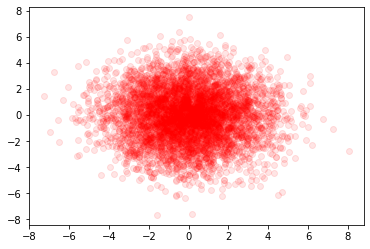

In [8]:
# def plot_blobs(n_classes)
plt.scatter(cal_set.X[cal_set.y==0][:,0], cal_set.X[cal_set.y==0][:,1], c='r', alpha=0.1)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

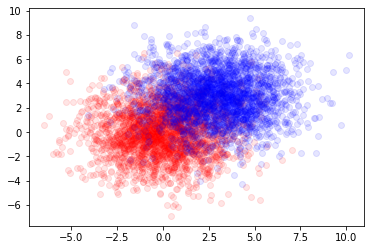

In [9]:
# def plot_blobs(n_classes)
plt.scatter(test_set.X[test_set.y==0][:,0], test_set.X[test_set.y==0][:,1], c='r', alpha=0.1)
plt.scatter(test_set.X[test_set.y==1][:,0], test_set.X[test_set.y==1][:,1], c='b', alpha=0.1)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

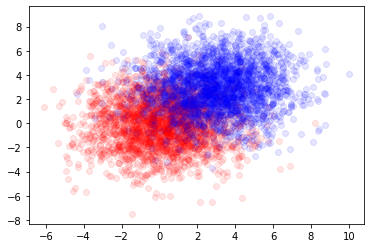

In [10]:
# def plot_blobs(n_classes)
plt.scatter(train_set.X[train_set.y==0][:,0], train_set.X[train_set.y==0][:,1], c='r', alpha=0.1)
plt.scatter(train_set.X[train_set.y==1][:,0], train_set.X[train_set.y==1][:,1], c='b', alpha=0.1)
plt.show


Starting repetition 1 of 50:

Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.15 train_acc: 20.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.11 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.59 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 4.12 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 9.23 train_acc: 30.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 1.55 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 1.12 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 6.76 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
val_loss = 0.59 val_acc = 84.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.03 train_a

C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)



Epoch 4 of 50, 80% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 4 of 50, 90% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 4 of 50, 100% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
val_loss = 0.46 val_acc = 82.00%
Snapshot saved at epoch 4.
Epoch 5 of 50, 10% 	 train_loss: 0.11 train_acc: 100.00% took: 0.01s
Epoch 5 of 50, 20% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 5 of 50, 30% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 5 of 50, 40% 	 train_loss: 0.47 train_acc: 90.00% took: 0.00s
Epoch 5 of 50, 50% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 5 of 50, 60% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 5 of 50, 70% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 5 of 50, 80% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 5 of 50, 90% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 5 of 50, 100% 	 train_loss: 0.11 train_acc: 100.00% took: 0.01s
val_loss = 0.48 val_acc = 82.00%
Snapshot saved a

Epoch 15 of 50, 80% 	 train_loss: 0.37 train_acc: 80.00% took: 0.02s
Epoch 15 of 50, 90% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
val_loss = 0.58 val_acc = 81.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.40 train_acc: 70.00% took: 0.01s
Epoch 16 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.58 val_acc = 81.00%
Snap

val_loss = 0.61 val_acc = 81.00%
Snapshot saved at epoch 31.
Epoch 32 of 50, 10% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 20% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 32 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 40% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 50% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 60% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 70% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 80% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.61 val_acc = 81.00%
Snapshot saved at epoch 32.
Epoch 33 of 50, 10% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 20% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 33 of 50, 30% 	 train_loss: 0.39 train_a

Epoch 43 of 50, 30% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 43 of 50, 40% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 50% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 60% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 70% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 80% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.79 val_acc = 80.00%
Snapshot saved at epoch 43.
Epoch 44 of 50, 10% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 20% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 44 of 50, 30% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 40% 	 train_loss: 0.49 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 50% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 60% 	 train_loss: 0.19 

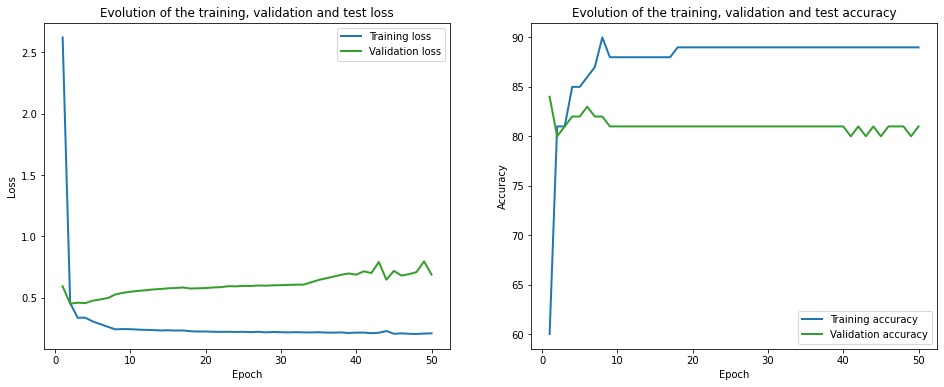

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 164.19it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1351.78it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.75 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.59 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.05 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.75 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.90 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
val_loss = 0.34 val_acc = 80.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.43 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.36 train_acc: 8

Epoch 13 of 50, 50% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.14 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.78 train_acc: 55.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
val_loss = 0.28 val_acc = 85.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.42 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.28 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.13 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.28 tr

Epoch 25 of 50, 80% 	 train_loss: 0.27 train_acc: 85.00% took: 0.02s
Epoch 25 of 50, 90% 	 train_loss: 0.80 train_acc: 50.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.19 train_acc: 95.00% took: 0.00s
val_loss = 0.32 val_acc = 85.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.39 train_acc: 65.00% took: 0.02s
Epoch 26 of 50, 20% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.15 train_acc: 95.00% took: 0.02s
Epoch 26 of 50, 50% 	 train_loss: 0.15 train_acc: 100.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.10 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.76 train_acc: 50.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.21 train_acc: 95.00% took: 0.00s
val_loss = 0.26 val_acc = 90.00%
Snapsh

Epoch 38 of 50, 60% 	 train_loss: 0.20 train_acc: 90.00% took: 0.02s
Epoch 38 of 50, 70% 	 train_loss: 0.09 train_acc: 100.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.26 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.75 train_acc: 55.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
val_loss = 0.24 val_acc = 95.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.40 train_acc: 65.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 30% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 40% 	 train_loss: 0.12 train_acc: 95.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.14 train_acc: 100.00% took: 0.01s
Epoch 39 of 50, 60% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.75

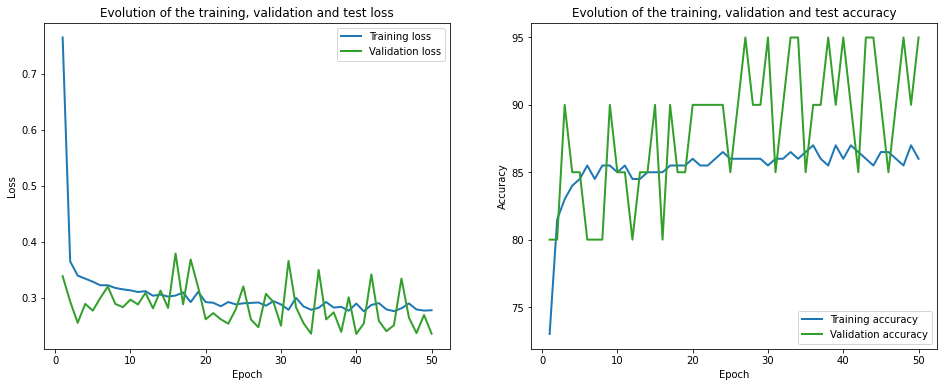

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.38it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1356.36it/s]

Finished computing p-values for 500 test points.

Starting repetition 2 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.73 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.52 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 10.43 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.47 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 7.81 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.28 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 13.36 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 6.64 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 5.69 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 5.21 train_acc: 70.00% took: 0.00s
val_loss = 0.76 val_acc = 42.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.71 train_acc: 30.00% took: 0.00s
Epoch 2

val_loss = 0.29 val_acc = 87.00%
Snapshot saved at epoch 11.
Epoch 12 of 50, 10% 	 train_loss: 0.81 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 20% 	 train_loss: 0.95 train_acc: 30.00% took: 0.00s
Epoch 12 of 50, 30% 	 train_loss: 0.59 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.30 train_acc: 70.00% took: 0.00s
val_loss = 0.31 val_acc = 85.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.76 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.77 train_acc: 50.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.59 train_acc:

Epoch 22 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
val_loss = 0.31 val_acc = 88.00%
Snapshot saved at epoch 22.
Epoch 23 of 50, 10% 	 train_loss: 0.77 train_acc: 70.00% took: 0.00s
Epoch 23 of 50, 20% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 23 of 50, 30% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 23 of 50, 40% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 23 of 50, 50% 	 train_loss: 0.41 train_acc: 60.00% took: 0.00s
Epoch 23 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 23 of 50, 70% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 23 of 50, 80% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 23 of 50, 90% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 23 of 50, 100% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 88.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.76 train_acc: 70.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.55 train_acc

Epoch 34 of 50, 40% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 34 of 50, 50% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 34 of 50, 60% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 34 of 50, 70% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 34 of 50, 80% 	 train_loss: 0.30 train_acc: 90.00% took: 0.02s
Epoch 34 of 50, 90% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 34 of 50, 100% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 86.00%
Snapshot saved at epoch 34.
Epoch 35 of 50, 10% 	 train_loss: 0.72 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 30% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 40% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 50% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.02s
Epoch 35 of 50, 70% 	 train_loss: 0.53 tr

Epoch 45 of 50, 50% 	 train_loss: 0.43 train_acc: 70.00% took: 0.02s
Epoch 45 of 50, 60% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 70% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 80% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 100% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
val_loss = 0.33 val_acc = 86.00%
Snapshot saved at epoch 45.
Epoch 46 of 50, 10% 	 train_loss: 0.69 train_acc: 70.00% took: 0.00s
Epoch 46 of 50, 20% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 46 of 50, 30% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 46 of 50, 40% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 46 of 50, 50% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 46 of 50, 60% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 46 of 50, 70% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 46 of 50, 80% 	 train_loss: 0.30 tr

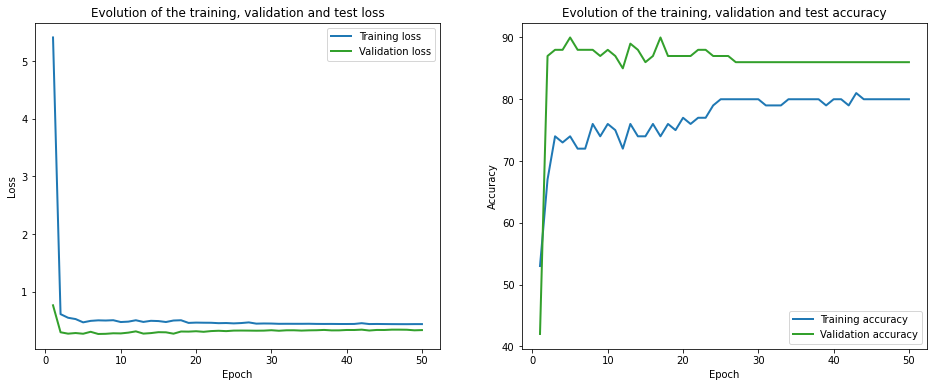

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.04it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1238.16it/s]
C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Finished computing p-values for 500 test points.
Training with CES data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.82 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.93 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.98 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.59 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.57 train_acc: 45.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.38 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
val_loss = 0.83 val_acc = 45.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 

Epoch 13 of 50, 60% 	 train_loss: 0.57 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.48 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
val_loss = 0.74 val_acc = 55.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.55 train_acc: 75.00% took: 0.02s
Epoch 14 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 60% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.47 train_acc: 75.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.31 tr

Epoch 26 of 50, 30% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.57 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
val_loss = 0.78 val_acc = 50.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.55 train_acc: 75.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.50 train_acc: 75.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.51 train_acc: 75.00% took: 0.02s
Epoch 27 of 50, 50% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.57 tr

val_loss = 0.76 val_acc = 50.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 30% 	 train_loss: 0.49 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 40% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 50% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.57 train_acc: 70.00% took: 0.01s
Epoch 39 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 80% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
val_loss = 0.78 val_acc = 50.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.55 train_acc: 75.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.49 train_acc:

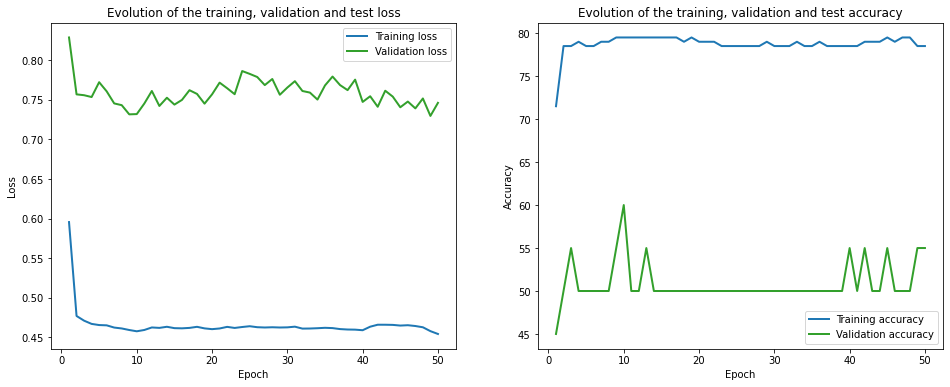

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.54it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1312.39it/s]

Finished computing p-values for 500 test points.

Starting repetition 3 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.75 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.60 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 2.70 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.94 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.10 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.28 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.41 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.89 train_acc: 80.00% took: 0.00s
val_loss = 0.55 val_acc = 72.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.50 train_acc: 60.00% took: 0.00s
Epoch 2 o

val_loss = 0.63 val_acc = 72.00%
Snapshot saved at epoch 11.
Epoch 12 of 50, 10% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 20% 	 train_loss: 0.53 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 30% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.88 train_acc: 40.00% took: 0.02s
Epoch 12 of 50, 50% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.73 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
val_loss = 0.65 val_acc = 70.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.44 train_acc:

Epoch 26 of 50, 30% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.83 train_acc: 40.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.60 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.68 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.53 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
val_loss = 0.61 val_acc = 71.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 27 of 50, 30% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.84 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.57 tr

Epoch 37 of 50, 30% 	 train_loss: 0.27 train_acc: 100.00% took: 0.02s
Epoch 37 of 50, 40% 	 train_loss: 0.78 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.32 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.53 train_acc: 90.00% took: 0.00s
val_loss = 0.63 val_acc = 72.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.27 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.79 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.67 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.52 

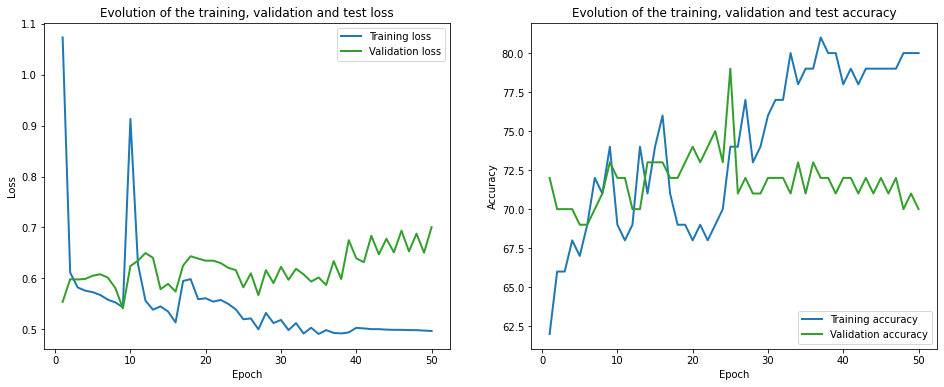

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.08it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1490.37it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 3.37 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.68 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.97 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.32 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.77 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 1.02 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.54 train_acc: 65.00% took: 0.01s
val_loss = 0.67 val_acc = 65.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.76 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.78 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.34 train_acc: 8

Epoch 14 of 50, 30% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.61 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.68 train_acc: 50.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.47 train_acc: 75.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.53 train_acc: 60.00% took: 0.01s
val_loss = 0.56 val_acc = 70.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.49 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.40 train_acc: 65.00% took: 0.01s
Epoch 15 of 50, 40% 	 train_loss: 0.28 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 50% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 60% 	 train_loss: 0.61 tr

Epoch 26 of 50, 10% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.56 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.60 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.26 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.46 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.58 train_acc: 65.00% took: 0.00s
val_loss = 0.65 val_acc = 65.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.37 train_acc: 75.00% took: 0.01s
Epoch 27 of 50, 30% 	 train_loss: 0.42 train_acc: 75.00% took: 0.01s
Epoch 27 of 50, 40% 	 train_loss: 0.26 tr

Epoch 37 of 50, 50% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.57 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.74 train_acc: 55.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.63 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.65 train_acc: 60.00% took: 0.00s
val_loss = 0.63 val_acc = 80.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.35 train_acc: 75.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.41 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.26 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.57 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.74 train_acc: 50.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.23 tr

Epoch 50 of 50, 30% 	 train_loss: 0.41 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.26 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.57 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.76 train_acc: 50.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.23 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.61 train_acc: 90.00% took: 0.02s
Epoch 50 of 50, 100% 	 train_loss: 0.67 train_acc: 55.00% took: 0.00s
val_loss = 0.66 val_acc = 80.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


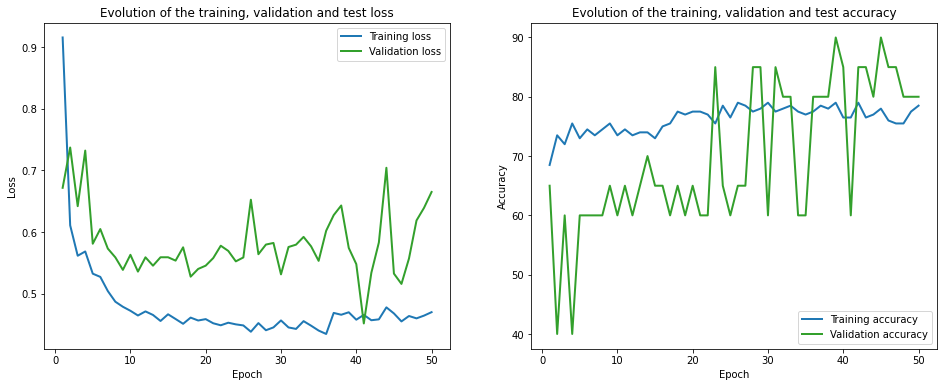

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.97it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1232.24it/s]

Finished computing p-values for 500 test points.

Starting repetition 4 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.89 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 4.74 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 2.35 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.66 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 1.07 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
val_loss = 0.40 val_acc = 83.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.65 train_acc: 5

Epoch 14 of 50, 90% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.51 train_acc: 60.00% took: 0.00s
val_loss = 0.38 val_acc = 83.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.74 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.74 train_acc: 40.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.71 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.48 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
val_loss = 0.39 val_acc = 83.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.25 train_ac

Epoch 26 of 50, 60% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.48 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.66 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
val_loss = 0.37 val_acc = 86.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.76 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.62 train_acc: 50.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.70 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.54 tr

Epoch 41 of 50, 100% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
val_loss = 0.44 val_acc = 84.00%
Snapshot saved at epoch 41.
Epoch 42 of 50, 10% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 20% 	 train_loss: 0.78 train_acc: 70.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.77 train_acc: 50.00% took: 0.00s
Epoch 42 of 50, 40% 	 train_loss: 0.60 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 50% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 60% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 70% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 80% 	 train_loss: 0.50 train_acc: 60.00% took: 0.00s
Epoch 42 of 50, 90% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 100% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
val_loss = 0.45 val_acc = 84.00%
Snapshot saved at epoch 42.
Epoch 43 of 50, 10% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 20% 	 train_loss: 0.82 train_acc

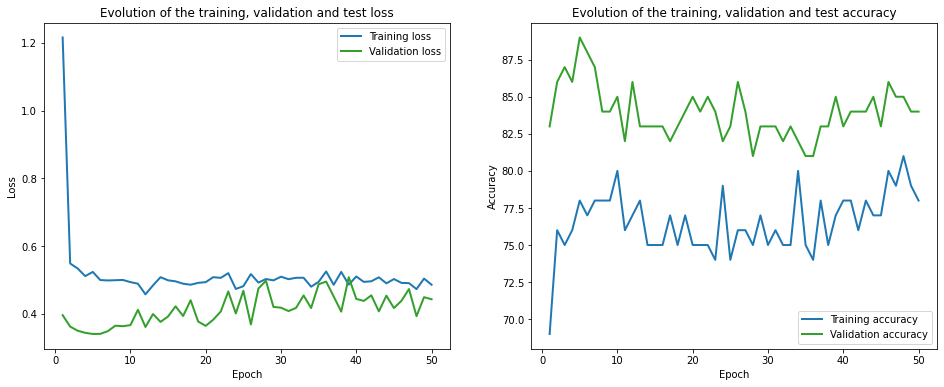

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.00it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1086.51it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.86 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.66 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.66 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.62 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.63 train_acc: 75.00% took: 0.00s
val_loss = 0.22 val_acc = 85.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.14 train_acc: 

Epoch 12 of 50, 10% 	 train_loss: 0.11 train_acc: 100.00% took: 0.01s
Epoch 12 of 50, 20% 	 train_loss: 0.71 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 30% 	 train_loss: 0.26 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.92 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.64 train_acc: 80.00% took: 0.01s
val_loss = 0.30 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.43 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.41 t

Epoch 25 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.21 train_acc: 95.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.53 train_acc: 80.00% took: 0.02s
val_loss = 0.37 val_acc = 80.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 20% 	 train_loss: 0.57 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.16 train_acc: 95.00% took: 0.02s
Epoch 26 of 50, 40% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.47 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.02s
Epoch 26 of 50, 80% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.52 

Epoch 37 of 50, 60% 	 train_loss: 0.49 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
val_loss = 0.31 val_acc = 85.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.09 train_acc: 100.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.14 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.52 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.32 t

val_loss = 0.25 val_acc = 90.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.10 train_acc: 100.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.14 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 50% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 90% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.53 train_acc: 80.00% took: 0.01s
val_loss = 0.26 val_acc = 90.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.48 train_acc: 75.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.14 train_ac

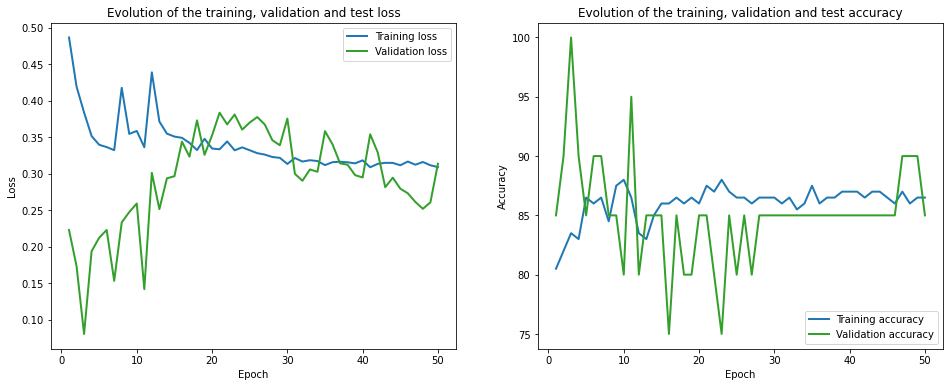

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 149.24it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1234.10it/s]

Finished computing p-values for 500 test points.

Starting repetition 5 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.70 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.86 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.26 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
val_loss = 0.40 val_acc = 83.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.69 train_acc: 50.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.23 train_acc

Epoch 12 of 50, 70% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.09 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.40 train_acc: 90.00% took: 0.00s
val_loss = 0.45 val_acc = 79.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.09 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 

val_loss = 0.43 val_acc = 84.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.51 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.08 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
val_loss = 0.43 val_acc = 84.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.51 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.07 train

Epoch 38 of 50, 70% 	 train_loss: 0.15 train_acc: 90.00% took: 0.02s
Epoch 38 of 50, 80% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
val_loss = 0.44 val_acc = 86.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss:

Epoch 50 of 50, 20% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
val_loss = 0.44 val_acc = 85.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


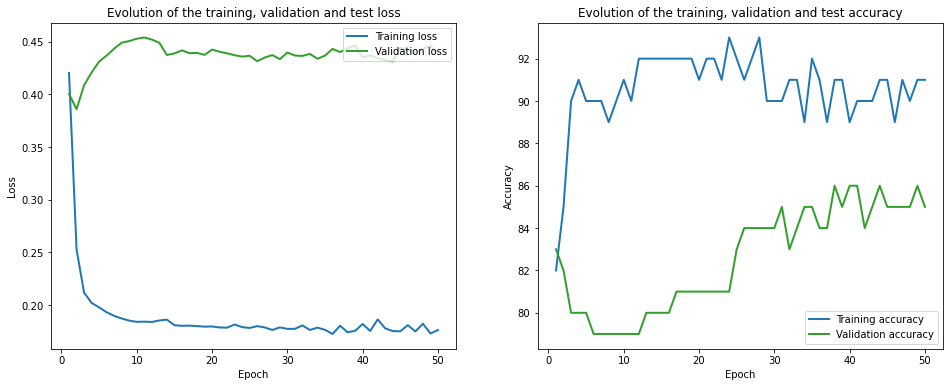

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.16it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1312.65it/s]
C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Finished computing p-values for 500 test points.
Training with CES data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 2.26 train_acc: 45.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.77 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.62 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 1.56 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.40 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 1.72 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.89 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.83 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.44 train_acc: 75.00% took: 0.01s
val_loss = 0.97 val_acc = 60.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.88 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 

Epoch 12 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.57 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.64 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.50 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
val_loss = 0.41 val_acc = 90.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.59 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.66 train_acc: 50.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.61 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.78 tr

Epoch 25 of 50, 30% 	 train_loss: 0.64 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.56 train_acc: 55.00% took: 0.01s
Epoch 25 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.58 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.36 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.62 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
val_loss = 0.28 val_acc = 90.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.67 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.56 train_acc: 55.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.35 tr

Epoch 36 of 50, 40% 	 train_loss: 0.61 train_acc: 50.00% took: 0.01s
Epoch 36 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 60% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 70% 	 train_loss: 0.65 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 80% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 36 of 50, 90% 	 train_loss: 0.63 train_acc: 75.00% took: 0.00s
Epoch 36 of 50, 100% 	 train_loss: 0.56 train_acc: 70.00% took: 0.01s
val_loss = 0.33 val_acc = 90.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 20% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.69 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.61 train_acc: 50.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.64 tr

Epoch 47 of 50, 100% 	 train_loss: 0.61 train_acc: 70.00% took: 0.01s
val_loss = 0.32 val_acc = 90.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 48 of 50, 20% 	 train_loss: 0.23 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 30% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 40% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 48 of 50, 60% 	 train_loss: 0.43 train_acc: 75.00% took: 0.00s
Epoch 48 of 50, 70% 	 train_loss: 0.67 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 80% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 48 of 50, 90% 	 train_loss: 0.83 train_acc: 85.00% took: 0.02s
Epoch 48 of 50, 100% 	 train_loss: 0.60 train_acc: 70.00% took: 0.01s
val_loss = 0.29 val_acc = 90.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.55 train_acc: 75.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.32 train_acc

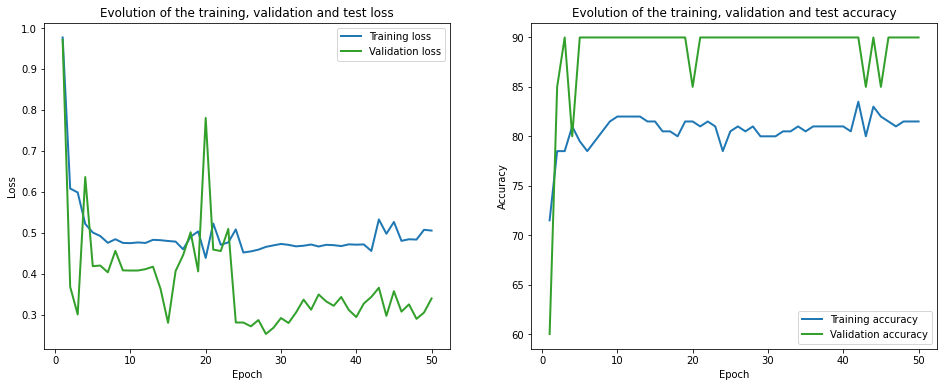

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.57it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1030.42it/s]

Finished computing p-values for 500 test points.

Starting repetition 6 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.06 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.54 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.09 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.33 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.61 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.74 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.41 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
val_loss = 0.54 val_acc = 72.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.65 train_acc: 50.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.82 train_ac

Epoch 12 of 50, 50% 	 train_loss: 0.76 train_acc: 60.00% took: 0.02s
Epoch 12 of 50, 60% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.61 train_acc: 70.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.62 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
val_loss = 0.52 val_acc = 74.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.78 train_acc: 60.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.2

Epoch 23 of 50, 100% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
val_loss = 0.64 val_acc = 81.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 1.68 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 24 of 50, 40% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.77 train_acc: 70.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.93 train_acc: 60.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.64 train_acc: 70.00% took: 0.02s
Epoch 24 of 50, 100% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
val_loss = 0.53 val_acc = 76.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.10 train

Epoch 34 of 50, 90% 	 train_loss: 0.60 train_acc: 60.00% took: 0.00s
Epoch 34 of 50, 100% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
val_loss = 0.58 val_acc = 76.00%
Snapshot saved at epoch 34.
Epoch 35 of 50, 10% 	 train_loss: 0.72 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 20% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 35 of 50, 30% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 40% 	 train_loss: 0.64 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 50% 	 train_loss: 0.94 train_acc: 60.00% took: 0.00s
Epoch 35 of 50, 60% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 35 of 50, 70% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 35 of 50, 80% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 35 of 50, 90% 	 train_loss: 0.61 train_acc: 60.00% took: 0.00s
Epoch 35 of 50, 100% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
val_loss = 0.50 val_acc = 76.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.56 trai

Epoch 49 of 50, 20% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 49 of 50, 30% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 50% 	 train_loss: 0.70 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.76 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 90% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
val_loss = 0.51 val_acc = 74.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.8

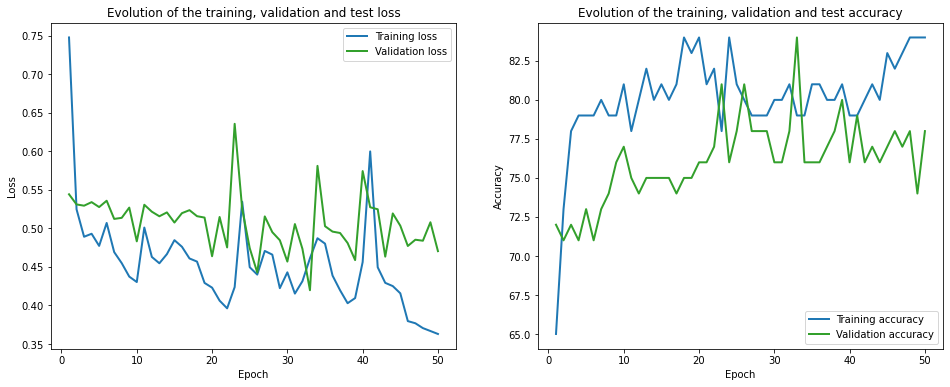

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.50it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1306.04it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.65 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.70 train_acc: 55.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.75 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.50 train_acc: 65.00% took: 0.00s
val_loss = 0.18 val_acc = 95.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.71 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.44 train_acc: 8

Epoch 13 of 50, 20% 	 train_loss: 0.76 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.42 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.40 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.65 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.37 train_acc: 65.00% took: 0.00s
val_loss = 0.11 val_acc = 90.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.75 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.45 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.21 train_acc: 95.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.50 tr

Epoch 24 of 50, 90% 	 train_loss: 0.57 train_acc: 75.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.38 train_acc: 65.00% took: 0.01s
val_loss = 0.11 val_acc = 90.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.73 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.45 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 50% 	 train_loss: 0.48 train_acc: 60.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.37 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.66 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.35 train_acc: 70.00% took: 0.01s
val_loss = 0.12 val_acc = 90.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.29 train_acc

Epoch 37 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.34 train_acc: 75.00% took: 0.00s
val_loss = 0.12 val_acc = 95.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.24 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.69 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.50 train_acc: 65.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.64 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.57 train_acc: 70.00% took: 0.01s
Epoch 38 of 50, 100% 	 train_loss: 0.35 train_acc: 75.00% took: 0.01s
val_loss = 0.12 val_acc = 95.00%
Snapsho

Epoch 50 of 50, 10% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.67 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 30% 	 train_loss: 0.52 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.21 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.49 train_acc: 65.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.62 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.55 train_acc: 60.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.31 train_acc: 75.00% took: 0.00s
val_loss = 0.16 val_acc = 90.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


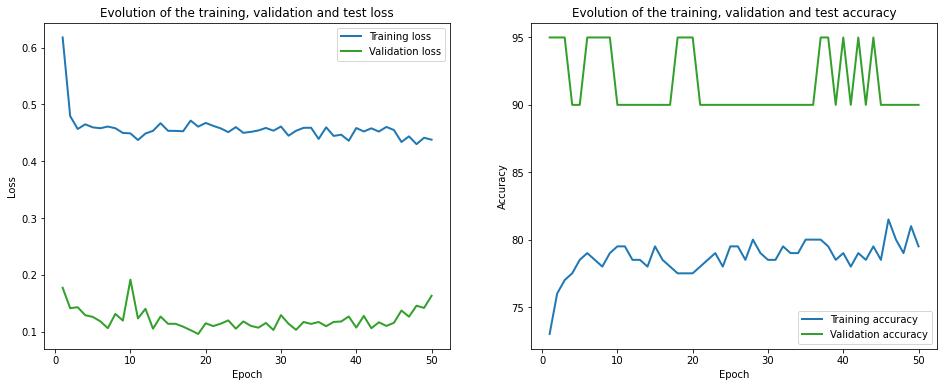

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.40it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1229.22it/s]

Finished computing p-values for 500 test points.

Starting repetition 7 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.84 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 2.70 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.60 train_acc: 70.00% took: 0.02s
Epoch 1 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.13 train_acc: 100.00% took: 0.02s
Epoch 1 of 50, 90% 	 train_loss: 1.01 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
val_loss = 0.56 val_acc = 64.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.96 train_acc: 30.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.62 train_acc: 70.00% took: 0.00s
Epoch 2

Epoch 12 of 50, 50% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.86 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
val_loss = 0.36 val_acc = 87.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.40 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.

Epoch 23 of 50, 80% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 23 of 50, 90% 	 train_loss: 0.71 train_acc: 60.00% took: 0.00s
Epoch 23 of 50, 100% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
val_loss = 0.34 val_acc = 87.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.43 train_acc: 60.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 40% 	 train_loss: 0.32 train_acc: 70.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.56 train_acc: 60.00% took: 0.00s
Epoch 24 of 50, 100% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
val_loss = 0.35 val_acc = 87.00%
S

Epoch 35 of 50, 10% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 20% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 30% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 40% 	 train_loss: 0.23 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 50% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 60% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 70% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 35 of 50, 80% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 35 of 50, 90% 	 train_loss: 0.41 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.44 val_acc = 77.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 36 of 50, 20% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 30% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 36 of 50, 40% 	 train_loss: 0.34 

Epoch 50 of 50, 70% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.01 train_acc: 100.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.40 train_acc: 60.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
val_loss = 0.44 val_acc = 81.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


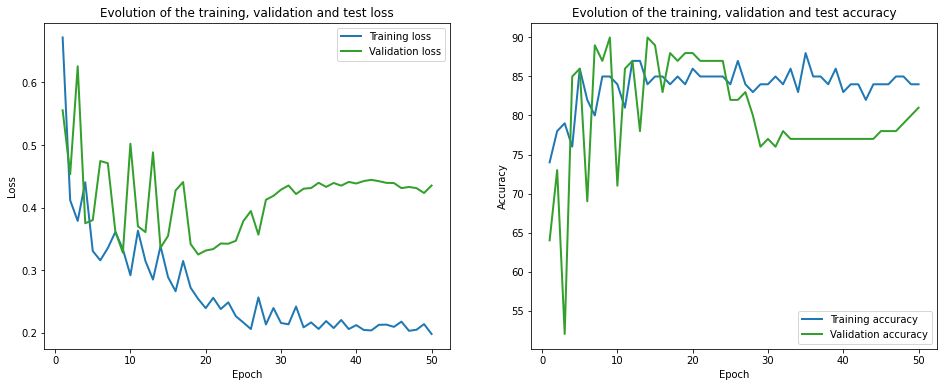

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.93it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1259.48it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.74 train_acc: 70.00% took: 0.02s
Epoch 1 of 50, 20% 	 train_loss: 0.55 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.45 train_acc: 75.00% took: 0.02s
Epoch 1 of 50, 40% 	 train_loss: 0.58 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.62 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.16 train_acc: 90.00% took: 0.01s
val_loss = 0.47 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.59 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.56 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.57 train_acc: 7

Epoch 12 of 50, 60% 	 train_loss: 0.30 train_acc: 85.00% took: 0.02s
Epoch 12 of 50, 70% 	 train_loss: 0.19 train_acc: 95.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.15 train_acc: 95.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.21 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.10 train_acc: 95.00% took: 0.01s
val_loss = 0.49 val_acc = 85.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.57 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.59 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.45 train_acc: 65.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.17 train_acc: 95.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.20 tr

Epoch 26 of 50, 20% 	 train_loss: 0.59 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.45 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.12 train_acc: 90.00% took: 0.01s
val_loss = 0.49 val_acc = 85.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.58 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.62 train_acc: 75.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 27 of 50, 40% 	 train_loss: 0.47 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 50% 	 train_loss: 0.46 tr

Epoch 37 of 50, 70% 	 train_loss: 0.20 train_acc: 95.00% took: 0.02s
Epoch 37 of 50, 80% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
val_loss = 0.50 val_acc = 85.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.59 train_acc: 90.00% took: 0.02s
Epoch 38 of 50, 20% 	 train_loss: 0.54 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.36 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.50 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.45 train_acc: 70.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.30 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.11 t

Epoch 49 of 50, 50% 	 train_loss: 0.45 train_acc: 70.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.20 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.12 train_acc: 90.00% took: 0.00s
val_loss = 0.47 val_acc = 85.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.51 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.56 train_acc: 70.00% took: 0.01s
Epoch 50 of 50, 30% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.45 train_acc: 70.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.30 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.19 tr

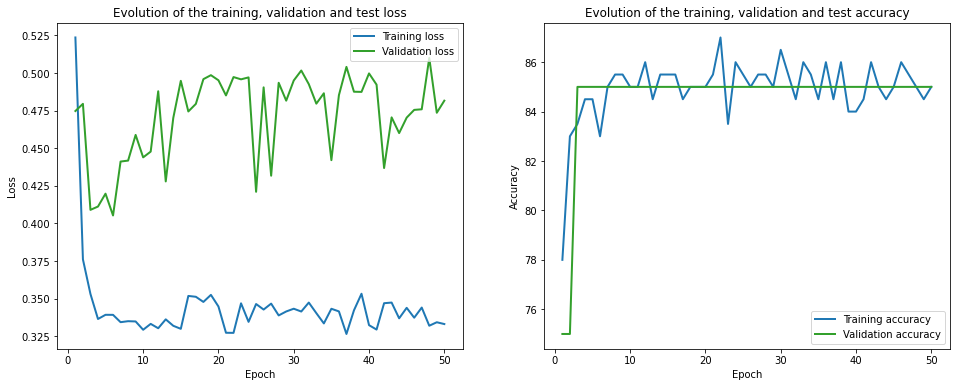

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.31it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1089.16it/s]

Finished computing p-values for 500 test points.

Starting repetition 8 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.65 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.83 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 2.40 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 2.32 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.13 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.52 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.74 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
val_loss = 0.43 val_acc = 80.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.24 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.50 train_acc: 

Epoch 15 of 50, 80% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
val_loss = 0.37 val_acc = 86.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.38 train_acc: 90.00% took: 0.01s
Epoch 16 of 50, 60% 	 train_loss: 0.53 train_acc: 80.00% took: 0.01s
Epoch 16 of 50, 70% 	 train_loss: 0.86 train_acc: 50.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
val_loss = 0.52 val_acc = 70.00%
Snapsho

Epoch 32 of 50, 40% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 50% 	 train_loss: 0.44 train_acc: 90.00% took: 0.01s
Epoch 32 of 50, 60% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 32 of 50, 70% 	 train_loss: 0.74 train_acc: 60.00% took: 0.00s
Epoch 32 of 50, 80% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 32 of 50, 90% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 100% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
val_loss = 0.40 val_acc = 82.00%
Snapshot saved at epoch 32.
Epoch 33 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 33 of 50, 20% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 33 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 40% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 50% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 60% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 33 of 50, 70% 	 train_loss: 0.73 tr

Epoch 43 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 40% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 50% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 60% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 70% 	 train_loss: 0.70 train_acc: 60.00% took: 0.00s
Epoch 43 of 50, 80% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 90% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 100% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
val_loss = 0.39 val_acc = 82.00%
Snapshot saved at epoch 43.
Epoch 44 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 20% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 44 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 40% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 50% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 60% 	 train_loss: 0.47 tr

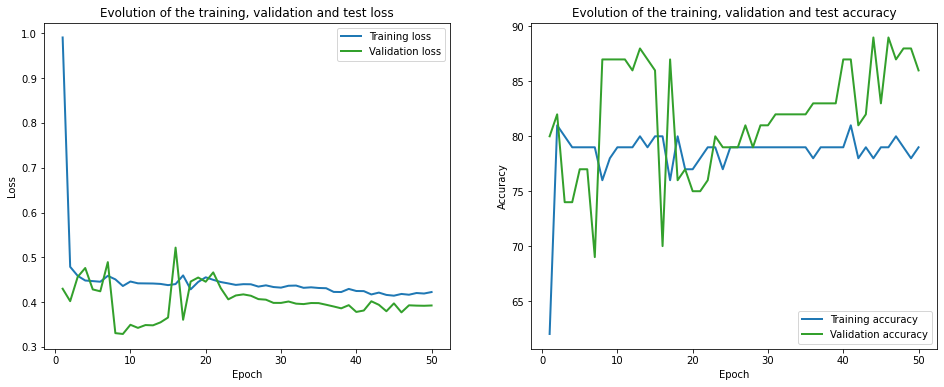

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 153.65it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1188.54it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.68 train_acc: 55.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.98 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.75 train_acc: 55.00% took: 0.02s
Epoch 1 of 50, 40% 	 train_loss: 1.26 train_acc: 35.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.25 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.63 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
val_loss = 0.46 val_acc = 80.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.59 train_acc: 6

Epoch 13 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.45 train_acc: 60.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.65 train_acc: 55.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.28 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.36 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.58 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
val_loss = 0.43 val_acc = 80.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.25 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.47 train_acc: 60.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.67 train_acc: 55.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.38 tr

Epoch 26 of 50, 70% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.39 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.63 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.34 train_acc: 80.00% took: 0.01s
val_loss = 0.54 val_acc = 80.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 30% 	 train_loss: 0.43 train_acc: 60.00% took: 0.01s
Epoch 27 of 50, 40% 	 train_loss: 0.60 train_acc: 60.00% took: 0.01s
Epoch 27 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 60% 	 train_loss: 0.24 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 70% 	 train_loss: 0.29 train_acc: 80.00% took: 0.01s
Epoch 27 of 50, 80% 	 train_loss: 0.37 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 90% 	 train_loss: 0.62 train_acc: 75.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.33 t

Epoch 39 of 50, 10% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 30% 	 train_loss: 0.40 train_acc: 60.00% took: 0.01s
Epoch 39 of 50, 40% 	 train_loss: 0.59 train_acc: 65.00% took: 0.01s
Epoch 39 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 60% 	 train_loss: 0.24 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 70% 	 train_loss: 0.28 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 80% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 90% 	 train_loss: 0.60 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 100% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
val_loss = 0.60 val_acc = 80.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 40 of 50, 30% 	 train_loss: 0.37 train_acc: 65.00% took: 0.01s
Epoch 40 of 50, 40% 	 train_loss: 0.61 tr

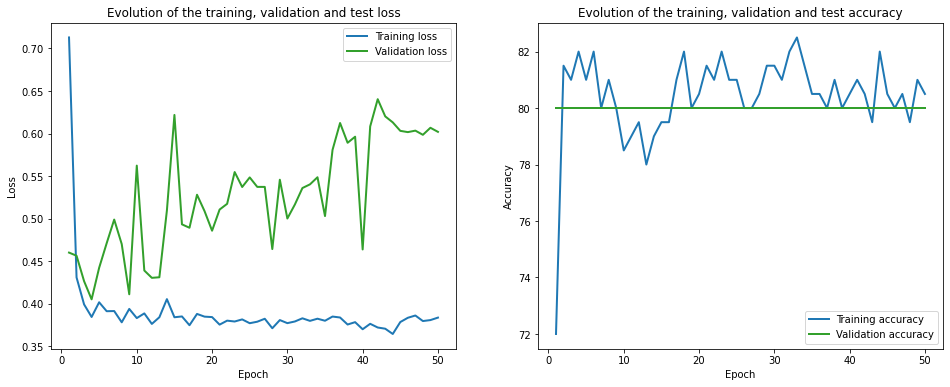

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 173.89it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1106.91it/s]

Finished computing p-values for 500 test points.

Starting repetition 9 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.95 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 6.17 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 2.87 train_acc: 0.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.00 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.44 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 1.24 train_acc: 30.00% took: 0.00s
val_loss = 0.52 val_acc = 76.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.71 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.71 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.51 train_acc: 

Epoch 13 of 50, 90% 	 train_loss: 0.43 train_acc: 80.00% took: 0.02s
Epoch 13 of 50, 100% 	 train_loss: 1.19 train_acc: 30.00% took: 0.00s
val_loss = 0.42 val_acc = 84.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 1.16 train_acc: 40.00% took: 0.00s
val_loss = 0.42 val_acc = 85.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.65 train_a

Epoch 29 of 50, 60% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 29 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 29 of 50, 80% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 29 of 50, 90% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 100% 	 train_loss: 1.22 train_acc: 40.00% took: 0.00s
val_loss = 0.44 val_acc = 85.00%
Snapshot saved at epoch 29.
Epoch 30 of 50, 10% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 20% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 30% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 50% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 60% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 30 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 80% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 90% 	 train_loss: 0.4

Epoch 44 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 44 of 50, 80% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 44 of 50, 90% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 100% 	 train_loss: 1.22 train_acc: 30.00% took: 0.00s
val_loss = 0.46 val_acc = 82.00%
Snapshot saved at epoch 44.
Epoch 45 of 50, 10% 	 train_loss: 0.67 train_acc: 70.00% took: 0.00s
Epoch 45 of 50, 20% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 45 of 50, 30% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 50% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 60% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 45 of 50, 80% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 90% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 100% 	 train_loss: 1.2

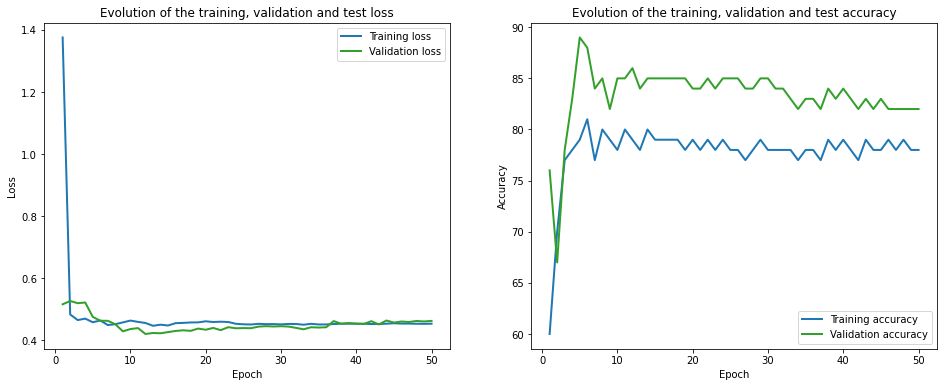

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.58it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1189.90it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.06 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.05 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.84 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.23 train_acc: 95.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.78 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.62 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.65 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.30 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.13 train_acc: 90.00% took: 0.01s
val_loss = 0.64 val_acc = 85.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.57 train_acc: 65.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.69 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.57 train_acc: 6

Epoch 15 of 50, 10% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 20% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.39 train_acc: 75.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.64 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.24 train_acc: 85.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.48 train_acc: 75.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.76 val_acc = 85.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 16 of 50, 30% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 16 of 50, 40% 	 train_loss: 0.19 

Epoch 27 of 50, 80% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.17 train_acc: 95.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
val_loss = 0.77 val_acc = 85.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.38 train_acc: 85.00% took: 0.02s
Epoch 28 of 50, 60% 	 train_loss: 0.58 train_acc: 75.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.24 train_acc: 85.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 28 of 50, 90% 	 train_loss: 0.17 train_acc: 95.00% took: 0.00s
Epoch 28 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.75 val_acc = 85.00%
Snaps

Epoch 41 of 50, 90% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
Epoch 41 of 50, 100% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
val_loss = 0.82 val_acc = 85.00%
Snapshot saved at epoch 41.
Epoch 42 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 20% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 40% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 50% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 60% 	 train_loss: 0.59 train_acc: 75.00% took: 0.00s
Epoch 42 of 50, 70% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 42 of 50, 80% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 42 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 100% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
val_loss = 0.77 val_acc = 90.00%
Snapshot saved at epoch 42.
Epoch 43 of 50, 10% 	 train_loss: 0.32 train_a

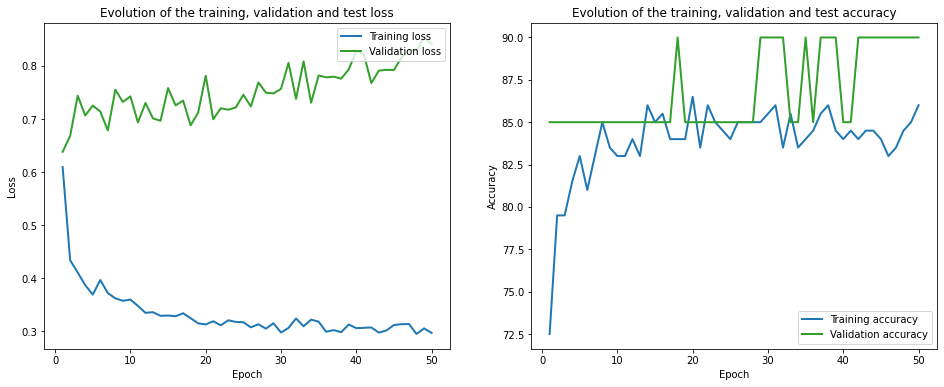

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.77it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1046.41it/s]

Finished computing p-values for 500 test points.

Starting repetition 10 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.82 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 3.62 train_acc: 50.00% took: 0.02s
Epoch 1 of 50, 30% 	 train_loss: 0.51 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.92 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.20 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.67 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.36 train_acc: 70.00% took: 0.00s
val_loss = 0.33 val_acc = 87.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.74 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.43 train_acc: 9

Epoch 15 of 50, 40% 	 train_loss: 0.52 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 90% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
val_loss = 0.43 val_acc = 87.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.73 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.68 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.52 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.

Epoch 26 of 50, 70% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
val_loss = 0.44 val_acc = 90.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.65 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.68 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.29

Epoch 38 of 50, 40% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
val_loss = 0.49 val_acc = 90.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.61 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0

Epoch 50 of 50, 50% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
val_loss = 0.57 val_acc = 90.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


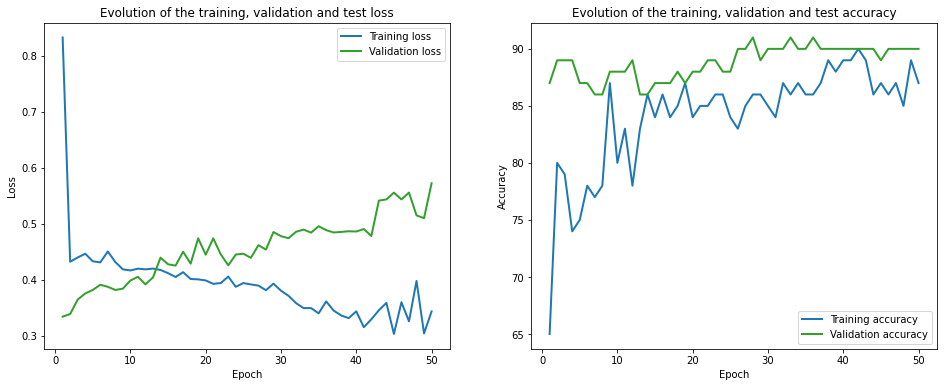

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 143.25it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1047.39it/s]
C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Finished computing p-values for 500 test points.
Training with CES data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.58 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 2.18 train_acc: 30.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.64 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.49 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.42 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.50 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.98 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.72 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.40 train_acc: 75.00% took: 0.02s
val_loss = 0.25 val_acc = 85.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 

Epoch 12 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.02s
Epoch 12 of 50, 70% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.60 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
val_loss = 0.26 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.60 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 1.54 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.81 train_acc: 65.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.41 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.56 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.62 tr

Epoch 25 of 50, 70% 	 train_loss: 0.43 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.52 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
val_loss = 0.21 val_acc = 80.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.58 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.92 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.64 train_acc: 65.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.31 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.57 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.62 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.30 t

Epoch 37 of 50, 80% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.61 train_acc: 70.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
val_loss = 0.19 val_acc = 90.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.87 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.66 train_acc: 65.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.30 train_acc: 95.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.63 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
val_loss = 0.20 val_acc = 90.00%
Snapsho

Epoch 50 of 50, 80% 	 train_loss: 0.58 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.64 train_acc: 65.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
val_loss = 0.28 val_acc = 75.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


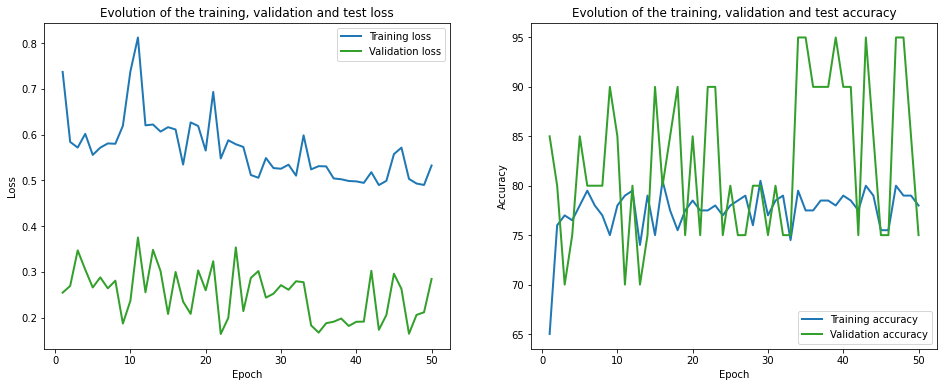

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 110.06it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1046.02it/s]

Finished computing p-values for 500 test points.

Starting repetition 11 of 50:



Training with standard data splitting...


C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.77 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 4.89 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.88 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.71 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.41 train_acc: 90.00% took: 0.00s
val_loss = 0.49 val_acc = 73.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.64 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.50 train_acc: 8

val_loss = 0.46 val_acc = 77.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.65 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.43 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.69 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
val_loss = 0.46 val_acc = 77.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.65 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.43 train_acc

val_loss = 0.48 val_acc = 78.00%
Snapshot saved at epoch 28.
Epoch 29 of 50, 10% 	 train_loss: 0.66 train_acc: 60.00% took: 0.00s
Epoch 29 of 50, 20% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 29 of 50, 30% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 50% 	 train_loss: 0.33 train_acc: 70.00% took: 0.00s
Epoch 29 of 50, 60% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 70% 	 train_loss: 0.76 train_acc: 60.00% took: 0.01s
Epoch 29 of 50, 80% 	 train_loss: 0.57 train_acc: 40.00% took: 0.00s
Epoch 29 of 50, 90% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 29 of 50, 100% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
val_loss = 0.46 val_acc = 77.00%
Snapshot saved at epoch 29.
Epoch 30 of 50, 10% 	 train_loss: 0.58 train_acc: 60.00% took: 0.00s
Epoch 30 of 50, 20% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 30% 	 train_loss: 0.36 train_acc

Epoch 43 of 50, 50% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 60% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 70% 	 train_loss: 0.73 train_acc: 60.00% took: 0.00s
Epoch 43 of 50, 80% 	 train_loss: 0.52 train_acc: 60.00% took: 0.00s
Epoch 43 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 100% 	 train_loss: 0.29 train_acc: 70.00% took: 0.00s
val_loss = 0.48 val_acc = 80.00%
Snapshot saved at epoch 43.
Epoch 44 of 50, 10% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 44 of 50, 20% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 30% 	 train_loss: 0.37 train_acc: 70.00% took: 0.00s
Epoch 44 of 50, 40% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 50% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 44 of 50, 60% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 70% 	 train_loss: 0.73 train_acc: 60.00% took: 0.00s
Epoch 44 of 50, 80% 	 train_loss: 0.48 t

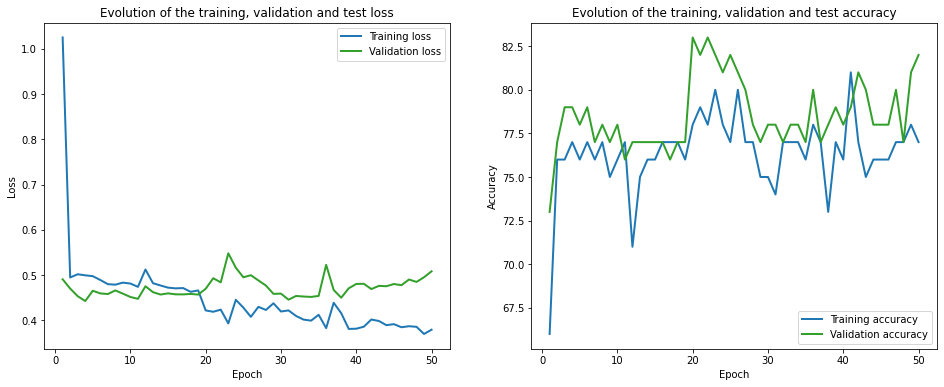

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 123.97it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1245.83it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.40 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.43 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.78 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 1.08 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.67 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.32 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.87 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.59 train_acc: 85.00% took: 0.00s
val_loss = 0.24 val_acc = 95.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.02s
Epoch 2 of 50, 30% 	 train_loss: 0.54 train_acc: 

Epoch 13 of 50, 40% 	 train_loss: 0.33 train_acc: 80.00% took: 0.02s
Epoch 13 of 50, 50% 	 train_loss: 0.06 train_acc: 95.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.56 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.28 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.58 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
val_loss = 0.23 val_acc = 85.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.27 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.05 train_acc: 95.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.65 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.25 t

val_loss = 0.23 val_acc = 85.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.48 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.25 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.61 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.22 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.30 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
val_loss = 0.24 val_acc = 85.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.48 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.37 train_a

Epoch 37 of 50, 30% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 50% 	 train_loss: 0.08 train_acc: 95.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.58 train_acc: 65.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
val_loss = 0.25 val_acc = 85.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.05 train_acc: 100.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.64 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.07 train_acc: 95.00% took: 0.02s
Epoch 38 of 50, 60% 	 train_loss: 0.70 t

Epoch 48 of 50, 50% 	 train_loss: 0.08 train_acc: 95.00% took: 0.00s
Epoch 48 of 50, 60% 	 train_loss: 0.61 train_acc: 65.00% took: 0.00s
Epoch 48 of 50, 70% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 48 of 50, 90% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 100% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
val_loss = 0.23 val_acc = 85.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.08 train_acc: 100.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.64 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 30% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 40% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.08 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.63 train_acc: 95.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.28 t

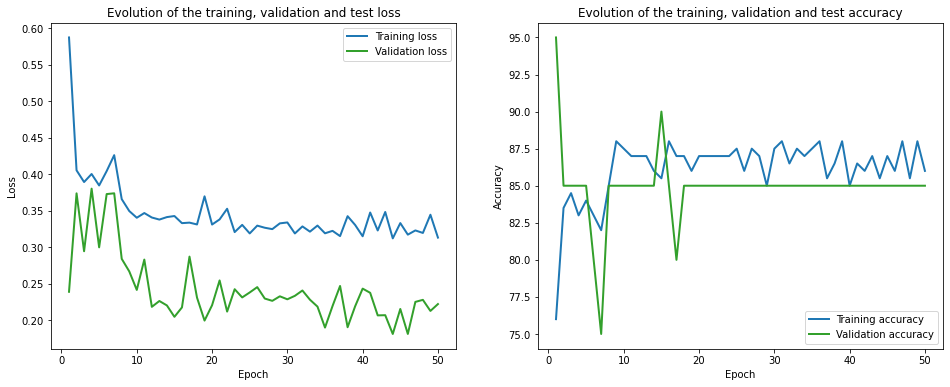

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.25it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1090.42it/s]

Finished computing p-values for 500 test points.

Starting repetition 12 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.98 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.93 train_acc: 30.00% took: 0.02s
Epoch 1 of 50, 50% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.58 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.21 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.37 train_acc: 70.00% took: 0.02s
Epoch 1 of 50, 100% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
val_loss = 1.02 val_acc = 43.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.98 train_acc: 50.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.28 train_acc: 

Epoch 15 of 50, 60% 	 train_loss: 0.74 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
val_loss = 1.34 val_acc = 56.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.40 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.67 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.15 

Epoch 27 of 50, 40% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.67 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.19 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
val_loss = 1.16 val_acc = 66.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.36 train_acc: 70.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.65 train_acc: 70.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.1

Epoch 41 of 50, 10% 	 train_loss: 0.43 train_acc: 60.00% took: 0.00s
Epoch 41 of 50, 20% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.22 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 70% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 80% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 90% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 100% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
val_loss = 0.89 val_acc = 72.00%
Snapshot saved at epoch 41.
Epoch 42 of 50, 10% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 20% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 42 of 50, 40% 	 train_loss: 0

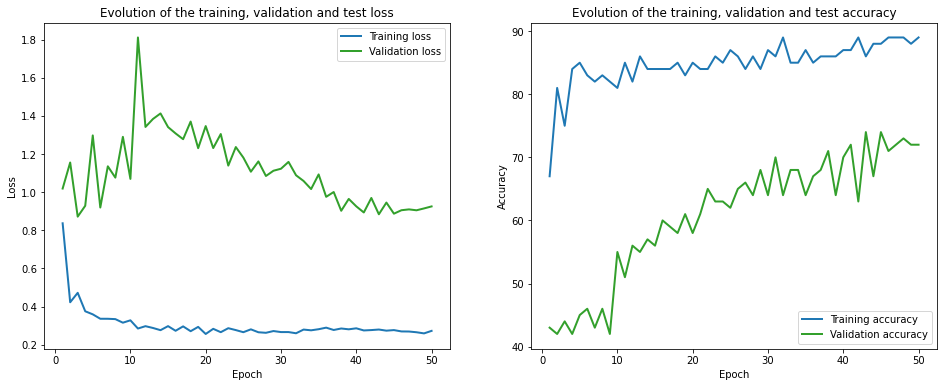

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 148.80it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1251.95it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.53 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.42 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 1.19 train_acc: 85.00% took: 0.00s
val_loss = 0.07 val_acc = 100.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.68 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.38 train_acc: 

val_loss = 0.48 val_acc = 60.00%
Snapshot saved at epoch 11.
Epoch 12 of 50, 10% 	 train_loss: 0.43 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 20% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 30% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 40% 	 train_loss: 0.59 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 50% 	 train_loss: 0.51 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.55 train_acc: 75.00% took: 0.01s
val_loss = 0.41 val_acc = 70.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.32 train_acc:

Epoch 24 of 50, 60% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 90% 	 train_loss: 0.52 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.56 train_acc: 75.00% took: 0.01s
val_loss = 0.55 val_acc = 60.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.41 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 30% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.59 train_acc: 90.00% took: 0.02s
Epoch 25 of 50, 50% 	 train_loss: 0.47 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 60% 	 train_loss: 0.30 train_acc: 90.00% took: 0.02s
Epoch 25 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.53 tr

Epoch 38 of 50, 40% 	 train_loss: 0.64 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.47 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.54 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 100% 	 train_loss: 0.59 train_acc: 75.00% took: 0.01s
val_loss = 0.51 val_acc = 60.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.39 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.63 train_acc: 80.00% took: 0.02s
Epoch 39 of 50, 50% 	 train_loss: 0.47 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 60% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 70% 	 train_loss: 0.26 tr

Epoch 50 of 50, 30% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.63 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.47 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.55 train_acc: 95.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.58 train_acc: 75.00% took: 0.00s
val_loss = 0.51 val_acc = 60.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


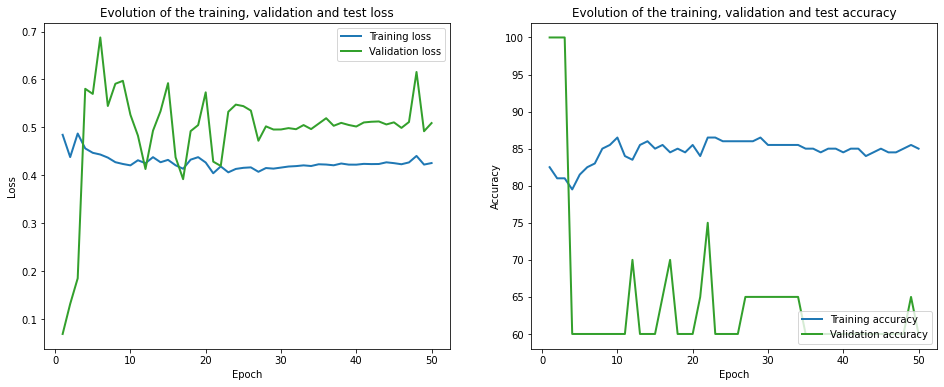

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 121.37it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 762.45it/s]

Finished computing p-values for 500 test points.

Starting repetition 13 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.70 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.37 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.79 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.64 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.08 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.85 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.86 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.73 train_acc: 50.00% took: 0.00s
val_loss = 0.53 val_acc = 73.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.55 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.48 train_acc: 9

Epoch 12 of 50, 80% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.77 train_acc: 50.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
val_loss = 0.72 val_acc = 70.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.51 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.67 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.49 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.76 train_acc: 50.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.24 train_acc: 100.00% took: 0.00s
val_loss = 0.71 val_acc = 69.00%
Snaps

Epoch 27 of 50, 70% 	 train_loss: 0.51 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 80% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.70 train_acc: 50.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
val_loss = 0.59 val_acc = 79.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.61 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.52 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 90% 	 train_loss: 0.70 train_acc: 50.00% took: 0.00s
Epoch 28 of 50, 100% 	 train_loss: 0.19 

Epoch 38 of 50, 90% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
val_loss = 0.58 val_acc = 81.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.61 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.65 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.52 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.68 train_acc: 60.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
val_loss = 0.60 val_acc = 79.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.47 train_a

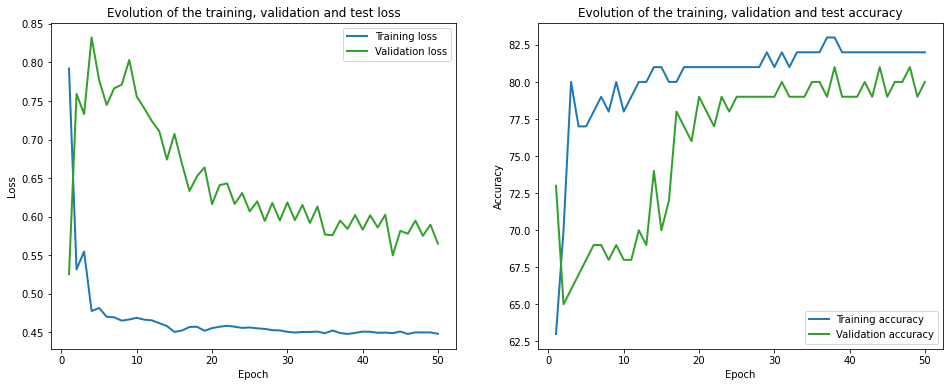

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.65it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 900.14it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.28 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.64 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.33 train_acc: 95.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.35 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.78 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.68 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
val_loss = 0.90 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 1.17 train_acc: 75.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.87 train_acc: 40.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.41 train_acc: 8

val_loss = 0.36 val_acc = 80.00%
Snapshot saved at epoch 11.
Epoch 12 of 50, 10% 	 train_loss: 0.58 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 20% 	 train_loss: 0.32 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 30% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 50% 	 train_loss: 0.34 train_acc: 95.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.47 train_acc: 80.00% took: 0.02s
Epoch 12 of 50, 80% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.24 train_acc: 95.00% took: 0.00s
val_loss = 0.38 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.60 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.32 train_acc: 90.00% took: 0.02s
Epoch 13 of 50, 30% 	 train_loss: 0.42 train_acc:

Epoch 23 of 50, 50% 	 train_loss: 0.32 train_acc: 95.00% took: 0.01s
Epoch 23 of 50, 60% 	 train_loss: 0.38 train_acc: 90.00% took: 0.01s
Epoch 23 of 50, 70% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 23 of 50, 80% 	 train_loss: 0.65 train_acc: 85.00% took: 0.01s
Epoch 23 of 50, 90% 	 train_loss: 0.35 train_acc: 90.00% took: 0.01s
Epoch 23 of 50, 100% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
val_loss = 0.38 val_acc = 80.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.44 train_acc: 90.00% took: 0.02s
Epoch 24 of 50, 40% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.33 train_acc: 95.00% took: 0.02s
Epoch 24 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.53 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.69 tr

Epoch 35 of 50, 30% 	 train_loss: 0.46 train_acc: 90.00% took: 0.01s
Epoch 35 of 50, 40% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 35 of 50, 50% 	 train_loss: 0.31 train_acc: 95.00% took: 0.01s
Epoch 35 of 50, 60% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 70% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 80% 	 train_loss: 0.68 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 90% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 100% 	 train_loss: 0.28 train_acc: 95.00% took: 0.01s
val_loss = 0.42 val_acc = 80.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 36 of 50, 20% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 36 of 50, 30% 	 train_loss: 0.43 train_acc: 90.00% took: 0.02s
Epoch 36 of 50, 40% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 50% 	 train_loss: 0.33 train_acc: 95.00% took: 0.01s
Epoch 36 of 50, 60% 	 train_loss: 0.41 tr

Epoch 46 of 50, 90% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 46 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
val_loss = 0.45 val_acc = 80.00%
Snapshot saved at epoch 46.
Epoch 47 of 50, 10% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 47 of 50, 20% 	 train_loss: 0.32 train_acc: 90.00% took: 0.02s
Epoch 47 of 50, 30% 	 train_loss: 0.47 train_acc: 90.00% took: 0.01s
Epoch 47 of 50, 40% 	 train_loss: 0.25 train_acc: 85.00% took: 0.01s
Epoch 47 of 50, 50% 	 train_loss: 0.34 train_acc: 95.00% took: 0.00s
Epoch 47 of 50, 60% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 47 of 50, 70% 	 train_loss: 0.57 train_acc: 75.00% took: 0.00s
Epoch 47 of 50, 80% 	 train_loss: 0.68 train_acc: 85.00% took: 0.01s
Epoch 47 of 50, 90% 	 train_loss: 0.42 train_acc: 75.00% took: 0.00s
Epoch 47 of 50, 100% 	 train_loss: 0.41 train_acc: 90.00% took: 0.01s
val_loss = 0.43 val_acc = 75.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.33 train_acc

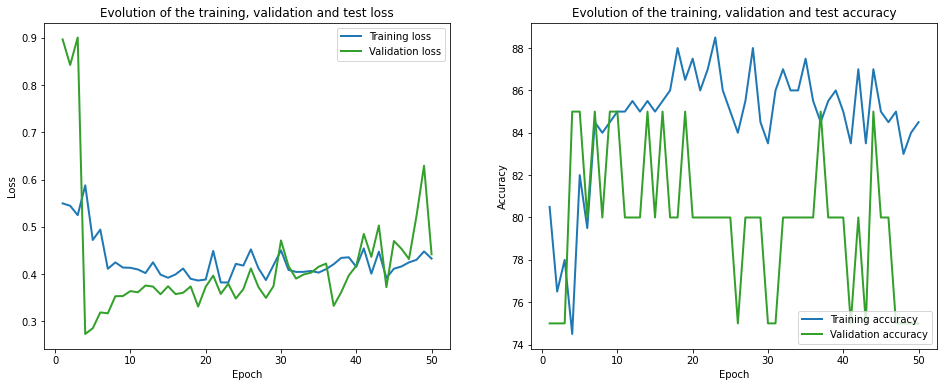

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.22it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 998.61it/s]

Finished computing p-values for 500 test points.

Starting repetition 14 of 50:



Training with standard data splitting...


C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.90 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.93 train_acc: 90.00% took: 0.00s
val_loss = 0.49 val_acc = 65.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.56 train_acc: 50.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.03 train_ac

Epoch 16 of 50, 10% 	 train_loss: 0.30 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.69 train_acc: 90.00% took: 0.00s
val_loss = 0.46 val_acc = 86.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 30% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 40% 	 train_loss:

val_loss = 0.48 val_acc = 85.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.27 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.00 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.66 train_acc: 80.00% took: 0.00s
val_loss = 0.47 val_acc = 85.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.02 tra

Epoch 37 of 50, 90% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.63 train_acc: 80.00% took: 0.00s
val_loss = 0.50 val_acc = 84.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.02 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.00 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.12 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
val_loss = 0.48 val_acc = 84.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.25 tra

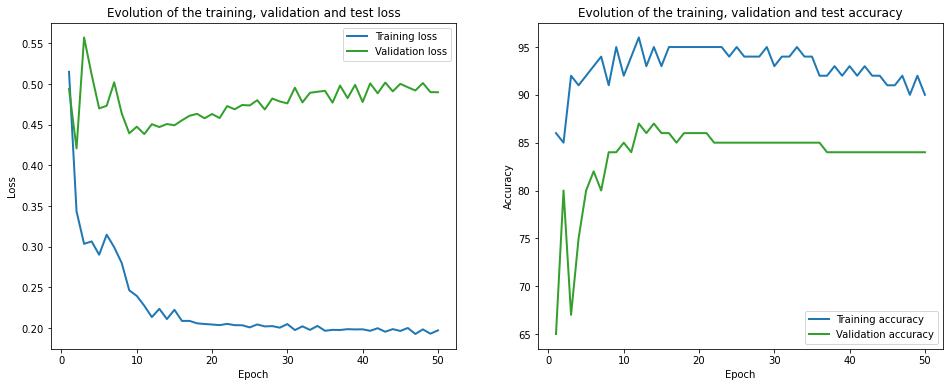

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.14it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 883.04it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.11 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 2.31 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.59 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.50 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.55 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.16 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.36 train_acc: 90.00% took: 0.01s
val_loss = 0.26 val_acc = 90.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 1.29 train_acc: 50.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.49 train_acc: 

Epoch 14 of 50, 60% 	 train_loss: 0.12 train_acc: 100.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.20 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 100% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
val_loss = 0.43 val_acc = 75.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.23 train_acc: 95.00% took: 0.01s
Epoch 15 of 50, 20% 	 train_loss: 0.89 train_acc: 70.00% took: 0.01s
Epoch 15 of 50, 30% 	 train_loss: 0.22 train_acc: 95.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.36 train_acc: 85.00% took: 0.02s
Epoch 15 of 50, 60% 	 train_loss: 0.14 train_acc: 100.00% took: 0.01s
Epoch 15 of 50, 70% 	 train_loss: 0.22 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 80% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 90% 	 train_loss: 0.18 

Epoch 26 of 50, 70% 	 train_loss: 0.17 train_acc: 85.00% took: 0.02s
Epoch 26 of 50, 80% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.16 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
val_loss = 0.39 val_acc = 75.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.24 train_acc: 95.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.88 train_acc: 70.00% took: 0.01s
Epoch 27 of 50, 30% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 27 of 50, 40% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 60% 	 train_loss: 0.11 train_acc: 100.00% took: 0.01s
Epoch 27 of 50, 70% 	 train_loss: 0.16 train_acc: 85.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 90% 	 train_loss: 0.16 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 100% 	 train_loss: 0.25 

Epoch 38 of 50, 30% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.11 train_acc: 100.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.17 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.14 train_acc: 95.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
val_loss = 0.42 val_acc = 75.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.23 train_acc: 95.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.91 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 30% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 39 of 50, 40% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.11 t

Epoch 49 of 50, 100% 	 train_loss: 0.30 train_acc: 90.00% took: 0.02s
val_loss = 0.38 val_acc = 75.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.90 train_acc: 60.00% took: 0.01s
Epoch 50 of 50, 30% 	 train_loss: 0.24 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.30 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.17 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.24 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.20 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.12 train_acc: 95.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
val_loss = 0.39 val_acc = 75.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


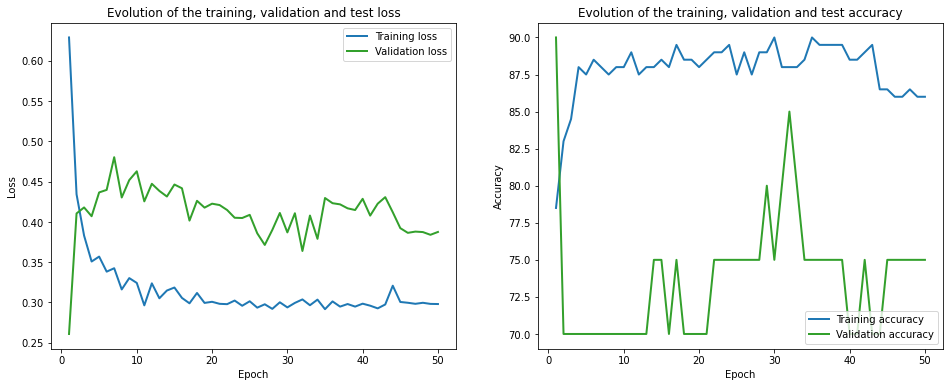

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.86it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 857.90it/s]

Finished computing p-values for 500 test points.

Starting repetition 15 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.82 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 1.55 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 4.67 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.90 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.68 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.63 train_acc: 60.00% took: 0.00s
val_loss = 0.65 val_acc = 46.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.72 train_acc: 30.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.45 train_acc: 

Epoch 14 of 50, 10% 	 train_loss: 0.16 train_acc: 100.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
val_loss = 0.39 val_acc = 83.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.38

Epoch 28 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.83 train_acc: 60.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 90% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.30 val_acc = 88.00%
Snapshot saved at epoch 28.
Epoch 29 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 29 of 50, 20% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 40% 	 train_loss: 0.36

Epoch 39 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.10 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
val_loss = 0.31 val_acc = 88.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.09 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.3

val_loss = 0.30 val_acc = 88.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.09 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.74 train_acc: 60.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.35 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
val_loss = 0.31 val_acc = 84.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


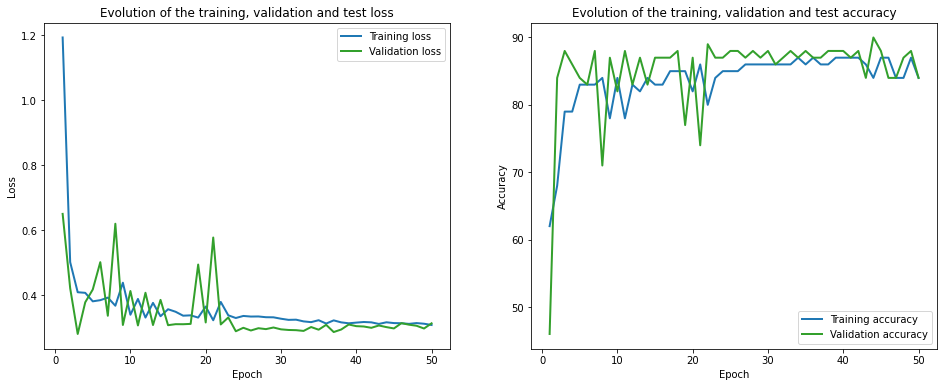

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.73it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 965.31it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.80 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 2.34 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.87 train_acc: 45.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.56 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.90 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.46 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 1.05 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.57 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
val_loss = 0.70 val_acc = 45.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.59 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.57 train_acc: 7

Epoch 12 of 50, 90% 	 train_loss: 0.38 train_acc: 75.00% took: 0.02s
Epoch 12 of 50, 100% 	 train_loss: 0.42 train_acc: 75.00% took: 0.01s
val_loss = 0.42 val_acc = 60.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.49 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.70 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.37 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.43 train_acc: 75.00% took: 0.00s
val_loss = 0.41 val_acc = 60.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.27 train_acc

Epoch 24 of 50, 90% 	 train_loss: 0.24 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.46 train_acc: 75.00% took: 0.00s
val_loss = 0.38 val_acc = 95.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.55 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.50 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.84 train_acc: 60.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.24 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
val_loss = 0.38 val_acc = 95.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.27 train_acc

Epoch 36 of 50, 100% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
val_loss = 0.38 val_acc = 95.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 20% 	 train_loss: 0.55 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.50 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 50% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.84 train_acc: 60.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.23 train_acc: 95.00% took: 0.02s
Epoch 37 of 50, 100% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
val_loss = 0.39 val_acc = 95.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.53 train_acc

Epoch 49 of 50, 40% 	 train_loss: 0.53 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.86 train_acc: 60.00% took: 0.01s
Epoch 49 of 50, 90% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
val_loss = 0.39 val_acc = 95.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.52 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.23 tr

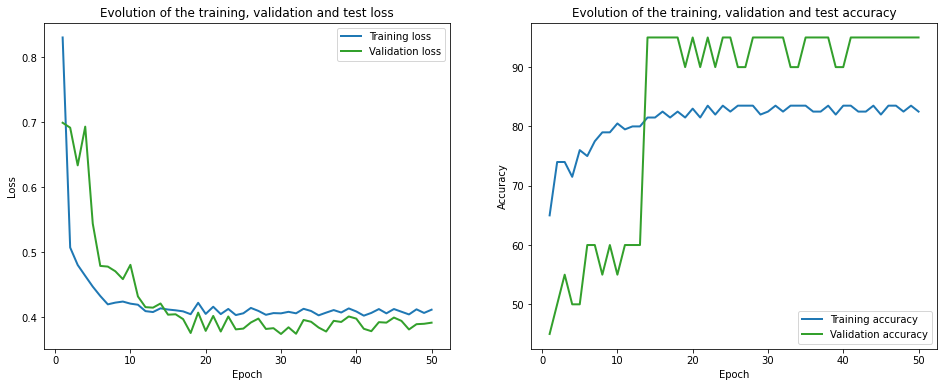

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.68it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 859.49it/s]

Finished computing p-values for 500 test points.

Starting repetition 16 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.61 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.80 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 3.71 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.36 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.50 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 2.15 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.23 train_acc: 80.00% took: 0.00s
val_loss = 0.31 val_acc = 89.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.68 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.28 train_acc: 

Epoch 15 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
val_loss = 0.29 val_acc = 90.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.60 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.13

Epoch 29 of 50, 90% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 29 of 50, 100% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 89.00%
Snapshot saved at epoch 29.
Epoch 30 of 50, 10% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 20% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 30% 	 train_loss: 0.15 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 40% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 50% 	 train_loss: 0.56 train_acc: 60.00% took: 0.00s
Epoch 30 of 50, 60% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 70% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 80% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 90% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 100% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 90.00%
Snapshot saved at epoch 30.
Epoch 31 of 50, 10% 	 train_loss: 0.36 train_a

val_loss = 0.34 val_acc = 89.00%
Snapshot saved at epoch 40.
Epoch 41 of 50, 10% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 20% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 80% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 90% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 100% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
val_loss = 0.34 val_acc = 89.00%
Snapshot saved at epoch 41.
Epoch 42 of 50, 10% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 42 of 50, 20% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.15 train_acc

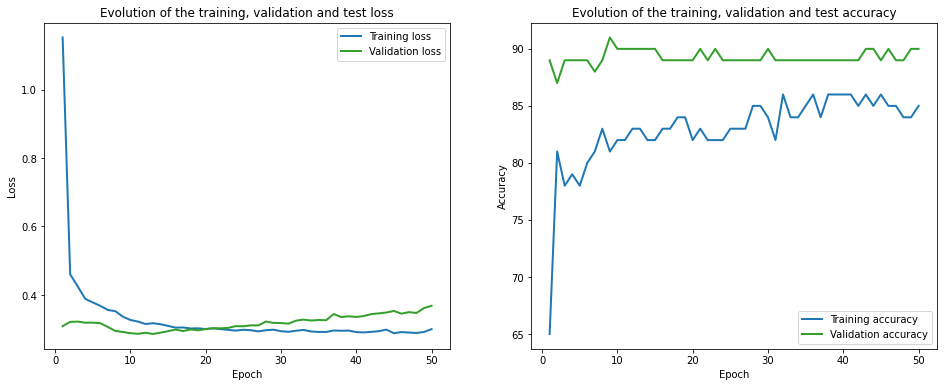

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.08it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 943.06it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.95 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.69 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.49 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 1.12 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.24 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
val_loss = 0.47 val_acc = 70.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.30 train_acc: 9

Epoch 12 of 50, 10% 	 train_loss: 0.32 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 30% 	 train_loss: 0.36 train_acc: 95.00% took: 0.01s
Epoch 12 of 50, 40% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 50% 	 train_loss: 0.50 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.21 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.21 train_acc: 85.00% took: 0.01s
val_loss = 0.31 val_acc = 75.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.38 train_acc: 95.00% took: 0.02s
Epoch 13 of 50, 40% 	 train_loss: 0.35 tr

Epoch 24 of 50, 40% 	 train_loss: 0.33 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.44 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.24 train_acc: 95.00% took: 0.02s
Epoch 24 of 50, 80% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 90% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
val_loss = 0.27 val_acc = 85.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.33 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.33 train_acc: 95.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.36 train_acc: 85.00% took: 0.02s
Epoch 25 of 50, 60% 	 train_loss: 0.45 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.23 tr

Epoch 36 of 50, 10% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 36 of 50, 20% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 30% 	 train_loss: 0.32 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 40% 	 train_loss: 0.33 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 50% 	 train_loss: 0.33 train_acc: 85.00% took: 0.02s
Epoch 36 of 50, 60% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 36 of 50, 70% 	 train_loss: 0.23 train_acc: 95.00% took: 0.01s
Epoch 36 of 50, 80% 	 train_loss: 0.18 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 90% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 100% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
val_loss = 0.27 val_acc = 85.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.32 train_acc: 95.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.32 tr

Epoch 48 of 50, 90% 	 train_loss: 0.16 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 100% 	 train_loss: 0.15 train_acc: 95.00% took: 0.00s
val_loss = 0.27 val_acc = 85.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.31 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.32 train_acc: 95.00% took: 0.00s
Epoch 49 of 50, 50% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 90% 	 train_loss: 0.16 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.15 train_acc: 95.00% took: 0.01s
val_loss = 0.27 val_acc = 85.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.40 train_acc

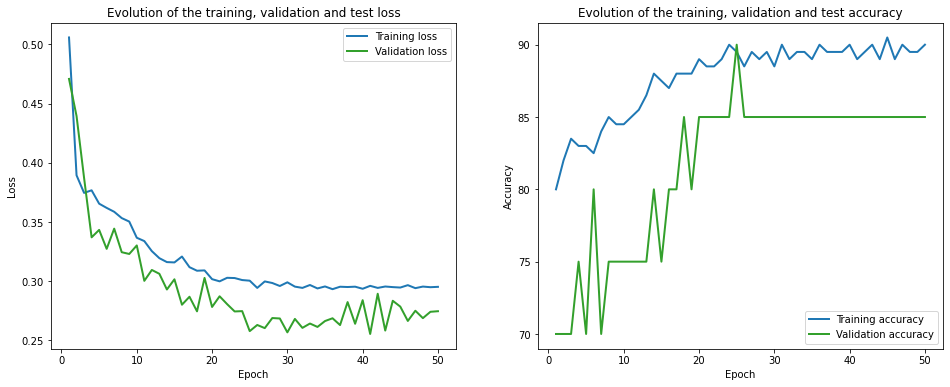

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 152.90it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1070.04it/s]

Finished computing p-values for 500 test points.

Starting repetition 17 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.61 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.59 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 4.35 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.68 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.54 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.36 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.10 train_acc: 100.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
val_loss = 0.66 val_acc = 54.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.74 train_acc: 60.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.57 train_acc: 

Epoch 15 of 50, 100% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
val_loss = 0.26 val_acc = 91.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.60 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.47 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.46 train_acc: 50.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
val_loss = 0.24 val_acc = 90.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.38 train_a

Epoch 28 of 50, 30% 	 train_loss: 0.65 train_acc: 60.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 90% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 100% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
val_loss = 0.32 val_acc = 87.00%
Snapshot saved at epoch 28.
Epoch 29 of 50, 10% 	 train_loss: 0.61 train_acc: 60.00% took: 0.00s
Epoch 29 of 50, 20% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 29 of 50, 30% 	 train_loss: 0.66 train_acc: 60.00% took: 0.00s
Epoch 29 of 50, 40% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 50% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 60% 	 train_loss: 0.57 

Epoch 40 of 50, 40% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 60% 	 train_loss: 0.52 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 70% 	 train_loss: 0.24 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 80% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 90% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 100% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
val_loss = 0.31 val_acc = 87.00%
Snapshot saved at epoch 40.
Epoch 41 of 50, 10% 	 train_loss: 0.61 train_acc: 60.00% took: 0.00s
Epoch 41 of 50, 20% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.63 train_acc: 60.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.28 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 70% 	 train_loss: 0.2

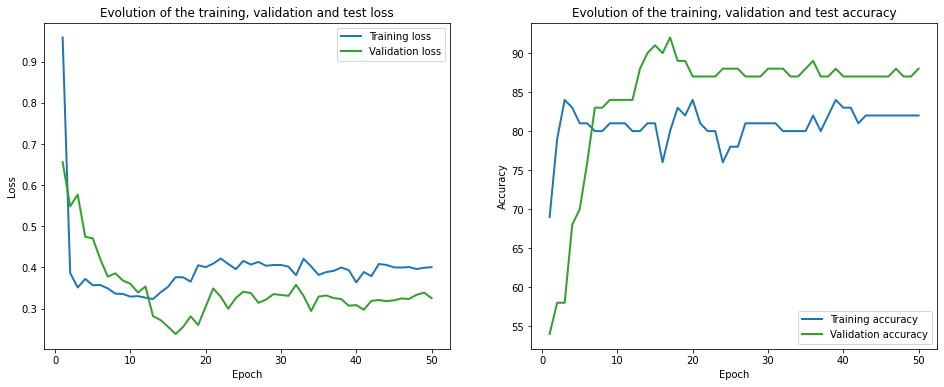

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.16it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1069.99it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.65 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.87 train_acc: 45.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.60 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.53 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.58 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.93 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
val_loss = 0.48 val_acc = 65.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.61 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.35 train_acc: 

Epoch 13 of 50, 50% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.84 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
val_loss = 0.43 val_acc = 70.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.57 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.30 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.24 train_acc: 95.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 60% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.45 tr

Epoch 24 of 50, 50% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 60% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 70% 	 train_loss: 0.38 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.48 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 90% 	 train_loss: 0.97 train_acc: 65.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
val_loss = 0.52 val_acc = 70.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.51 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.61 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.26 train_acc: 95.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.44 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.53 tr

Epoch 38 of 50, 60% 	 train_loss: 0.45 train_acc: 75.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.57 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.76 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
val_loss = 0.43 val_acc = 65.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.49 train_acc: 75.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.57 train_acc: 75.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 40% 	 train_loss: 0.25 train_acc: 95.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.41 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 80% 	 train_loss: 0.47 train_acc: 75.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.92 tr

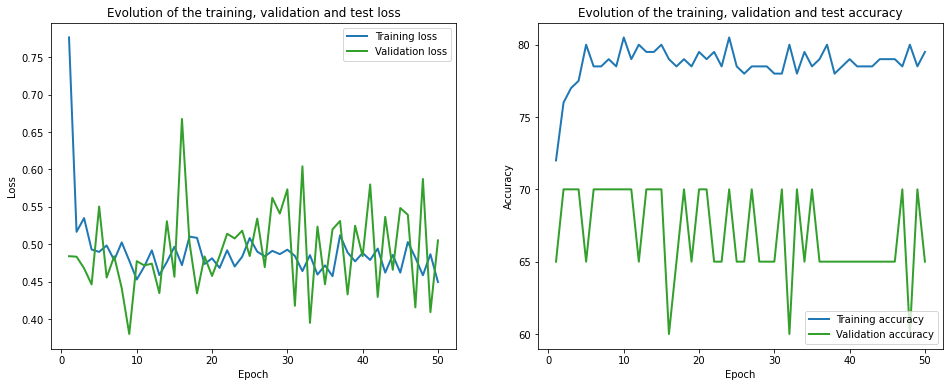

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.06it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 978.05it/s]

Finished computing p-values for 500 test points.

Starting repetition 18 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.94 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 3.43 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.45 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 5.13 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 2.21 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.45 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.70 train_acc: 30.00% took: 0.02s
Epoch 1 of 50, 100% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
val_loss = 0.31 val_acc = 86.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.56 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.52 train_acc: 

Epoch 14 of 50, 60% 	 train_loss: 1.19 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
val_loss = 0.33 val_acc = 85.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 15 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 50% 	 train_loss: 0.94 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.40 t

Epoch 26 of 50, 10% 	 train_loss: 0.50 train_acc: 80.00% took: 0.02s
Epoch 26 of 50, 20% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
val_loss = 0.29 val_acc = 82.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.60 

Epoch 40 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.02s
Epoch 40 of 50, 40% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 50% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 60% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 80% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 90% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 100% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
val_loss = 0.27 val_acc = 89.00%
Snapshot saved at epoch 40.
Epoch 41 of 50, 10% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 20% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.58 train_acc: 70.00% took: 0.01s
Epoch 41 of 50, 60% 	 train_loss: 0.16 

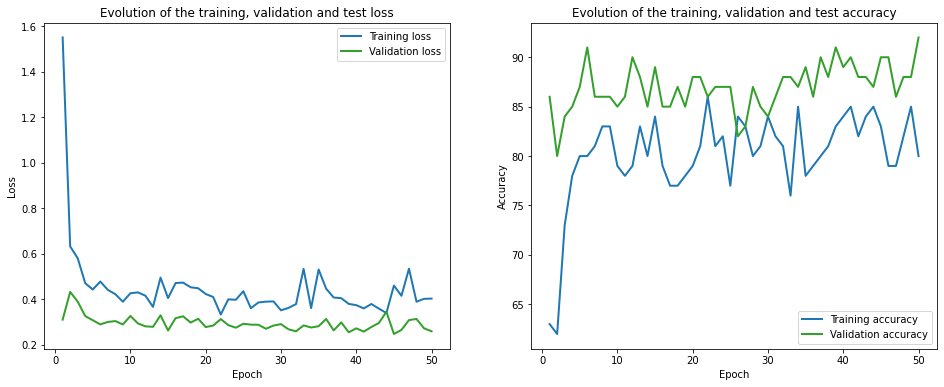

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.46it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 811.14it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.64 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.34 train_acc: 90.00% took: 0.02s
Epoch 1 of 50, 30% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.53 train_acc: 75.00% took: 0.02s
Epoch 1 of 50, 50% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.13 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.51 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.48 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.73 train_acc: 85.00% took: 0.01s
val_loss = 0.31 val_acc = 85.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.39 train_acc: 

Epoch 12 of 50, 10% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 20% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 30% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 50% 	 train_loss: 0.11 train_acc: 100.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.44 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.14 train_acc: 95.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.24 train_acc: 90.00% took: 0.02s
val_loss = 0.06 val_acc = 95.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.47 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.29 train_acc: 85.00% took: 0.02s
Epoch 13 of 50, 40% 	 train_loss: 0.23 t

Epoch 23 of 50, 60% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 23 of 50, 70% 	 train_loss: 0.11 train_acc: 95.00% took: 0.00s
Epoch 23 of 50, 80% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 23 of 50, 90% 	 train_loss: 0.48 train_acc: 85.00% took: 0.00s
Epoch 23 of 50, 100% 	 train_loss: 0.23 train_acc: 100.00% took: 0.01s
val_loss = 0.02 val_acc = 100.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.46 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 40% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.07 train_acc: 100.00% took: 0.01s
Epoch 24 of 50, 60% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 70% 	 train_loss: 0.11 train_acc: 95.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.26 train_acc: 85.00% took: 0.02s
Epoch 24 of 50, 90% 	 train_loss: 0.46

Epoch 37 of 50, 10% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 20% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 30% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 50% 	 train_loss: 0.08 train_acc: 100.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.15 train_acc: 95.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
val_loss = 0.03 val_acc = 100.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.27 

val_loss = 0.07 val_acc = 95.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 20% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 48 of 50, 30% 	 train_loss: 0.21 train_acc: 90.00% took: 0.02s
Epoch 48 of 50, 40% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 48 of 50, 50% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 48 of 50, 60% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 70% 	 train_loss: 0.11 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 80% 	 train_loss: 0.26 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.50 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 100% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
val_loss = 0.01 val_acc = 100.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.31 train_ac

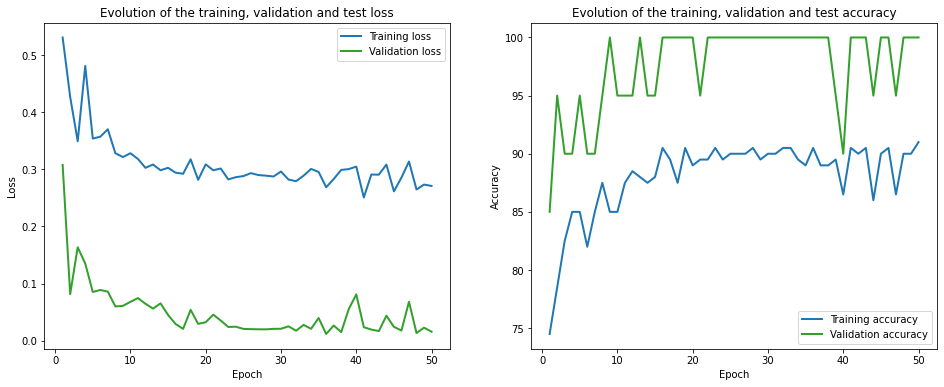

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.34it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1028.61it/s]

Finished computing p-values for 500 test points.

Starting repetition 19 of 50:



Training with standard data splitting...


C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.66 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.41 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.60 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.82 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 2.63 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 1.15 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.72 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.82 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
val_loss = 0.48 val_acc = 77.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.40 train_acc: 

Epoch 15 of 50, 70% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.48 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.76 train_acc: 50.00% took: 0.00s
val_loss = 0.54 val_acc = 75.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.22 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.20 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.49 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.74 t

Epoch 26 of 50, 80% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.80 train_acc: 60.00% took: 0.00s
val_loss = 0.52 val_acc = 75.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.31 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.24 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.78 train_acc: 60.00% took: 0.00s
val_loss = 0.53 val_acc = 73.00%
Snaps

Epoch 42 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 100% 	 train_loss: 0.74 train_acc: 60.00% took: 0.00s
val_loss = 0.49 val_acc = 74.00%
Snapshot saved at epoch 42.
Epoch 43 of 50, 10% 	 train_loss: 0.27 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 20% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 30% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 40% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 50% 	 train_loss: 0.40 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 60% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 70% 	 train_loss: 0.27 train_acc: 90.00% took: 0.02s
Epoch 43 of 50, 80% 	 train_loss: 0.44 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 90% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 100% 	 train_loss: 0.74 train_acc: 60.00% took: 0.00s
val_loss = 0.50 val_acc = 74.00%
Snapshot saved at epoch 43.
Epoch 44 of 50, 10% 	 train_loss: 0.27 train_

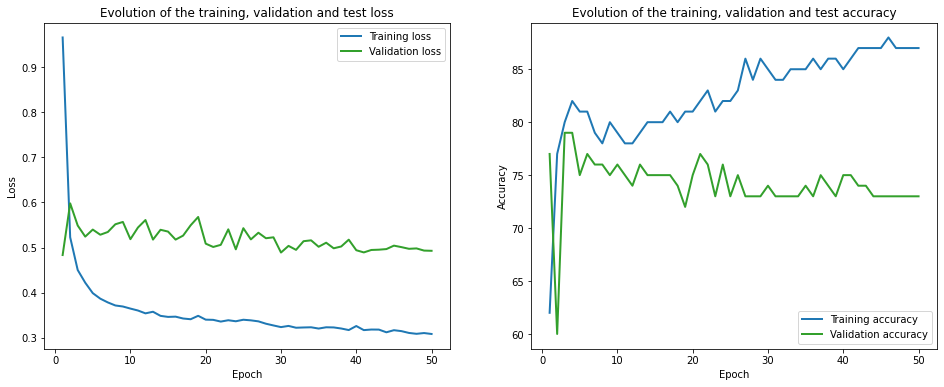

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 130.36it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 907.45it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.35 train_acc: 45.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.23 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 1.72 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.88 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.53 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.71 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.71 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.73 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.60 train_acc: 50.00% took: 0.00s
val_loss = 0.36 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.79 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.28 train_acc: 9

Epoch 12 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
val_loss = 0.29 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 1.08 train_acc: 65.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.72 train_acc: 55.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.37 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.53 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.54 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
val_loss = 0.30 val_acc = 80.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 1.08 train_acc

Epoch 25 of 50, 50% 	 train_loss: 0.51 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 60% 	 train_loss: 0.54 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.62 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
val_loss = 0.30 val_acc = 80.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 1.08 train_acc: 65.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.72 train_acc: 55.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.51 train_acc: 90.00% took: 0.02s
Epoch 26 of 50, 60% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.62 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.54 tr

Epoch 37 of 50, 20% 	 train_loss: 0.70 train_acc: 55.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.36 train_acc: 95.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 50% 	 train_loss: 0.51 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.55 train_acc: 70.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.63 train_acc: 70.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.53 train_acc: 75.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
val_loss = 0.30 val_acc = 80.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 1.09 train_acc: 65.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.71 train_acc: 55.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.31 train_acc: 85.00% took: 0.02s
Epoch 38 of 50, 50% 	 train_loss: 0.51 tr

Epoch 49 of 50, 10% 	 train_loss: 1.08 train_acc: 65.00% took: 0.00s
Epoch 49 of 50, 20% 	 train_loss: 0.72 train_acc: 50.00% took: 0.00s
Epoch 49 of 50, 30% 	 train_loss: 0.36 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.49 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.55 train_acc: 70.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.53 train_acc: 75.00% took: 0.00s
Epoch 49 of 50, 90% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
val_loss = 0.30 val_acc = 80.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 1.09 train_acc: 65.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.71 train_acc: 50.00% took: 0.02s
Epoch 50 of 50, 30% 	 train_loss: 0.36 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.31 tr

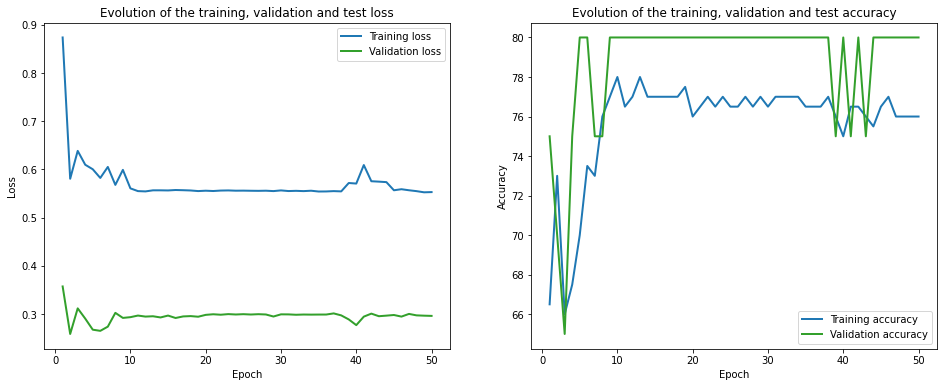

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.05it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 868.91it/s]

Finished computing p-values for 500 test points.

Starting repetition 20 of 50:



Training with standard data splitting...


C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.83 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.69 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.69 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.00 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.87 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
val_loss = 0.40 val_acc = 81.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.65 train_acc: 50.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.30 train_acc: 

Epoch 16 of 50, 10% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.79 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.58 train_acc: 50.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
val_loss = 0.42 val_acc = 84.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 30% 	 train_loss: 0.23 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 40% 	 train_loss: 0.35 t

Epoch 31 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
val_loss = 0.42 val_acc = 83.00%
Snapshot saved at epoch 31.
Epoch 32 of 50, 10% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 20% 	 train_loss: 0.12 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 30% 	 train_loss: 0.23 train_acc: 80.00% took: 0.01s
Epoch 32 of 50, 40% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 50% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 60% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 32 of 50, 70% 	 train_loss: 0.76 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 80% 	 train_loss: 0.73 train_acc: 60.00% took: 0.00s
Epoch 32 of 50, 90% 	 train_loss: 0.55 train_acc: 60.00% took: 0.00s
Epoch 32 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
val_loss = 0.42 val_acc = 84.00%
Snapshot saved at epoch 32.
Epoch 33 of 50, 10% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 33 of 50, 20% 	 train_loss: 0.12 train_acc

Epoch 45 of 50, 40% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 60% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 70% 	 train_loss: 0.76 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 80% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 45 of 50, 90% 	 train_loss: 0.53 train_acc: 60.00% took: 0.00s
Epoch 45 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
val_loss = 0.41 val_acc = 83.00%
Snapshot saved at epoch 45.
Epoch 46 of 50, 10% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 46 of 50, 20% 	 train_loss: 0.12 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 40% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 50% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 60% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 46 of 50, 70% 	 train_loss: 0.74 tr

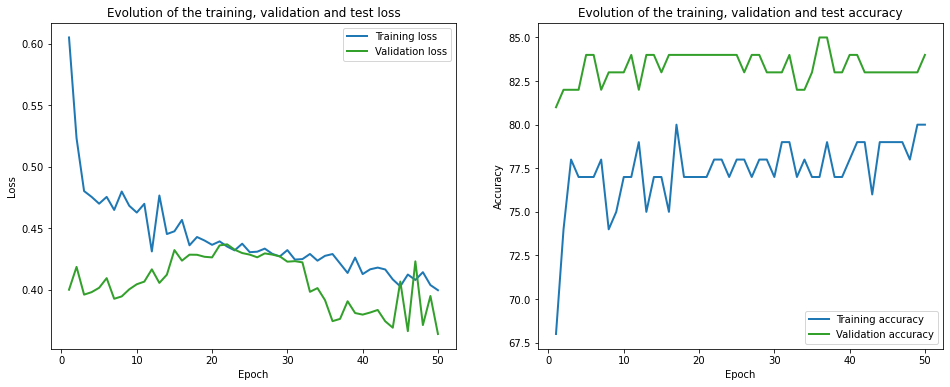

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.98it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 888.60it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.14 train_acc: 45.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.85 train_acc: 55.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.43 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.54 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
val_loss = 0.15 val_acc = 100.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.38 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.55 train_acc: 

Epoch 13 of 50, 80% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.55 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
val_loss = 0.25 val_acc = 95.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.38 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 60% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.31 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.55 train_acc: 75.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.25 val_acc = 95.00%
Snapsho

Epoch 25 of 50, 60% 	 train_loss: 0.24 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.34 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.53 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.01s
val_loss = 0.27 val_acc = 95.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.40 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.37 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.32 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.53 tr

Epoch 37 of 50, 60% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.32 train_acc: 70.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.22 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.25 val_acc = 95.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.35 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.34 train_acc: 70.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.22 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.50 tr

Epoch 48 of 50, 70% 	 train_loss: 0.31 train_acc: 75.00% took: 0.01s
Epoch 48 of 50, 80% 	 train_loss: 0.22 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
Epoch 48 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.27 val_acc = 95.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.41 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.36 train_acc: 70.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.33 train_acc: 75.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.19 train_acc: 90.00% took: 0.02s
Epoch 49 of 50, 90% 	 train_loss: 0.51 train_acc: 75.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.21 t

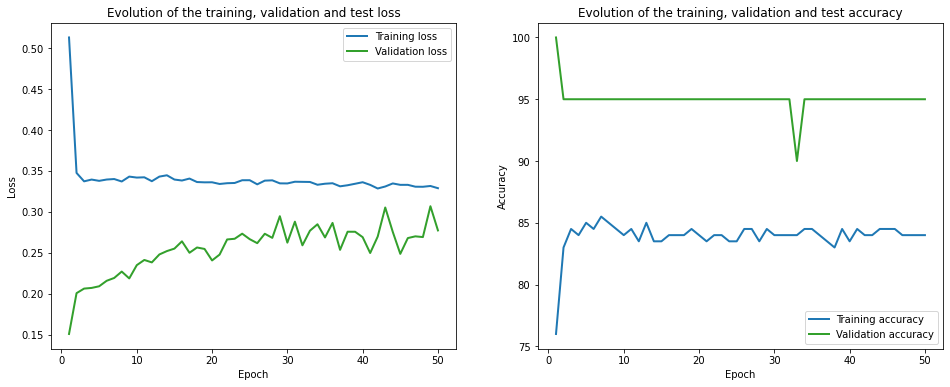

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 120.04it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 863.53it/s]

Finished computing p-values for 500 test points.

Starting repetition 21 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.04 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.05 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 2.60 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.14 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.34 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.55 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.68 train_acc: 20.00% took: 0.00s
val_loss = 0.57 val_acc = 70.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.81 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.46 train_acc: 8

Epoch 13 of 50, 90% 	 train_loss: 0.41 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
val_loss = 0.50 val_acc = 76.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 1.02 train_acc: 70.00% took: 0.02s
Epoch 14 of 50, 30% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.79 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.96 train_acc: 40.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
val_loss = 0.51 val_acc = 76.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.15 train_a

Epoch 29 of 50, 70% 	 train_loss: 0.49 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 80% 	 train_loss: 0.53 train_acc: 70.00% took: 0.01s
Epoch 29 of 50, 90% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 100% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
val_loss = 0.51 val_acc = 77.00%
Snapshot saved at epoch 29.
Epoch 30 of 50, 10% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 20% 	 train_loss: 0.98 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 30% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 40% 	 train_loss: 0.91 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 50% 	 train_loss: 0.90 train_acc: 40.00% took: 0.00s
Epoch 30 of 50, 60% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 70% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 80% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 90% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 100% 	 train_loss: 0.34

Epoch 44 of 50, 30% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 40% 	 train_loss: 0.90 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 50% 	 train_loss: 0.95 train_acc: 40.00% took: 0.00s
Epoch 44 of 50, 60% 	 train_loss: 0.33 train_acc: 70.00% took: 0.00s
Epoch 44 of 50, 70% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 80% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 90% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 100% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
val_loss = 0.49 val_acc = 79.00%
Snapshot saved at epoch 44.
Epoch 45 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 45 of 50, 20% 	 train_loss: 0.97 train_acc: 70.00% took: 0.01s
Epoch 45 of 50, 30% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 40% 	 train_loss: 0.90 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 50% 	 train_loss: 0.91 train_acc: 40.00% took: 0.00s
Epoch 45 of 50, 60% 	 train_loss: 0.22 t

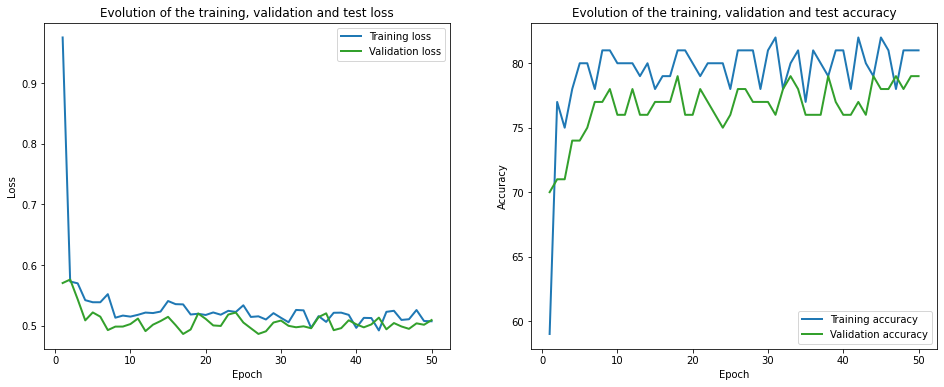

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.12it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 804.52it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.95 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.45 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 1.15 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.88 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.86 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.42 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.49 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.72 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.38 train_acc: 90.00% took: 0.01s
val_loss = 0.71 val_acc = 50.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.61 train_acc: 60.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.39 train_acc: 8

Epoch 14 of 50, 50% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 60% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.82 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.32 train_acc: 95.00% took: 0.01s
Epoch 14 of 50, 100% 	 train_loss: 0.32 train_acc: 95.00% took: 0.00s
val_loss = 0.56 val_acc = 70.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.31 train_acc: 80.00% took: 0.02s
Epoch 15 of 50, 20% 	 train_loss: 0.52 train_acc: 85.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 80% 	 train_loss: 0.77 tr

Epoch 26 of 50, 20% 	 train_loss: 0.40 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.34 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.62 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.24 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.40 train_acc: 95.00% took: 0.00s
val_loss = 0.43 val_acc = 80.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.37 train_acc: 95.00% took: 0.01s
Epoch 27 of 50, 30% 	 train_loss: 0.20 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 40% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.47 tr

Epoch 39 of 50, 80% 	 train_loss: 0.65 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 90% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 39 of 50, 100% 	 train_loss: 0.40 train_acc: 95.00% took: 0.01s
val_loss = 0.41 val_acc = 80.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 40 of 50, 20% 	 train_loss: 0.33 train_acc: 95.00% took: 0.01s
Epoch 40 of 50, 30% 	 train_loss: 0.25 train_acc: 85.00% took: 0.01s
Epoch 40 of 50, 40% 	 train_loss: 0.34 train_acc: 80.00% took: 0.01s
Epoch 40 of 50, 50% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 60% 	 train_loss: 0.48 train_acc: 65.00% took: 0.01s
Epoch 40 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 80% 	 train_loss: 0.60 train_acc: 85.00% took: 0.01s
Epoch 40 of 50, 90% 	 train_loss: 0.23 train_acc: 95.00% took: 0.00s
Epoch 40 of 50, 100% 	 train_loss: 0.40 train_acc: 95.00% took: 0.00s
val_loss = 0.40 val_acc = 80.00%
Snapsho

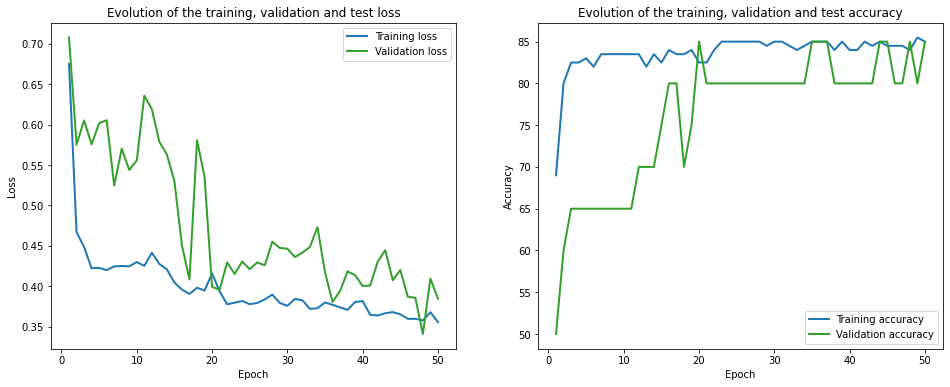

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 117.64it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 742.54it/s]

Finished computing p-values for 500 test points.

Starting repetition 22 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.03 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.46 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.73 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.45 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.77 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 1.13 train_acc: 60.00% took: 0.00s
val_loss = 0.56 val_acc = 69.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 1.08 train_acc: 40.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 1.93 train_acc: 70.00% took: 0.00s
Epoch 2 o

Epoch 13 of 50, 20% 	 train_loss: 0.73 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.32 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
val_loss = 0.30 val_acc = 82.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.76 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.69 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.32 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.32 

Epoch 27 of 50, 20% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.31 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.62 train_acc: 60.00% took: 0.01s
Epoch 27 of 50, 70% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.37 train_acc: 70.00% took: 0.01s
Epoch 27 of 50, 100% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
val_loss = 0.30 val_acc = 84.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.80 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.39 train_acc: 70.00% took: 0.01s
Epoch 28 of 50, 40% 	 train_loss: 0.31 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.41 

Epoch 40 of 50, 40% 	 train_loss: 0.30 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 50% 	 train_loss: 0.36 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 60% 	 train_loss: 0.58 train_acc: 50.00% took: 0.00s
Epoch 40 of 50, 70% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 80% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 90% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 100% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
val_loss = 0.30 val_acc = 83.00%
Snapshot saved at epoch 40.
Epoch 41 of 50, 10% 	 train_loss: 0.81 train_acc: 80.00% took: 0.01s
Epoch 41 of 50, 20% 	 train_loss: 0.60 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.30 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.60 train_acc: 50.00% took: 0.00s
Epoch 41 of 50, 70% 	 train_loss: 0.14 

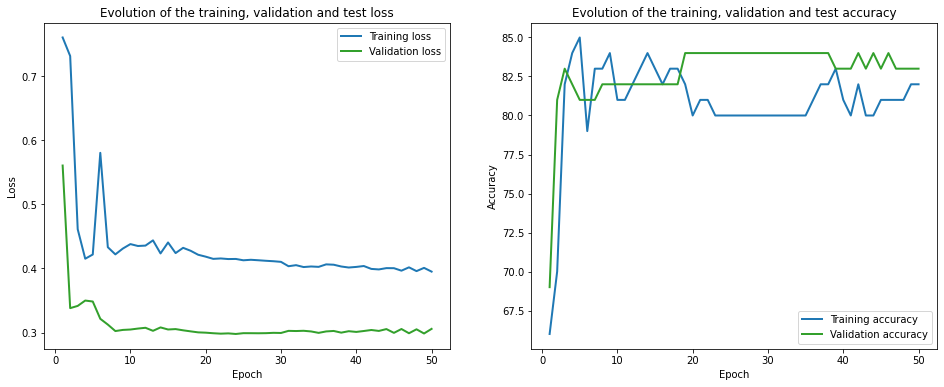

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.05it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 817.83it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.43 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.67 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 2.71 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.63 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.89 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.45 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.53 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.69 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
val_loss = 0.39 val_acc = 65.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.47 train_acc: 6

Epoch 13 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.49 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.86 train_acc: 50.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.58 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
val_loss = 0.31 val_acc = 75.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.49 train_acc: 90.00% took: 0.02s
Epoch 14 of 50, 50% 	 train_loss: 0.86 tr

Epoch 24 of 50, 10% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 20% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 30% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 40% 	 train_loss: 0.55 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.93 train_acc: 50.00% took: 0.01s
Epoch 24 of 50, 60% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 70% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.60 train_acc: 65.00% took: 0.00s
Epoch 24 of 50, 100% 	 train_loss: 0.26 train_acc: 85.00% took: 0.02s
val_loss = 0.31 val_acc = 80.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.20 train_acc: 90.00% took: 0.02s
Epoch 25 of 50, 20% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 30% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.56 tr

Epoch 36 of 50, 100% 	 train_loss: 0.28 train_acc: 95.00% took: 0.01s
val_loss = 0.37 val_acc = 70.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.25 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.50 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.87 train_acc: 50.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.53 train_acc: 80.00% took: 0.02s
Epoch 37 of 50, 100% 	 train_loss: 0.29 train_acc: 95.00% took: 0.00s
val_loss = 0.34 val_acc = 70.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.26 train_acc: 80.00% took: 0.02s
Epoch 38 of 50, 20% 	 train_loss: 0.33 train_acc

Epoch 48 of 50, 10% 	 train_loss: 0.24 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 20% 	 train_loss: 0.36 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 30% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 40% 	 train_loss: 0.46 train_acc: 90.00% took: 0.01s
Epoch 48 of 50, 50% 	 train_loss: 0.82 train_acc: 50.00% took: 0.01s
Epoch 48 of 50, 60% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 48 of 50, 70% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 80% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 100% 	 train_loss: 0.37 train_acc: 70.00% took: 0.01s
val_loss = 0.45 val_acc = 70.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.25 train_acc: 85.00% took: 0.02s
Epoch 49 of 50, 20% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.45 tr

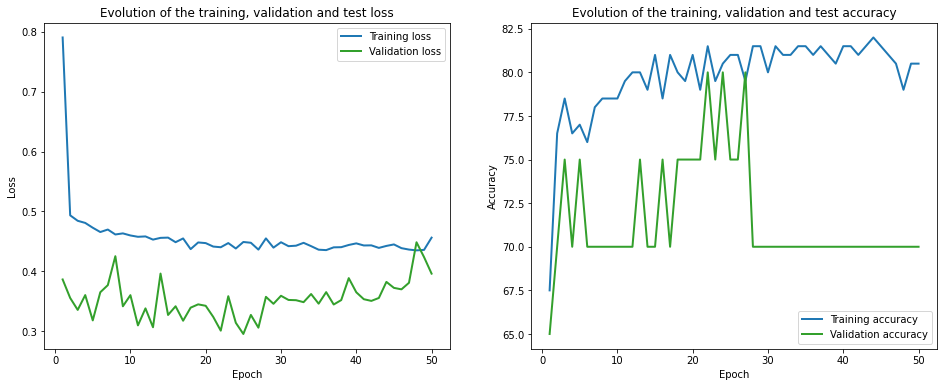

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 112.42it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 754.19it/s]

Finished computing p-values for 500 test points.

Starting repetition 23 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.95 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.90 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.67 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.24 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
val_loss = 0.46 val_acc = 86.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.43 train_acc: 9

Epoch 14 of 50, 10% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.56 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.30 val_acc = 89.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.2

Epoch 27 of 50, 30% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.70 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.01 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.31 val_acc = 90.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.26 train_acc: 80.00% took: 0.01s
Epoch 28 of 50, 50% 	 train_loss: 0.16 train_acc: 90.00% took: 0.01s
Epoch 28 of 50, 60% 	 train_loss: 0.70

val_loss = 0.31 val_acc = 90.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.15 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 20% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.34 train_acc: 70.00% took: 0.01s
Epoch 40 of 50, 50% 	 train_loss: 0.16 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 60% 	 train_loss: 0.69 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 70% 	 train_loss: 0.69 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 80% 	 train_loss: 0.33 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 90% 	 train_loss: 0.01 train_acc: 100.00% took: 0.01s
Epoch 40 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
val_loss = 0.30 val_acc = 90.00%
Snapshot saved at epoch 40.
Epoch 41 of 50, 10% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 20% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.37 train_

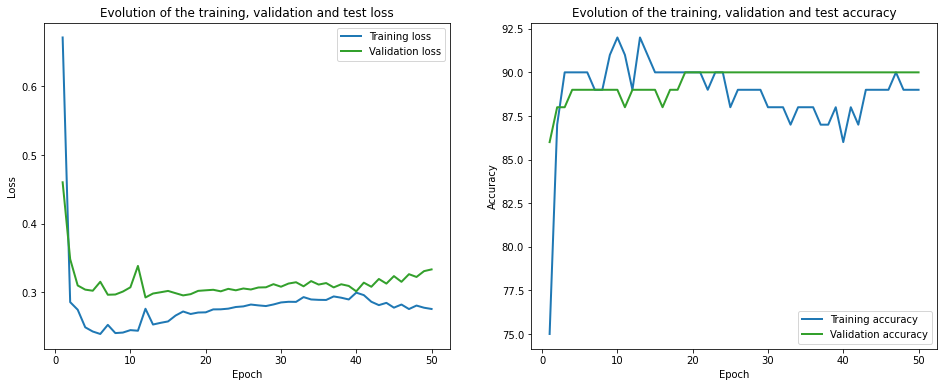

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 80.52it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 565.20it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 2.61 train_acc: 35.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.10 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.74 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.52 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.80 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.53 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.45 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.56 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.48 train_acc: 75.00% took: 0.00s
val_loss = 0.59 val_acc = 55.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.66 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.71 train_acc: 75.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.56 train_acc: 7

Epoch 13 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
val_loss = 0.72 val_acc = 55.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.64 train_acc: 65.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.91 train_acc: 55.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.65 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 1.01 train_acc: 65.00% took: 0.02s
Epoch 14 of 50, 60% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.53 train_acc: 80.00% took: 0.02s
Epoch 14 of 50, 90% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.49 t

Epoch 25 of 50, 80% 	 train_loss: 0.53 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.35 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
val_loss = 0.62 val_acc = 60.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.63 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.60 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.62 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.57 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.60 train_acc: 75.00% took: 0.01s
val_loss = 0.69 val_acc = 60.00%
Snapsho

Epoch 38 of 50, 20% 	 train_loss: 0.76 train_acc: 65.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.54 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.38 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.80 train_acc: 60.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.35 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.51 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.55 train_acc: 75.00% took: 0.00s
val_loss = 0.61 val_acc = 60.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.62 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.69 train_acc: 65.00% took: 0.02s
Epoch 39 of 50, 30% 	 train_loss: 0.56 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.31 train_acc: 85.00% took: 0.02s
Epoch 39 of 50, 50% 	 train_loss: 0.64 tr

Epoch 50 of 50, 40% 	 train_loss: 0.37 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.75 train_acc: 65.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.57 train_acc: 50.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.50 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.55 train_acc: 75.00% took: 0.00s
val_loss = 0.63 val_acc = 60.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


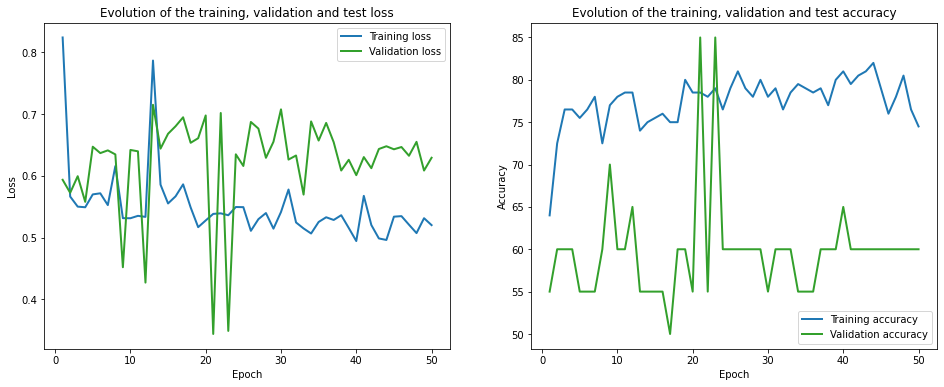

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 125.70it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 719.43it/s]

Finished computing p-values for 500 test points.

Starting repetition 24 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.98 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 1.84 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.50 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.46 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.79 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.53 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.49 train_acc: 70.00% took: 0.01s
val_loss = 0.47 val_acc = 71.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 2 o

Epoch 13 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.69 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.69 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.56 train_acc: 60.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.50 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
val_loss = 0.42 val_acc = 82.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.35 train_acc: 100.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.73 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.65 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.56 t

Epoch 25 of 50, 50% 	 train_loss: 0.20 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.69 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.65 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.50 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
val_loss = 0.41 val_acc = 80.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.37 train_acc: 100.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.69 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.66 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.54 t

Epoch 39 of 50, 20% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.36 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.73 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.65 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.51 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
val_loss = 0.41 val_acc = 79.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.36 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 50% 	 train_loss: 0.20 

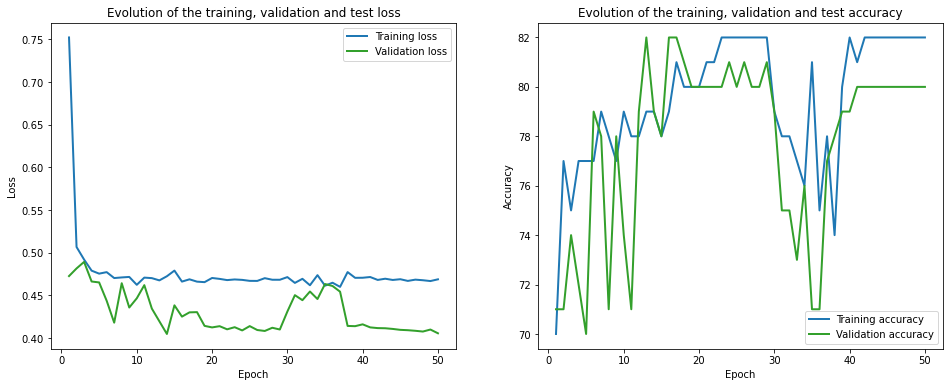

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 104.74it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 631.33it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.26 train_acc: 45.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.57 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.10 train_acc: 100.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.70 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 1.64 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.48 train_acc: 75.00% took: 0.02s
Epoch 1 of 50, 90% 	 train_loss: 0.40 train_acc: 85.00% took: 0.02s
Epoch 1 of 50, 100% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
val_loss = 0.82 val_acc = 60.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.97 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.69 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.06 train_acc: 

Epoch 12 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
val_loss = 0.66 val_acc = 65.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 1.01 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.62 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.09 train_acc: 100.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.56 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.02s
Epoch 13 of 50, 100% 	 train_loss: 0.20 train_acc: 95.00% took: 0.02s
val_loss = 0.68 val_acc = 65.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.75 train_ac

val_loss = 0.71 val_acc = 65.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.61 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.66 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.09 train_acc: 100.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.26 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 50% 	 train_loss: 0.58 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.44 train_acc: 80.00% took: 0.02s
Epoch 25 of 50, 100% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
val_loss = 0.70 val_acc = 65.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.60 train_acc: 85.00% took: 0.02s
Epoch 26 of 50, 20% 	 train_loss: 0.66 train_acc: 70.00% took: 0.02s
Epoch 26 of 50, 30% 	 train_loss: 0.09 train_acc

Epoch 37 of 50, 30% 	 train_loss: 0.10 train_acc: 100.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.30 train_acc: 95.00% took: 0.01s
Epoch 37 of 50, 50% 	 train_loss: 0.59 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
val_loss = 0.68 val_acc = 65.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.63 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.73 train_acc: 70.00% took: 0.03s
Epoch 38 of 50, 30% 	 train_loss: 0.10 train_acc: 100.00% took: 0.02s
Epoch 38 of 50, 40% 	 train_loss: 0.28 train_acc: 95.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.59 train_acc: 75.00% took: 0.02s
Epoch 38 of 50, 60% 	 train_loss: 0.40 

Epoch 49 of 50, 50% 	 train_loss: 0.62 train_acc: 75.00% took: 0.02s
Epoch 49 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 90% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
val_loss = 0.81 val_acc = 65.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.69 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.77 train_acc: 60.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.27 train_acc: 95.00% took: 0.02s
Epoch 50 of 50, 50% 	 train_loss: 0.63 train_acc: 75.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.41 train_acc: 80.00% took: 0.02s
Epoch 50 of 50, 80% 	 train_loss: 0.28 t

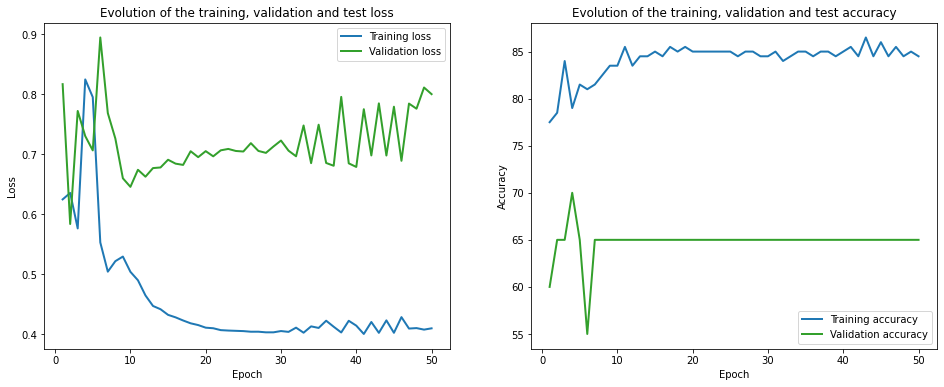

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 101.19it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 637.63it/s]

Finished computing p-values for 500 test points.

Starting repetition 25 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.73 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.02 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.68 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.96 train_acc: 60.00% took: 0.01s
val_loss = 1.11 val_acc = 54.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 1.04 train_acc: 50.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.27 train_acc: 100.00% took: 0.01s
Epoch

val_loss = 0.42 val_acc = 82.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.41 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.11 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.12 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.75 train_acc: 70.00% took: 0.00s
val_loss = 0.38 val_acc = 85.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.38 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.24 train_acc: 100.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.39 train_a

Epoch 26 of 50, 50% 	 train_loss: 0.13 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.10 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.75 train_acc: 70.00% took: 0.00s
val_loss = 0.36 val_acc = 84.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.32 train_acc: 80.00% took: 0.01s
Epoch 27 of 50, 40% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.0

Epoch 40 of 50, 30% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 50% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 60% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 70% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 80% 	 train_loss: 0.08 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 90% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 100% 	 train_loss: 0.76 train_acc: 80.00% took: 0.00s
val_loss = 0.38 val_acc = 85.00%
Snapshot saved at epoch 40.
Epoch 41 of 50, 10% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 20% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 41 of 50, 30% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.07

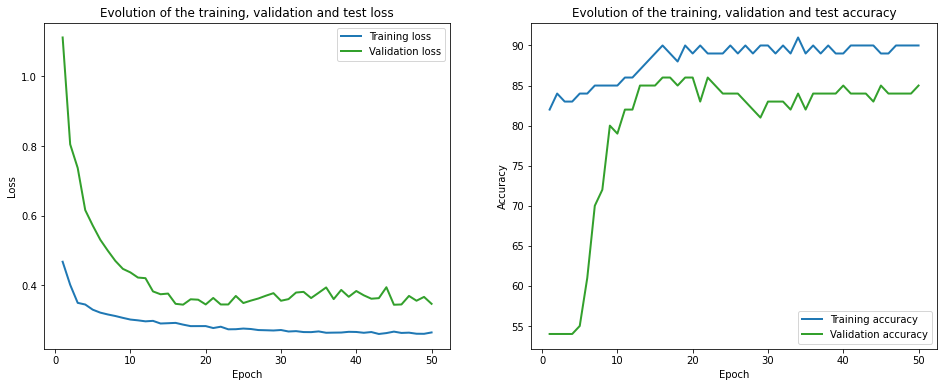

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.92it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 707.22it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.23 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.45 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.89 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.65 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.71 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.44 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.80 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.74 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.45 train_acc: 70.00% took: 0.01s
val_loss = 0.48 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.45 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.70 train_acc: 8

Epoch 14 of 50, 50% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 60% 	 train_loss: 0.34 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.60 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.54 train_acc: 70.00% took: 0.01s
val_loss = 0.31 val_acc = 75.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 30% 	 train_loss: 0.64 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 40% 	 train_loss: 0.60 train_acc: 70.00% took: 0.01s
Epoch 15 of 50, 50% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.34 train_acc: 75.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.28 train_acc: 90.00% took: 0.02s
Epoch 15 of 50, 80% 	 train_loss: 0.60 tr

Epoch 27 of 50, 90% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 100% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
val_loss = 0.49 val_acc = 65.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 28 of 50, 20% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 28 of 50, 30% 	 train_loss: 0.85 train_acc: 75.00% took: 0.01s
Epoch 28 of 50, 40% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
Epoch 28 of 50, 50% 	 train_loss: 0.75 train_acc: 60.00% took: 0.01s
Epoch 28 of 50, 60% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 28 of 50, 70% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.45 train_acc: 80.00% took: 0.02s
Epoch 28 of 50, 90% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 28 of 50, 100% 	 train_loss: 0.37 train_acc: 85.00% took: 0.02s
val_loss = 0.37 val_acc = 85.00%
Snapshot saved at epoch 28.
Epoch 29 of 50, 10% 	 train_loss: 0.34 train_acc

Epoch 39 of 50, 70% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 100% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
val_loss = 0.29 val_acc = 85.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.43 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 20% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 40 of 50, 30% 	 train_loss: 0.86 train_acc: 70.00% took: 0.01s
Epoch 40 of 50, 40% 	 train_loss: 0.55 train_acc: 75.00% took: 0.01s
Epoch 40 of 50, 50% 	 train_loss: 0.65 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 60% 	 train_loss: 0.37 train_acc: 75.00% took: 0.02s
Epoch 40 of 50, 70% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 100% 	 train_loss: 0.42 t

Epoch 50 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
val_loss = 0.30 val_acc = 85.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


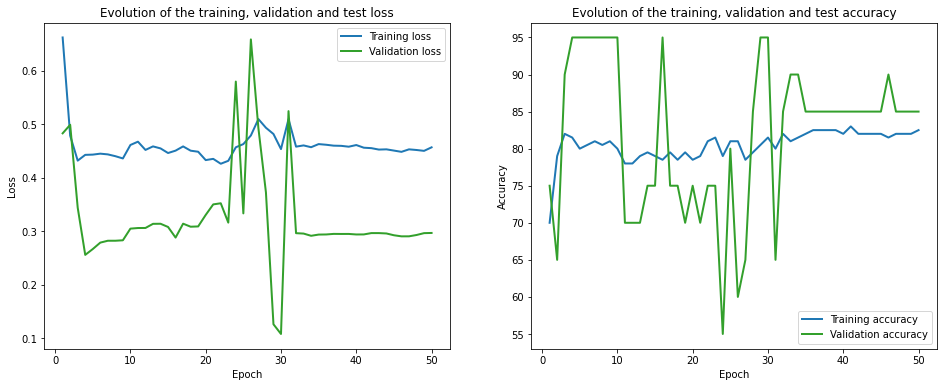

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.65it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 700.69it/s]

Finished computing p-values for 500 test points.

Starting repetition 26 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 4.88 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.63 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.48 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.47 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.64 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.81 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.51 train_acc: 80.00% took: 0.01s
val_loss = 0.46 val_acc = 74.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.72 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.34 train_acc: 1

Epoch 12 of 50, 10% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 20% 	 train_loss: 0.60 train_acc: 70.00% took: 0.01s
Epoch 12 of 50, 30% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.66 train_acc: 60.00% took: 0.02s
Epoch 12 of 50, 70% 	 train_loss: 0.58 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.40 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.39 train_acc: 80.00% took: 0.02s
val_loss = 0.49 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.02s
Epoch 13 of 50, 40% 	 train_loss: 0.32 tr

Epoch 23 of 50, 20% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 23 of 50, 30% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 23 of 50, 40% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 23 of 50, 50% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 23 of 50, 60% 	 train_loss: 0.68 train_acc: 60.00% took: 0.00s
Epoch 23 of 50, 70% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 23 of 50, 80% 	 train_loss: 0.40 train_acc: 90.00% took: 0.00s
Epoch 23 of 50, 90% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 23 of 50, 100% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
val_loss = 0.51 val_acc = 83.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.43 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 40% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.38 tr

Epoch 37 of 50, 30% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
val_loss = 0.55 val_acc = 83.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.46 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.30 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.68 tr

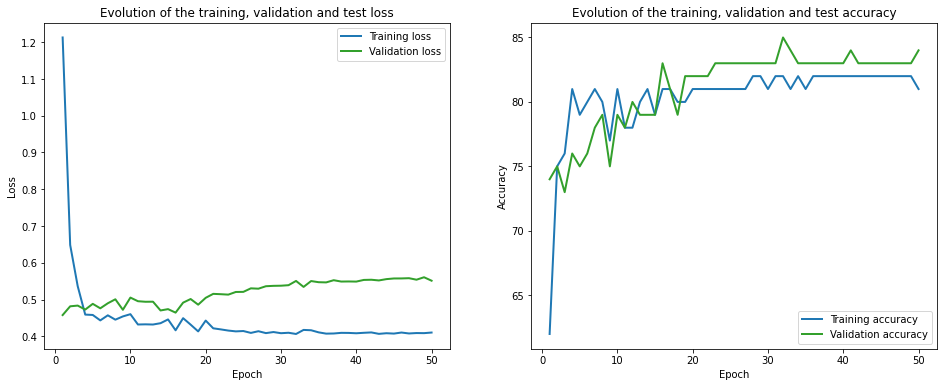

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.05it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 748.23it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.31 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.51 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.66 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.71 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.16 train_acc: 100.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.50 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.83 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
val_loss = 0.39 val_acc = 80.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.10 train_acc: 95.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.36 train_acc: 

Epoch 12 of 50, 90% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
val_loss = 0.39 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.24 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.20 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.49 train_acc: 85.00% took: 0.02s
Epoch 13 of 50, 90% 	 train_loss: 0.48 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.02s
val_loss = 0.39 val_acc = 80.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.06 train_a

Epoch 24 of 50, 80% 	 train_loss: 0.49 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 90% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
val_loss = 0.41 val_acc = 80.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 50% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.22 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.49 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.51 train_acc: 80.00% took: 0.02s
Epoch 25 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
val_loss = 0.38 val_acc = 80.00%
Snaps

Epoch 35 of 50, 100% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
val_loss = 0.40 val_acc = 80.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 36 of 50, 20% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 30% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 40% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 36 of 50, 50% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 60% 	 train_loss: 0.22 train_acc: 85.00% took: 0.00s
Epoch 36 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 36 of 50, 80% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 90% 	 train_loss: 0.46 train_acc: 75.00% took: 0.02s
Epoch 36 of 50, 100% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
val_loss = 0.42 val_acc = 80.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 37 of 50, 20% 	 train_loss: 0.28 train_

Epoch 48 of 50, 100% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
val_loss = 0.42 val_acc = 80.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 50% 	 train_loss: 0.25 train_acc: 85.00% took: 0.02s
Epoch 49 of 50, 60% 	 train_loss: 0.22 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.50 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 90% 	 train_loss: 0.63 train_acc: 70.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.28 train_acc: 85.00% took: 0.02s
val_loss = 0.38 val_acc = 85.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.28 train_

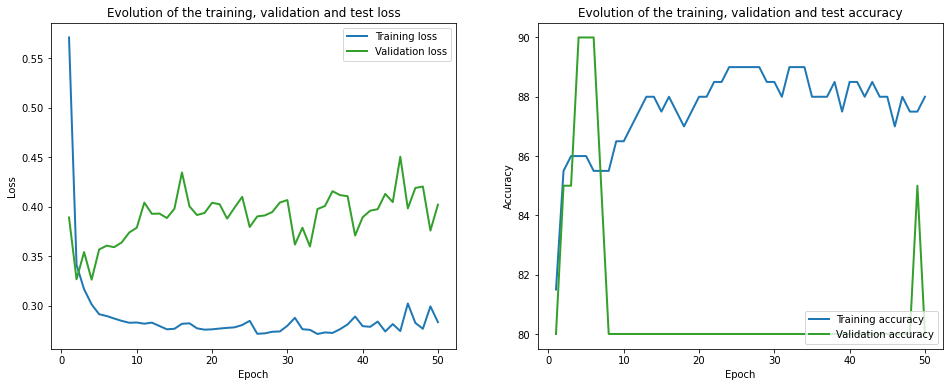

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 108.78it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 685.33it/s]

Finished computing p-values for 500 test points.

Starting repetition 27 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.60 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.41 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 1.35 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.70 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.02 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
val_loss = 0.37 val_acc = 83.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.55 train_acc: 

Epoch 13 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.02s
val_loss = 0.44 val_acc = 79.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.55 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.28 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.41 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.45 val_acc = 80.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.56 train_a

Epoch 27 of 50, 60% 	 train_loss: 0.25 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.21 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
val_loss = 0.43 val_acc = 80.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.55 train_acc: 90.00% took: 0.01s
Epoch 28 of 50, 30% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.22 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 90% 	 train_loss: 0.24 

Epoch 41 of 50, 10% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 20% 	 train_loss: 0.56 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.25 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 70% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 80% 	 train_loss: 0.26 train_acc: 80.00% took: 0.01s
Epoch 41 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 100% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
val_loss = 0.46 val_acc = 82.00%
Snapshot saved at epoch 41.
Epoch 42 of 50, 10% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 42 of 50, 20% 	 train_loss: 0.54 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 42 of 50, 40% 	 train_loss: 0.5

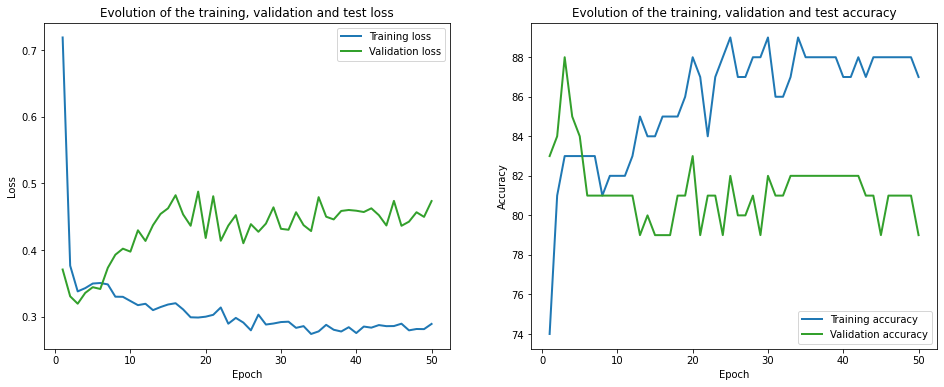

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.20it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 779.84it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.59 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.22 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 1.48 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.49 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.54 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.65 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.64 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.82 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.64 train_acc: 70.00% took: 0.01s
val_loss = 0.45 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.66 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.70 train_acc: 65.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.65 train_acc: 6

Epoch 12 of 50, 10% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 20% 	 train_loss: 0.64 train_acc: 65.00% took: 0.01s
Epoch 12 of 50, 30% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 40% 	 train_loss: 0.56 train_acc: 70.00% took: 0.01s
Epoch 12 of 50, 50% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.53 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.61 train_acc: 65.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.82 train_acc: 65.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.58 train_acc: 65.00% took: 0.01s
val_loss = 0.30 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.59 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.66 train_acc: 65.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.39 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.54 tr

Epoch 25 of 50, 40% 	 train_loss: 0.51 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 50% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.59 train_acc: 60.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.57 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.85 train_acc: 65.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.59 train_acc: 65.00% took: 0.01s
val_loss = 0.35 val_acc = 75.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.66 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.61 train_acc: 65.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.52 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.50 train_acc: 75.00% took: 0.02s
Epoch 26 of 50, 70% 	 train_loss: 0.51 tr

Epoch 36 of 50, 30% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 36 of 50, 40% 	 train_loss: 0.49 train_acc: 75.00% took: 0.01s
Epoch 36 of 50, 50% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 36 of 50, 60% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
Epoch 36 of 50, 70% 	 train_loss: 0.37 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 80% 	 train_loss: 0.72 train_acc: 55.00% took: 0.01s
Epoch 36 of 50, 90% 	 train_loss: 0.65 train_acc: 65.00% took: 0.01s
Epoch 36 of 50, 100% 	 train_loss: 0.66 train_acc: 70.00% took: 0.01s
val_loss = 0.20 val_acc = 95.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.53 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 20% 	 train_loss: 0.63 train_acc: 65.00% took: 0.00s
Epoch 37 of 50, 30% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.52 tr

val_loss = 0.40 val_acc = 60.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.63 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.59 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 30% 	 train_loss: 0.43 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.58 train_acc: 70.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.50 train_acc: 75.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.55 train_acc: 65.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.43 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.76 train_acc: 50.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.65 train_acc: 70.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
val_loss = 0.24 val_acc = 85.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


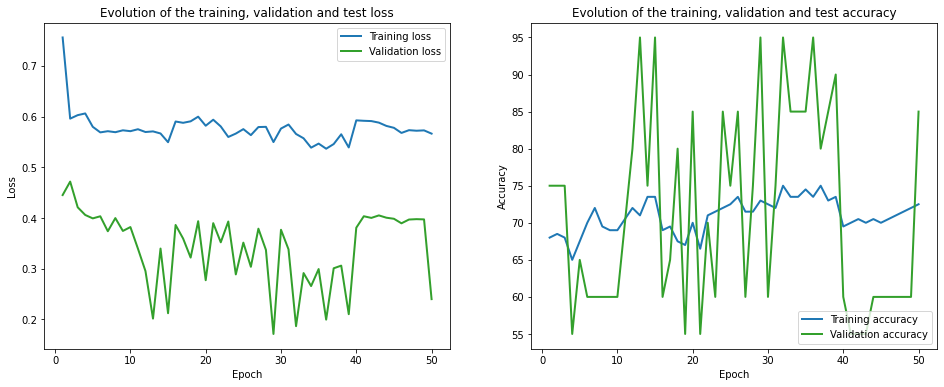

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.21it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 820.16it/s]

Finished computing p-values for 500 test points.

Starting repetition 28 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.14 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.09 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.53 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.52 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.71 train_acc: 60.00% took: 0.00s
val_loss = 0.36 val_acc = 84.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.47 train_acc: 6

Epoch 14 of 50, 10% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.57 train_acc: 60.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.16 train_acc: 100.00% took: 0.01s
Epoch 14 of 50, 100% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
val_loss = 0.38 val_acc = 83.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.57 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.27

Epoch 27 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
val_loss = 0.41 val_acc = 83.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.42 train_acc: 60.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.28 train_acc: 70.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.12

Epoch 38 of 50, 30% 	 train_loss: 0.58 train_acc: 60.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
val_loss = 0.44 val_acc = 81.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.57 train_acc: 60.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.

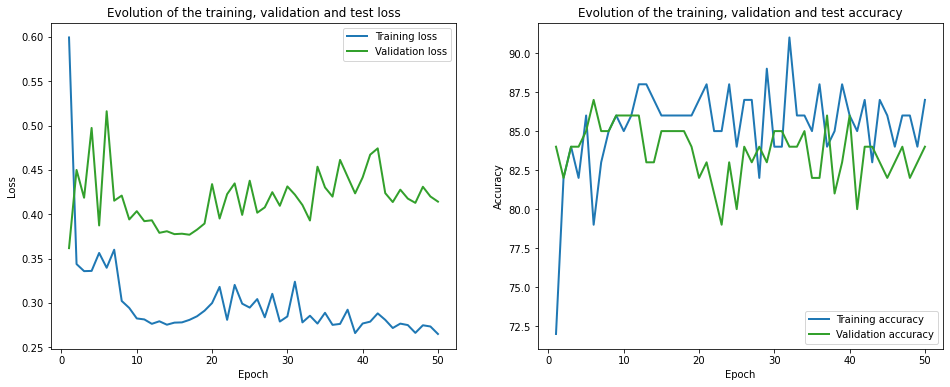

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.49it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 882.25it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.41 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.04 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 1.13 train_acc: 55.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.84 train_acc: 35.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.62 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.58 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.01s
val_loss = 0.73 val_acc = 50.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.39 train_acc: 75.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.31 train_acc: 9

Epoch 14 of 50, 10% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.78 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.55 train_acc: 70.00% took: 0.02s
Epoch 14 of 50, 60% 	 train_loss: 0.93 train_acc: 65.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.50 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 100% 	 train_loss: 0.44 train_acc: 85.00% took: 0.00s
val_loss = 0.56 val_acc = 65.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 20% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 30% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 40% 	 train_loss: 1.04 tr

Epoch 25 of 50, 80% 	 train_loss: 0.56 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.70 train_acc: 60.00% took: 0.00s
val_loss = 0.73 val_acc = 40.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.49 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.43 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.79 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.64 train_acc: 60.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 1.03 train_acc: 60.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.62 train_acc: 65.00% took: 0.01s
val_loss = 0.75 val_acc = 40.00%
Snapsho

Epoch 37 of 50, 90% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
val_loss = 0.69 val_acc = 55.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.87 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.82 train_acc: 60.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 2.25 train_acc: 70.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.52 train_acc: 75.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.47 train_acc: 75.00% took: 0.02s
val_loss = 0.64 val_acc = 60.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.36 train_acc

Epoch 48 of 50, 100% 	 train_loss: 0.56 train_acc: 70.00% took: 0.01s
val_loss = 0.67 val_acc = 50.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.70 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.59 train_acc: 70.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.76 train_acc: 65.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.84 train_acc: 75.00% took: 0.02s
Epoch 49 of 50, 90% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
val_loss = 0.73 val_acc = 45.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.45 train_acc

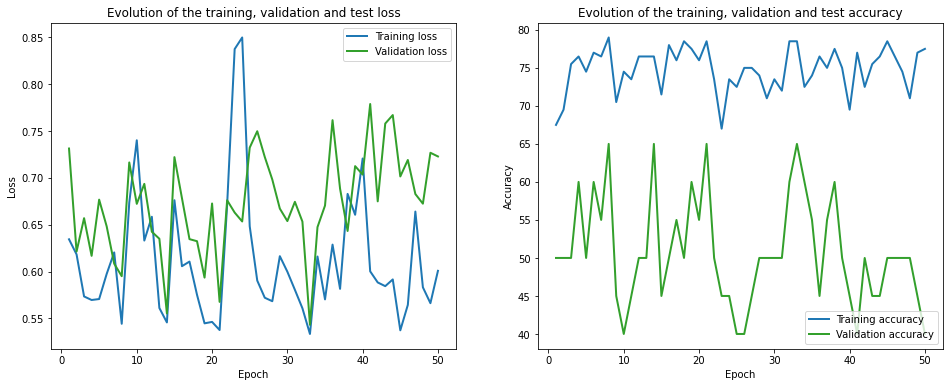

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 136.37it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 746.45it/s]

Finished computing p-values for 500 test points.

Starting repetition 29 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.79 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.32 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.66 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.78 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.83 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.77 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.19 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.60 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
val_loss = 0.42 val_acc = 84.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 1.03 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 3.32 train_acc: 50.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.65 train_acc: 8

Epoch 13 of 50, 70% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 1.13 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.61 train_acc: 70.00% took: 0.01s
val_loss = 0.55 val_acc = 81.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.73 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.53 train_acc: 60.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.44 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 1.11 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 

Epoch 28 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 90% 	 train_loss: 1.33 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.53 val_acc = 81.00%
Snapshot saved at epoch 28.
Epoch 29 of 50, 10% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 20% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 30% 	 train_loss: 0.64 train_acc: 60.00% took: 0.00s
Epoch 29 of 50, 40% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 50% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 29 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 70% 	 train_loss: 0.0

val_loss = 0.51 val_acc = 84.00%
Snapshot saved at epoch 42.
Epoch 43 of 50, 10% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 43 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 30% 	 train_loss: 0.56 train_acc: 60.00% took: 0.00s
Epoch 43 of 50, 40% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 50% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 60% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 70% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 80% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 90% 	 train_loss: 1.42 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 100% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
val_loss = 0.50 val_acc = 85.00%
Snapshot saved at epoch 43.
Epoch 44 of 50, 10% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 30% 	 train_loss: 0.58 train_a

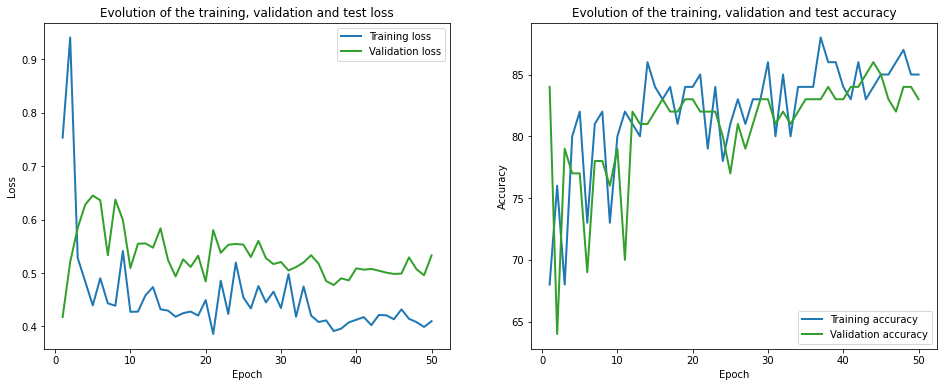

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 127.11it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 963.42it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.57 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 2.68 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.61 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 1.03 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.61 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.63 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
val_loss = 0.61 val_acc = 60.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.72 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.65 train_acc: 6

Epoch 14 of 50, 90% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 100% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
val_loss = 0.46 val_acc = 65.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.74 train_acc: 65.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.65 train_acc: 65.00% took: 0.01s
Epoch 15 of 50, 40% 	 train_loss: 0.58 train_acc: 75.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 60% 	 train_loss: 0.59 train_acc: 70.00% took: 0.01s
Epoch 15 of 50, 70% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 80% 	 train_loss: 0.63 train_acc: 70.00% took: 0.01s
Epoch 15 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
val_loss = 0.52 val_acc = 65.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.32 train_acc

Epoch 26 of 50, 20% 	 train_loss: 0.69 train_acc: 65.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.62 train_acc: 65.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.68 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.61 train_acc: 65.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.35 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.63 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.32 train_acc: 80.00% took: 0.01s
val_loss = 0.49 val_acc = 65.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.69 train_acc: 65.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.63 train_acc: 65.00% took: 0.02s
Epoch 27 of 50, 40% 	 train_loss: 0.61 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.46 tr

Epoch 37 of 50, 90% 	 train_loss: 0.30 train_acc: 95.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.33 train_acc: 75.00% took: 0.01s
val_loss = 0.55 val_acc = 65.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.71 train_acc: 65.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.65 train_acc: 65.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.48 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.60 train_acc: 65.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.63 train_acc: 60.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.02s
Epoch 38 of 50, 100% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
val_loss = 0.38 val_acc = 80.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.31 train_acc

Epoch 49 of 50, 40% 	 train_loss: 0.62 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.60 train_acc: 65.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.62 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 100% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
val_loss = 0.50 val_acc = 65.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.68 train_acc: 65.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.61 train_acc: 65.00% took: 0.02s
Epoch 50 of 50, 40% 	 train_loss: 0.64 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.47 train_acc: 75.00% took: 0.02s
Epoch 50 of 50, 60% 	 train_loss: 0.61 train_acc: 65.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.31 tr

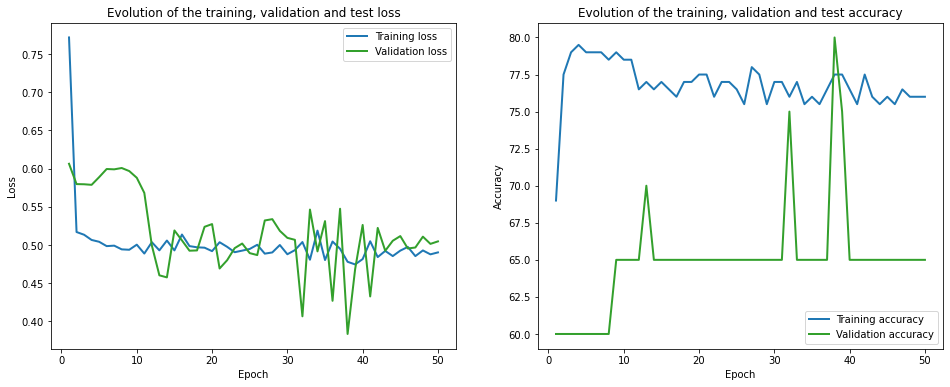

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 134.83it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1000.58it/s]

Finished computing p-values for 500 test points.

Starting repetition 30 of 50:



Training with standard data splitting...


C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.12 train_acc: 10.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 12.56 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 5.98 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 1.22 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.22 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.66 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
val_loss = 0.62 val_acc = 79.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.69 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.35 train_ac

Epoch 13 of 50, 50% 	 train_loss: 0.58 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.57 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
val_loss = 0.53 val_acc = 79.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.57

Epoch 24 of 50, 80% 	 train_loss: 0.57 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 100% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
val_loss = 0.54 val_acc = 78.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 25 of 50, 30% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.61 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 60% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.56 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.54 val_acc = 79.00%
Snap

Epoch 38 of 50, 60% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.54 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
val_loss = 0.51 val_acc = 79.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.20 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.56 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.17 t

Epoch 49 of 50, 50% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 90% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
val_loss = 0.52 val_acc = 79.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.56 t

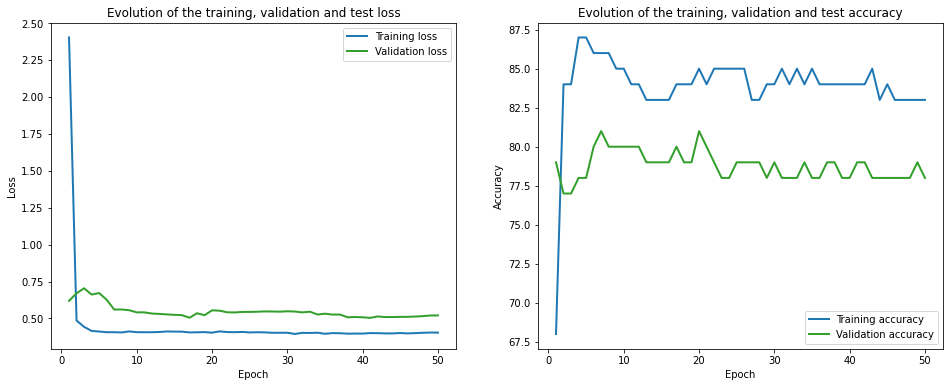

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.55it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 805.08it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.18 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.53 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.63 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 1.07 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.54 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.55 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 4.88 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 6.05 train_acc: 60.00% took: 0.02s
Epoch 1 of 50, 100% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
val_loss = 0.22 val_acc = 100.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.72 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.42 train_acc: 

Epoch 14 of 50, 80% 	 train_loss: 0.66 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 100% 	 train_loss: 0.31 train_acc: 95.00% took: 0.00s
val_loss = 0.09 val_acc = 95.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.64 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 20% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 30% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 15 of 50, 40% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 50% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 60% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.53 train_acc: 75.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.59 train_acc: 65.00% took: 0.02s
Epoch 15 of 50, 90% 	 train_loss: 0.45 train_acc: 75.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.30 train_acc: 95.00% took: 0.02s
val_loss = 0.14 val_acc = 95.00%
Snapsho

val_loss = 0.16 val_acc = 95.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.62 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.19 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.37 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.24 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.71 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.23 train_acc: 95.00% took: 0.01s
val_loss = 0.14 val_acc = 95.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.72 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.27 train_acc: 85.00% took: 0.02s
Epoch 27 of 50, 30% 	 train_loss: 0.26 train_acc:

Epoch 38 of 50, 40% 	 train_loss: 0.43 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.40 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.25 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.78 train_acc: 55.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.42 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
val_loss = 0.23 val_acc = 85.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.64 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 30% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 40% 	 train_loss: 0.42 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 50% 	 train_loss: 0.37 train_acc: 95.00% took: 0.01s
Epoch 39 of 50, 60% 	 train_loss: 0.24 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.47 tr

val_loss = 0.13 val_acc = 95.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.55 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.44 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.41 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.24 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.71 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.24 train_acc: 95.00% took: 0.01s
val_loss = 0.15 val_acc = 95.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


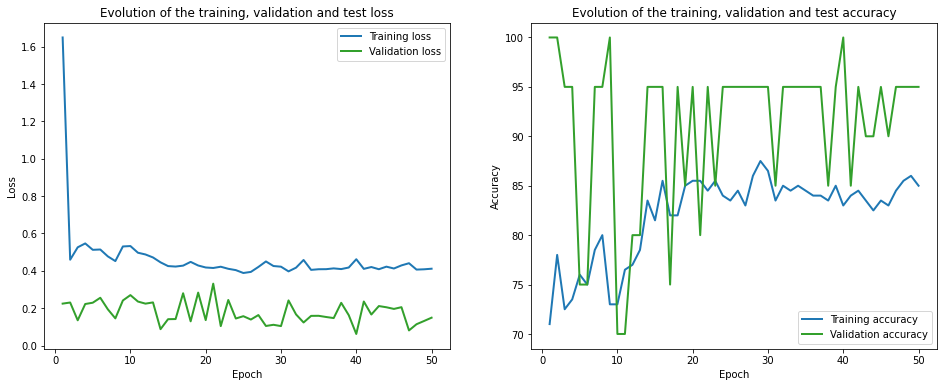

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.43it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 809.25it/s]

Finished computing p-values for 500 test points.

Starting repetition 31 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.78 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.36 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.12 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.69 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.44 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
val_loss = 0.51 val_acc = 78.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.75 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.13 train_acc: 9

Epoch 13 of 50, 10% 	 train_loss: 0.86 train_acc: 30.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.31 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.60 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
val_loss = 0.77 val_acc = 58.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.98 train_acc: 50.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.36 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.14

Epoch 24 of 50, 60% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 100% 	 train_loss: 0.76 train_acc: 70.00% took: 0.00s
val_loss = 0.79 val_acc = 60.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.87 train_acc: 40.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.27 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 60% 	 train_loss: 0.55 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.48 

Epoch 36 of 50, 70% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 80% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 36 of 50, 90% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 100% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
val_loss = 0.79 val_acc = 66.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 20% 	 train_loss: 0.25 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 30% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.59

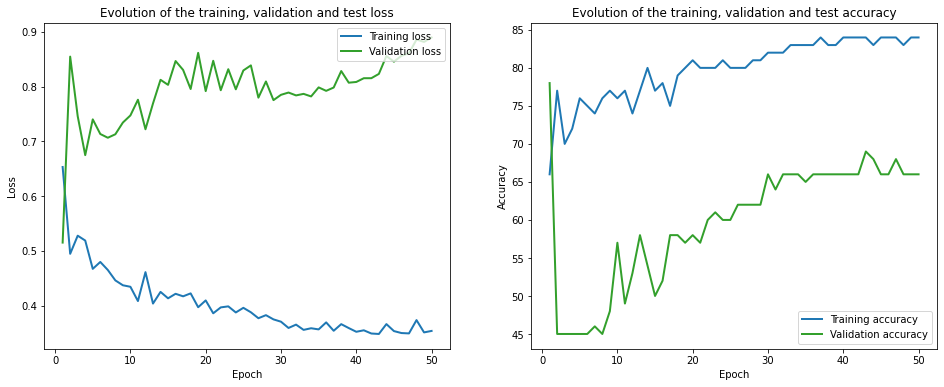

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 113.50it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 702.75it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.72 train_acc: 70.00% took: 0.02s
Epoch 1 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.66 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.29 train_acc: 85.00% took: 0.02s
Epoch 1 of 50, 90% 	 train_loss: 0.97 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.14 train_acc: 95.00% took: 0.00s
val_loss = 1.56 val_acc = 60.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.27 train_acc: 85.00% took: 0.02s
Epoch 2 of 50, 30% 	 train_loss: 0.43 train_acc: 8

Epoch 12 of 50, 30% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.73 train_acc: 65.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.46 train_acc: 70.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
val_loss = 1.69 val_acc = 70.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.24 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.77 train_acc: 65.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.44 tr

Epoch 23 of 50, 40% 	 train_loss: 0.69 train_acc: 65.00% took: 0.01s
Epoch 23 of 50, 50% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
Epoch 23 of 50, 60% 	 train_loss: 0.43 train_acc: 85.00% took: 0.01s
Epoch 23 of 50, 70% 	 train_loss: 0.17 train_acc: 95.00% took: 0.00s
Epoch 23 of 50, 80% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 23 of 50, 90% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 23 of 50, 100% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
val_loss = 1.42 val_acc = 85.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.30 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 30% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 40% 	 train_loss: 0.71 train_acc: 65.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.16 tr

Epoch 34 of 50, 70% 	 train_loss: 0.12 train_acc: 95.00% took: 0.01s
Epoch 34 of 50, 80% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 34 of 50, 90% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 34 of 50, 100% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
val_loss = 1.30 val_acc = 80.00%
Snapshot saved at epoch 34.
Epoch 35 of 50, 10% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 20% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 30% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 35 of 50, 40% 	 train_loss: 0.75 train_acc: 70.00% took: 0.01s
Epoch 35 of 50, 50% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 35 of 50, 70% 	 train_loss: 0.13 train_acc: 95.00% took: 0.01s
Epoch 35 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 35 of 50, 90% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 100% 	 train_loss: 0.18 t

Epoch 47 of 50, 70% 	 train_loss: 0.12 train_acc: 95.00% took: 0.01s
Epoch 47 of 50, 80% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 47 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 47 of 50, 100% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
val_loss = 1.37 val_acc = 85.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 20% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 30% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 40% 	 train_loss: 0.67 train_acc: 65.00% took: 0.01s
Epoch 48 of 50, 50% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 60% 	 train_loss: 0.39 train_acc: 90.00% took: 0.01s
Epoch 48 of 50, 70% 	 train_loss: 0.12 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 80% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 100% 	 train_loss: 0.19 t

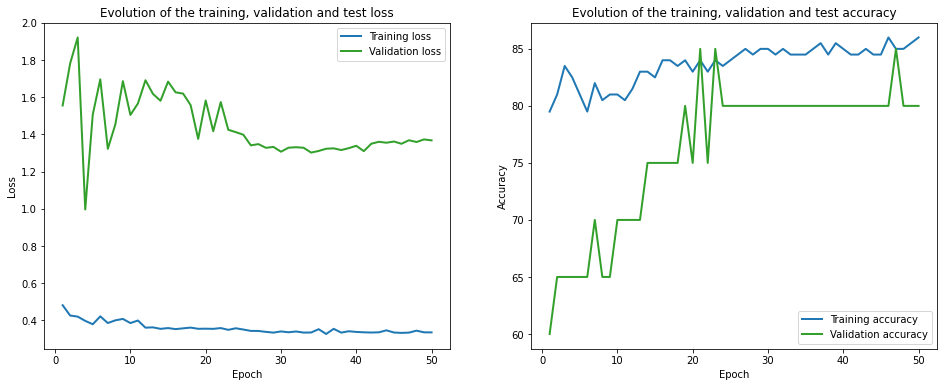

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.65it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 942.81it/s]

Finished computing p-values for 500 test points.

Starting repetition 32 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.65 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.75 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 3.78 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.56 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.86 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.86 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
val_loss = 0.48 val_acc = 76.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.60 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.75 train_acc: 2

Epoch 14 of 50, 30% 	 train_loss: 0.86 train_acc: 40.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.64 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.44 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
val_loss = 0.40 val_acc = 84.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.85 train_acc: 40.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.65 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.56 t

Epoch 25 of 50, 40% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.63 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 60% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
val_loss = 0.41 val_acc = 83.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 20% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.77 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.67 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.36 

Epoch 39 of 50, 80% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
val_loss = 0.41 val_acc = 87.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.88 train_acc: 60.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 50% 	 train_loss: 0.61 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 60% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 70% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 80% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 90% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 100% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
val_loss = 0.41 val_acc = 89.00%
Snap

Epoch 50 of 50, 100% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
val_loss = 0.47 val_acc = 88.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


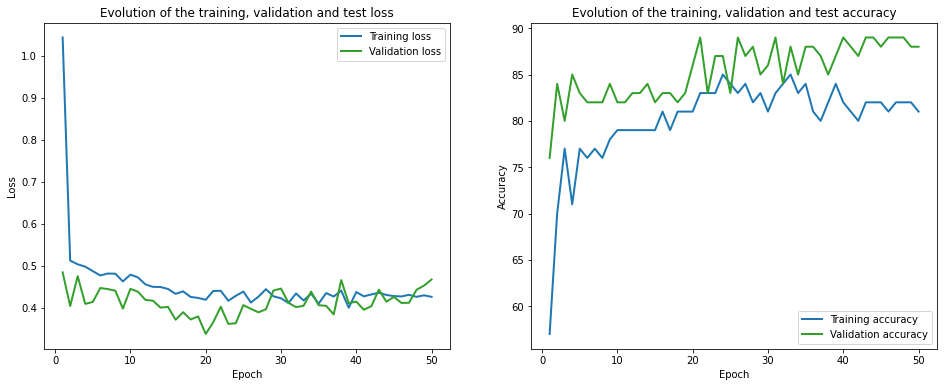

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 116.31it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 939.61it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.21 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.90 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.50 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.63 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.67 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.22 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
val_loss = 0.47 val_acc = 80.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.53 train_acc: 

Epoch 14 of 50, 100% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
val_loss = 0.42 val_acc = 85.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.15 train_acc: 95.00% took: 0.01s
Epoch 15 of 50, 30% 	 train_loss: 0.55 train_acc: 85.00% took: 0.01s
Epoch 15 of 50, 40% 	 train_loss: 0.34 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 50% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 70% 	 train_loss: 0.68 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 80% 	 train_loss: 0.75 train_acc: 75.00% took: 0.01s
Epoch 15 of 50, 90% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
Epoch 15 of 50, 100% 	 train_loss: 0.07 train_acc: 100.00% took: 0.01s
val_loss = 0.40 val_acc = 85.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 16 of 50, 20% 	 train_loss: 0.15 train_a

Epoch 26 of 50, 50% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.52 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.70 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.15 train_acc: 100.00% took: 0.01s
Epoch 26 of 50, 100% 	 train_loss: 0.07 train_acc: 100.00% took: 0.01s
val_loss = 0.36 val_acc = 90.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.16 train_acc: 95.00% took: 0.01s
Epoch 27 of 50, 30% 	 train_loss: 0.60 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.28 train_acc: 85.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.31 train_acc: 80.00% took: 0.02s
Epoch 27 of 50, 60% 	 train_loss: 0.53 train_acc: 75.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.73 

Epoch 37 of 50, 70% 	 train_loss: 0.61 train_acc: 70.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.70 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.17 train_acc: 95.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.07 train_acc: 100.00% took: 0.01s
val_loss = 0.34 val_acc = 90.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.58 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.52 train_acc: 75.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.65 train_acc: 75.00% took: 0.02s
Epoch 38 of 50, 80% 	 train_loss: 0.74 train_acc: 75.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.18 train_acc: 95.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.07 

Epoch 48 of 50, 70% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
Epoch 48 of 50, 80% 	 train_loss: 0.65 train_acc: 70.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 48 of 50, 100% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
val_loss = 0.37 val_acc = 85.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 20% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.57 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.30 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 60% 	 train_loss: 0.53 train_acc: 75.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.61 train_acc: 75.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.70 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 90% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.07 

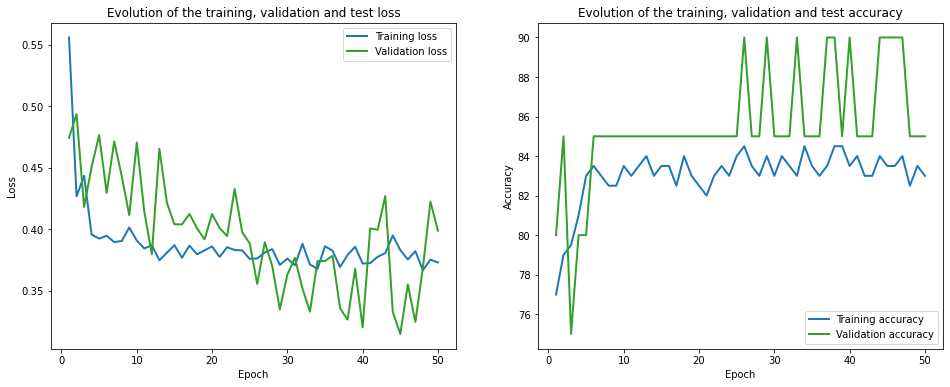

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 131.89it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1252.10it/s]

Finished computing p-values for 500 test points.

Starting repetition 33 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.10 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 2.25 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 2.51 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.70 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 2.85 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 2.94 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 1.17 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.92 train_acc: 30.00% took: 0.00s
val_loss = 0.60 val_acc = 78.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.38 train_acc: 7

Epoch 15 of 50, 100% 	 train_loss: 0.71 train_acc: 60.00% took: 0.00s
val_loss = 0.56 val_acc = 78.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 16 of 50, 30% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.70 train_acc: 50.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.30 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.78 train_acc: 50.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.70 train_acc: 60.00% took: 0.00s
val_loss = 0.56 val_acc = 79.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.34 train_ac

Epoch 30 of 50, 10% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 30 of 50, 20% 	 train_loss: 0.22 train_acc: 100.00% took: 0.01s
Epoch 30 of 50, 30% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 40% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 50% 	 train_loss: 0.71 train_acc: 50.00% took: 0.00s
Epoch 30 of 50, 60% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 70% 	 train_loss: 0.57 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 80% 	 train_loss: 0.27 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 90% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 100% 	 train_loss: 0.72 train_acc: 80.00% took: 0.00s
val_loss = 0.51 val_acc = 81.00%
Snapshot saved at epoch 30.
Epoch 31 of 50, 10% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 31 of 50, 20% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 31 of 50, 30% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 31 of 50, 40% 	 train_loss: 0.6

Epoch 41 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.52 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.64 train_acc: 50.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 70% 	 train_loss: 0.55 train_acc: 60.00% took: 0.00s
Epoch 41 of 50, 80% 	 train_loss: 0.33 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 90% 	 train_loss: 0.70 train_acc: 50.00% took: 0.00s
Epoch 41 of 50, 100% 	 train_loss: 0.73 train_acc: 60.00% took: 0.00s
val_loss = 0.56 val_acc = 77.00%
Snapshot saved at epoch 41.
Epoch 42 of 50, 10% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 20% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 42 of 50, 40% 	 train_loss: 0.58 train_acc: 60.00% took: 0.00s
Epoch 42 of 50, 50% 	 train_loss: 0.65 t

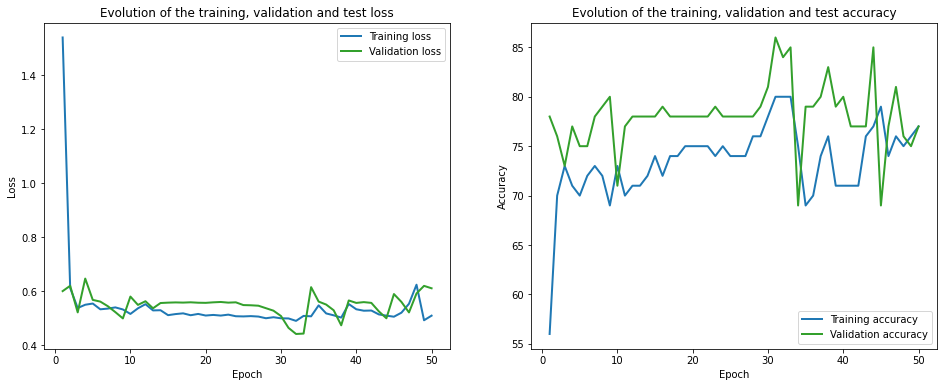

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 141.48it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1040.23it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 2.59 train_acc: 35.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.51 train_acc: 45.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.39 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.40 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.15 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 1.11 train_acc: 55.00% took: 0.01s
val_loss = 0.12 val_acc = 100.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.70 train_acc: 65.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.38 train_acc: 

Epoch 12 of 50, 40% 	 train_loss: 0.25 train_acc: 90.00% took: 0.02s
Epoch 12 of 50, 50% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.35 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.14 train_acc: 95.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.78 train_acc: 55.00% took: 0.01s
val_loss = 0.18 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.51 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.53 train_acc: 65.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.25 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.29 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.29 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.49 tr

Epoch 24 of 50, 10% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 20% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.24 train_acc: 95.00% took: 0.00s
Epoch 24 of 50, 40% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 70% 	 train_loss: 0.49 train_acc: 70.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 90% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.61 train_acc: 55.00% took: 0.01s
val_loss = 0.18 val_acc = 80.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.46 train_acc: 80.00% took: 0.02s
Epoch 25 of 50, 20% 	 train_loss: 0.52 train_acc: 60.00% took: 0.00s
Epoch 25 of 50, 30% 	 train_loss: 0.31 train_acc: 70.00% took: 0.02s
Epoch 25 of 50, 40% 	 train_loss: 0.28 tr

Epoch 35 of 50, 60% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 35 of 50, 70% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 80% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 90% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 35 of 50, 100% 	 train_loss: 0.58 train_acc: 65.00% took: 0.01s
val_loss = 0.17 val_acc = 80.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
Epoch 36 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 30% 	 train_loss: 0.25 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 40% 	 train_loss: 0.23 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 50% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 36 of 50, 60% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 36 of 50, 70% 	 train_loss: 0.48 train_acc: 70.00% took: 0.01s
Epoch 36 of 50, 80% 	 train_loss: 0.17 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 90% 	 train_loss: 0.19 tr

Epoch 47 of 50, 20% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 47 of 50, 30% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
Epoch 47 of 50, 40% 	 train_loss: 0.22 train_acc: 95.00% took: 0.00s
Epoch 47 of 50, 50% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 47 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 47 of 50, 70% 	 train_loss: 0.40 train_acc: 75.00% took: 0.00s
Epoch 47 of 50, 80% 	 train_loss: 0.24 train_acc: 90.00% took: 0.02s
Epoch 47 of 50, 90% 	 train_loss: 0.24 train_acc: 80.00% took: 0.01s
Epoch 47 of 50, 100% 	 train_loss: 0.68 train_acc: 75.00% took: 0.00s
val_loss = 0.15 val_acc = 100.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 20% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 30% 	 train_loss: 0.26 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 40% 	 train_loss: 0.21 train_acc: 95.00% took: 0.00s
Epoch 48 of 50, 50% 	 train_loss: 0.18 t

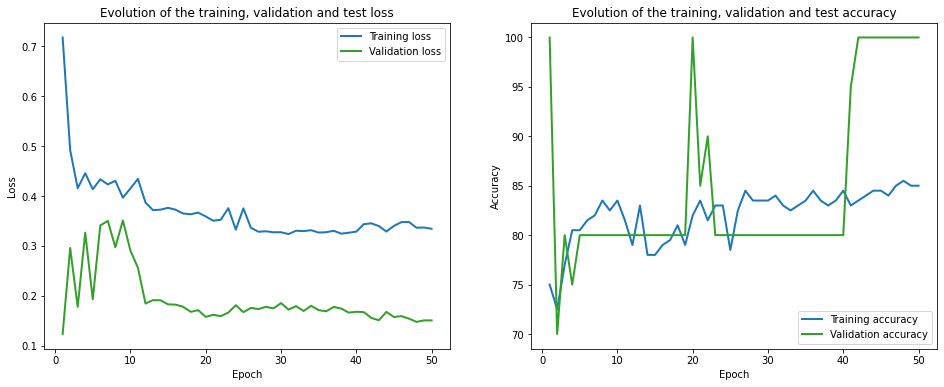

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.86it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1011.01it/s]

Finished computing p-values for 500 test points.

Starting repetition 34 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.77 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.36 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.25 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.71 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 2.45 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 1.22 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.47 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.75 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.64 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.55 train_acc: 60.00% took: 0.00s
val_loss = 0.43 val_acc = 83.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.29 train_acc: 

Epoch 15 of 50, 10% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.65 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.54 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
val_loss = 0.36 val_acc = 81.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.22

Epoch 30 of 50, 10% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 30% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 40% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 30 of 50, 50% 	 train_loss: 0.64 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 60% 	 train_loss: 0.52 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 80% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 90% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 30 of 50, 100% 	 train_loss: 0.65 train_acc: 70.00% took: 0.00s
val_loss = 0.36 val_acc = 81.00%
Snapshot saved at epoch 30.
Epoch 31 of 50, 10% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 31 of 50, 20% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 31 of 50, 30% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 31 of 50, 40% 	 train_loss: 0.24 

Epoch 44 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 44 of 50, 90% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 44 of 50, 100% 	 train_loss: 0.67 train_acc: 70.00% took: 0.00s
val_loss = 0.36 val_acc = 82.00%
Snapshot saved at epoch 44.
Epoch 45 of 50, 10% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 20% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 30% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 45 of 50, 40% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 50% 	 train_loss: 0.62 train_acc: 70.00% took: 0.01s
Epoch 45 of 50, 60% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 45 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 45 of 50, 90% 	 train_loss: 0.51 train_acc: 80.00% took: 0.00s
Epoch 45 of 50, 100% 	 train_loss: 0.68 train_acc: 70.00% took: 0.00s
val_loss = 0.36 val_acc = 82.00%
Snapsh

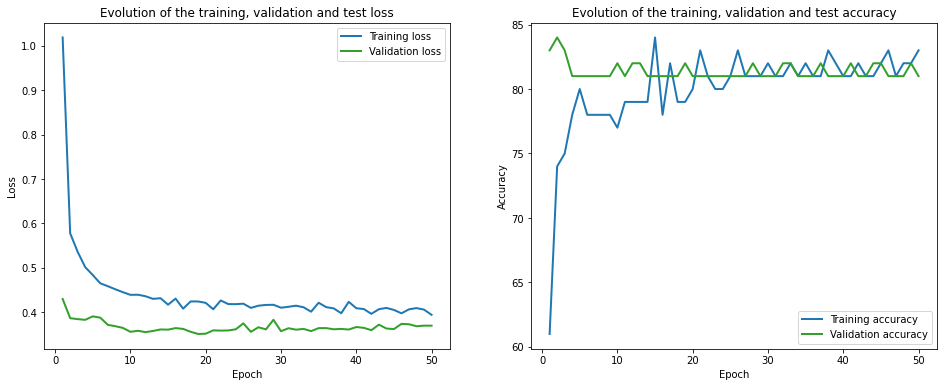

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 128.23it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 845.12it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.78 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.49 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.85 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.08 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.47 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.92 train_acc: 90.00% took: 0.01s
val_loss = 0.09 val_acc = 100.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.62 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.20 train_acc: 

Epoch 13 of 50, 70% 	 train_loss: 0.16 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.08 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.51 train_acc: 95.00% took: 0.01s
val_loss = 0.14 val_acc = 95.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.55 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.39 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.60 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.19 train_acc: 95.00% took: 0.02s
Epoch 14 of 50, 80% 	 train_loss: 0.08 train_acc: 95.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.58 t

Epoch 25 of 50, 60% 	 train_loss: 0.60 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.23 train_acc: 95.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.12 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.52 train_acc: 95.00% took: 0.01s
val_loss = 0.20 val_acc = 80.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.57 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.32 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.22 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.25 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.67 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.10 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.27 tr

Epoch 36 of 50, 40% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 50% 	 train_loss: 0.24 train_acc: 85.00% took: 0.00s
Epoch 36 of 50, 60% 	 train_loss: 0.66 train_acc: 85.00% took: 0.01s
Epoch 36 of 50, 70% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 80% 	 train_loss: 0.11 train_acc: 95.00% took: 0.01s
Epoch 36 of 50, 90% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 36 of 50, 100% 	 train_loss: 0.52 train_acc: 90.00% took: 0.01s
val_loss = 0.19 val_acc = 85.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 20% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 50% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.60 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.24 tr

Epoch 48 of 50, 40% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 48 of 50, 50% 	 train_loss: 0.22 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 60% 	 train_loss: 0.63 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 70% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 80% 	 train_loss: 0.10 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 100% 	 train_loss: 0.55 train_acc: 95.00% took: 0.01s
val_loss = 0.17 val_acc = 85.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.41 train_acc: 75.00% took: 0.00s
Epoch 49 of 50, 30% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.25 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.60 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.22 tr

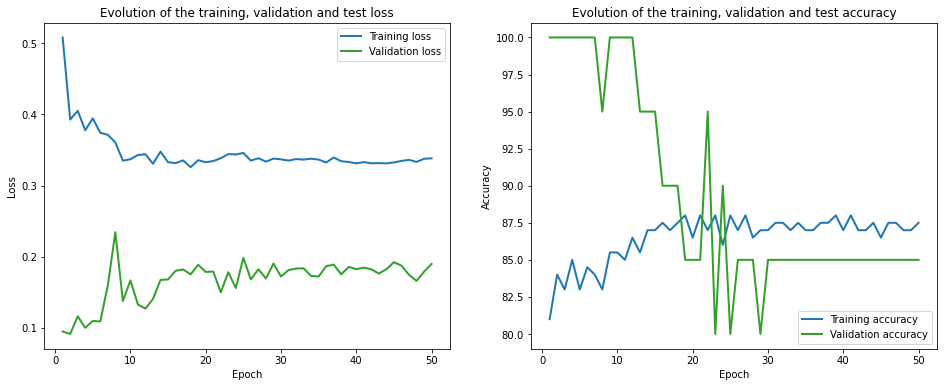

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 154.97it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1026.94it/s]

Finished computing p-values for 500 test points.

Starting repetition 35 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.76 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.06 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.92 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.79 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.40 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.57 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.41 train_acc: 70.00% took: 0.00s
val_loss = 0.57 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.45 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.29 train_acc: 8

Epoch 15 of 50, 10% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.69 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.61 train_acc: 60.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
val_loss = 0.67 val_acc = 74.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.44 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.30 

Epoch 26 of 50, 20% 	 train_loss: 0.65 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.54 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.34 train_acc: 70.00% took: 0.00s
val_loss = 0.71 val_acc = 78.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.33 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.65 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.14 t

Epoch 41 of 50, 20% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 30% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 40% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 50% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 41 of 50, 60% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 70% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 41 of 50, 80% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 41 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 41 of 50, 100% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
val_loss = 0.77 val_acc = 78.00%
Snapshot saved at epoch 41.
Epoch 42 of 50, 10% 	 train_loss: 0.35 train_acc: 70.00% took: 0.00s
Epoch 42 of 50, 20% 	 train_loss: 0.65 train_acc: 70.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 40% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 50% 	 train_loss: 0.13 t

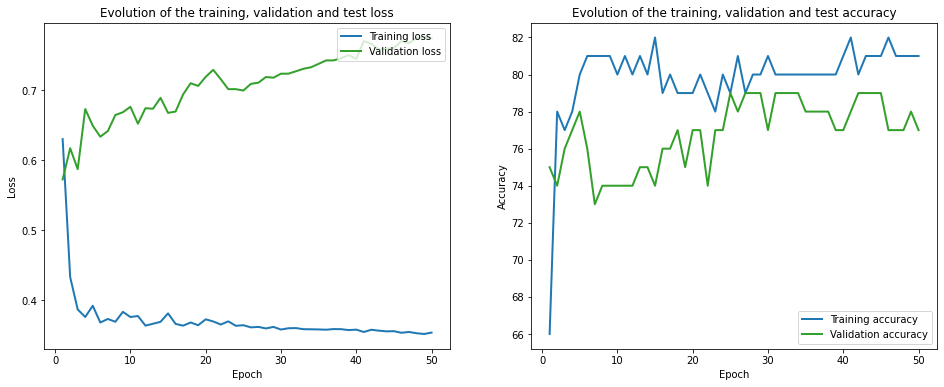

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.69it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1243.29it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.14 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.66 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.96 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.52 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.42 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.25 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.59 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.49 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.72 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.77 train_acc: 45.00% took: 0.01s
val_loss = 0.31 val_acc = 70.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.49 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.49 train_acc: 7

val_loss = 0.38 val_acc = 75.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.41 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.25 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.26 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.34 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.37 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.58 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
val_loss = 0.37 val_acc = 75.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.41 train_acc: 70.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.23 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.27 train_acc:

Epoch 24 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
val_loss = 0.44 val_acc = 75.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.47 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.29 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 50% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.26 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.38 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.40 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
val_loss = 0.44 val_acc = 75.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.42 train_acc

Epoch 36 of 50, 70% 	 train_loss: 0.32 train_acc: 70.00% took: 0.00s
Epoch 36 of 50, 80% 	 train_loss: 0.40 train_acc: 75.00% took: 0.00s
Epoch 36 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 100% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
val_loss = 0.42 val_acc = 75.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.38 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 20% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.28 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 50% 	 train_loss: 0.48 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.32 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.40 train_acc: 75.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.29 t

Epoch 48 of 50, 50% 	 train_loss: 0.51 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 60% 	 train_loss: 0.21 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 70% 	 train_loss: 0.32 train_acc: 75.00% took: 0.00s
Epoch 48 of 50, 80% 	 train_loss: 0.38 train_acc: 75.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.50 train_acc: 75.00% took: 0.00s
Epoch 48 of 50, 100% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
val_loss = 0.38 val_acc = 75.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 30% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 40% 	 train_loss: 0.35 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.57 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.18 train_acc: 85.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.36 train_acc: 75.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.45 tr

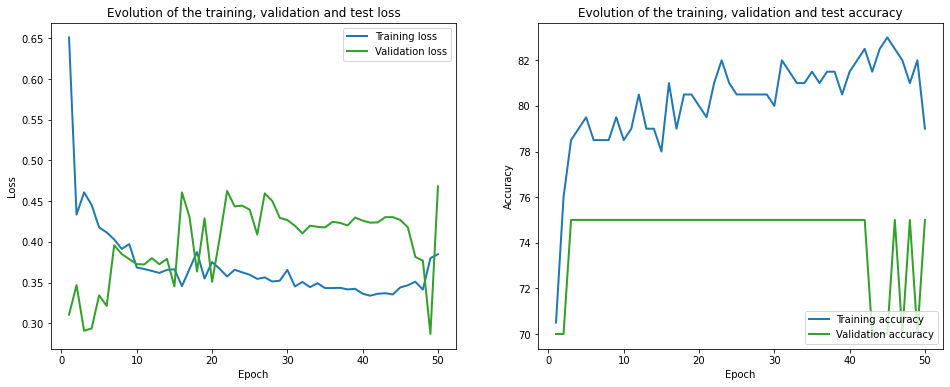

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 115.27it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 844.35it/s]

Finished computing p-values for 500 test points.

Starting repetition 36 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.76 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 5.65 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 2.00 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.44 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.46 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.19 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.65 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
val_loss = 0.77 val_acc = 64.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.78 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.86 train_acc: 40.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.65 train_acc: 

Epoch 16 of 50, 60% 	 train_loss: 0.43 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.99 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.56 train_acc: 60.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
val_loss = 0.98 val_acc = 78.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.70 train_acc: 80.00% took: 0.01s
Epoch 17 of 50, 20% 	 train_loss: 0.80 train_acc: 40.00% took: 0.00s
Epoch 17 of 50, 30% 	 train_loss: 0.67 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 40% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 50% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 60% 	 train_loss: 0.41 train_acc: 90.00% took: 0.01s
Epoch 17 of 50, 70% 	 train_loss: 1.02 train_acc: 70.00% took: 0.00s
Epoch 17 of 50, 80% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 90% 	 train_loss: 0.57 tr

Epoch 31 of 50, 40% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 31 of 50, 50% 	 train_loss: 0.51 train_acc: 60.00% took: 0.00s
Epoch 31 of 50, 60% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 31 of 50, 70% 	 train_loss: 0.69 train_acc: 70.00% took: 0.00s
Epoch 31 of 50, 80% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 31 of 50, 90% 	 train_loss: 0.59 train_acc: 60.00% took: 0.00s
Epoch 31 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
val_loss = 1.12 val_acc = 79.00%
Snapshot saved at epoch 31.
Epoch 32 of 50, 10% 	 train_loss: 0.70 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 20% 	 train_loss: 0.81 train_acc: 40.00% took: 0.00s
Epoch 32 of 50, 30% 	 train_loss: 0.72 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 40% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 50% 	 train_loss: 0.49 train_acc: 60.00% took: 0.00s
Epoch 32 of 50, 60% 	 train_loss: 0.47 train_acc: 90.00% took: 0.00s
Epoch 32 of 50, 70% 	 train_loss: 0.88 tr

Epoch 46 of 50, 80% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 90% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
Epoch 46 of 50, 100% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
val_loss = 1.22 val_acc = 80.00%
Snapshot saved at epoch 46.
Epoch 47 of 50, 10% 	 train_loss: 0.68 train_acc: 90.00% took: 0.00s
Epoch 47 of 50, 20% 	 train_loss: 0.79 train_acc: 50.00% took: 0.00s
Epoch 47 of 50, 30% 	 train_loss: 0.71 train_acc: 70.00% took: 0.00s
Epoch 47 of 50, 40% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 47 of 50, 50% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 47 of 50, 60% 	 train_loss: 0.41 train_acc: 100.00% took: 0.00s
Epoch 47 of 50, 70% 	 train_loss: 1.09 train_acc: 40.00% took: 0.00s
Epoch 47 of 50, 80% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 47 of 50, 90% 	 train_loss: 0.70 train_acc: 60.00% took: 0.00s
Epoch 47 of 50, 100% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
val_loss = 1.23 val_acc = 79.00%
Snapsh

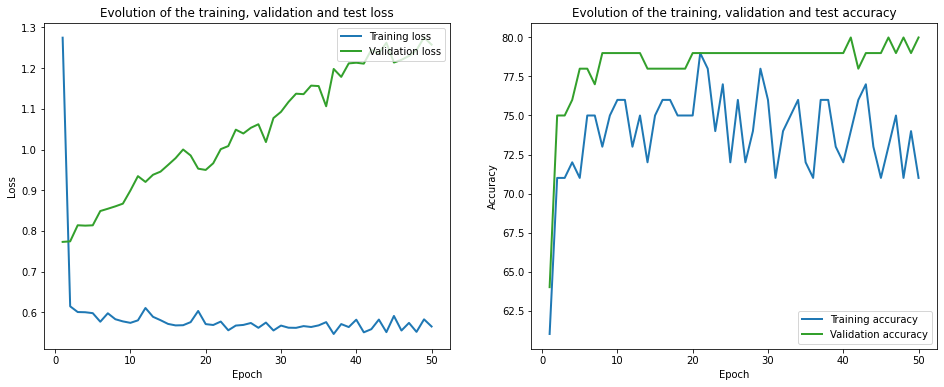

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.06it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 862.08it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.51 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.83 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.81 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.32 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.42 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.29 train_acc: 95.00% took: 0.01s
val_loss = 0.20 val_acc = 95.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.12 train_acc: 95.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.23 train_acc: 9

Epoch 12 of 50, 30% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 40% 	 train_loss: 0.38 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 50% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.25 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.24 train_acc: 95.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
val_loss = 0.18 val_acc = 100.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.07 train_acc: 100.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.34 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.27 

Epoch 23 of 50, 90% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 23 of 50, 100% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
val_loss = 0.22 val_acc = 95.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.06 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 20% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 40% 	 train_loss: 0.29 train_acc: 75.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 60% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 70% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 100% 	 train_loss: 0.15 train_acc: 90.00% took: 0.02s
val_loss = 0.21 val_acc = 100.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.07 train_ac

Epoch 35 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 40% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 50% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 60% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 35 of 50, 70% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 80% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 35 of 50, 90% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 35 of 50, 100% 	 train_loss: 0.12 train_acc: 95.00% took: 0.00s
val_loss = 0.25 val_acc = 70.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 36 of 50, 20% 	 train_loss: 0.32 train_acc: 75.00% took: 0.00s
Epoch 36 of 50, 30% 	 train_loss: 0.23 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 40% 	 train_loss: 0.28 train_acc: 80.00% took: 0.02s
Epoch 36 of 50, 50% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
Epoch 36 of 50, 60% 	 train_loss: 0.22 t

Epoch 47 of 50, 30% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 47 of 50, 40% 	 train_loss: 0.28 train_acc: 80.00% took: 0.01s
Epoch 47 of 50, 50% 	 train_loss: 0.28 train_acc: 85.00% took: 0.00s
Epoch 47 of 50, 60% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 47 of 50, 70% 	 train_loss: 0.39 train_acc: 85.00% took: 0.00s
Epoch 47 of 50, 80% 	 train_loss: 0.26 train_acc: 85.00% took: 0.01s
Epoch 47 of 50, 90% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 47 of 50, 100% 	 train_loss: 0.11 train_acc: 90.00% took: 0.01s
val_loss = 0.25 val_acc = 95.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.05 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 20% 	 train_loss: 0.33 train_acc: 75.00% took: 0.01s
Epoch 48 of 50, 30% 	 train_loss: 0.23 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 40% 	 train_loss: 0.27 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 50% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 60% 	 train_loss: 0.20 tr

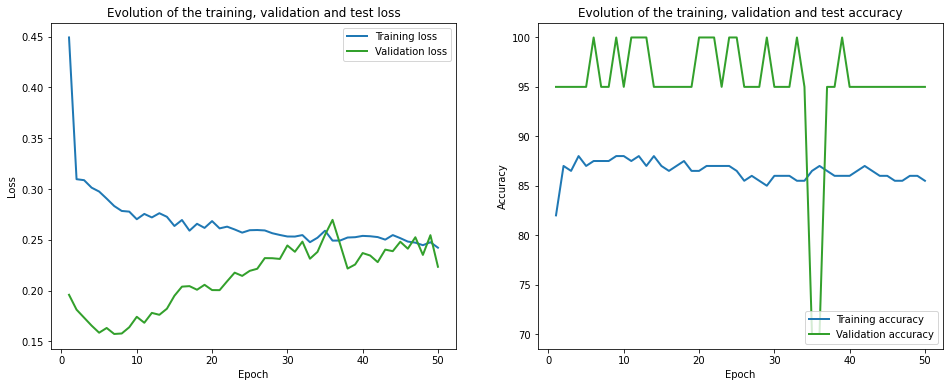

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 132.98it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1126.58it/s]

Finished computing p-values for 500 test points.

Starting repetition 37 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.36 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 3.14 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 2.42 train_acc: 40.00% took: 0.02s
Epoch 1 of 50, 40% 	 train_loss: 10.95 train_acc: 30.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 4.49 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 14.48 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.95 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 19.37 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 4.98 train_acc: 70.00% took: 0.00s
val_loss = 1.30 val_acc = 78.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 2.91 train_acc: 50.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.46 train_ac

Epoch 16 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
val_loss = 0.43 val_acc = 75.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.68 train_acc: 50.00% took: 0.01s
Epoch 17 of 50, 30% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 40% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 50% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 60% 	 train_loss: 0.54 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 70% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 80% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 90% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 100% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
val_loss = 0.45 val_acc = 77.00%
Snap

Epoch 32 of 50, 70% 	 train_loss: 0.16 train_acc: 100.00% took: 0.02s
Epoch 32 of 50, 80% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 90% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 32 of 50, 100% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
val_loss = 0.48 val_acc = 75.00%
Snapshot saved at epoch 32.
Epoch 33 of 50, 10% 	 train_loss: 0.73 train_acc: 60.00% took: 0.01s
Epoch 33 of 50, 20% 	 train_loss: 0.75 train_acc: 60.00% took: 0.00s
Epoch 33 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 40% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 50% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 33 of 50, 60% 	 train_loss: 0.54 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 70% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 33 of 50, 80% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 33 of 50, 90% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 33 of 50, 100% 	 train_loss: 0.29

val_loss = 0.53 val_acc = 74.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 48 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 48 of 50, 30% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 48 of 50, 40% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 48 of 50, 50% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 48 of 50, 60% 	 train_loss: 0.52 train_acc: 90.00% took: 0.00s
Epoch 48 of 50, 70% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 48 of 50, 80% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 48 of 50, 90% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 48 of 50, 100% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
val_loss = 0.56 val_acc = 75.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.84 train_acc: 60.00% took: 0.00s
Epoch 49 of 50, 20% 	 train_loss: 0.74 train_acc: 50.00% took: 0.00s
Epoch 49 of 50, 30% 	 train_loss: 0.23 train_ac

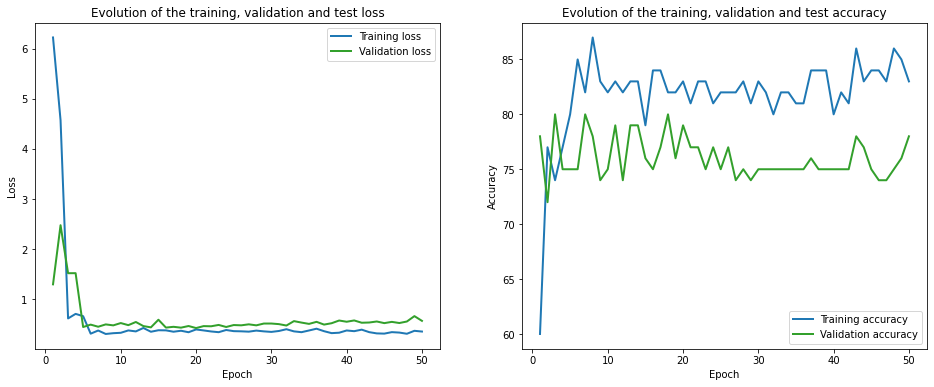

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 126.20it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1093.17it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.10 train_acc: 45.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.26 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.55 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.60 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.64 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.59 train_acc: 90.00% took: 0.01s
val_loss = 0.32 val_acc = 85.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.19 train_acc: 9

Epoch 14 of 50, 20% 	 train_loss: 0.34 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.19 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.83 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.19 train_acc: 100.00% took: 0.01s
val_loss = 0.60 val_acc = 75.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 15 of 50, 20% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.21 train_acc: 90.00% took: 0.02s
Epoch 15 of 50, 50% 	 train_loss: 0.19 t

Epoch 25 of 50, 40% 	 train_loss: 0.21 train_acc: 95.00% took: 0.02s
Epoch 25 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 60% 	 train_loss: 0.59 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.39 train_acc: 75.00% took: 0.02s
Epoch 25 of 50, 80% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.16 train_acc: 95.00% took: 0.02s
val_loss = 0.50 val_acc = 85.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.20 train_acc: 90.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.22 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.56 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.41 tr

Epoch 37 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.02s
Epoch 37 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.59 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.36 train_acc: 75.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.39 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.18 train_acc: 95.00% took: 0.02s
val_loss = 0.35 val_acc = 90.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.34 train_acc: 80.00% took: 0.02s
Epoch 38 of 50, 30% 	 train_loss: 0.15 train_acc: 95.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.24 train_acc: 95.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.22 tr

val_loss = 0.34 val_acc = 90.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.26 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.56 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.32 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.38 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
val_loss = 0.35 val_acc = 90.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


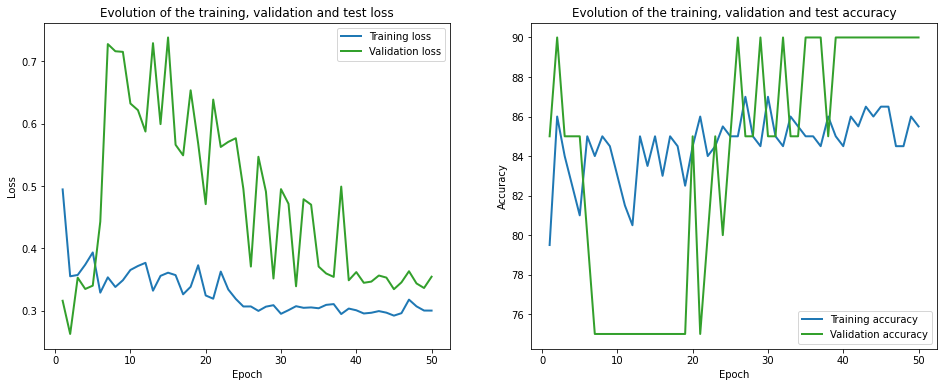

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.86it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 857.52it/s]

Finished computing p-values for 500 test points.

Starting repetition 38 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.68 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.84 train_acc: 70.00% took: 0.02s
Epoch 1 of 50, 30% 	 train_loss: 0.21 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.42 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.44 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.82 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.71 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
val_loss = 0.75 val_acc = 74.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.24 train_acc: 9

Epoch 14 of 50, 50% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 100% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
val_loss = 0.77 val_acc = 67.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.18 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.38 

val_loss = 1.05 val_acc = 71.00%
Snapshot saved at epoch 28.
Epoch 29 of 50, 10% 	 train_loss: 0.44 train_acc: 70.00% took: 0.00s
Epoch 29 of 50, 20% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 29 of 50, 30% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 40% 	 train_loss: 0.10 train_acc: 90.00% took: 0.01s
Epoch 29 of 50, 50% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 29 of 50, 60% 	 train_loss: 0.26 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 70% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 80% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 29 of 50, 90% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 29 of 50, 100% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
val_loss = 1.10 val_acc = 72.00%
Snapshot saved at epoch 29.
Epoch 30 of 50, 10% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 30 of 50, 20% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 30 of 50, 30% 	 train_loss: 0.20 train_ac

Epoch 42 of 50, 70% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 80% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 90% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 42 of 50, 100% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
val_loss = 1.28 val_acc = 66.00%
Snapshot saved at epoch 42.
Epoch 43 of 50, 10% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 20% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 30% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 40% 	 train_loss: 0.20 train_acc: 90.00% took: 0.01s
Epoch 43 of 50, 50% 	 train_loss: 0.37 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 60% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 43 of 50, 70% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 80% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 90% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 43 of 50, 100% 	 train_loss: 0.

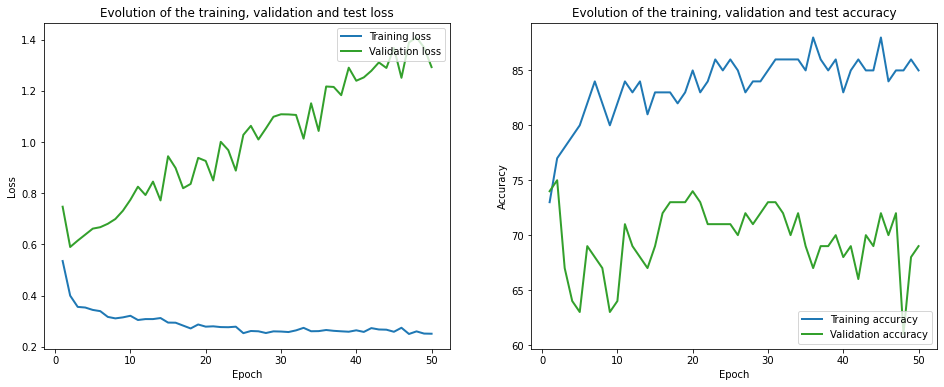

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.52it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 830.12it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.06 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 1.67 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.59 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.46 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.48 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.39 train_acc: 90.00% took: 0.01s
val_loss = 0.44 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.53 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.62 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.50 train_acc: 8

Epoch 12 of 50, 60% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.32 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
val_loss = 0.38 val_acc = 75.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.68 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.64 train_acc: 65.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.36 tr

Epoch 24 of 50, 40% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.25 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 60% 	 train_loss: 0.54 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.02s
Epoch 24 of 50, 100% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
val_loss = 0.42 val_acc = 75.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.58 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.63 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.26 train_acc: 95.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.26 train_acc: 95.00% took: 0.02s
Epoch 25 of 50, 60% 	 train_loss: 0.51 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.42 tr

val_loss = 0.46 val_acc = 75.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.54 train_acc: 85.00% took: 0.00s
Epoch 36 of 50, 20% 	 train_loss: 0.63 train_acc: 65.00% took: 0.00s
Epoch 36 of 50, 30% 	 train_loss: 0.50 train_acc: 75.00% took: 0.02s
Epoch 36 of 50, 40% 	 train_loss: 0.30 train_acc: 95.00% took: 0.00s
Epoch 36 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 60% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 70% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 36 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 36 of 50, 90% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 36 of 50, 100% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
val_loss = 0.35 val_acc = 80.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.47 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 20% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 30% 	 train_loss: 0.43 train_acc:

Epoch 47 of 50, 100% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
val_loss = 0.45 val_acc = 75.00%
Snapshot saved at epoch 47.
Epoch 48 of 50, 10% 	 train_loss: 0.47 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 20% 	 train_loss: 0.54 train_acc: 75.00% took: 0.01s
Epoch 48 of 50, 30% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 48 of 50, 40% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 50% 	 train_loss: 0.25 train_acc: 95.00% took: 0.01s
Epoch 48 of 50, 60% 	 train_loss: 0.52 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 70% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 48 of 50, 90% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 48 of 50, 100% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
val_loss = 0.45 val_acc = 75.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.49 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 20% 	 train_loss: 0.56 train_acc

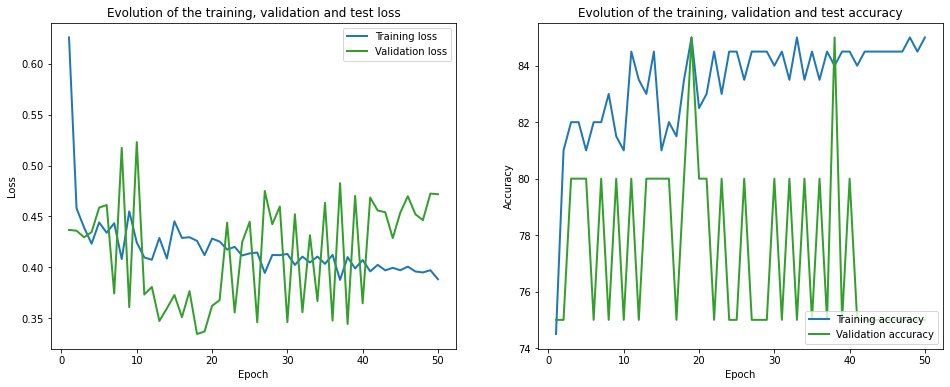

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 159.88it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 831.75it/s]


Finished computing p-values for 500 test points.

Starting repetition 39 of 50:

Training with standard data splitting...


C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.45 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.57 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.62 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.01 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
val_loss = 0.51 val_acc = 85.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.14 train_acc: 

Epoch 12 of 50, 10% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 20% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 30% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.17 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
val_loss = 0.86 val_acc = 77.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.13

Epoch 23 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
val_loss = 1.02 val_acc = 77.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 40% 	 train_loss: 0.13 train_acc: 100.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.10 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 1.03 val_acc = 76.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.22 train

Epoch 39 of 50, 60% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
val_loss = 1.30 val_acc = 76.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.14 train_acc: 90.00% took: 0.01s
Epoch 40 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.12 train_acc: 100.00% took: 0.01s
Epoch 40 of 50, 50% 	 train_loss: 0.19 train_acc: 100.00% took: 0.01s
Epoch 40 of 50, 60% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 70% 	 train_loss: 0.28 train_acc: 80.00% took: 0.02s
Epoch 40 of 50, 80% 	 train_loss: 0.17 train_acc: 100.00% took: 0.01s
Epoch 40 of 50, 90% 	 train_loss: 

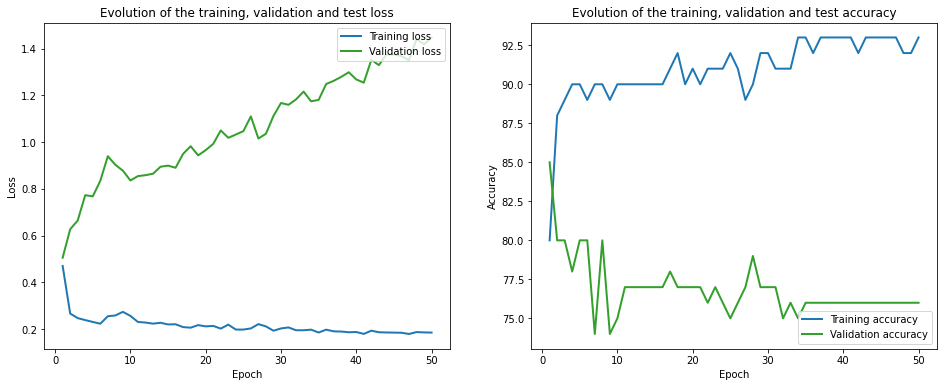

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 122.81it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 857.26it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 2.50 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.79 train_acc: 45.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.45 train_acc: 85.00% took: 0.02s
Epoch 1 of 50, 40% 	 train_loss: 0.60 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.44 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.37 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.46 train_acc: 70.00% took: 0.01s
val_loss = 0.84 val_acc = 40.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.57 train_acc: 65.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.41 train_acc: 85.00% took: 0.02s
Epoch 2 of 50, 30% 	 train_loss: 0.39 train_acc: 8

Epoch 13 of 50, 70% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
val_loss = 0.79 val_acc = 60.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.34 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.51 train_acc: 80.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 60% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 14 of 50, 90% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 14 of 50, 100% 	 train_loss: 0.33 t

Epoch 25 of 50, 80% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
val_loss = 0.90 val_acc = 50.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.49 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.26 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.58 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.32 train_acc: 85.00% took: 0.02s
val_loss = 0.96 val_acc = 50.00%
Snapsho

Epoch 37 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
val_loss = 0.76 val_acc = 65.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.25 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.56 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.30 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 100% 	 train_loss: 0.30 train_acc: 85.00% took: 0.00s
val_loss = 0.75 val_acc = 65.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.46 train_acc

val_loss = 0.77 val_acc = 60.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 20% 	 train_loss: 0.26 train_acc: 95.00% took: 0.00s
Epoch 49 of 50, 30% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 40% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 49 of 50, 50% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
Epoch 49 of 50, 70% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 80% 	 train_loss: 0.35 train_acc: 90.00% took: 0.01s
Epoch 49 of 50, 90% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
val_loss = 0.82 val_acc = 60.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.46 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.26 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.56 train_acc:

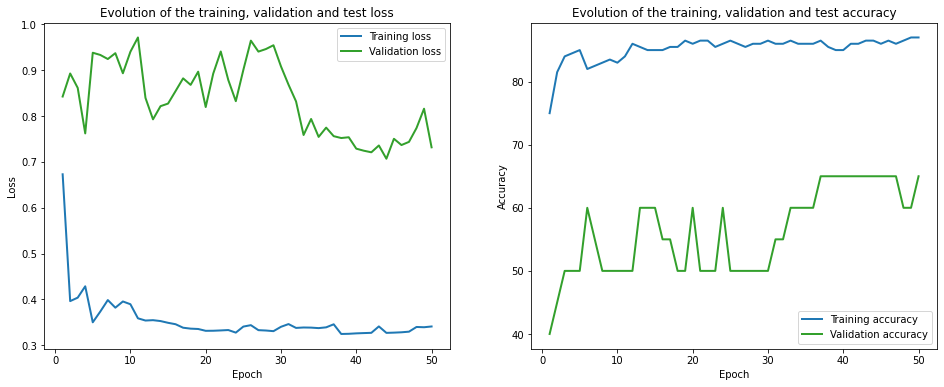

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 138.39it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 992.58it/s]

Finished computing p-values for 500 test points.

Starting repetition 40 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.93 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.03 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.12 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.49 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.45 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.77 train_acc: 80.00% took: 0.00s
val_loss = 0.64 val_acc = 72.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.87 train_acc: 40.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.75 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 1.00 train_acc: 

Epoch 15 of 50, 10% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.37 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.25 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.08 train_acc: 100.00% took: 0.01s
Epoch 15 of 50, 80% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
val_loss = 0.46 val_acc = 82.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.3

Epoch 26 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
val_loss = 0.55 val_acc = 79.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.33 

Epoch 37 of 50, 10% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 30% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.19 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
val_loss = 0.63 val_acc = 79.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.51 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.28 

Epoch 50 of 50, 90% 	 train_loss: 0.05 train_acc: 100.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.25 train_acc: 80.00% took: 0.00s
val_loss = 0.67 val_acc = 78.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


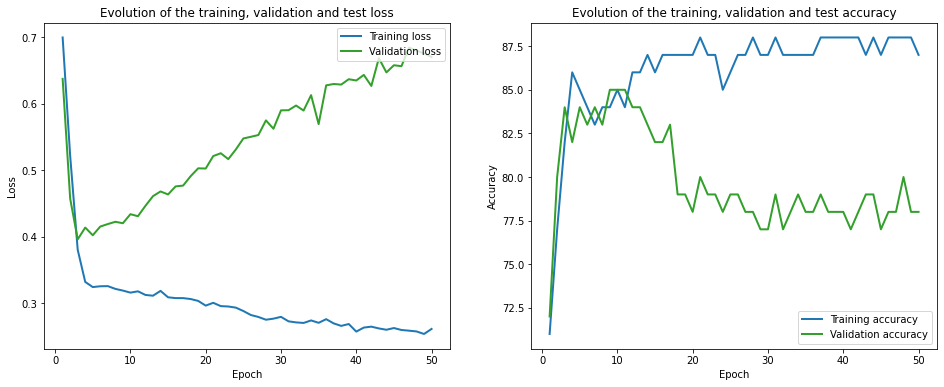

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 133.48it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1109.48it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.45 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.84 train_acc: 45.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.65 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.45 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.69 train_acc: 55.00% took: 0.01s
val_loss = 0.29 val_acc = 100.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.39 train_acc: 95.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.51 train_acc: 70.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.49 train_acc: 

val_loss = 0.27 val_acc = 85.00%
Snapshot saved at epoch 11.
Epoch 12 of 50, 10% 	 train_loss: 0.38 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 20% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 30% 	 train_loss: 0.44 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 40% 	 train_loss: 0.17 train_acc: 95.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 60% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.30 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.88 train_acc: 70.00% took: 0.00s
val_loss = 0.28 val_acc = 85.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.38 train_acc: 90.00% took: 0.02s
Epoch 13 of 50, 20% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.43 train_acc:

Epoch 23 of 50, 30% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 23 of 50, 40% 	 train_loss: 0.18 train_acc: 95.00% took: 0.00s
Epoch 23 of 50, 50% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 23 of 50, 60% 	 train_loss: 0.52 train_acc: 80.00% took: 0.01s
Epoch 23 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 23 of 50, 80% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 23 of 50, 90% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 23 of 50, 100% 	 train_loss: 0.88 train_acc: 70.00% took: 0.00s
val_loss = 0.28 val_acc = 85.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.49 train_acc: 70.00% took: 0.01s
Epoch 24 of 50, 30% 	 train_loss: 0.43 train_acc: 70.00% took: 0.01s
Epoch 24 of 50, 40% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.49 tr

Epoch 36 of 50, 100% 	 train_loss: 0.84 train_acc: 70.00% took: 0.01s
val_loss = 0.27 val_acc = 85.00%
Snapshot saved at epoch 36.
Epoch 37 of 50, 10% 	 train_loss: 0.38 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 20% 	 train_loss: 0.46 train_acc: 70.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.43 train_acc: 75.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.14 train_acc: 95.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 60% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.27 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.32 train_acc: 75.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.87 train_acc: 70.00% took: 0.00s
val_loss = 0.28 val_acc = 85.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.38 train_acc: 85.00% took: 0.02s
Epoch 38 of 50, 20% 	 train_loss: 0.46 train_acc

Epoch 50 of 50, 30% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.28 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.32 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.89 train_acc: 70.00% took: 0.01s
val_loss = 0.28 val_acc = 85.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


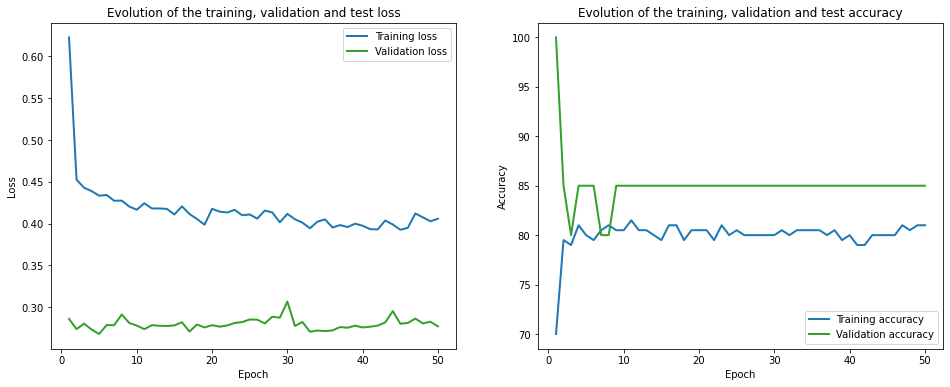

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 137.02it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1122.73it/s]

Finished computing p-values for 500 test points.

Starting repetition 41 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.67 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.85 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.74 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.59 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.63 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 1.58 train_acc: 0.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 1.12 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 1.66 train_acc: 70.00% took: 0.00s
val_loss = 1.02 val_acc = 40.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 2.64 train_acc: 30.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 1.05 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.32 train_acc: 7

Epoch 16 of 50, 20% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.69 train_acc: 80.00% took: 0.01s
Epoch 16 of 50, 90% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.81 train_acc: 80.00% took: 0.00s
val_loss = 0.50 val_acc = 81.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 1.22 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 30% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 40% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 17 of 50, 50% 	 train_loss: 0.20 t

Epoch 27 of 50, 80% 	 train_loss: 0.60 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.52 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.64 train_acc: 80.00% took: 0.00s
val_loss = 0.49 val_acc = 81.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 1.13 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.32 train_acc: 90.00% took: 0.02s
Epoch 28 of 50, 40% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 60% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.59 train_acc: 80.00% took: 0.02s
Epoch 28 of 50, 90% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 100% 	 train_loss: 0.80 train_acc: 80.00% took: 0.00s
val_loss = 0.51 val_acc = 81.00%
Snapsh

Epoch 39 of 50, 30% 	 train_loss: 0.32 train_acc: 90.00% took: 0.02s
Epoch 39 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.12 train_acc: 100.00% took: 0.01s
Epoch 39 of 50, 60% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.82 train_acc: 80.00% took: 0.00s
val_loss = 0.50 val_acc = 81.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 1.09 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.42 train_acc: 80.00% took: 0.02s
Epoch 40 of 50, 50% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 60% 	 train_loss: 0.32 

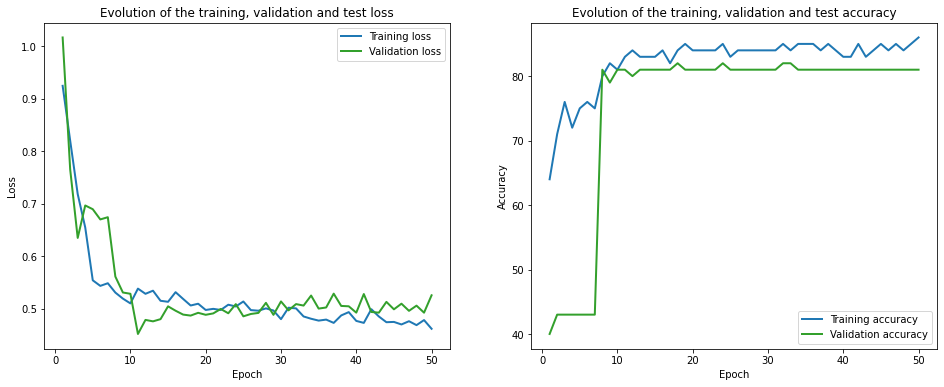

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 145.89it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1182.61it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.75 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 2.01 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 1.83 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 8.15 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 2.35 train_acc: 20.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.83 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.71 train_acc: 80.00% took: 0.00s
val_loss = 0.39 val_acc = 60.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.61 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.47 train_acc: 8

Epoch 12 of 50, 50% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.63 train_acc: 65.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 12 of 50, 90% 	 train_loss: 0.80 train_acc: 75.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
val_loss = 0.40 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.50 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.66 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.84 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.43 train_acc: 85.00% took: 0.02s
Epoch 13 of 50, 80% 	 train_loss: 0.40 tr

Epoch 24 of 50, 70% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.81 train_acc: 75.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
val_loss = 0.41 val_acc = 80.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.51 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.66 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.58 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.62 train_acc: 70.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.56 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.29 t

Epoch 37 of 50, 70% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 37 of 50, 80% 	 train_loss: 0.37 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.75 train_acc: 75.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
val_loss = 0.42 val_acc = 80.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.50 train_acc: 70.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.68 train_acc: 70.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.55 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.60 train_acc: 65.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.67 train_acc: 75.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.31 t

Epoch 50 of 50, 80% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.59 train_acc: 75.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
val_loss = 0.45 val_acc = 70.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


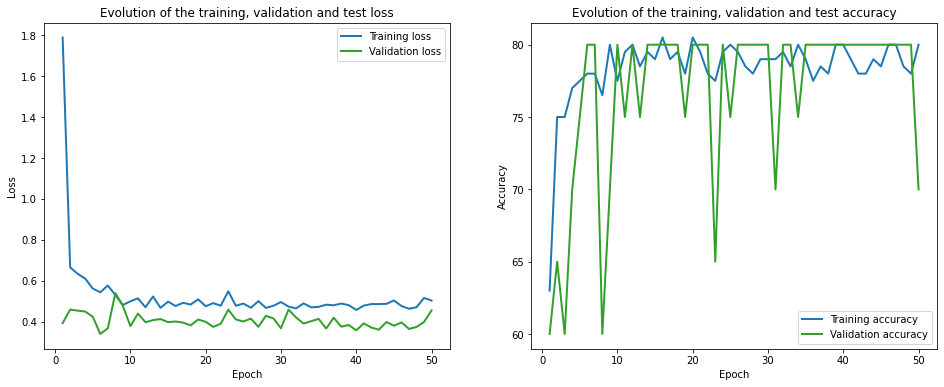

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 176.88it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1348.27it/s]

Finished computing p-values for 500 test points.

Starting repetition 42 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.75 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.45 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.69 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
val_loss = 0.56 val_acc = 60.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.78 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 2 

Epoch 16 of 50, 80% 	 train_loss: 0.64 train_acc: 50.00% took: 0.02s
Epoch 16 of 50, 90% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
val_loss = 0.42 val_acc = 76.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 30% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 40% 	 train_loss: 0.41 train_acc: 90.00% took: 0.01s
Epoch 17 of 50, 50% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 60% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 70% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 80% 	 train_loss: 0.64 train_acc: 50.00% took: 0.01s
Epoch 17 of 50, 90% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
Epoch 17 of 50, 100% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
val_loss = 0.42 val_acc = 76.00%
Snapsh

Epoch 27 of 50, 80% 	 train_loss: 0.63 train_acc: 50.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.42 val_acc = 77.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 40% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 28 of 50, 50% 	 train_loss: 0.21 train_acc: 90.00% took: 0.02s
Epoch 28 of 50, 60% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 70% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 80% 	 train_loss: 0.63 train_acc: 50.00% took: 0.00s
Epoch 28 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.01s
Epoch 28 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.42 val_acc = 76.00%
Snapsh

Epoch 39 of 50, 10% 	 train_loss: 0.47 train_acc: 70.00% took: 0.02s
Epoch 39 of 50, 20% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.63 train_acc: 50.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.02s
Epoch 39 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.42 val_acc = 77.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 40% 	 train_loss: 0.42 

val_loss = 0.41 val_acc = 77.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
val_loss = 0.42 val_acc = 77.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


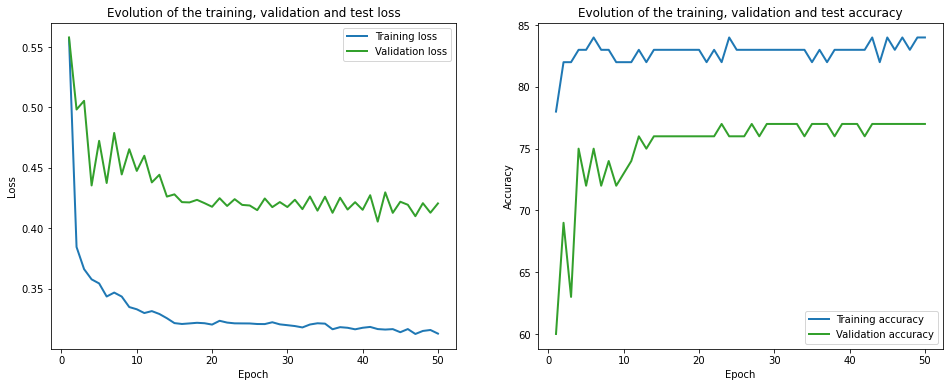

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 171.51it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1039.93it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.49 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 3.05 train_acc: 45.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 3.02 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 2.16 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 12.37 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 72.45 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 10.58 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.00 train_acc: 100.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 4.66 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 42.42 train_acc: 85.00% took: 0.00s
val_loss = 8.60 val_acc = 70.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 2.09 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 5.30 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 24.63 train_

Epoch 13 of 50, 50% 	 train_loss: 0.56 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.47 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
val_loss = 0.47 val_acc = 70.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.60 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.56 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 30% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 50% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 14 of 50, 60% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 70% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 14 of 50, 80% 	 train_loss: 0.11 t

Epoch 25 of 50, 60% 	 train_loss: 0.31 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 80% 	 train_loss: 0.11 train_acc: 100.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.50 train_acc: 75.00% took: 0.00s
Epoch 25 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
val_loss = 0.48 val_acc = 70.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.58 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 30% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.30 train_acc: 85.00% took: 0.02s
Epoch 26 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.11 train_acc: 100.00% took: 0.02s
Epoch 26 of 50, 90% 	 train_loss: 0.51 

val_loss = 0.52 val_acc = 70.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.62 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.51 train_acc: 75.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.30 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.11 train_acc: 100.00% took: 0.02s
Epoch 38 of 50, 90% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
val_loss = 0.49 val_acc = 70.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.59 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
Epoch 39 of 50, 30% 	 train_loss: 0.44 train_acc

Epoch 50 of 50, 80% 	 train_loss: 0.10 train_acc: 100.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.46 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
val_loss = 0.53 val_acc = 70.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


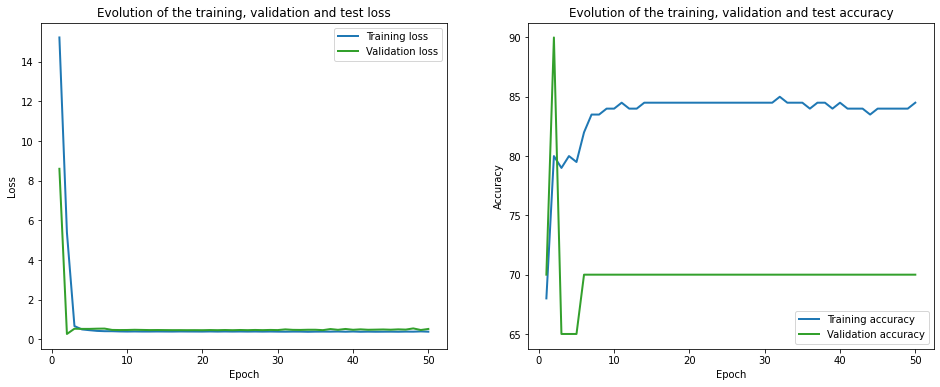

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 129.53it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 741.10it/s]

Finished computing p-values for 500 test points.

Starting repetition 43 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.60 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 1.05 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.84 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.77 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.47 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.36 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.77 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.41 train_acc: 80.00% took: 0.01s
val_loss = 0.35 val_acc = 87.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.65 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.26 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.21 train_acc:

Epoch 12 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 30% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.77 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
val_loss = 0.33 val_acc = 90.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.40 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.40 t

val_loss = 0.38 val_acc = 88.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 40% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 50% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.77 train_acc: 50.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 90% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 24 of 50, 100% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
val_loss = 0.38 val_acc = 88.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 30% 	 train_loss: 0.21 train_acc

Epoch 34 of 50, 100% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
val_loss = 0.41 val_acc = 90.00%
Snapshot saved at epoch 34.
Epoch 35 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 20% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 40% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 35 of 50, 50% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 60% 	 train_loss: 0.79 train_acc: 50.00% took: 0.00s
Epoch 35 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 35 of 50, 80% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 35 of 50, 90% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 35 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
val_loss = 0.42 val_acc = 89.00%
Snapshot saved at epoch 35.
Epoch 36 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 36 of 50, 20% 	 train_loss: 0.15 train_ac

Epoch 45 of 50, 90% 	 train_loss: 0.42 train_acc: 70.00% took: 0.02s
Epoch 45 of 50, 100% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
val_loss = 0.43 val_acc = 89.00%
Snapshot saved at epoch 45.
Epoch 46 of 50, 10% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 46 of 50, 20% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 30% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 40% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 50% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 46 of 50, 60% 	 train_loss: 0.77 train_acc: 50.00% took: 0.00s
Epoch 46 of 50, 70% 	 train_loss: 0.38 train_acc: 80.00% took: 0.02s
Epoch 46 of 50, 80% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 46 of 50, 90% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 46 of 50, 100% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
val_loss = 0.43 val_acc = 89.00%
Snapshot saved at epoch 46.
Epoch 47 of 50, 10% 	 train_loss: 0.32 train_ac

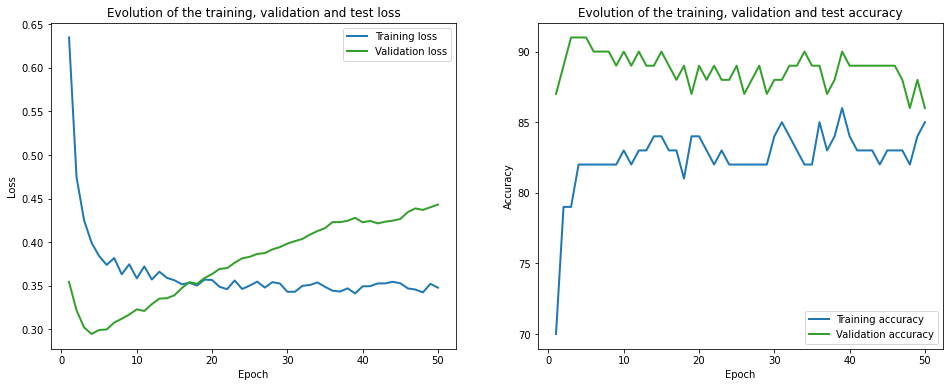

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 156.03it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1057.47it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.83 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.51 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 1.41 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.87 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.68 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.08 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.42 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.22 train_acc: 95.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
val_loss = 0.30 val_acc = 80.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.80 train_acc: 

Epoch 12 of 50, 90% 	 train_loss: 0.21 train_acc: 95.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
val_loss = 0.68 val_acc = 60.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.47 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.52 train_acc: 70.00% took: 0.02s
Epoch 13 of 50, 40% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.52 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.64 train_acc: 60.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.33 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
val_loss = 0.40 val_acc = 70.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.36 train_acc

Epoch 25 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
val_loss = 0.43 val_acc = 70.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 20% 	 train_loss: 0.30 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.66 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.64 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 60% 	 train_loss: 0.06 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.79 train_acc: 60.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.32 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
val_loss = 0.56 val_acc = 60.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.31 train_acc: 80.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.26 train_ac

Epoch 38 of 50, 80% 	 train_loss: 0.33 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.37 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 100% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
val_loss = 0.32 val_acc = 80.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.35 train_acc: 75.00% took: 0.02s
Epoch 39 of 50, 60% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 39 of 50, 70% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 90% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 100% 	 train_loss: 0.34 train_acc: 85.00% took: 0.00s
val_loss = 0.32 val_acc = 80.00%
Snapsh

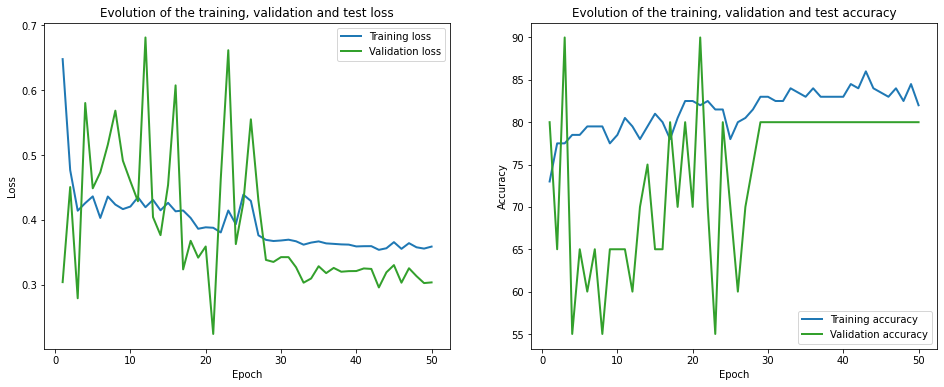

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 147.20it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1184.36it/s]

Finished computing p-values for 500 test points.

Starting repetition 44 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.96 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.70 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.76 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 1.49 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.64 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 1.63 train_acc: 60.00% took: 0.00s
val_loss = 0.83 val_acc = 47.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.75 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.65 train_acc: 60.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.77 train_acc: 8

Epoch 15 of 50, 80% 	 train_loss: 0.41 train_acc: 70.00% took: 0.02s
Epoch 15 of 50, 90% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.38 train_acc: 70.00% took: 0.00s
val_loss = 0.50 val_acc = 82.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.43 train_acc: 60.00% took: 0.01s
Epoch 16 of 50, 50% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.85 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.08 train_acc: 100.00% took: 0.01s
Epoch 16 of 50, 100% 	 train_loss: 0.40 train_acc: 70.00% took: 0.00s
val_loss = 0.51 val_acc = 80.00%
Snap

Epoch 26 of 50, 60% 	 train_loss: 0.14 train_acc: 100.00% took: 0.02s
Epoch 26 of 50, 70% 	 train_loss: 0.96 train_acc: 70.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.37 train_acc: 70.00% took: 0.00s
val_loss = 0.53 val_acc = 81.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.41 train_acc: 60.00% took: 0.01s
Epoch 27 of 50, 50% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.93 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.1

Epoch 42 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 30% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 42 of 50, 40% 	 train_loss: 0.42 train_acc: 60.00% took: 0.00s
Epoch 42 of 50, 50% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 42 of 50, 60% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
Epoch 42 of 50, 70% 	 train_loss: 0.95 train_acc: 70.00% took: 0.00s
Epoch 42 of 50, 80% 	 train_loss: 0.41 train_acc: 70.00% took: 0.00s
Epoch 42 of 50, 90% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 42 of 50, 100% 	 train_loss: 0.36 train_acc: 70.00% took: 0.00s
val_loss = 0.58 val_acc = 78.00%
Snapshot saved at epoch 42.
Epoch 43 of 50, 10% 	 train_loss: 0.33 train_acc: 70.00% took: 0.00s
Epoch 43 of 50, 20% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 30% 	 train_loss: 0.28 train_acc: 80.00% took: 0.00s
Epoch 43 of 50, 40% 	 train_loss: 0.40 train_acc: 60.00% took: 0.00s
Epoch 43 of 50, 50% 	 train_loss: 0.18 

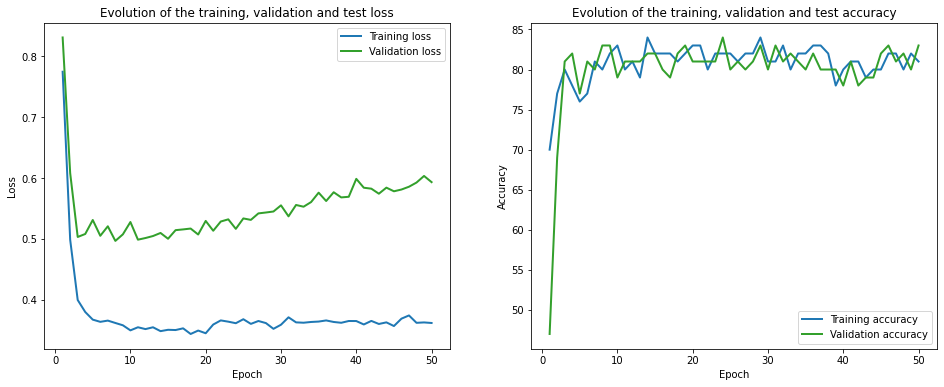

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 144.40it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 935.40it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.31 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 4.14 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 2.70 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.44 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.98 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.47 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.36 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.51 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 1.32 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.46 train_acc: 55.00% took: 0.01s
val_loss = 0.39 val_acc = 65.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.47 train_acc: 85.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.56 train_acc: 70.00% took: 0.02s
Epoch 2 of 50, 30% 	 train_loss: 0.73 train_acc: 8

Epoch 12 of 50, 100% 	 train_loss: 0.53 train_acc: 85.00% took: 0.00s
val_loss = 0.45 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.47 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.38 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.71 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.55 train_acc: 85.00% took: 0.00s
val_loss = 0.48 val_acc = 80.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.47 train_acc

Epoch 24 of 50, 90% 	 train_loss: 0.74 train_acc: 75.00% took: 0.02s
Epoch 24 of 50, 100% 	 train_loss: 0.58 train_acc: 85.00% took: 0.00s
val_loss = 0.46 val_acc = 80.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 20% 	 train_loss: 0.47 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 30% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 40% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.35 train_acc: 85.00% took: 0.02s
Epoch 25 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.73 train_acc: 75.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.57 train_acc: 85.00% took: 0.01s
val_loss = 0.47 val_acc = 80.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.28 train_acc

Epoch 37 of 50, 50% 	 train_loss: 0.48 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.20 train_acc: 95.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.28 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.67 train_acc: 80.00% took: 0.02s
Epoch 37 of 50, 100% 	 train_loss: 0.52 train_acc: 85.00% took: 0.00s
val_loss = 0.53 val_acc = 75.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.45 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.30 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.36 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.20 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.35 tr

Epoch 50 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 70% 	 train_loss: 0.27 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.35 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.71 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.63 train_acc: 80.00% took: 0.01s
val_loss = 0.46 val_acc = 75.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


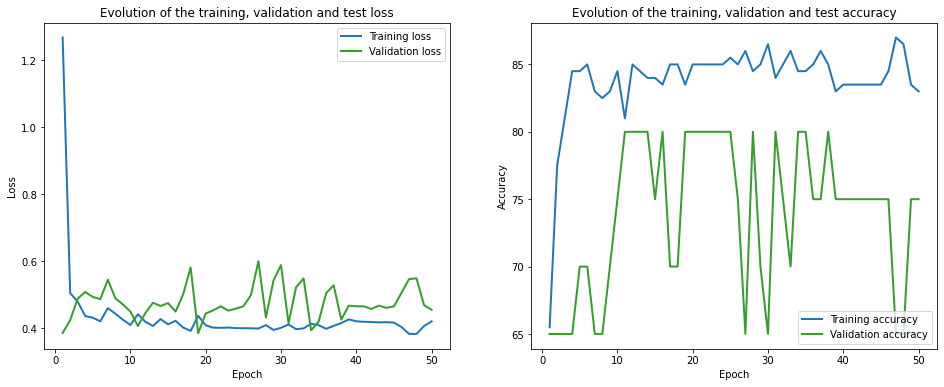

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 160.15it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1246.58it/s]

Finished computing p-values for 500 test points.

Starting repetition 45 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.92 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.55 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.64 train_acc: 70.00% took: 0.00s
val_loss = 0.47 val_acc = 76.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.48 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.26 train_acc: 9

val_loss = 0.32 val_acc = 83.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.42 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.52 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.70 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 83.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 17 of 50, 20% 	 train_loss: 0.42 train_acc: 90.00% took: 0.00s
Epoch 17 of 50, 30% 	 train_loss: 0.22 train_

Epoch 26 of 50, 90% 	 train_loss: 0.15 train_acc: 90.00% took: 0.02s
Epoch 26 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
val_loss = 0.31 val_acc = 83.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.41 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.66 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
val_loss = 0.31 val_acc = 82.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.12 train_

Epoch 38 of 50, 10% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.61 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.31 val_acc = 82.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.43 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.

Epoch 49 of 50, 30% 	 train_loss: 0.26 train_acc: 90.00% took: 0.02s
Epoch 49 of 50, 40% 	 train_loss: 0.47 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 50% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 0.37 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.55 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 90% 	 train_loss: 0.11 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 82.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 50% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.37 

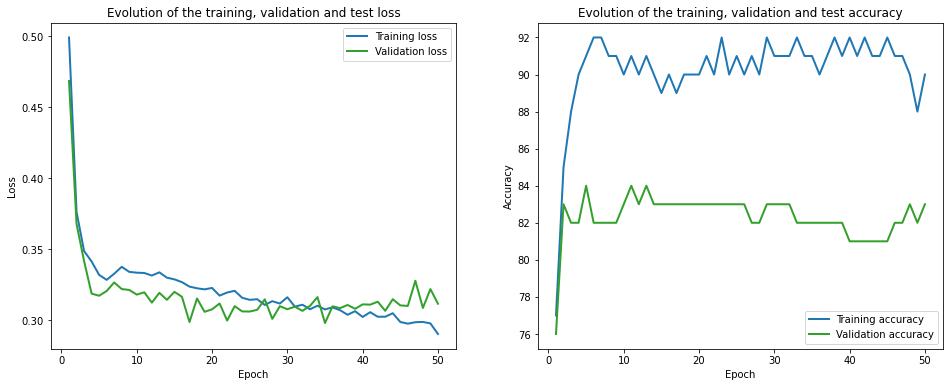

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 142.44it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1290.00it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.82 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.52 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.15 train_acc: 35.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.85 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.59 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.47 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.33 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
val_loss = 0.79 val_acc = 55.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.63 train_acc: 75.00% took: 0.02s
Epoch 2 of 50, 30% 	 train_loss: 1.30 train_acc: 4

Epoch 13 of 50, 60% 	 train_loss: 0.34 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.13 train_acc: 95.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.32 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
val_loss = 0.87 val_acc = 60.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 20% 	 train_loss: 0.49 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.87 train_acc: 50.00% took: 0.01s
Epoch 14 of 50, 40% 	 train_loss: 0.58 train_acc: 65.00% took: 0.00s
Epoch 14 of 50, 50% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 60% 	 train_loss: 0.33 train_acc: 75.00% took: 0.01s
Epoch 14 of 50, 70% 	 train_loss: 0.25 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 80% 	 train_loss: 0.13 train_acc: 95.00% took: 0.00s
Epoch 14 of 50, 90% 	 train_loss: 0.27 tr

Epoch 26 of 50, 20% 	 train_loss: 0.49 train_acc: 85.00% took: 0.02s
Epoch 26 of 50, 30% 	 train_loss: 0.76 train_acc: 60.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.57 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.34 train_acc: 75.00% took: 0.02s
Epoch 26 of 50, 70% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.14 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.29 train_acc: 75.00% took: 0.02s
Epoch 26 of 50, 100% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
val_loss = 0.98 val_acc = 65.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.37 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.50 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 30% 	 train_loss: 0.82 train_acc: 60.00% took: 0.01s
Epoch 27 of 50, 40% 	 train_loss: 0.57 train_acc: 60.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.40 tr

val_loss = 1.08 val_acc = 65.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.45 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.49 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.82 train_acc: 50.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.51 train_acc: 60.00% took: 0.02s
Epoch 39 of 50, 50% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.35 train_acc: 75.00% took: 0.02s
Epoch 39 of 50, 70% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 80% 	 train_loss: 0.13 train_acc: 95.00% took: 0.01s
Epoch 39 of 50, 90% 	 train_loss: 0.28 train_acc: 80.00% took: 0.01s
Epoch 39 of 50, 100% 	 train_loss: 0.27 train_acc: 90.00% took: 0.01s
val_loss = 0.99 val_acc = 65.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 20% 	 train_loss: 0.48 train_acc: 90.00% took: 0.00s
Epoch 40 of 50, 30% 	 train_loss: 0.88 train_acc:

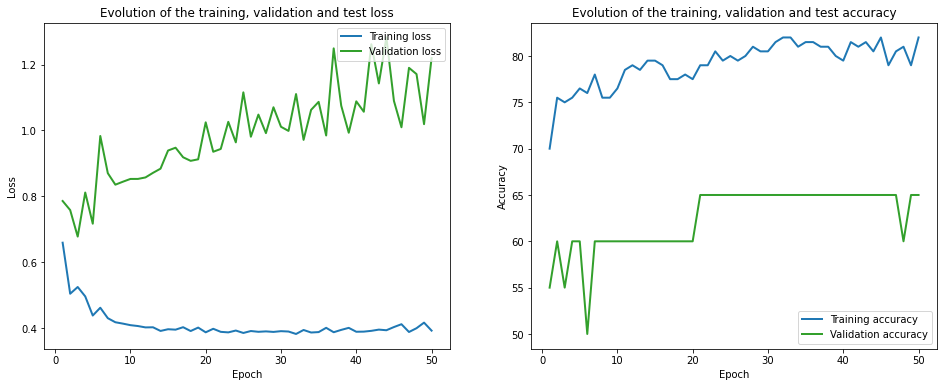

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 158.30it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1243.21it/s]

Finished computing p-values for 500 test points.

Starting repetition 46 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.84 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.14 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.80 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.66 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.64 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.39 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.82 train_acc: 60.00% took: 0.00s
val_loss = 0.54 val_acc = 63.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.58 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.44 train_acc: 9

val_loss = 0.47 val_acc = 83.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.43 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.29 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 0.31 train_acc: 100.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.33 train_acc: 80.00% took: 0.02s
Epoch 15 of 50, 80% 	 train_loss: 0.63 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.62 train_acc: 60.00% took: 0.00s
val_loss = 0.49 val_acc = 83.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.42 train_acc

val_loss = 0.50 val_acc = 85.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.43 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.49 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.32 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.36 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.59 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
val_loss = 0.51 val_acc = 85.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 28 of 50, 20% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.43 train_a

Epoch 38 of 50, 30% 	 train_loss: 0.42 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.29 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
val_loss = 0.54 val_acc = 86.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.42 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.28 

Epoch 49 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 100% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
val_loss = 0.57 val_acc = 85.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.42 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.28 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
val_loss = 0.57 val_acc = 85.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


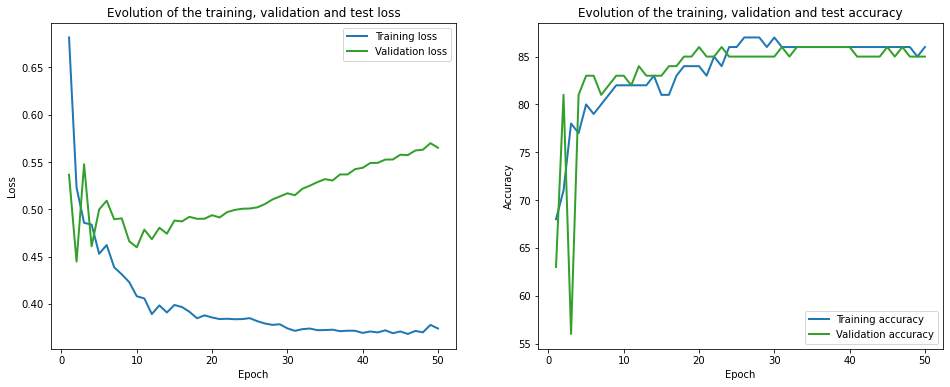

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 135.47it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1008.69it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.13 train_acc: 95.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.08 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.59 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.83 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 1.51 train_acc: 65.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 1.14 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.44 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.55 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.45 train_acc: 65.00% took: 0.01s
val_loss = 0.29 val_acc = 75.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.28 train_acc: 9

Epoch 13 of 50, 10% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.19 train_acc: 95.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.53 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 60% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.29 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.19 train_acc: 95.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.56 train_acc: 65.00% took: 0.00s
val_loss = 0.14 val_acc = 95.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 14 of 50, 20% 	 train_loss: 0.35 train_acc: 85.00% took: 0.00s
Epoch 14 of 50, 30% 	 train_loss: 0.18 train_acc: 95.00% took: 0.00s
Epoch 14 of 50, 40% 	 train_loss: 0.54 tr

Epoch 25 of 50, 100% 	 train_loss: 0.55 train_acc: 75.00% took: 0.02s
val_loss = 0.13 val_acc = 95.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.47 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 20% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.16 train_acc: 95.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.52 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.48 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 80% 	 train_loss: 0.29 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 90% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.53 train_acc: 70.00% took: 0.01s
val_loss = 0.15 val_acc = 95.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.46 train_acc: 85.00% took: 0.01s
Epoch 27 of 50, 20% 	 train_loss: 0.44 train_ac

Epoch 38 of 50, 30% 	 train_loss: 0.13 train_acc: 95.00% took: 0.02s
Epoch 38 of 50, 40% 	 train_loss: 0.49 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.21 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.48 train_acc: 85.00% took: 0.02s
Epoch 38 of 50, 80% 	 train_loss: 0.29 train_acc: 85.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.14 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.49 train_acc: 65.00% took: 0.02s
val_loss = 0.18 val_acc = 90.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.45 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 20% 	 train_loss: 0.44 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 30% 	 train_loss: 0.11 train_acc: 95.00% took: 0.01s
Epoch 39 of 50, 40% 	 train_loss: 0.46 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 50% 	 train_loss: 0.22 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.45 t

Epoch 50 of 50, 80% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.53 train_acc: 65.00% took: 0.00s
val_loss = 0.21 val_acc = 85.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


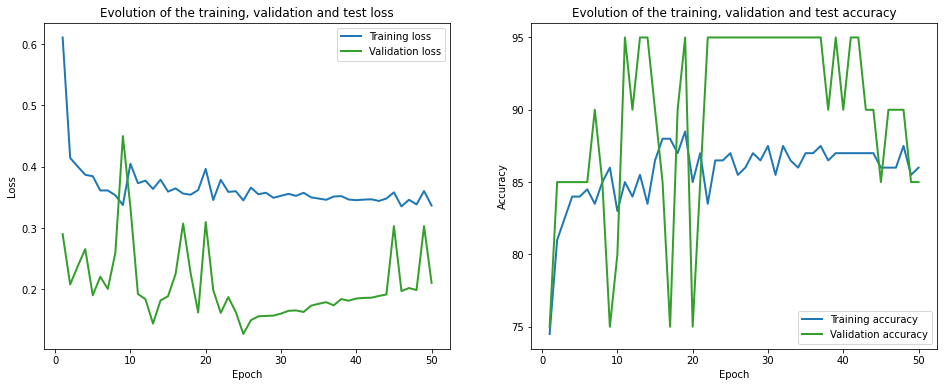

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 124.19it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 740.06it/s]

Finished computing p-values for 500 test points.

Starting repetition 47 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.85 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.11 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 1.15 train_acc: 50.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 1.17 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.09 train_acc: 100.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.67 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
val_loss = 0.64 val_acc = 77.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.22 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.21 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.97 train_acc

val_loss = 0.72 val_acc = 79.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.56 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.95 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 15 of 50, 60% 	 train_loss: 0.27 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 90% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
val_loss = 0.58 val_acc = 77.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.19 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.60 train_acc

Epoch 26 of 50, 90% 	 train_loss: 0.25 train_acc: 90.00% took: 0.02s
Epoch 26 of 50, 100% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
val_loss = 0.61 val_acc = 80.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.43 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.60 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.18 train_acc: 90.00% took: 0.02s
Epoch 27 of 50, 60% 	 train_loss: 0.30 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.08 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 90% 	 train_loss: 0.24 train_acc: 90.00% took: 0.01s
Epoch 27 of 50, 100% 	 train_loss: 0.14 train_acc: 90.00% took: 0.00s
val_loss = 0.61 val_acc = 80.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.37 train_a

Epoch 38 of 50, 20% 	 train_loss: 0.15 train_acc: 100.00% took: 0.02s
Epoch 38 of 50, 30% 	 train_loss: 0.54 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.00s
val_loss = 0.62 val_acc = 77.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.35 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.53 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.2

Epoch 50 of 50, 50% 	 train_loss: 0.26 train_acc: 90.00% took: 0.02s
Epoch 50 of 50, 60% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
val_loss = 0.65 val_acc = 79.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


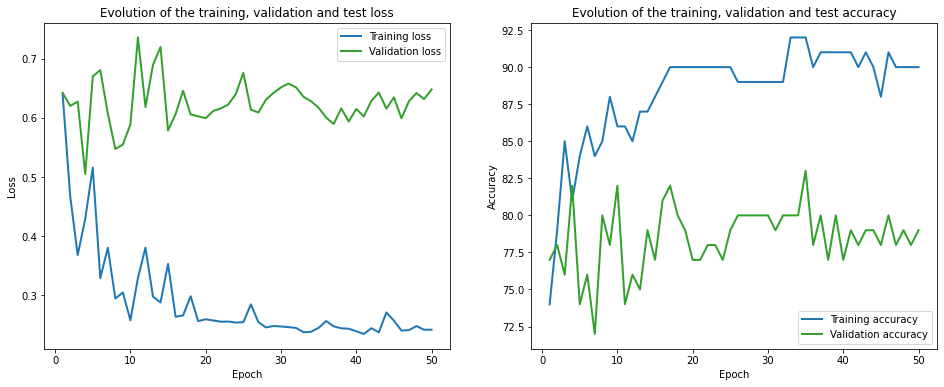

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 119.50it/s]


Initialization done!


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 721.56it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 1.01 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.65 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.78 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.70 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.54 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.44 train_acc: 85.00% took: 0.01s
val_loss = 0.56 val_acc = 50.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.27 train_acc: 95.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.75 train_acc: 55.00% took: 0.02s
Epoch 2 of 50, 30% 	 train_loss: 0.95 train_acc: 7

Epoch 12 of 50, 50% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.28 train_acc: 95.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.75 train_acc: 55.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
val_loss = 0.66 val_acc = 45.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.85 train_acc: 40.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.68 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.28 train_acc: 95.00% took: 0.00s
Epoch 13 of 50, 70% 	 train_loss: 0.75 train_acc: 55.00% took: 0.00s
Epoch 13 of 50, 80% 	 train_loss: 0.50 tr

Epoch 24 of 50, 20% 	 train_loss: 0.76 train_acc: 55.00% took: 0.01s
Epoch 24 of 50, 30% 	 train_loss: 0.83 train_acc: 70.00% took: 0.01s
Epoch 24 of 50, 40% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.43 train_acc: 85.00% took: 0.01s
Epoch 24 of 50, 60% 	 train_loss: 0.31 train_acc: 90.00% took: 0.01s
Epoch 24 of 50, 70% 	 train_loss: 0.74 train_acc: 55.00% took: 0.01s
Epoch 24 of 50, 80% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
Epoch 24 of 50, 90% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 24 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.68 val_acc = 45.00%
Snapshot saved at epoch 24.
Epoch 25 of 50, 10% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 20% 	 train_loss: 0.87 train_acc: 40.00% took: 0.00s
Epoch 25 of 50, 30% 	 train_loss: 0.59 train_acc: 80.00% took: 0.02s
Epoch 25 of 50, 40% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 0.43 tr

Epoch 37 of 50, 50% 	 train_loss: 0.42 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.74 train_acc: 55.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.50 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.52 train_acc: 70.00% took: 0.01s
Epoch 37 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.65 val_acc = 45.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.36 train_acc: 85.00% took: 0.02s
Epoch 38 of 50, 20% 	 train_loss: 0.87 train_acc: 40.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.61 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.41 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 60% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.74 train_acc: 55.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.50 tr

Epoch 50 of 50, 30% 	 train_loss: 0.60 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.41 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.28 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.74 train_acc: 55.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.52 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.47 train_acc: 80.00% took: 0.00s
val_loss = 0.65 val_acc = 45.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


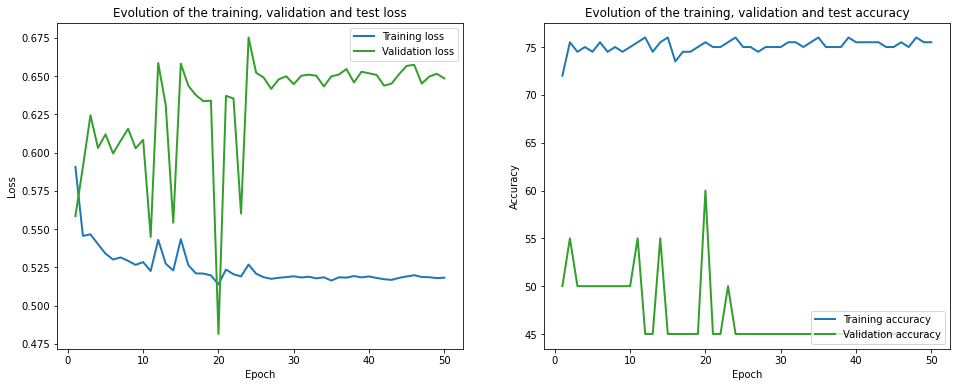

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 118.90it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|███████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 772.55it/s]

Finished computing p-values for 500 test points.

Starting repetition 48 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.25 train_acc: 20.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 2.24 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 2.48 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 40% 	 train_loss: 0.48 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.18 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 2.69 train_acc: 40.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 2.93 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.85 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 1.00 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.59 train_acc: 60.00% took: 0.00s
val_loss = 0.61 val_acc = 55.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.65 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.65 train_acc: 40.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.48 train_acc: 8

val_loss = 0.57 val_acc = 65.00%
Snapshot saved at epoch 14.
Epoch 15 of 50, 10% 	 train_loss: 0.58 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 20% 	 train_loss: 0.46 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 30% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 40% 	 train_loss: 0.40 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 50% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 15 of 50, 60% 	 train_loss: 1.05 train_acc: 50.00% took: 0.00s
Epoch 15 of 50, 70% 	 train_loss: 0.86 train_acc: 50.00% took: 0.00s
Epoch 15 of 50, 80% 	 train_loss: 0.42 train_acc: 90.00% took: 0.01s
Epoch 15 of 50, 90% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.01s
val_loss = 0.61 val_acc = 72.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.63 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.51 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.38 train_acc:

Epoch 26 of 50, 10% 	 train_loss: 0.76 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 20% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.29 train_acc: 100.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 1.84 train_acc: 50.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.80 train_acc: 60.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.38 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.71 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 100% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
val_loss = 1.39 val_acc = 50.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.73 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.45 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.34 t

Epoch 37 of 50, 70% 	 train_loss: 1.01 train_acc: 50.00% took: 0.02s
Epoch 37 of 50, 80% 	 train_loss: 0.50 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 90% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
val_loss = 0.87 val_acc = 72.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 1.03 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 30% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 50% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 2.47 train_acc: 50.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.74 train_acc: 60.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 1.19 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.67 t

Epoch 48 of 50, 60% 	 train_loss: 1.26 train_acc: 40.00% took: 0.01s
Epoch 48 of 50, 70% 	 train_loss: 0.87 train_acc: 60.00% took: 0.00s
Epoch 48 of 50, 80% 	 train_loss: 0.56 train_acc: 80.00% took: 0.00s
Epoch 48 of 50, 90% 	 train_loss: 0.71 train_acc: 50.00% took: 0.00s
Epoch 48 of 50, 100% 	 train_loss: 0.40 train_acc: 70.00% took: 0.00s
val_loss = 0.47 val_acc = 85.00%
Snapshot saved at epoch 48.
Epoch 49 of 50, 10% 	 train_loss: 0.80 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 20% 	 train_loss: 0.43 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 30% 	 train_loss: 0.38 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 40% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 49 of 50, 50% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 49 of 50, 60% 	 train_loss: 1.25 train_acc: 70.00% took: 0.00s
Epoch 49 of 50, 70% 	 train_loss: 0.70 train_acc: 50.00% took: 0.00s
Epoch 49 of 50, 80% 	 train_loss: 0.44 train_acc: 80.00% took: 0.01s
Epoch 49 of 50, 90% 	 train_loss: 0.45 tr

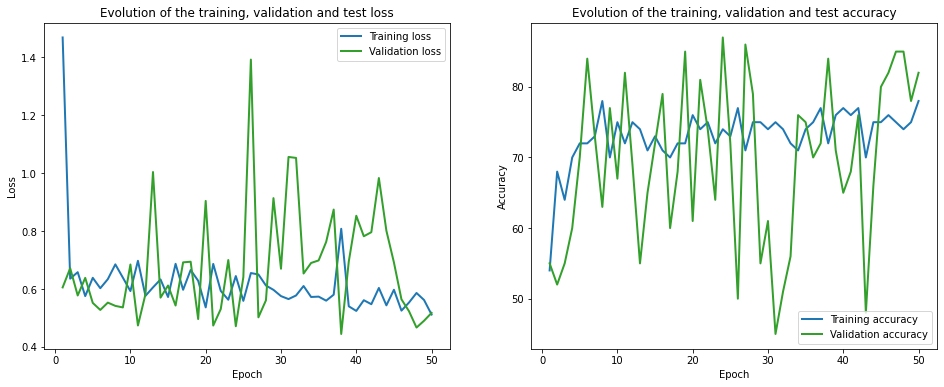

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 139.71it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1067.13it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.23 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.24 train_acc: 55.00% took: 0.02s
Epoch 1 of 50, 40% 	 train_loss: 0.73 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.65 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.73 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.30 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.70 train_acc: 55.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.28 train_acc: 85.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.68 train_acc: 70.00% took: 0.01s
val_loss = 0.38 val_acc = 80.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.42 train_acc: 80.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.15 train_acc: 90.00% took: 0.01s
Epoch 2 of 50, 30% 	 train_loss: 0.64 train_acc: 6

Epoch 12 of 50, 30% 	 train_loss: 0.57 train_acc: 70.00% took: 0.02s
Epoch 12 of 50, 40% 	 train_loss: 0.59 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.67 train_acc: 60.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.36 train_acc: 80.00% took: 0.01s
Epoch 12 of 50, 80% 	 train_loss: 0.33 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.23 train_acc: 85.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.53 train_acc: 70.00% took: 0.00s
val_loss = 0.49 val_acc = 65.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.42 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 20% 	 train_loss: 0.15 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 30% 	 train_loss: 0.59 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 40% 	 train_loss: 0.60 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 50% 	 train_loss: 0.40 train_acc: 70.00% took: 0.01s
Epoch 13 of 50, 60% 	 train_loss: 0.62 tr

Epoch 25 of 50, 60% 	 train_loss: 0.63 train_acc: 65.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.30 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.23 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.58 train_acc: 70.00% took: 0.01s
val_loss = 0.52 val_acc = 55.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.43 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.16 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.53 train_acc: 75.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.60 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 0.39 train_acc: 70.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.60 train_acc: 65.00% took: 0.01s
Epoch 26 of 50, 70% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.32 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 90% 	 train_loss: 0.21 tr

Epoch 38 of 50, 100% 	 train_loss: 0.58 train_acc: 70.00% took: 0.01s
val_loss = 0.51 val_acc = 55.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.43 train_acc: 85.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.61 train_acc: 75.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.38 train_acc: 75.00% took: 0.02s
Epoch 39 of 50, 60% 	 train_loss: 0.67 train_acc: 65.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 39 of 50, 80% 	 train_loss: 0.29 train_acc: 90.00% took: 0.01s
Epoch 39 of 50, 90% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.54 train_acc: 70.00% took: 0.00s
val_loss = 0.51 val_acc = 60.00%
Snapshot saved at epoch 39.
Epoch 40 of 50, 10% 	 train_loss: 0.43 train_acc: 85.00% took: 0.01s
Epoch 40 of 50, 20% 	 train_loss: 0.17 train_acc

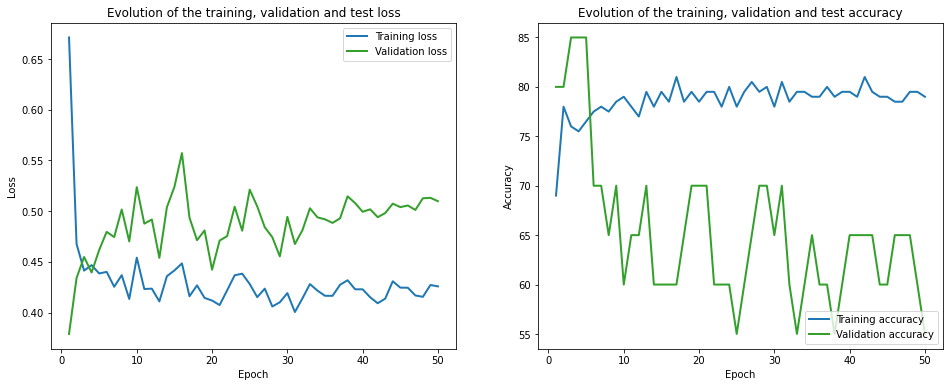

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 165.39it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1096.88it/s]

Finished computing p-values for 500 test points.

Starting repetition 49 of 50:

Training with standard data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.21 train_acc: 40.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 0.92 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.84 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 2.44 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.22 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.23 train_acc: 100.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.41 train_acc: 90.00% took: 0.00s
val_loss = 0.35 val_acc = 91.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 1.20 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.20 train_acc: 100.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.46 train_ac

Epoch 15 of 50, 90% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
Epoch 15 of 50, 100% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 87.00%
Snapshot saved at epoch 15.
Epoch 16 of 50, 10% 	 train_loss: 0.70 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 20% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 30% 	 train_loss: 0.46 train_acc: 70.00% took: 0.00s
Epoch 16 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 50% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 60% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 70% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 16 of 50, 80% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 16 of 50, 90% 	 train_loss: 0.44 train_acc: 90.00% took: 0.00s
Epoch 16 of 50, 100% 	 train_loss: 0.19 train_acc: 90.00% took: 0.00s
val_loss = 0.32 val_acc = 87.00%
Snapshot saved at epoch 16.
Epoch 17 of 50, 10% 	 train_loss: 0.70 train_a

val_loss = 0.39 val_acc = 87.00%
Snapshot saved at epoch 26.
Epoch 27 of 50, 10% 	 train_loss: 0.55 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 20% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 30% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 27 of 50, 40% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 50% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 27 of 50, 60% 	 train_loss: 0.23 train_acc: 90.00% took: 0.00s
Epoch 27 of 50, 70% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 80% 	 train_loss: 0.10 train_acc: 100.00% took: 0.01s
Epoch 27 of 50, 90% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 27 of 50, 100% 	 train_loss: 0.17 train_acc: 90.00% took: 0.01s
val_loss = 0.39 val_acc = 87.00%
Snapshot saved at epoch 27.
Epoch 28 of 50, 10% 	 train_loss: 0.56 train_acc: 80.00% took: 0.01s
Epoch 28 of 50, 20% 	 train_loss: 0.04 train_acc: 100.00% took: 0.00s
Epoch 28 of 50, 30% 	 train_loss: 0.42 train_

Epoch 38 of 50, 20% 	 train_loss: 0.03 train_acc: 100.00% took: 0.02s
Epoch 38 of 50, 30% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.17 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.17 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 70% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.09 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.42 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
val_loss = 0.41 val_acc = 87.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.67 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.1

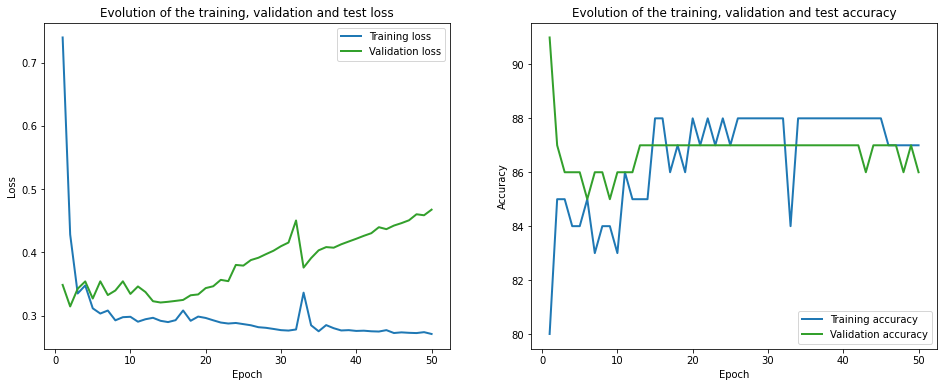

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 166.85it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1156.41it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 2.58 train_acc: 60.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.52 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 30% 	 train_loss: 0.62 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.41 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.36 train_acc: 90.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.32 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.22 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.02 train_acc: 100.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.61 train_acc: 85.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.22 train_acc: 85.00% took: 0.00s
val_loss = 0.19 val_acc = 85.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.47 train_acc: 

Epoch 12 of 50, 80% 	 train_loss: 0.03 train_acc: 100.00% took: 0.02s
Epoch 12 of 50, 90% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 12 of 50, 100% 	 train_loss: 0.18 train_acc: 95.00% took: 0.00s
val_loss = 0.16 val_acc = 95.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.34 train_acc: 90.00% took: 0.02s
Epoch 13 of 50, 30% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
Epoch 13 of 50, 40% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.36 train_acc: 95.00% took: 0.02s
Epoch 13 of 50, 60% 	 train_loss: 0.34 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.03 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 90% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 13 of 50, 100% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
val_loss = 0.15 val_acc = 95.00%
Snaps

Epoch 25 of 50, 50% 	 train_loss: 0.24 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.36 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 70% 	 train_loss: 0.37 train_acc: 85.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.02 train_acc: 100.00% took: 0.01s
Epoch 25 of 50, 90% 	 train_loss: 0.33 train_acc: 90.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.21 train_acc: 90.00% took: 0.01s
val_loss = 0.15 val_acc = 95.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 20% 	 train_loss: 0.35 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.15 train_acc: 95.00% took: 0.00s
Epoch 26 of 50, 40% 	 train_loss: 0.27 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 50% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 60% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 26 of 50, 70% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 26 of 50, 80% 	 train_loss: 0.02 t

Epoch 37 of 50, 60% 	 train_loss: 0.41 train_acc: 80.00% took: 0.00s
Epoch 37 of 50, 70% 	 train_loss: 0.40 train_acc: 85.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.05 train_acc: 100.00% took: 0.01s
Epoch 37 of 50, 90% 	 train_loss: 0.28 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.24 train_acc: 90.00% took: 0.00s
val_loss = 0.14 val_acc = 95.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.48 train_acc: 80.00% took: 0.00s
Epoch 38 of 50, 20% 	 train_loss: 0.38 train_acc: 80.00% took: 0.02s
Epoch 38 of 50, 30% 	 train_loss: 0.18 train_acc: 95.00% took: 0.01s
Epoch 38 of 50, 40% 	 train_loss: 0.26 train_acc: 90.00% took: 0.01s
Epoch 38 of 50, 50% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 60% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 70% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 80% 	 train_loss: 0.05 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 90% 	 train_loss: 0.26 

Epoch 50 of 50, 10% 	 train_loss: 0.48 train_acc: 80.00% took: 0.02s
Epoch 50 of 50, 20% 	 train_loss: 0.40 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.17 train_acc: 95.00% took: 0.01s
Epoch 50 of 50, 40% 	 train_loss: 0.16 train_acc: 95.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.25 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.39 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.46 train_acc: 85.00% took: 0.02s
Epoch 50 of 50, 80% 	 train_loss: 0.06 train_acc: 100.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.28 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
val_loss = 0.13 val_acc = 95.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


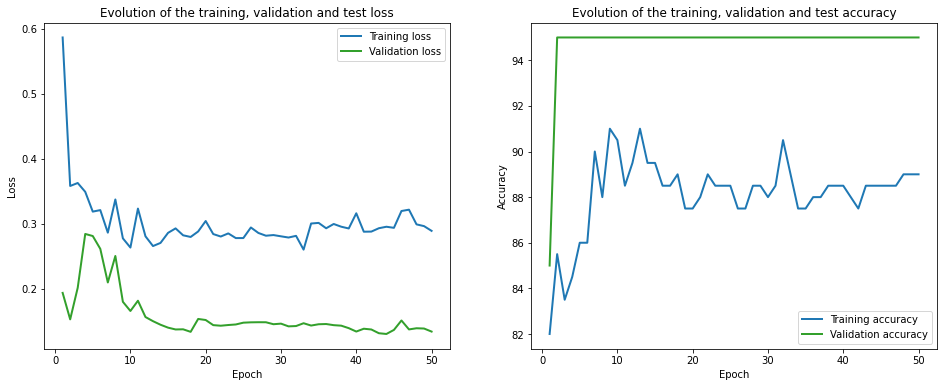

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 146.66it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1326.98it/s]

Finished computing p-values for 500 test points.

Starting repetition 50 of 50:




C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


Training with standard data splitting...
===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 0.70 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 20% 	 train_loss: 1.62 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.00 train_acc: 60.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 2.61 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 50% 	 train_loss: 0.43 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 60% 	 train_loss: 0.83 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 70% 	 train_loss: 0.40 train_acc: 50.00% took: 0.00s
Epoch 1 of 50, 80% 	 train_loss: 0.49 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 90% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 1 of 50, 100% 	 train_loss: 0.95 train_acc: 60.00% took: 0.00s
val_loss = 1.50 val_acc = 69.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 1.87 train_acc: 70.00% took: 0.00s
Epoch 2 of 50, 20% 	 train_loss: 0.38 train_acc: 100.00% took: 0.01s
Epoch 2 

Epoch 11 of 50, 100% 	 train_loss: 0.30 train_acc: 90.00% took: 0.00s
val_loss = 0.48 val_acc = 80.00%
Snapshot saved at epoch 11.
Epoch 12 of 50, 10% 	 train_loss: 0.32 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 20% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 30% 	 train_loss: 0.37 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 40% 	 train_loss: 0.42 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 50% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 60% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 12 of 50, 70% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 12 of 50, 80% 	 train_loss: 0.24 train_acc: 80.00% took: 0.00s
Epoch 12 of 50, 90% 	 train_loss: 0.51 train_acc: 70.00% took: 0.00s
Epoch 12 of 50, 100% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
val_loss = 0.47 val_acc = 80.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.34 train_acc: 80.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.12 train_a

Epoch 23 of 50, 50% 	 train_loss: 0.29 train_acc: 80.00% took: 0.02s
Epoch 23 of 50, 60% 	 train_loss: 0.22 train_acc: 90.00% took: 0.00s
Epoch 23 of 50, 70% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 23 of 50, 80% 	 train_loss: 0.13 train_acc: 90.00% took: 0.00s
Epoch 23 of 50, 90% 	 train_loss: 0.73 train_acc: 70.00% took: 0.01s
Epoch 23 of 50, 100% 	 train_loss: 0.46 train_acc: 90.00% took: 0.00s
val_loss = 0.55 val_acc = 80.00%
Snapshot saved at epoch 23.
Epoch 24 of 50, 10% 	 train_loss: 0.38 train_acc: 80.00% took: 0.02s
Epoch 24 of 50, 20% 	 train_loss: 0.12 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 30% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 24 of 50, 40% 	 train_loss: 0.37 train_acc: 70.00% took: 0.01s
Epoch 24 of 50, 50% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 60% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 24 of 50, 70% 	 train_loss: 0.10 train_acc: 100.00% took: 0.00s
Epoch 24 of 50, 80% 	 train_loss: 0.38

Epoch 38 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 38 of 50, 80% 	 train_loss: 0.21 train_acc: 80.00% took: 0.01s
Epoch 38 of 50, 90% 	 train_loss: 0.48 train_acc: 70.00% took: 0.00s
Epoch 38 of 50, 100% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
val_loss = 0.53 val_acc = 82.00%
Snapshot saved at epoch 38.
Epoch 39 of 50, 10% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 20% 	 train_loss: 0.11 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 30% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
Epoch 39 of 50, 40% 	 train_loss: 0.33 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 50% 	 train_loss: 0.40 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 60% 	 train_loss: 0.20 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 70% 	 train_loss: 0.18 train_acc: 100.00% took: 0.00s
Epoch 39 of 50, 80% 	 train_loss: 0.15 train_acc: 90.00% took: 0.00s
Epoch 39 of 50, 90% 	 train_loss: 0.61 train_acc: 70.00% took: 0.00s
Epoch 39 of 50, 100% 	 train_loss: 0.3

Epoch 49 of 50, 90% 	 train_loss: 0.56 train_acc: 70.00% took: 0.02s
Epoch 49 of 50, 100% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
val_loss = 0.59 val_acc = 80.00%
Snapshot saved at epoch 49.
Epoch 50 of 50, 10% 	 train_loss: 0.31 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 20% 	 train_loss: 0.07 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.35 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 50% 	 train_loss: 0.36 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 60% 	 train_loss: 0.17 train_acc: 90.00% took: 0.02s
Epoch 50 of 50, 70% 	 train_loss: 0.13 train_acc: 100.00% took: 0.00s
Epoch 50 of 50, 80% 	 train_loss: 0.27 train_acc: 80.00% took: 0.00s
Epoch 50 of 50, 90% 	 train_loss: 0.55 train_acc: 70.00% took: 0.00s
Epoch 50 of 50, 100% 	 train_loss: 0.18 train_acc: 90.00% took: 0.00s
val_loss = 0.61 val_acc = 80.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


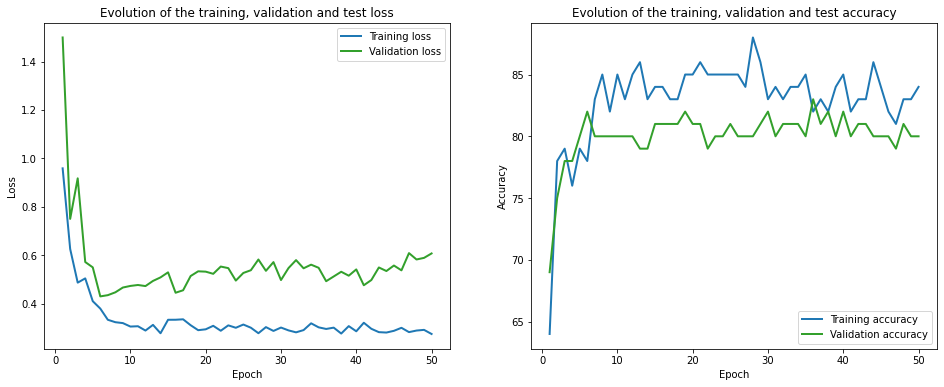

Computing standard benchmark p-values for 500 test points...
Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 163.27it/s]


Initialization done!


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1104.09it/s]

Finished computing p-values for 500 test points.
Training with CES data splitting...



C:\Users\16266\AppData\Local\Temp\ipykernel_5424\3423077815.py:20: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  th.nn.init.xavier_uniform(m.weight)


===== HYPERPARAMETERS =====
batch_size= 10
n_epochs= 50
learning_rate= 1
Epoch 1 of 50, 10% 	 train_loss: 1.06 train_acc: 65.00% took: 0.01s
Epoch 1 of 50, 20% 	 train_loss: 0.43 train_acc: 75.00% took: 0.00s
Epoch 1 of 50, 30% 	 train_loss: 1.06 train_acc: 80.00% took: 0.00s
Epoch 1 of 50, 40% 	 train_loss: 0.94 train_acc: 45.00% took: 0.01s
Epoch 1 of 50, 50% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 60% 	 train_loss: 0.43 train_acc: 80.00% took: 0.01s
Epoch 1 of 50, 70% 	 train_loss: 0.55 train_acc: 70.00% took: 0.01s
Epoch 1 of 50, 80% 	 train_loss: 0.81 train_acc: 75.00% took: 0.01s
Epoch 1 of 50, 90% 	 train_loss: 0.29 train_acc: 95.00% took: 0.01s
Epoch 1 of 50, 100% 	 train_loss: 0.52 train_acc: 75.00% took: 0.01s
val_loss = 0.65 val_acc = 55.00%
Snapshot saved at epoch 1.
Epoch 2 of 50, 10% 	 train_loss: 0.38 train_acc: 85.00% took: 0.01s
Epoch 2 of 50, 20% 	 train_loss: 0.58 train_acc: 65.00% took: 0.00s
Epoch 2 of 50, 30% 	 train_loss: 0.53 train_acc: 8

Epoch 12 of 50, 90% 	 train_loss: 0.24 train_acc: 95.00% took: 0.02s
Epoch 12 of 50, 100% 	 train_loss: 0.45 train_acc: 80.00% took: 0.00s
val_loss = 0.62 val_acc = 65.00%
Snapshot saved at epoch 12.
Epoch 13 of 50, 10% 	 train_loss: 0.33 train_acc: 85.00% took: 0.00s
Epoch 13 of 50, 20% 	 train_loss: 0.51 train_acc: 75.00% took: 0.00s
Epoch 13 of 50, 30% 	 train_loss: 0.38 train_acc: 85.00% took: 0.02s
Epoch 13 of 50, 40% 	 train_loss: 0.16 train_acc: 100.00% took: 0.00s
Epoch 13 of 50, 50% 	 train_loss: 0.93 train_acc: 95.00% took: 0.02s
Epoch 13 of 50, 60% 	 train_loss: 0.40 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 70% 	 train_loss: 0.50 train_acc: 75.00% took: 0.01s
Epoch 13 of 50, 80% 	 train_loss: 0.78 train_acc: 80.00% took: 0.01s
Epoch 13 of 50, 90% 	 train_loss: 0.25 train_acc: 90.00% took: 0.01s
Epoch 13 of 50, 100% 	 train_loss: 0.61 train_acc: 75.00% took: 0.01s
val_loss = 0.70 val_acc = 65.00%
Snapshot saved at epoch 13.
Epoch 14 of 50, 10% 	 train_loss: 0.34 train_ac

Epoch 25 of 50, 20% 	 train_loss: 0.74 train_acc: 75.00% took: 0.02s
Epoch 25 of 50, 30% 	 train_loss: 0.45 train_acc: 80.00% took: 0.01s
Epoch 25 of 50, 40% 	 train_loss: 0.29 train_acc: 90.00% took: 0.00s
Epoch 25 of 50, 50% 	 train_loss: 2.18 train_acc: 95.00% took: 0.01s
Epoch 25 of 50, 60% 	 train_loss: 0.39 train_acc: 80.00% took: 0.00s
Epoch 25 of 50, 70% 	 train_loss: 0.62 train_acc: 65.00% took: 0.01s
Epoch 25 of 50, 80% 	 train_loss: 0.31 train_acc: 95.00% took: 0.00s
Epoch 25 of 50, 90% 	 train_loss: 0.17 train_acc: 100.00% took: 0.01s
Epoch 25 of 50, 100% 	 train_loss: 0.39 train_acc: 80.00% took: 0.01s
val_loss = 0.52 val_acc = 70.00%
Snapshot saved at epoch 25.
Epoch 26 of 50, 10% 	 train_loss: 0.39 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 20% 	 train_loss: 0.54 train_acc: 75.00% took: 0.00s
Epoch 26 of 50, 30% 	 train_loss: 0.34 train_acc: 85.00% took: 0.01s
Epoch 26 of 50, 40% 	 train_loss: 0.31 train_acc: 90.00% took: 0.00s
Epoch 26 of 50, 50% 	 train_loss: 1.32 t

Epoch 37 of 50, 10% 	 train_loss: 0.35 train_acc: 85.00% took: 0.02s
Epoch 37 of 50, 20% 	 train_loss: 0.47 train_acc: 80.00% took: 0.01s
Epoch 37 of 50, 30% 	 train_loss: 0.33 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 40% 	 train_loss: 0.15 train_acc: 100.00% took: 0.00s
Epoch 37 of 50, 50% 	 train_loss: 0.80 train_acc: 95.00% took: 0.00s
Epoch 37 of 50, 60% 	 train_loss: 0.44 train_acc: 85.00% took: 0.02s
Epoch 37 of 50, 70% 	 train_loss: 0.56 train_acc: 70.00% took: 0.00s
Epoch 37 of 50, 80% 	 train_loss: 0.41 train_acc: 90.00% took: 0.02s
Epoch 37 of 50, 90% 	 train_loss: 0.26 train_acc: 90.00% took: 0.00s
Epoch 37 of 50, 100% 	 train_loss: 0.40 train_acc: 85.00% took: 0.01s
val_loss = 0.61 val_acc = 65.00%
Snapshot saved at epoch 37.
Epoch 38 of 50, 10% 	 train_loss: 0.32 train_acc: 85.00% took: 0.01s
Epoch 38 of 50, 20% 	 train_loss: 0.44 train_acc: 75.00% took: 0.01s
Epoch 38 of 50, 30% 	 train_loss: 0.34 train_acc: 90.00% took: 0.00s
Epoch 38 of 50, 40% 	 train_loss: 0.57 t

Epoch 50 of 50, 10% 	 train_loss: 0.35 train_acc: 80.00% took: 0.01s
Epoch 50 of 50, 20% 	 train_loss: 0.42 train_acc: 75.00% took: 0.00s
Epoch 50 of 50, 30% 	 train_loss: 0.32 train_acc: 90.00% took: 0.00s
Epoch 50 of 50, 40% 	 train_loss: 0.45 train_acc: 75.00% took: 0.02s
Epoch 50 of 50, 50% 	 train_loss: 0.87 train_acc: 75.00% took: 0.01s
Epoch 50 of 50, 60% 	 train_loss: 0.31 train_acc: 85.00% took: 0.00s
Epoch 50 of 50, 70% 	 train_loss: 0.61 train_acc: 70.00% took: 0.01s
Epoch 50 of 50, 80% 	 train_loss: 0.35 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 90% 	 train_loss: 0.23 train_acc: 90.00% took: 0.01s
Epoch 50 of 50, 100% 	 train_loss: 0.44 train_acc: 80.00% took: 0.00s
val_loss = 0.64 val_acc = 65.00%
Snapshot saved at epoch 50.
Training done! A list of 50 models saved.


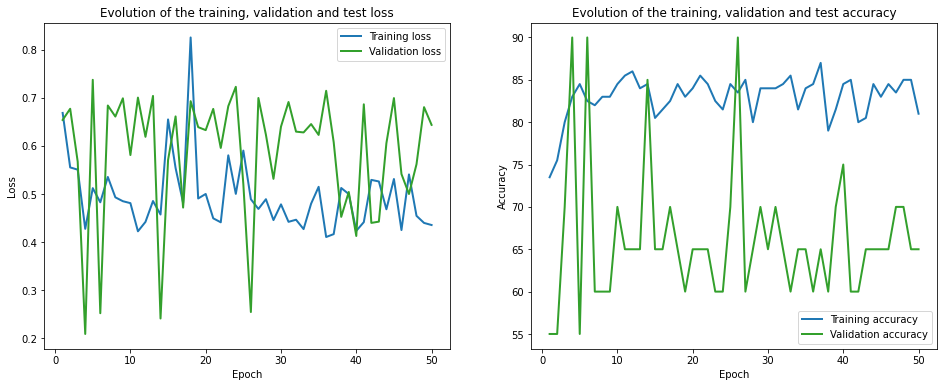

Calibrating each model in the list...


100%|█████████████████████████████████████████████████████████████████████████████████| 50/50 [00:00<00:00, 155.64it/s]


Initialization done!
Computing naive benchmark p-values for 500 test points...


100%|██████████████████████████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 1233.88it/s]

Finished computing p-values for 500 test points.


In [11]:
def add_header(df):
    df["n_epoch"] = n_epoch
    df["n_calib"] = n_cal_bm
    return df

results = pd.DataFrame({})

for r in range(num_repetitions):
    print("\nStarting repetition {:d} of {:d}:\n".format(r+1, num_repetitions))
    sys.stdout.flush()
    
    # Change random seed for this repetition
    seed = 1000+r
    results_new = run_experiment(seed, train_set, n_train_bm, cal_set, n_val_bm, n_cal_bm, 
                                 test_set, n_test, lr, n_epoch, alpha_list, batch_size)
    results_new = add_header(results_new)
    results_new["Repetition"] = r
    results = pd.concat([results, results_new])

In [12]:
sb_results = results[results["Method"]=="Standard benchmark"]
nb_results = results[results["Method"]=="Naive benchmark"]

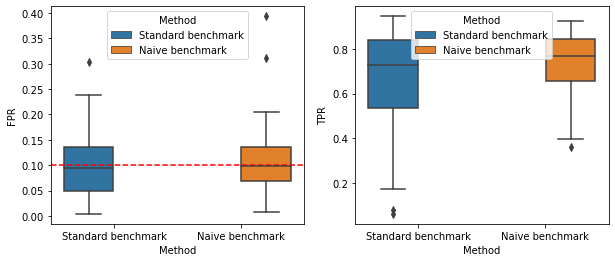

In [13]:
import seaborn as sns
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,4))
sns.boxplot(y="Fixed-FPR", x="Method", hue="Method", data=results, ax=ax1)
ax1.set(xlabel='Method', ylabel='FPR')
ax1.axhline(alpha_list[0], ls='--', color="red")
ax1.legend(loc='upper center', title='Method')

sns.boxplot(y="Fixed-TPR", x="Method", hue="Method", data=results, ax=ax2)
ax2.set(xlabel='Method', ylabel='TPR')
ax2.legend(loc='upper center', title='Method')
plt.show()

In [14]:
results[:20]

,Alpha,BH-Rejections,BH-FDP,BH-Power,Storey-BH-Rejections,Storey-BH-FDP,Storey-BH-Power,Fixed-Rejections,Fixed-FPR,Fixed-TPR,Method,train_loss_history,val_loss_history,train_acc_history,val_acc_history,n_epoch,n_calib,Repetition
0,0.1,0.0,0.000000,0.000000,314.0,0.235669,0.937500,314.0,0.303279,0.937500,Standard benchmark,"[2.6196941897273063, 0.45735466163605454, 0.33...","[0.5940154194831848, 0.45191141963005066, 0.46...","[60.00000014901161, 80.99999964237213, 80.9999...","[83.99999737739563, 80.0000011920929, 81.00000...",50,20,0
0,0.1,0.0,0.000000,0.000000,133.0,0.037594,0.500000,216.0,0.086066,0.761719,Naive benchmark,"[0.7645794166252017, 0.3651513457298279, 0.339...","[0.33868926763534546, 0.29345616698265076, 0.2...","[72.99999982118607, 81.4999994635582, 82.99999...","[79.99999821186066, 79.99999821186066, 89.9999...",50,20,0
0,0.1,0.0,0.000000,0.000000,180.0,0.083333,0.644531,202.0,0.073770,0.718750,Standard benchmark,"[5.414329552650452, 0.6070365607738495, 0.5441...","[0.7607979774475098, 0.2919747233390808, 0.267...","[53.0000002682209, 66.99999943375587, 73.99999...","[41.999998688697815, 87.00000047683716, 87.999...",50,20,1
0,0.1,254.0,0.157480,0.835938,254.0,0.157480,0.835938,254.0,0.163934,0.835938,Naive benchmark,"[0.5956275537610054, 0.47704331651329995, 0.47...","[0.8287480771541595, 0.756901204586029, 0.7558...","[71.5000008046627, 78.50000023841858, 78.50000...","[45.00000178813934, 50.00000149011612, 55.0000...",50,20,1
0,0.1,0.0,0.000000,0.000000,0.0,0.000000,0.000000,169.0,0.049180,0.613281,Standard benchmark,"[1.0730678230524062, 0.6112852334976197, 0.582...","[0.5538086891174316, 0.5983440279960632, 0.597...","[61.99999988079071, 65.99999994039536, 65.9999...","[72.00000286102295, 69.9999988079071, 69.99999...",50,20,2
0,0.1,0.0,0.000000,0.000000,149.0,0.060403,0.546875,171.0,0.040984,0.628906,Naive benchmark,"[0.9157758027315139, 0.6107539184391498, 0.561...","[0.6717028617858887, 0.7371739745140076, 0.641...","[68.50000020116568, 73.49999971687794, 72.0000...","[65.00000059604645, 40.00000059604645, 59.9999...",50,20,2
0,0.1,0.0,0.000000,0.000000,220.0,0.095455,0.777344,220.0,0.086066,0.777344,Standard benchmark,"[1.2160760134458541, 0.5488050729036331, 0.534...","[0.3962012529373169, 0.3624137043952942, 0.350...","[68.99999976158142, 75.99999964237213, 75.0000...","[82.99999833106995, 86.00000143051147, 87.0000...",50,20,3
0,0.1,0.0,0.000000,0.000000,267.0,0.142322,0.894531,231.0,0.098361,0.808594,Naive benchmark,"[0.48682577088475226, 0.41943574231117964, 0.3...","[0.2227541282773018, 0.17313415184617043, 0.08...","[80.49999982118607, 81.99999988079071, 83.4999...","[84.99999940395355, 90.00000059604645, 100.0, ...",50,20,3
0,0.1,0.0,0.000000,0.000000,360.0,0.302778,0.980469,204.0,0.094262,0.707031,Standard benchmark,"[0.42016941159963606, 0.2527655653655529, 0.21...","[0.40033966302871704, 0.3858356773853302, 0.40...","[81.99999958276749, 84.9999988079071, 89.99999...","[82.99999833106995, 81.99999928474426, 80.0000...",50,20,4
0,0.1,0.0,0.000000,0.000000,323.0,0.244582,0.953125,224.0,0.110656,0.769531,Naive benchmark,"[0.9768143400549889, 0.6077200293540954, 0.598...","[0.9711823761463165, 0.36775700747966766, 0.30...","[71.49999991059303, 78.49999964237213, 78.4999...","[60.00000238418579, 84.99999940395355, 90.0000...",50,20,4


Standard benchmark index number is 0, false positive rate is 0.303279


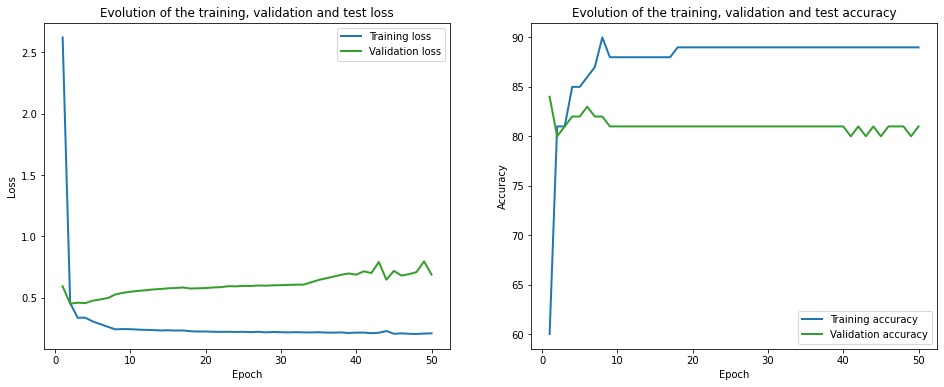

Standard benchmark index number is 1, false positive rate is 0.073770


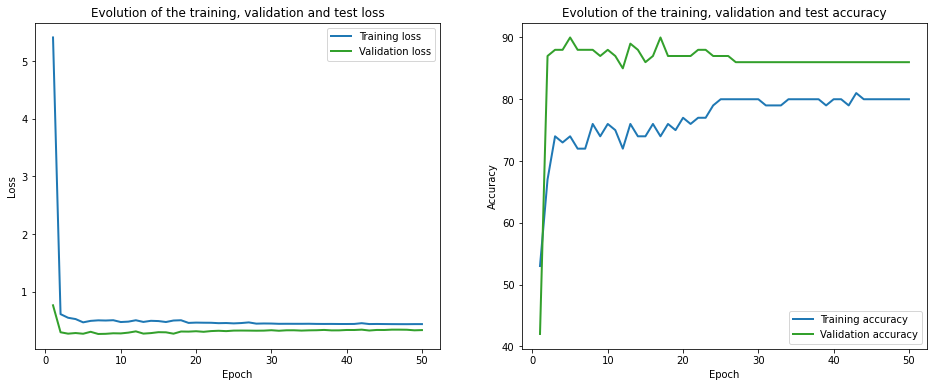

Standard benchmark index number is 2, false positive rate is 0.049180


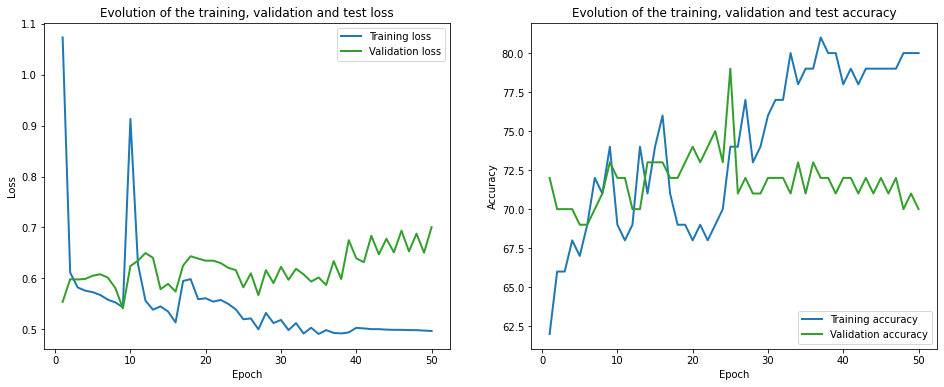

Standard benchmark index number is 3, false positive rate is 0.086066


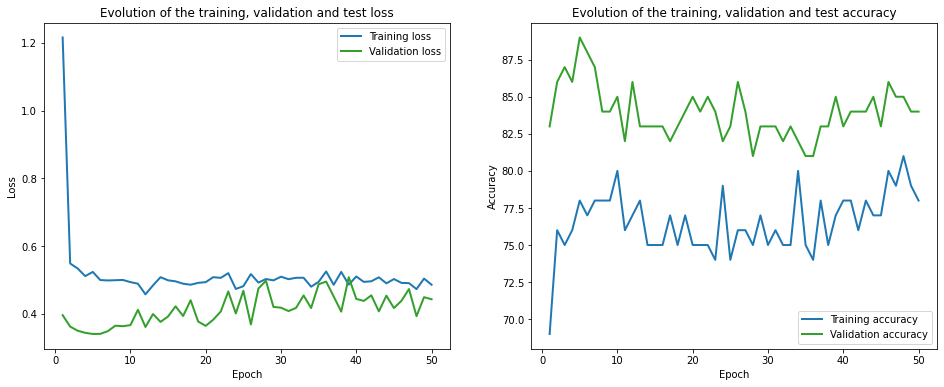

Standard benchmark index number is 4, false positive rate is 0.094262


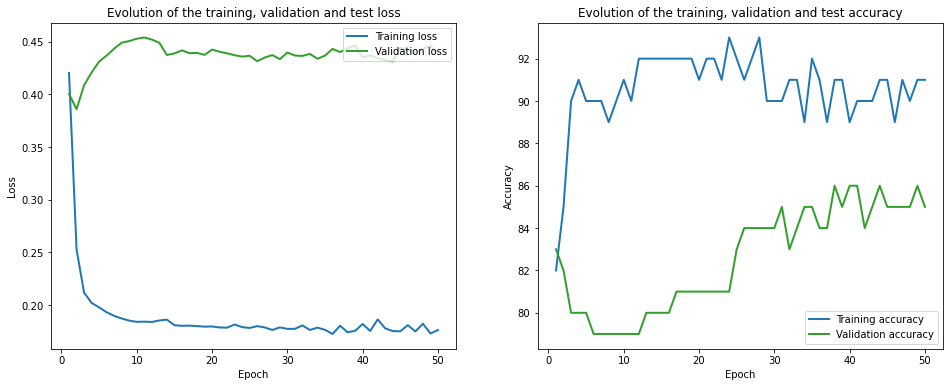

Standard benchmark index number is 5, false positive rate is 0.102459


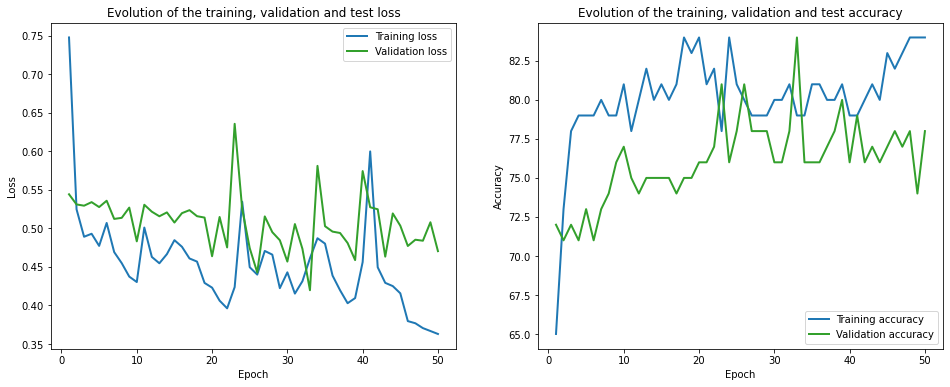

Standard benchmark index number is 6, false positive rate is 0.184426


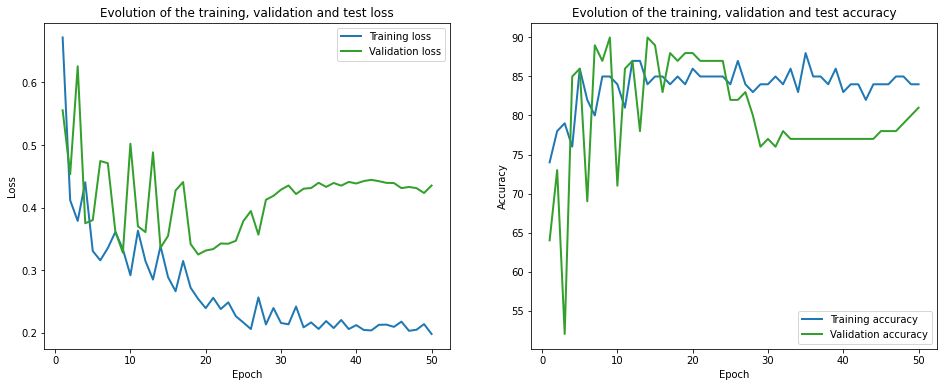

Standard benchmark index number is 7, false positive rate is 0.086066


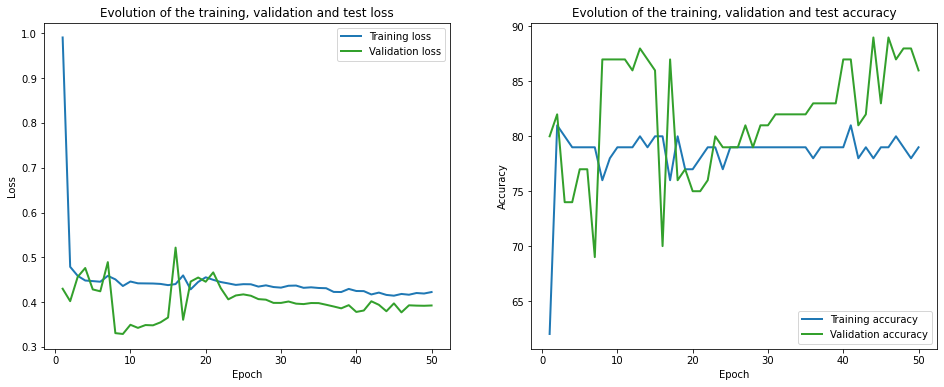

Standard benchmark index number is 8, false positive rate is 0.020492


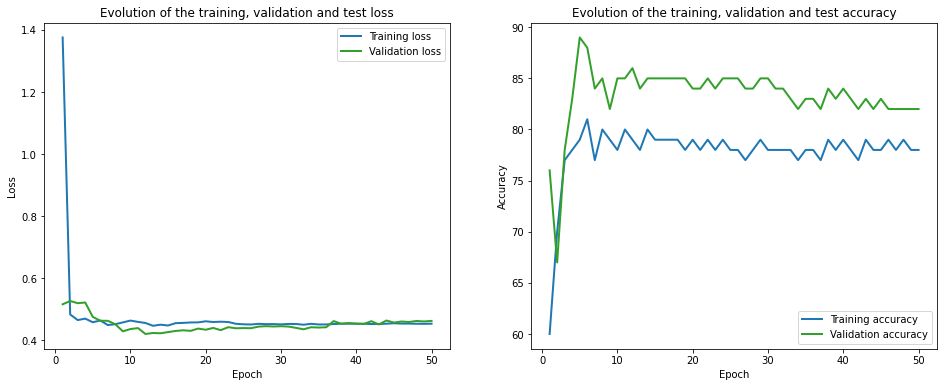

Standard benchmark index number is 9, false positive rate is 0.176230


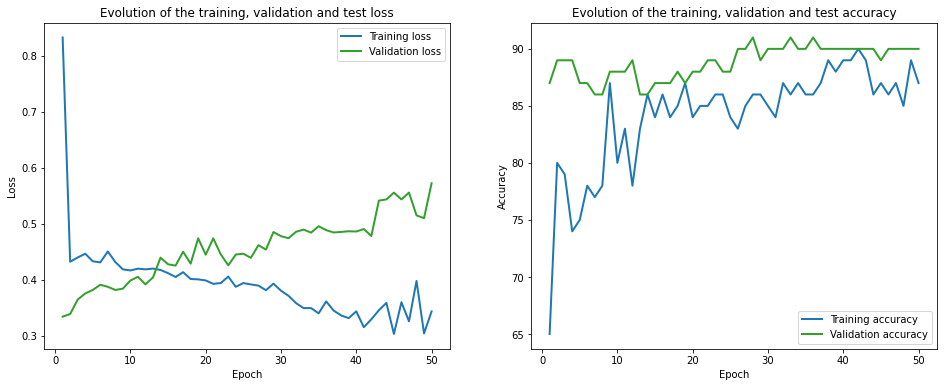

Standard benchmark index number is 10, false positive rate is 0.225410


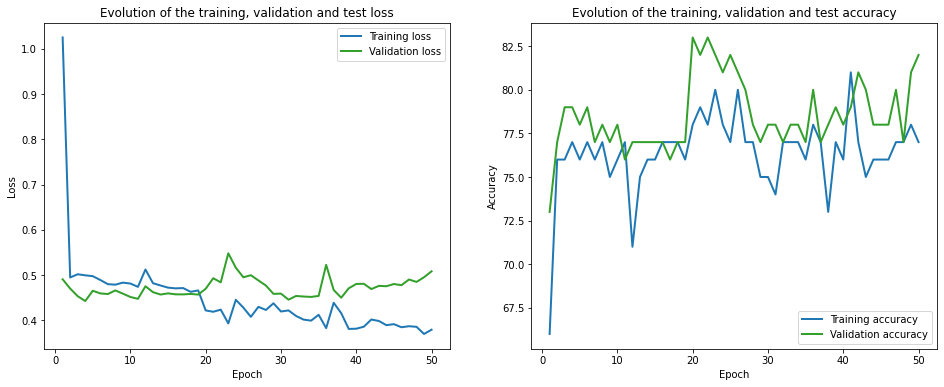

Standard benchmark index number is 11, false positive rate is 0.106557


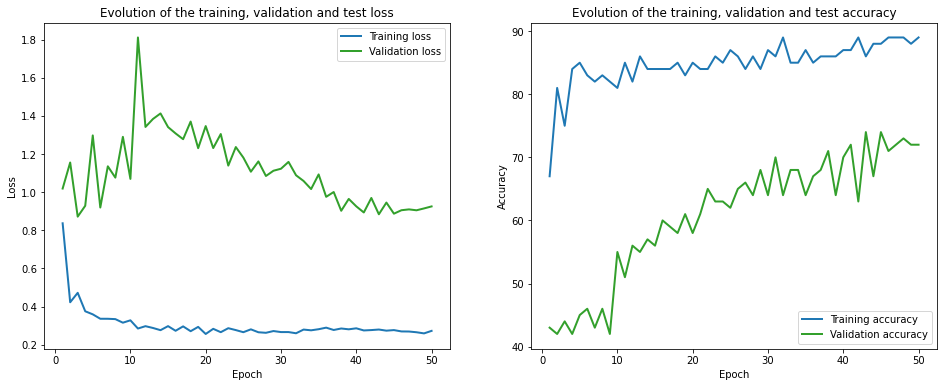

Standard benchmark index number is 12, false positive rate is 0.053279


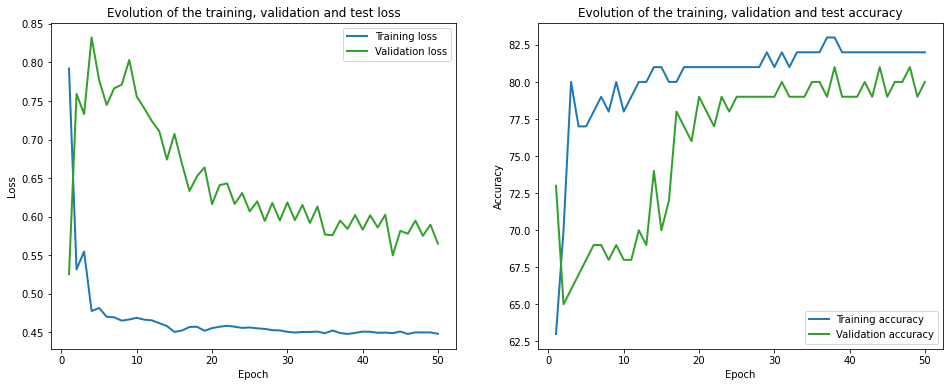

Standard benchmark index number is 13, false positive rate is 0.098361


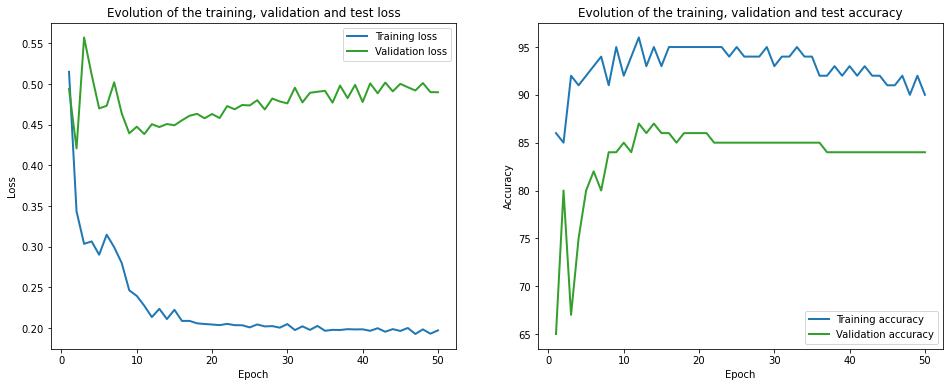

Standard benchmark index number is 14, false positive rate is 0.102459


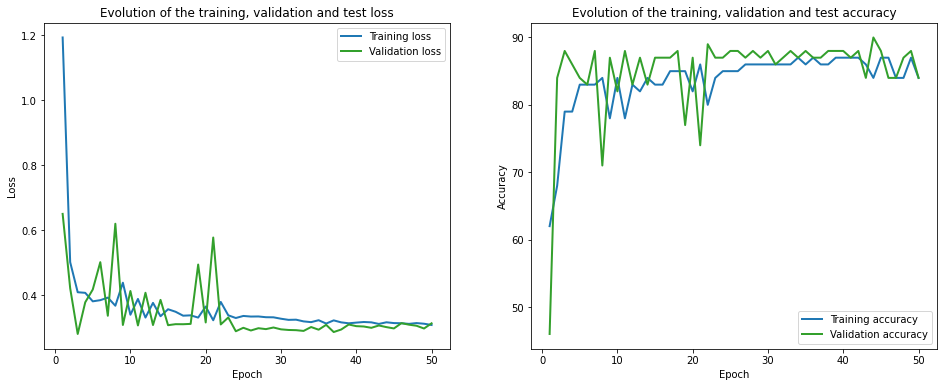

Standard benchmark index number is 15, false positive rate is 0.135246


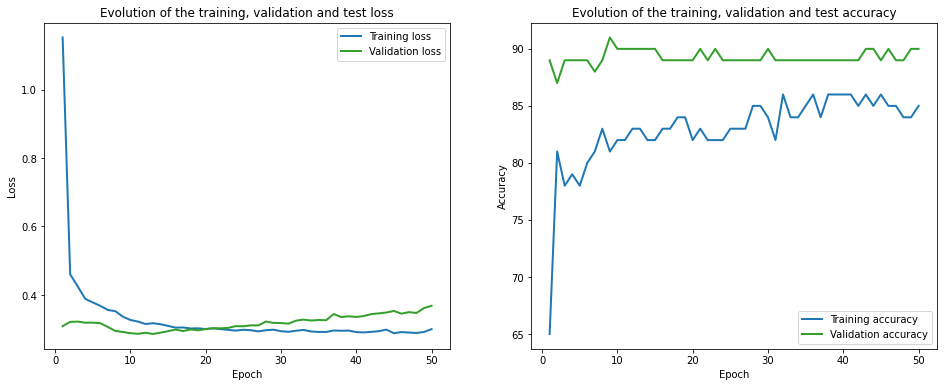

Standard benchmark index number is 16, false positive rate is 0.217213


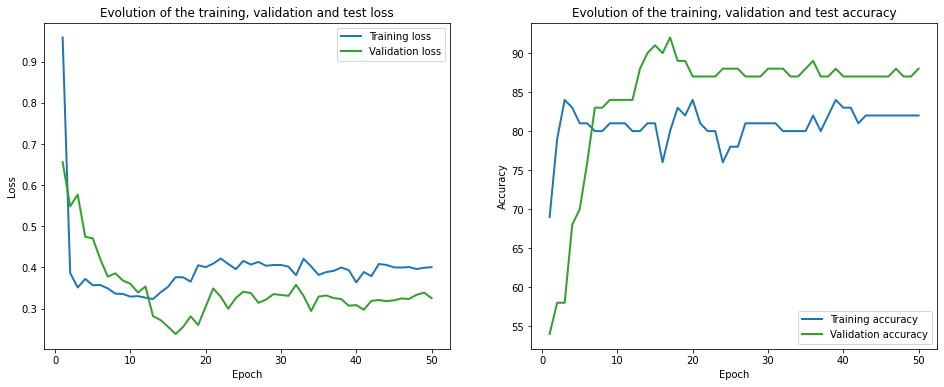

Standard benchmark index number is 17, false positive rate is 0.237705


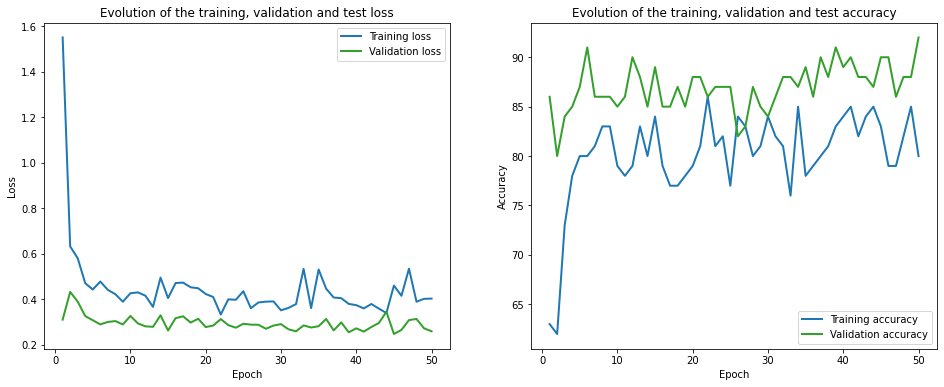

Standard benchmark index number is 18, false positive rate is 0.012295


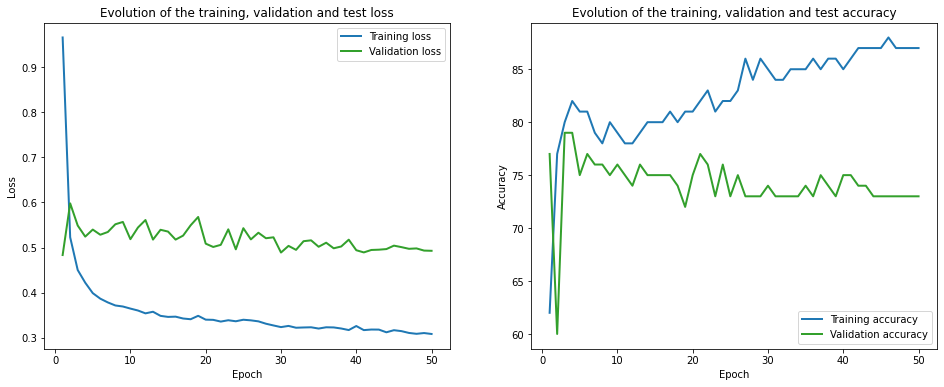

Standard benchmark index number is 19, false positive rate is 0.131148


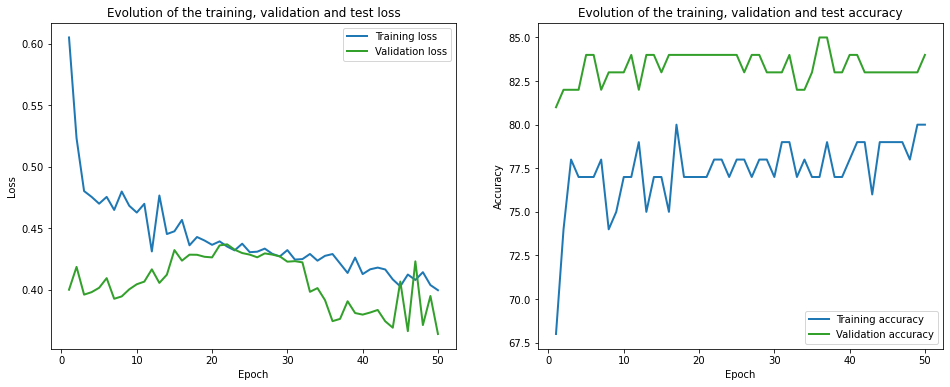

Standard benchmark index number is 20, false positive rate is 0.180328


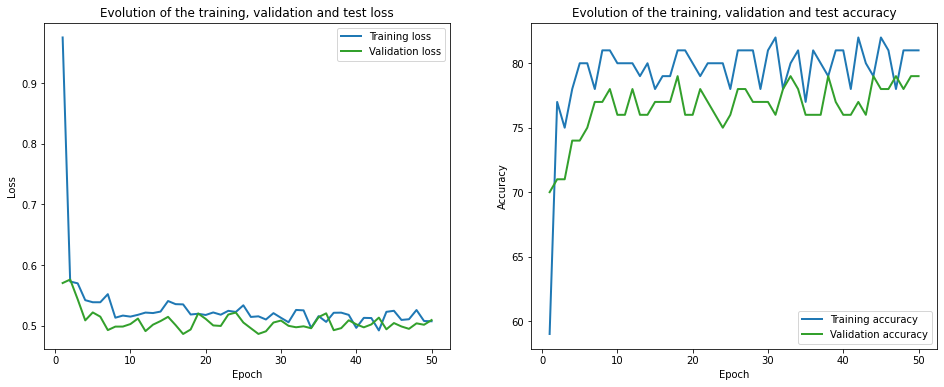

Standard benchmark index number is 21, false positive rate is 0.040984


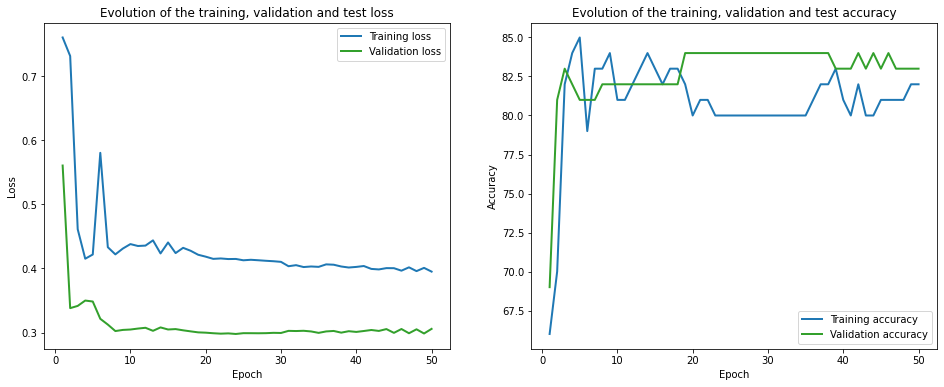

Standard benchmark index number is 22, false positive rate is 0.065574


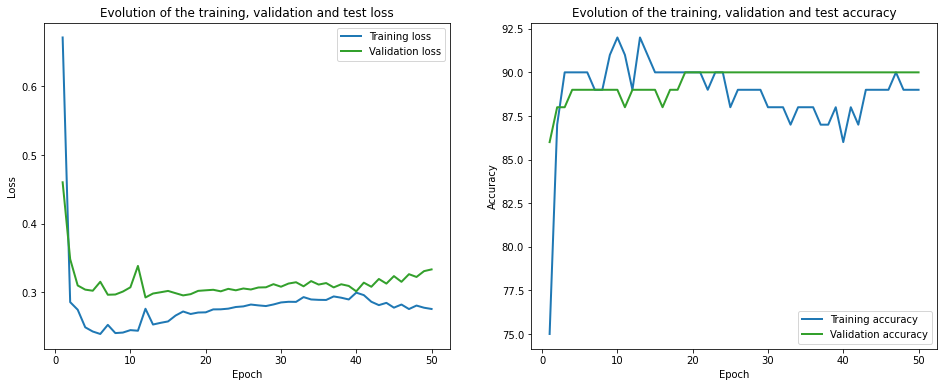

Standard benchmark index number is 23, false positive rate is 0.073770


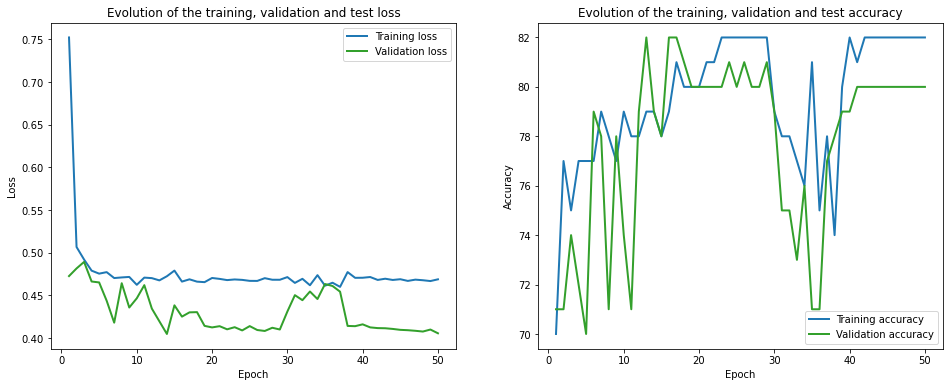

Standard benchmark index number is 24, false positive rate is 0.135246


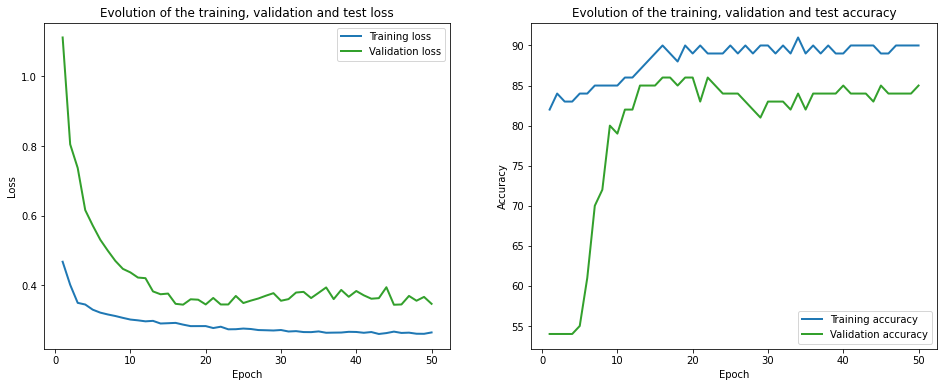

Standard benchmark index number is 25, false positive rate is 0.057377


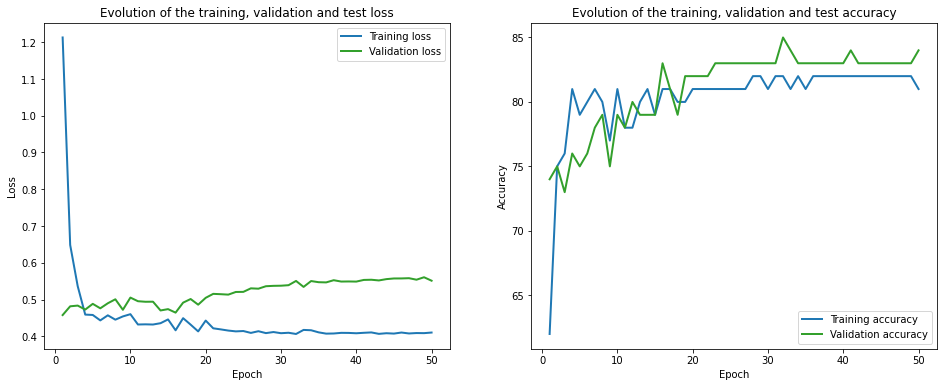

Standard benchmark index number is 26, false positive rate is 0.098361


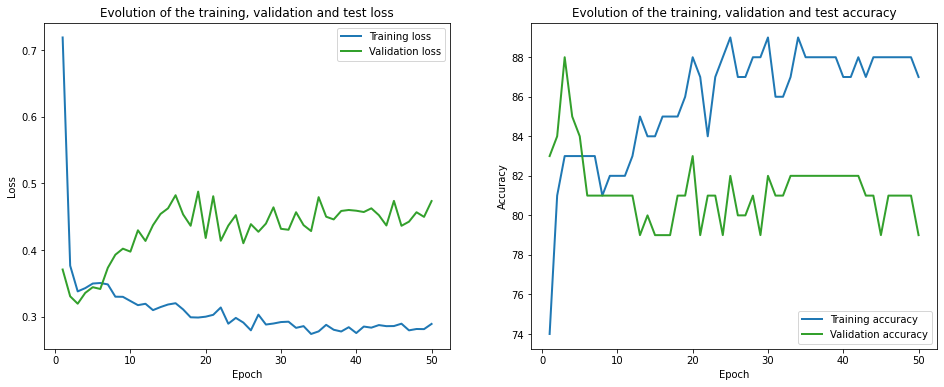

Standard benchmark index number is 27, false positive rate is 0.028689


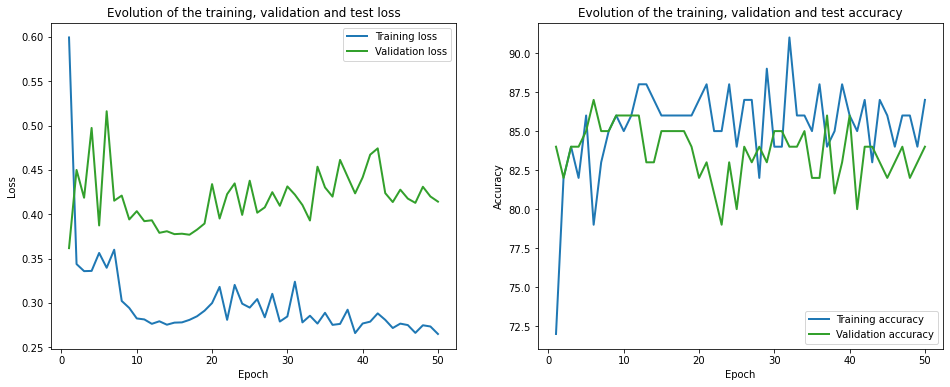

Standard benchmark index number is 28, false positive rate is 0.094262


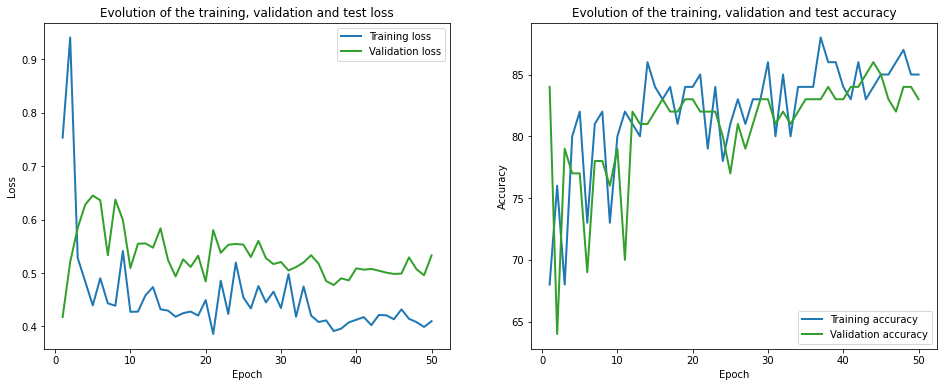

Standard benchmark index number is 29, false positive rate is 0.135246


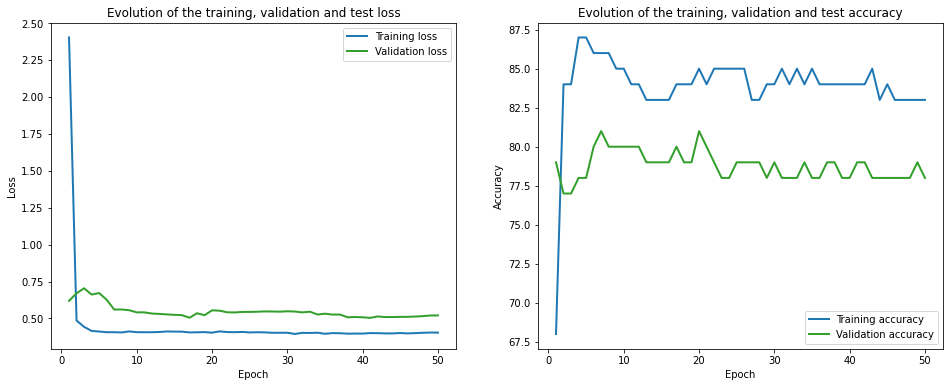

Standard benchmark index number is 30, false positive rate is 0.020492


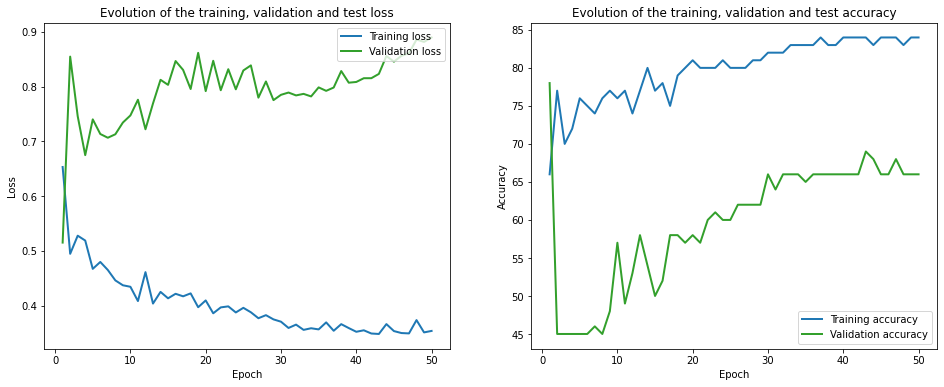

Standard benchmark index number is 31, false positive rate is 0.061475


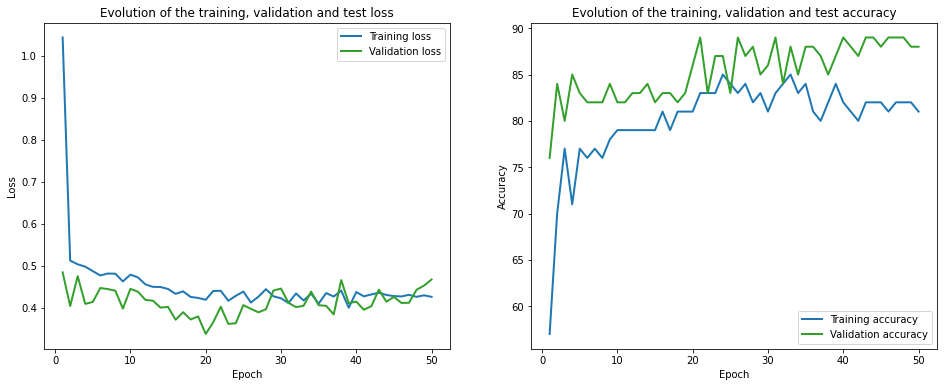

Standard benchmark index number is 32, false positive rate is 0.090164


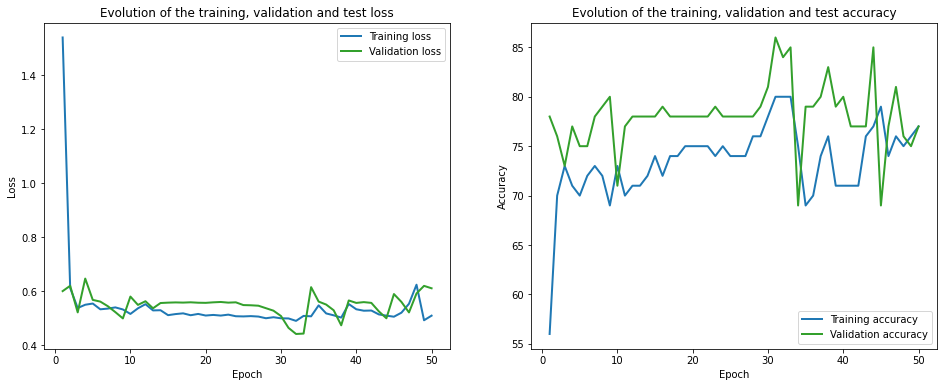

Standard benchmark index number is 33, false positive rate is 0.114754


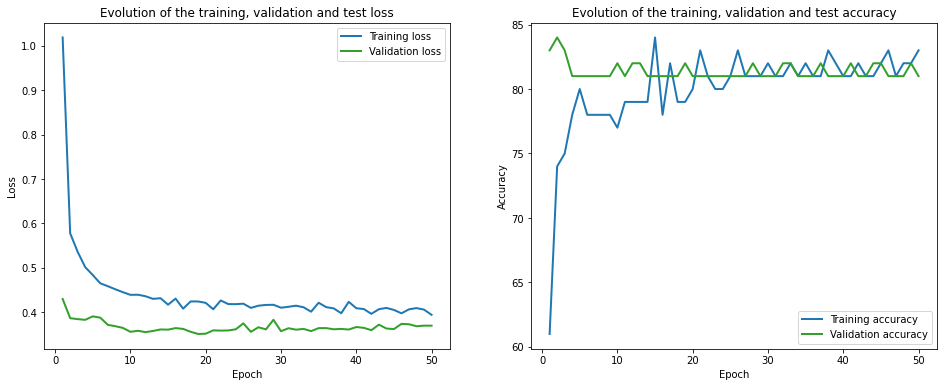

Standard benchmark index number is 34, false positive rate is 0.016393


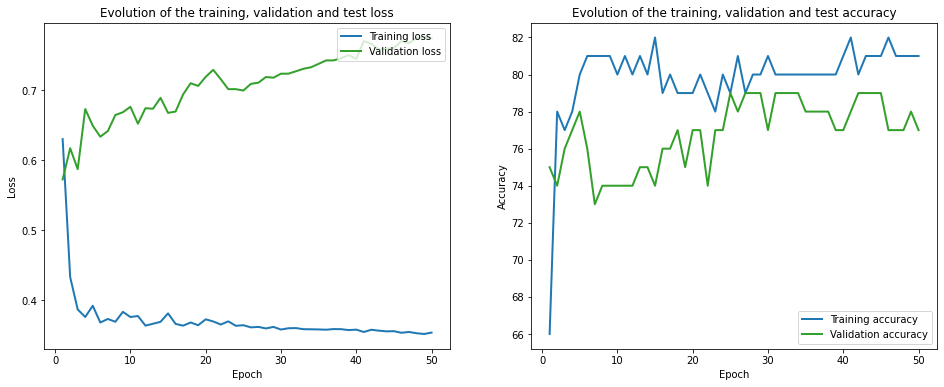

Standard benchmark index number is 35, false positive rate is 0.217213


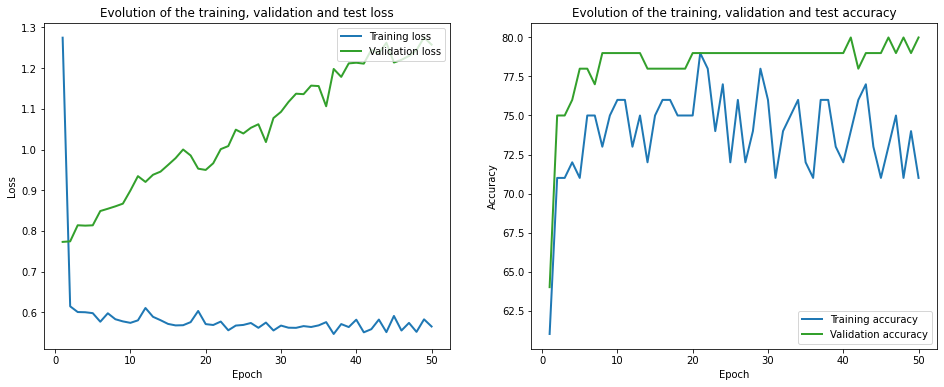

Standard benchmark index number is 36, false positive rate is 0.069672


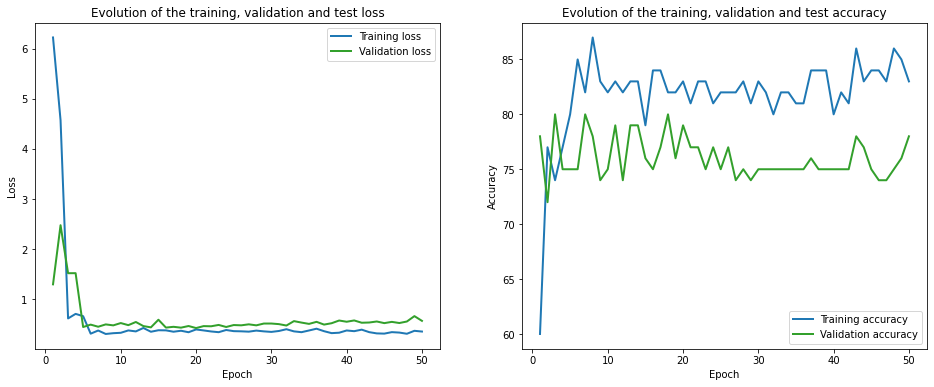

Standard benchmark index number is 37, false positive rate is 0.004098


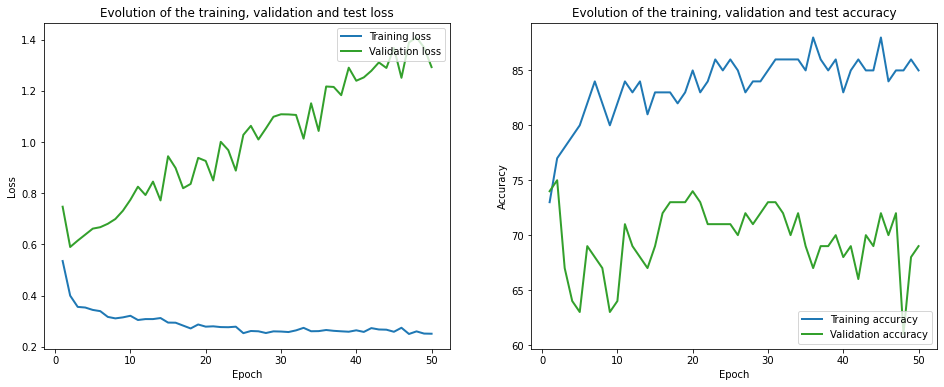

Standard benchmark index number is 38, false positive rate is 0.024590


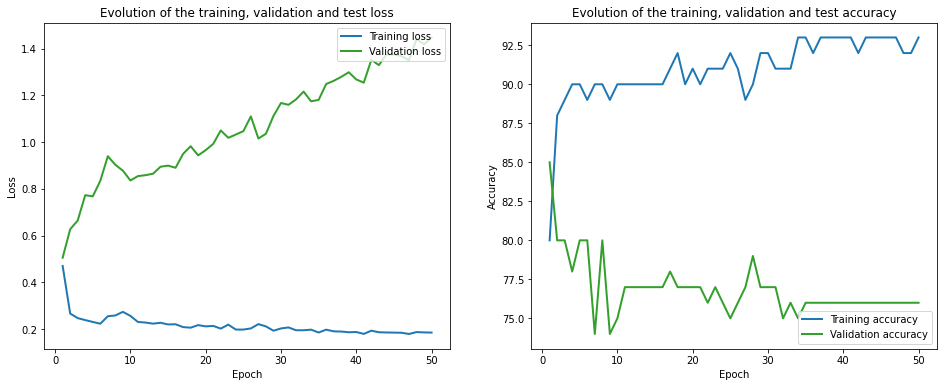

Standard benchmark index number is 39, false positive rate is 0.106557


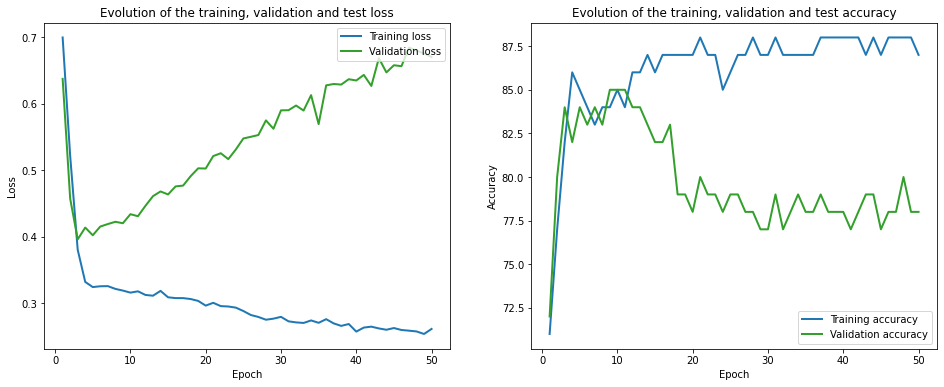

Standard benchmark index number is 40, false positive rate is 0.020492


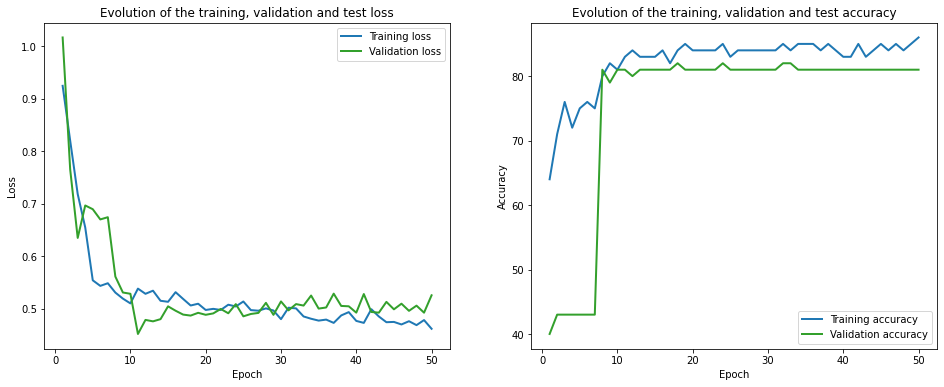

Standard benchmark index number is 41, false positive rate is 0.098361


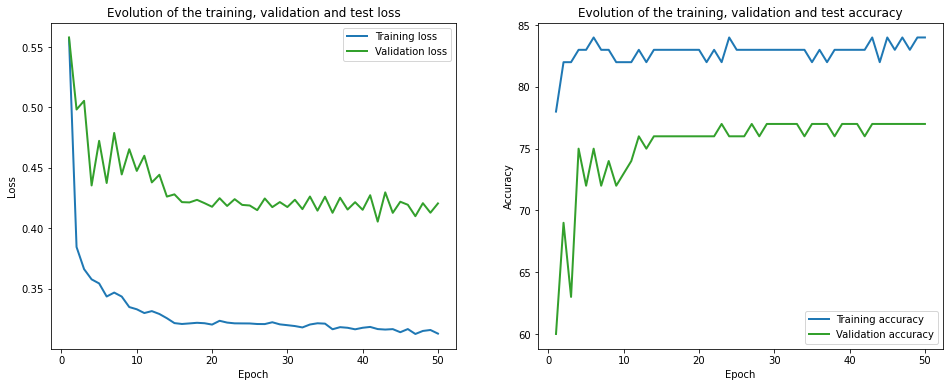

Standard benchmark index number is 42, false positive rate is 0.200820


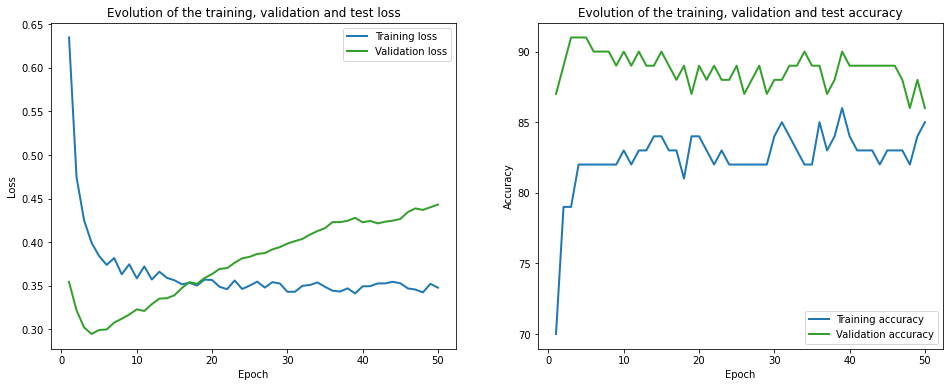

Standard benchmark index number is 43, false positive rate is 0.020492


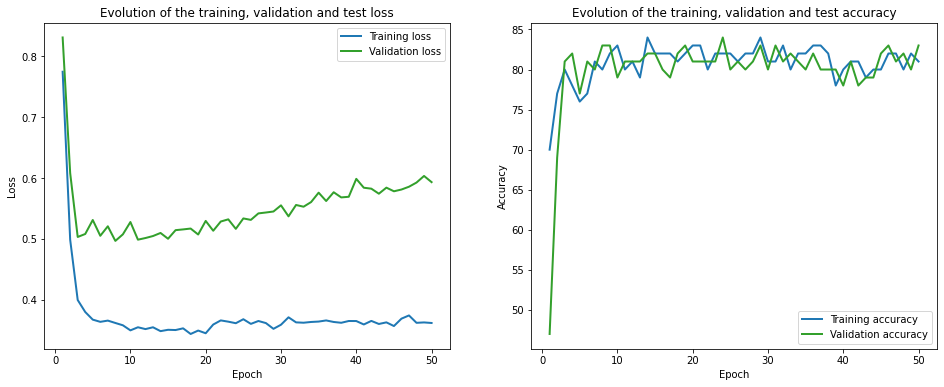

Standard benchmark index number is 44, false positive rate is 0.020492


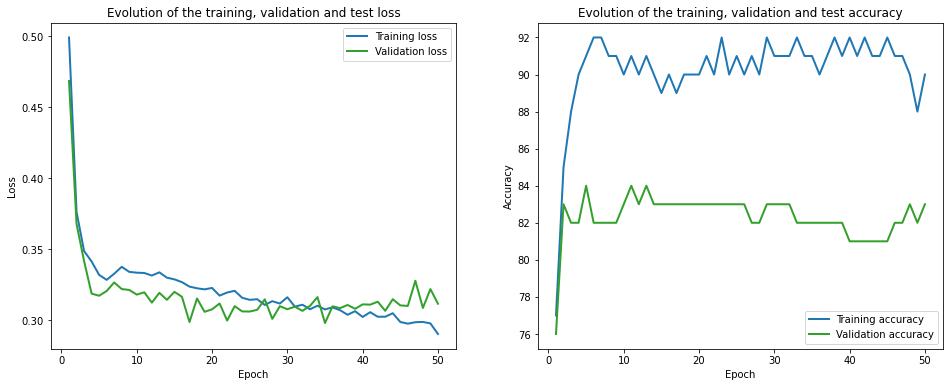

Standard benchmark index number is 45, false positive rate is 0.094262


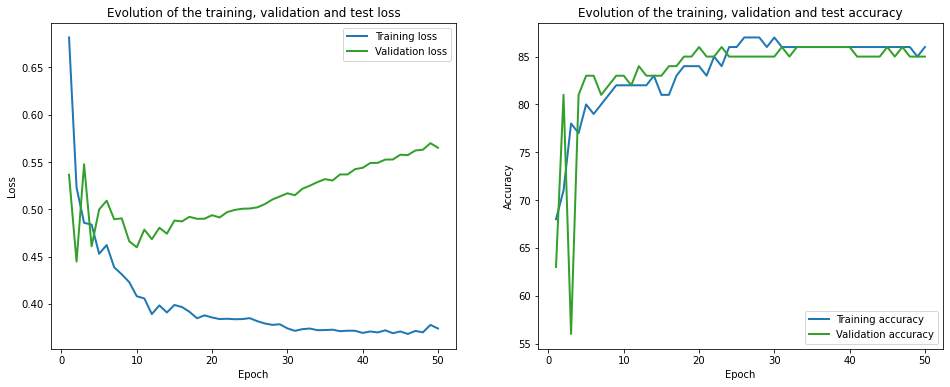

Standard benchmark index number is 46, false positive rate is 0.032787


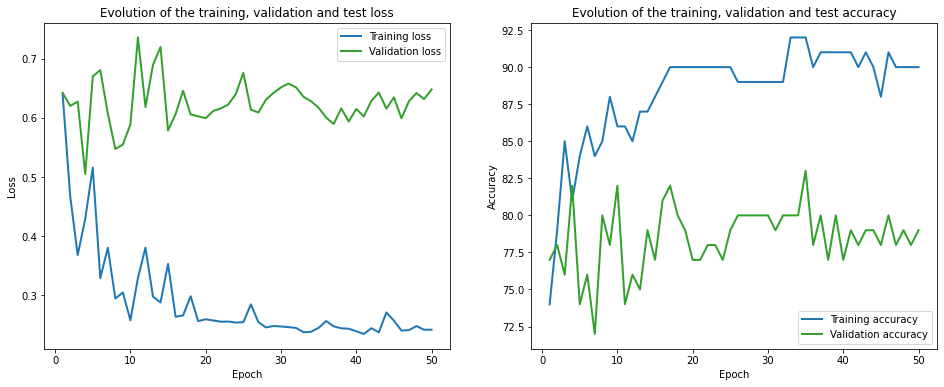

Standard benchmark index number is 47, false positive rate is 0.135246


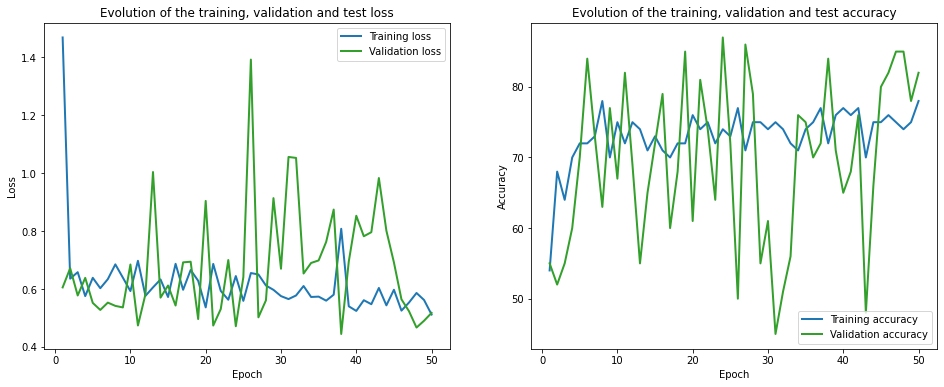

Standard benchmark index number is 48, false positive rate is 0.163934


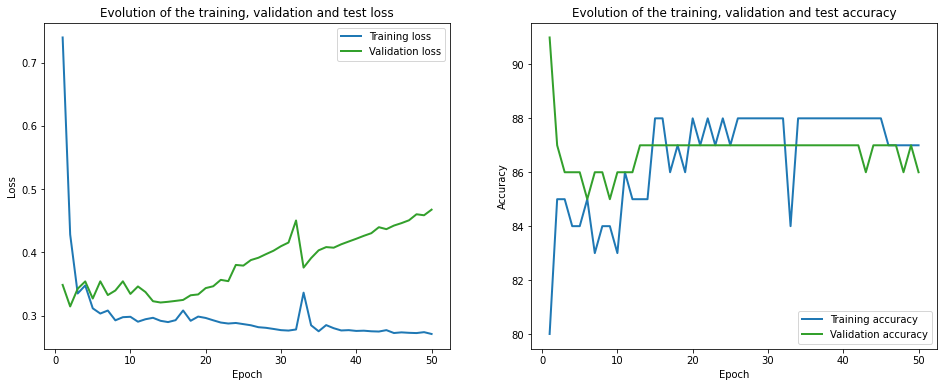

Standard benchmark index number is 49, false positive rate is 0.094262


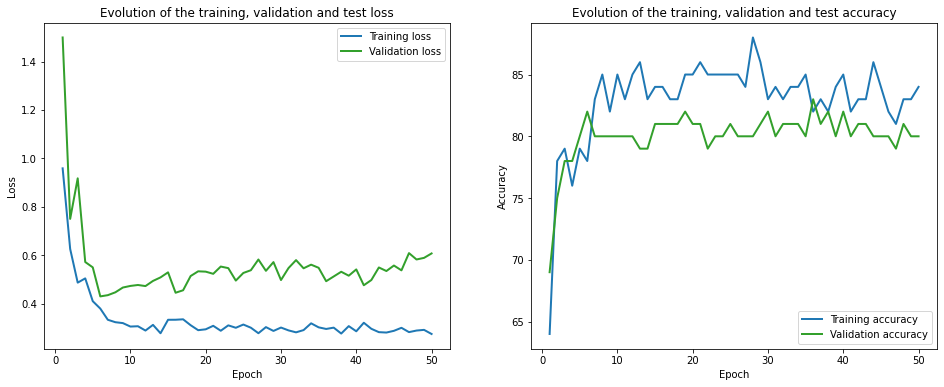

In [15]:
for i in range(len(sb_results)):
    print('Standard benchmark index number is {:d}, false positive rate is {:4f}'.format(i,sb_results.iloc[i]["Fixed-FPR"]))
    plot_loss_acc(sb_results.iloc[i].train_loss_history, sb_results.iloc[i].val_loss_history, 
                      sb_results.iloc[i].train_acc_history, sb_results.iloc[i].val_acc_history)

Naive benchmark index number is 0, false positive rate is 0.086066


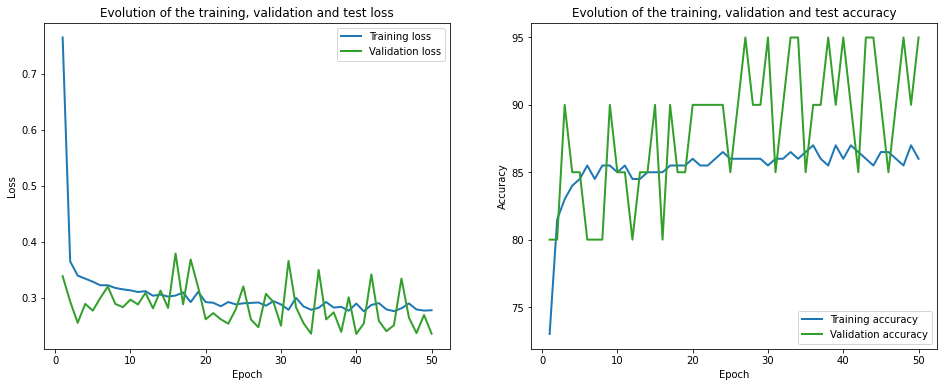

Naive benchmark index number is 1, false positive rate is 0.163934


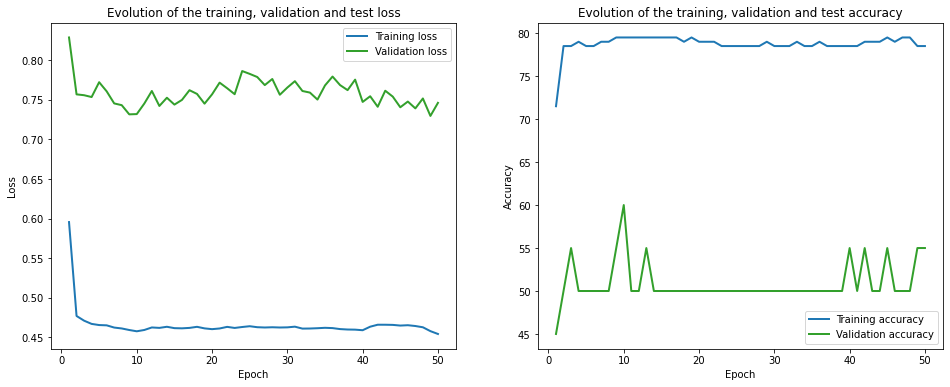

Naive benchmark index number is 2, false positive rate is 0.040984


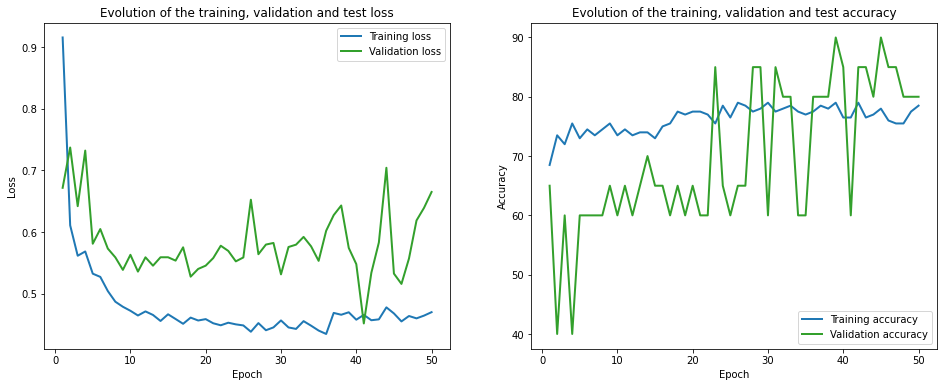

Naive benchmark index number is 3, false positive rate is 0.098361


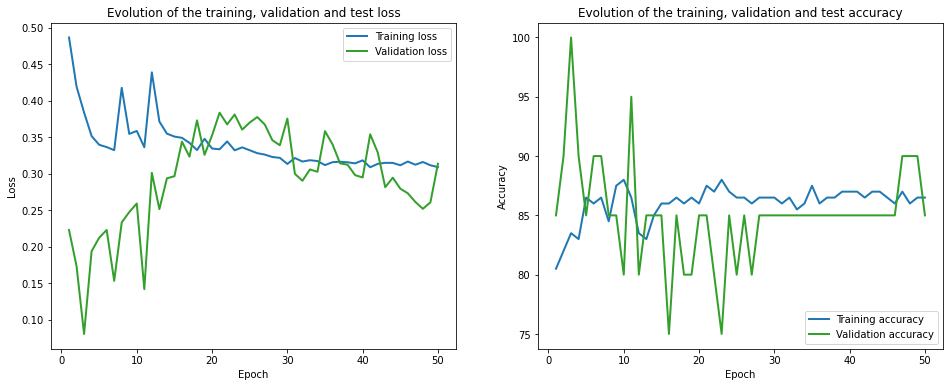

Naive benchmark index number is 4, false positive rate is 0.110656


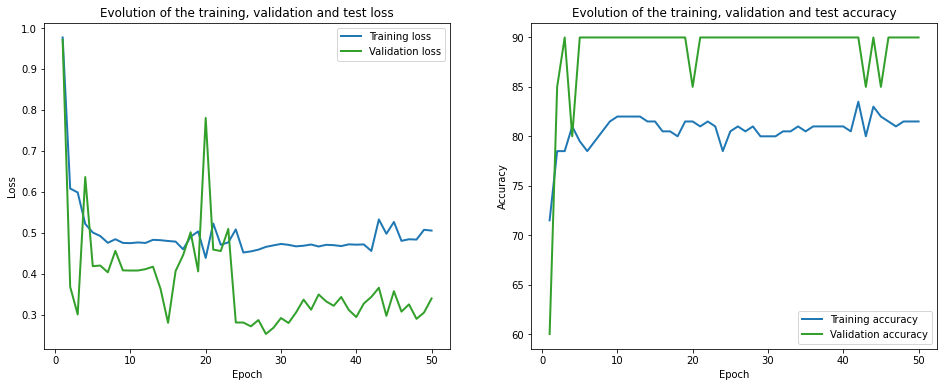

Naive benchmark index number is 5, false positive rate is 0.172131


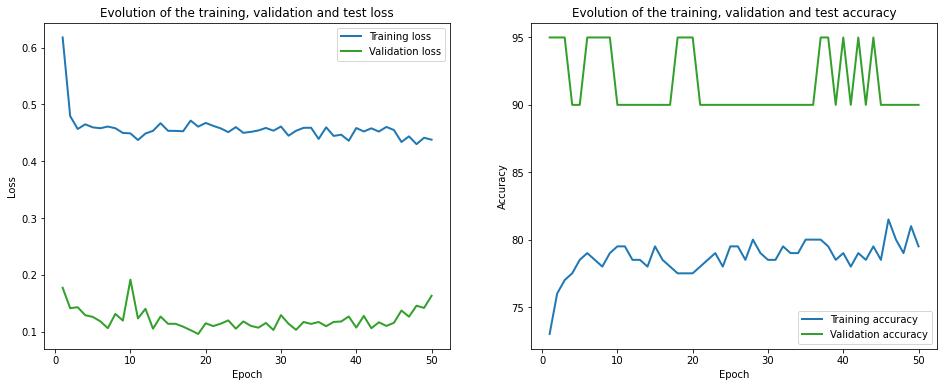

Naive benchmark index number is 6, false positive rate is 0.069672


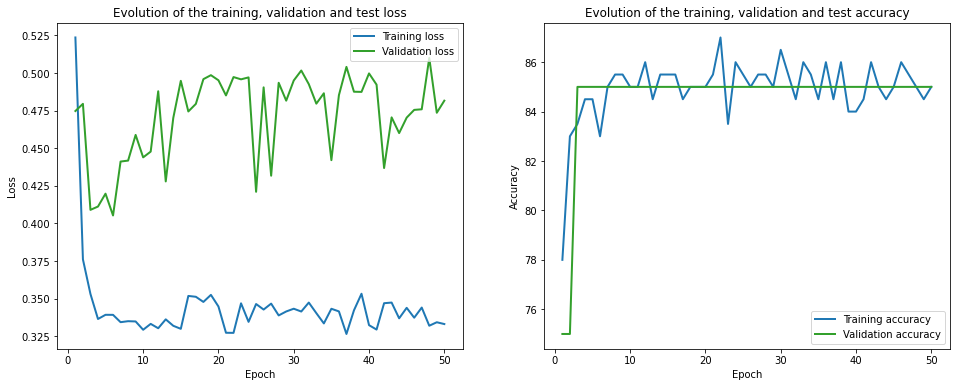

Naive benchmark index number is 7, false positive rate is 0.069672


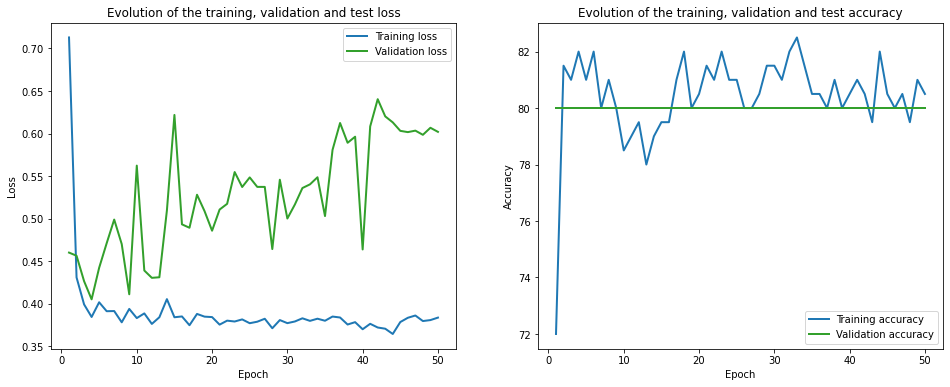

Naive benchmark index number is 8, false positive rate is 0.040984


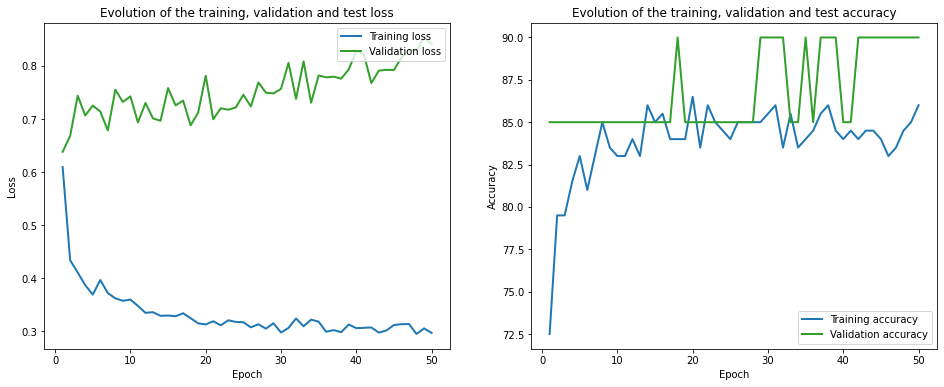

Naive benchmark index number is 9, false positive rate is 0.159836


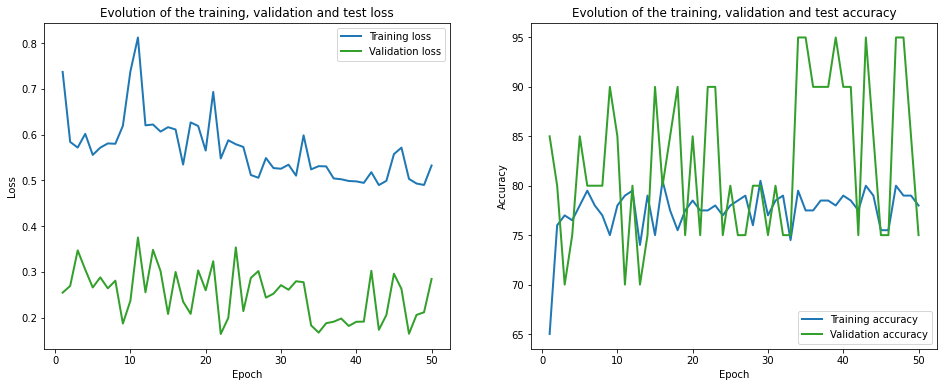

Naive benchmark index number is 10, false positive rate is 0.114754


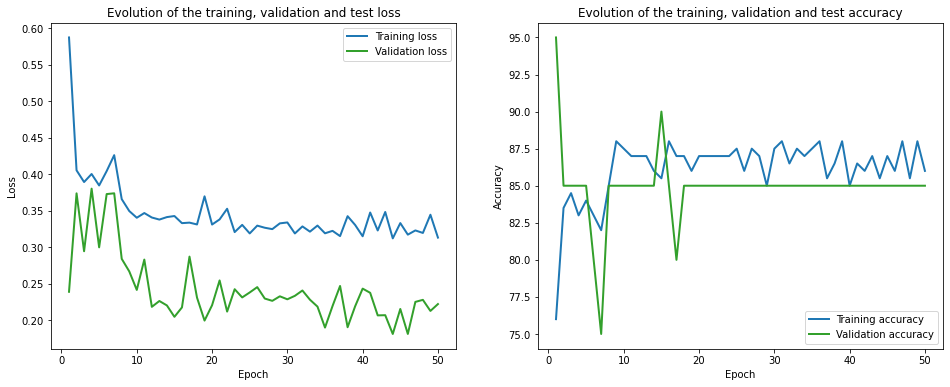

Naive benchmark index number is 11, false positive rate is 0.106557


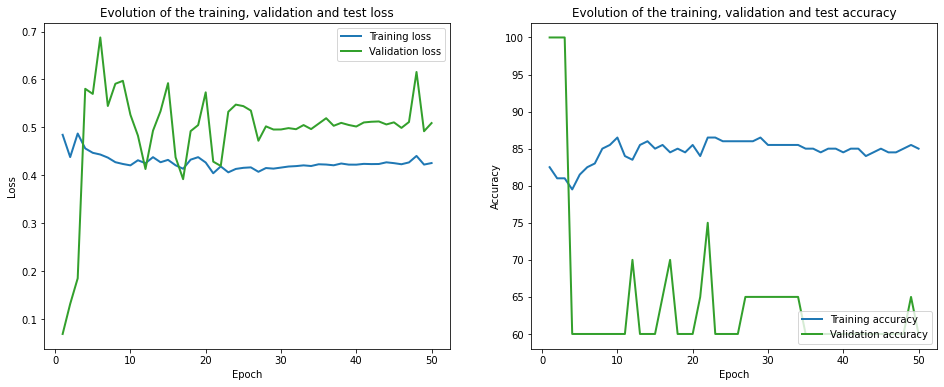

Naive benchmark index number is 12, false positive rate is 0.057377


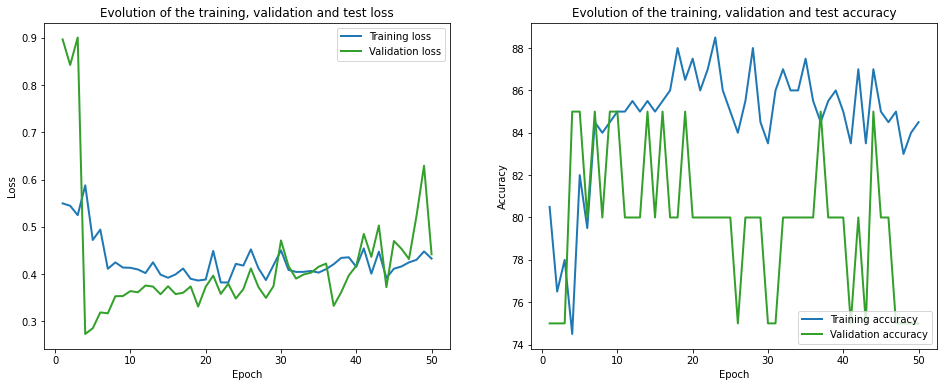

Naive benchmark index number is 13, false positive rate is 0.032787


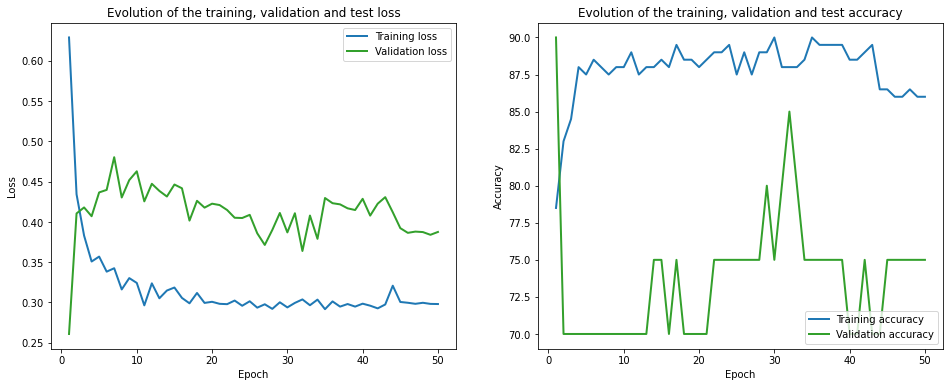

Naive benchmark index number is 14, false positive rate is 0.090164


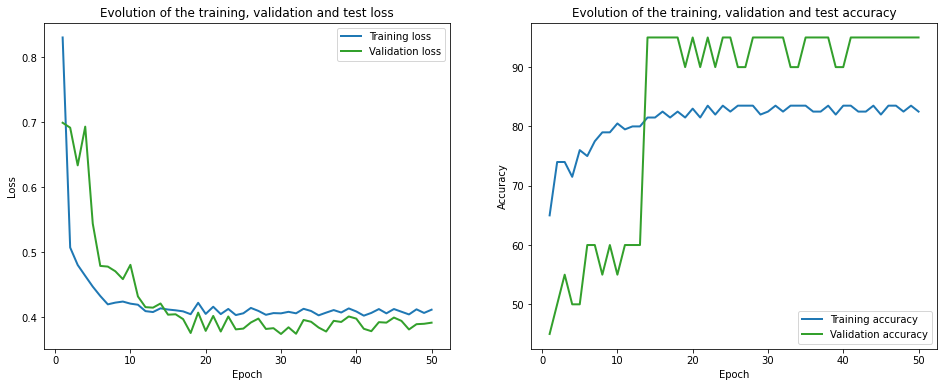

Naive benchmark index number is 15, false positive rate is 0.135246


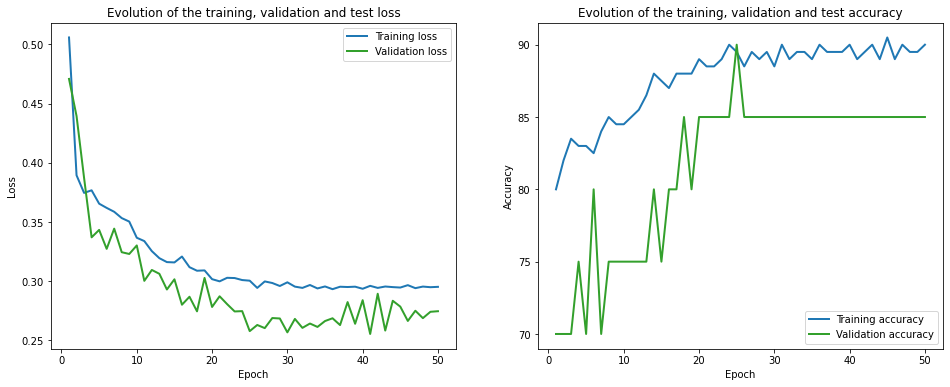

Naive benchmark index number is 16, false positive rate is 0.188525


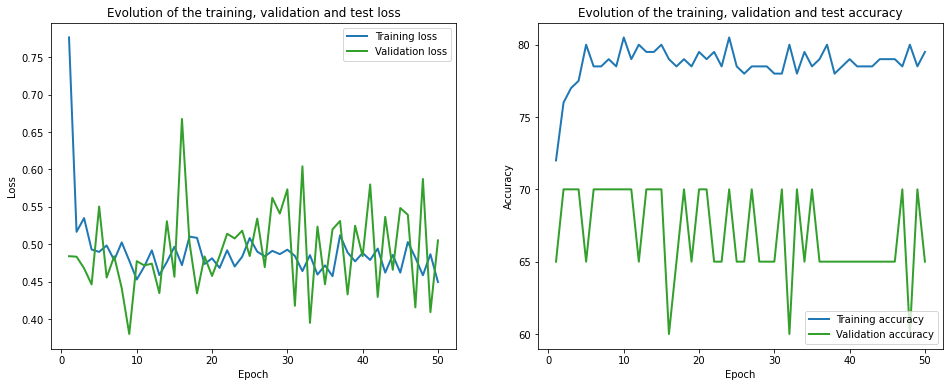

Naive benchmark index number is 17, false positive rate is 0.200820


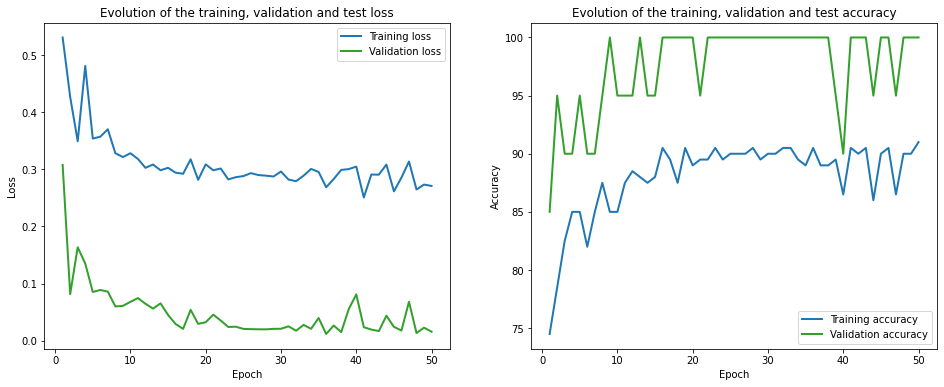

Naive benchmark index number is 18, false positive rate is 0.393443


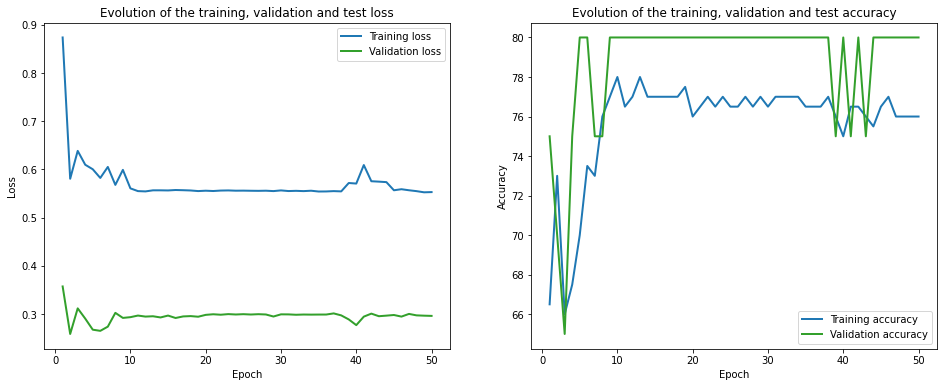

Naive benchmark index number is 19, false positive rate is 0.139344


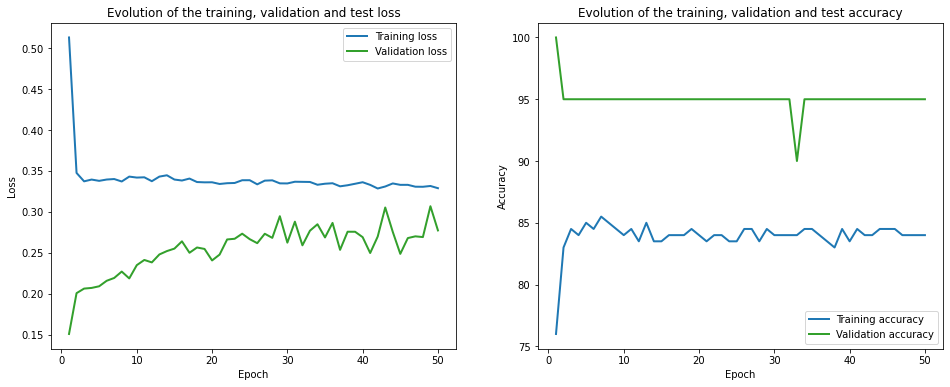

Naive benchmark index number is 20, false positive rate is 0.114754


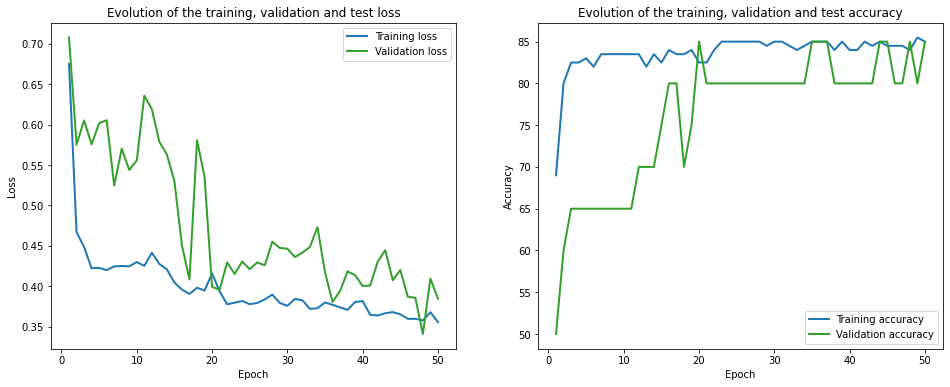

Naive benchmark index number is 21, false positive rate is 0.069672


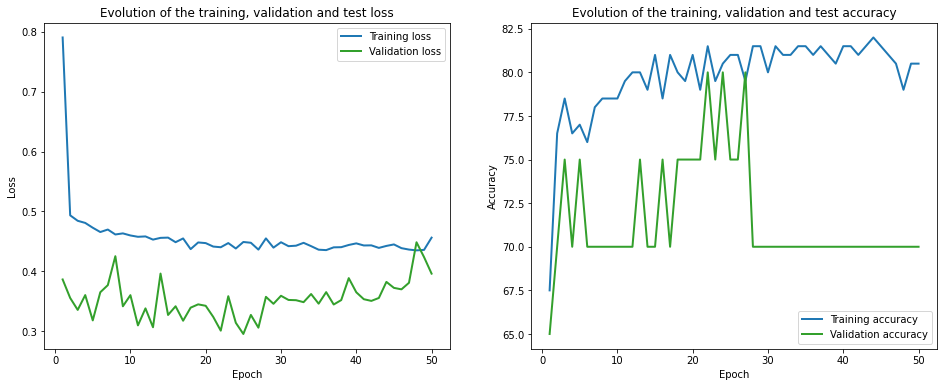

Naive benchmark index number is 22, false positive rate is 0.032787


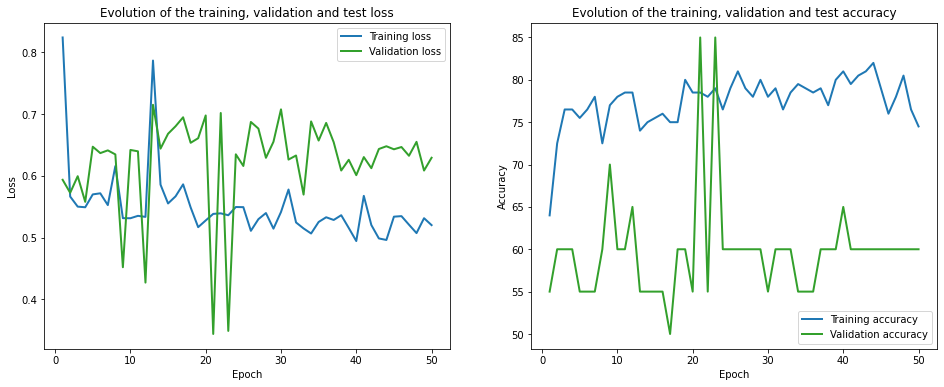

Naive benchmark index number is 23, false positive rate is 0.135246


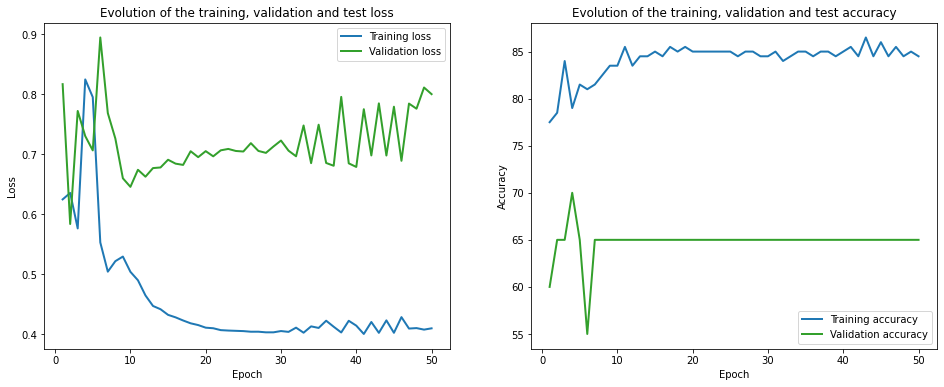

Naive benchmark index number is 24, false positive rate is 0.176230


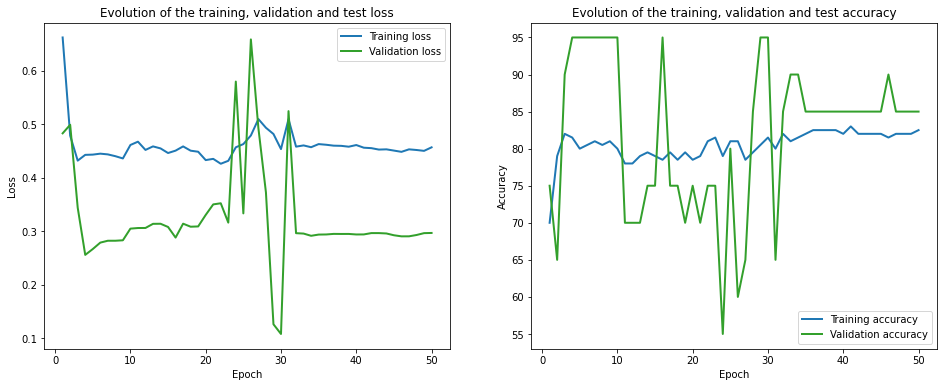

Naive benchmark index number is 25, false positive rate is 0.065574


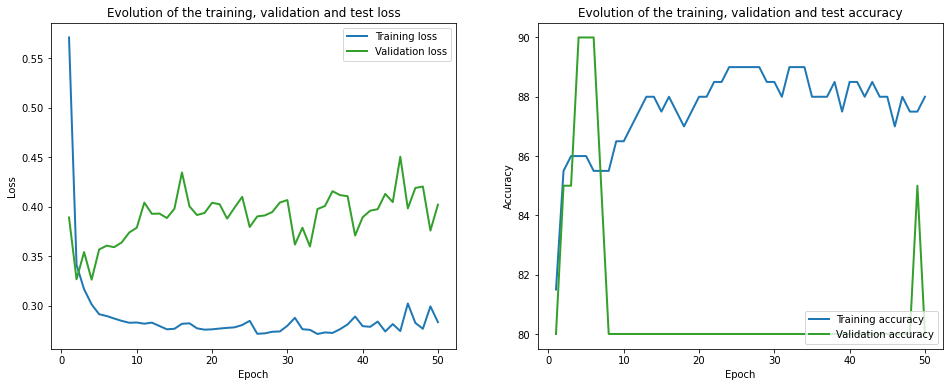

Naive benchmark index number is 26, false positive rate is 0.118852


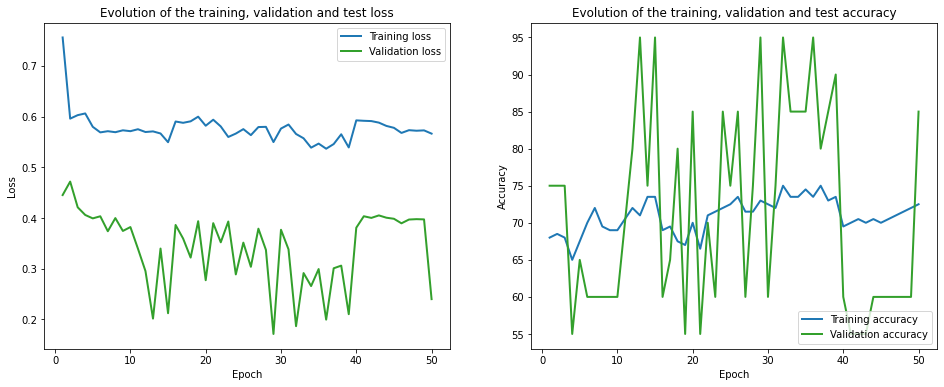

Naive benchmark index number is 27, false positive rate is 0.098361


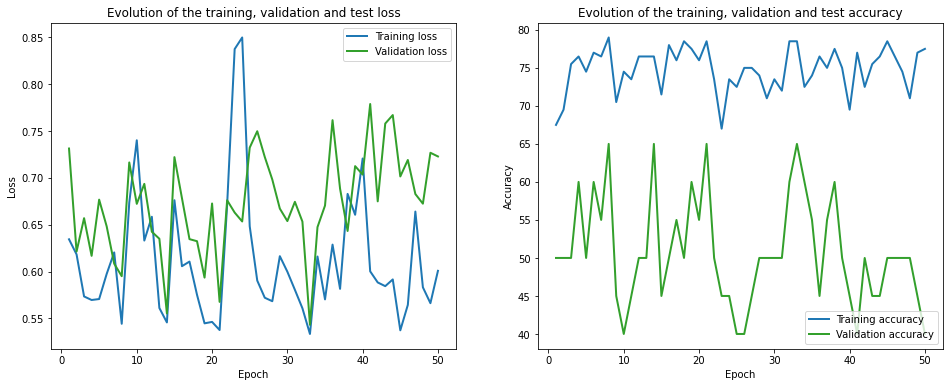

Naive benchmark index number is 28, false positive rate is 0.086066


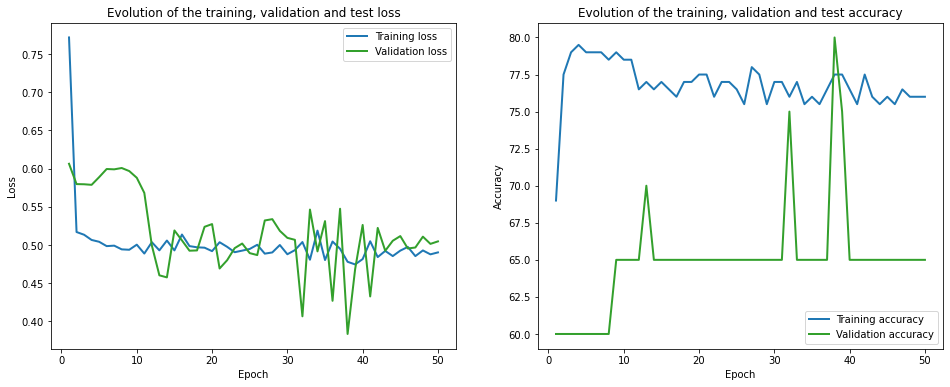

Naive benchmark index number is 29, false positive rate is 0.118852


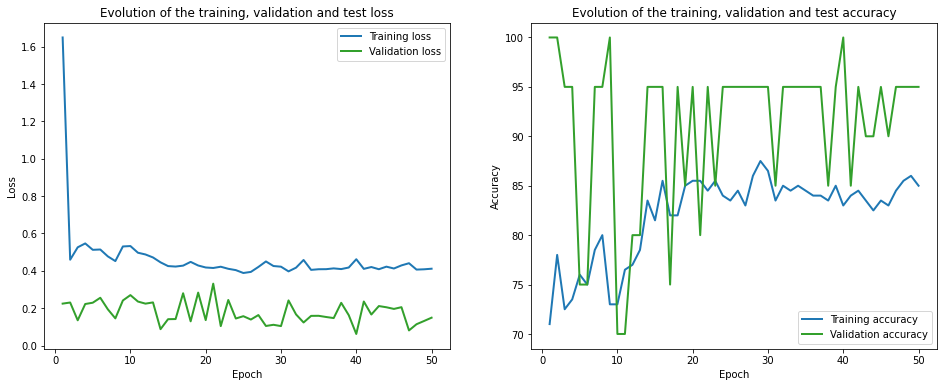

Naive benchmark index number is 30, false positive rate is 0.024590


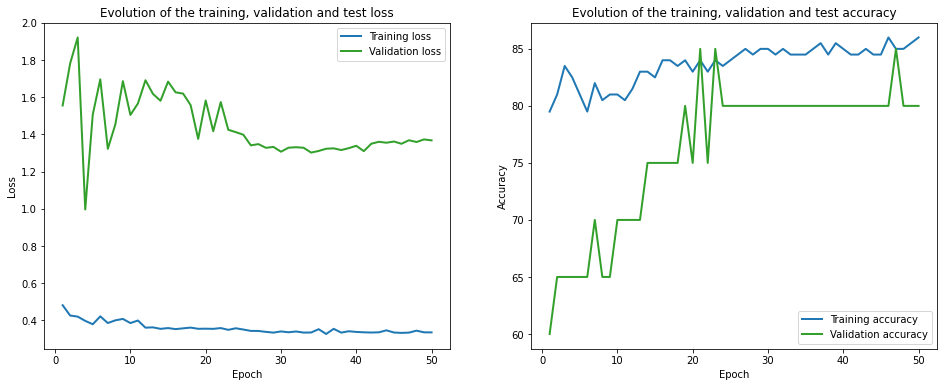

Naive benchmark index number is 31, false positive rate is 0.069672


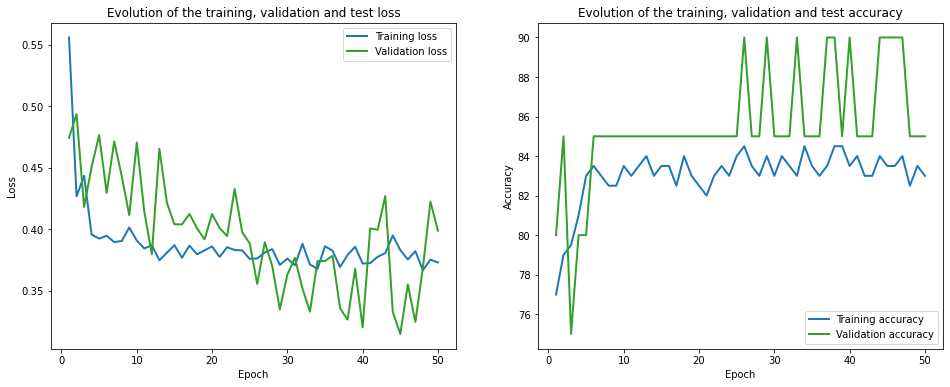

Naive benchmark index number is 32, false positive rate is 0.311475


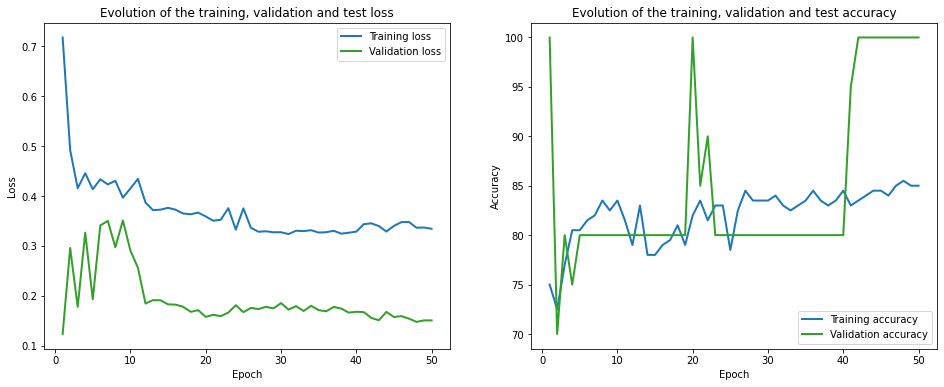

Naive benchmark index number is 33, false positive rate is 0.106557


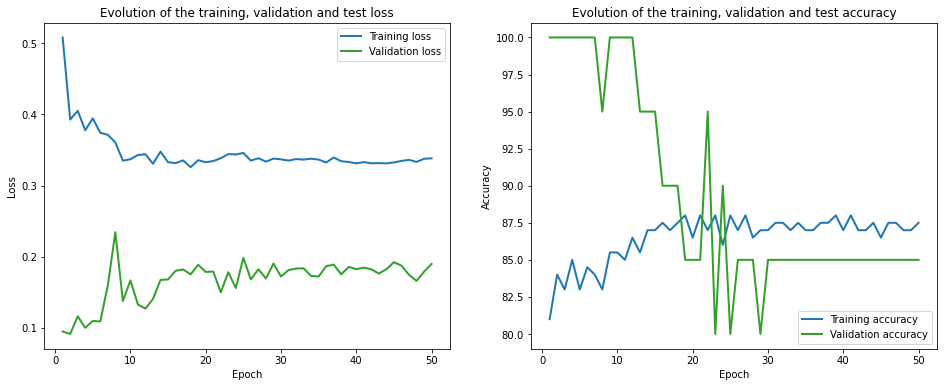

Naive benchmark index number is 34, false positive rate is 0.077869


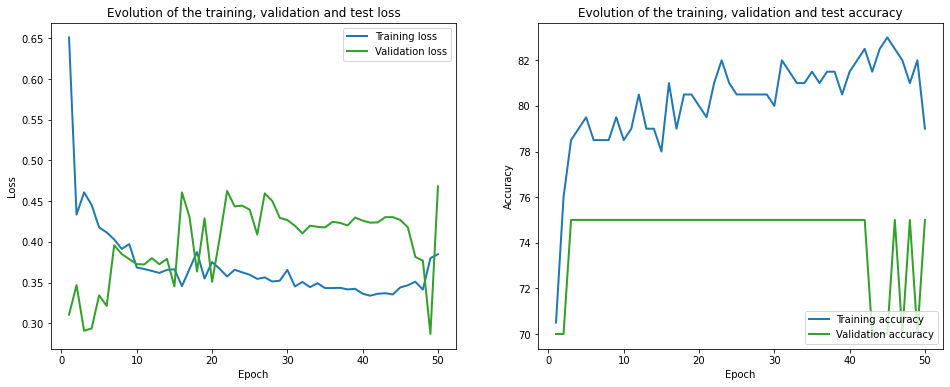

Naive benchmark index number is 35, false positive rate is 0.127049


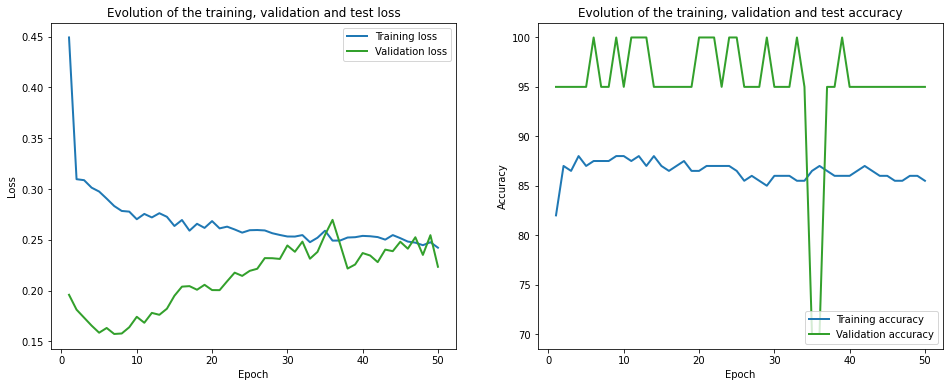

Naive benchmark index number is 36, false positive rate is 0.090164


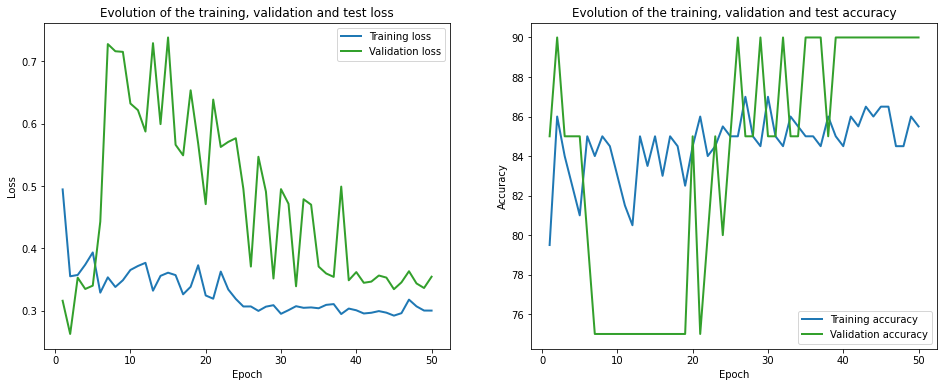

Naive benchmark index number is 37, false positive rate is 0.135246


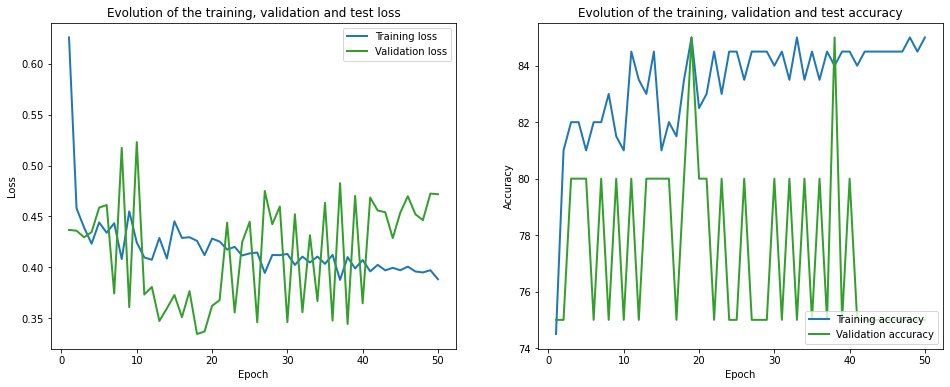

Naive benchmark index number is 38, false positive rate is 0.127049


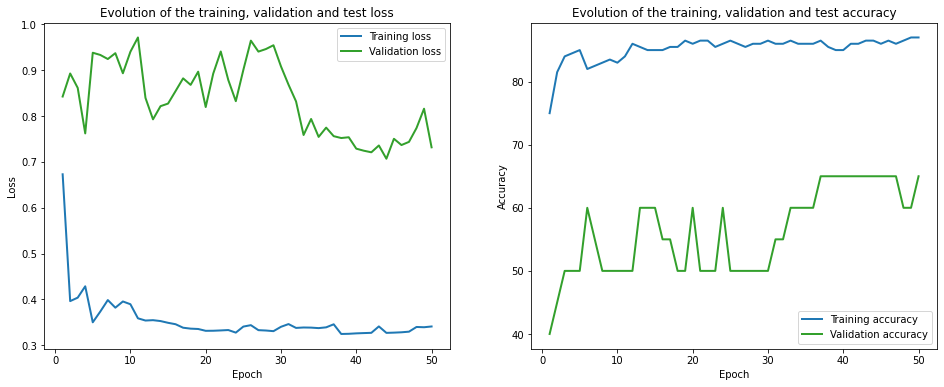

Naive benchmark index number is 39, false positive rate is 0.069672


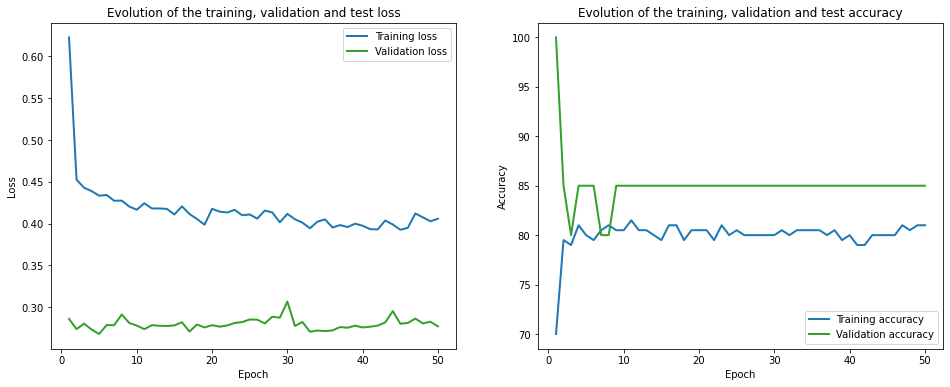

Naive benchmark index number is 40, false positive rate is 0.086066


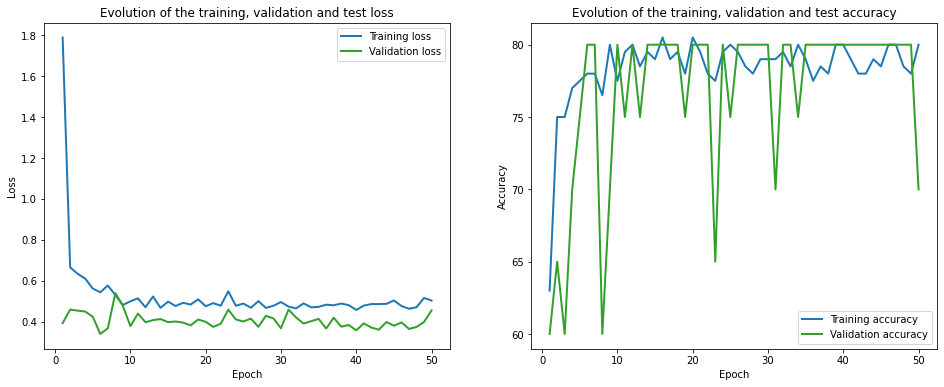

Naive benchmark index number is 41, false positive rate is 0.098361


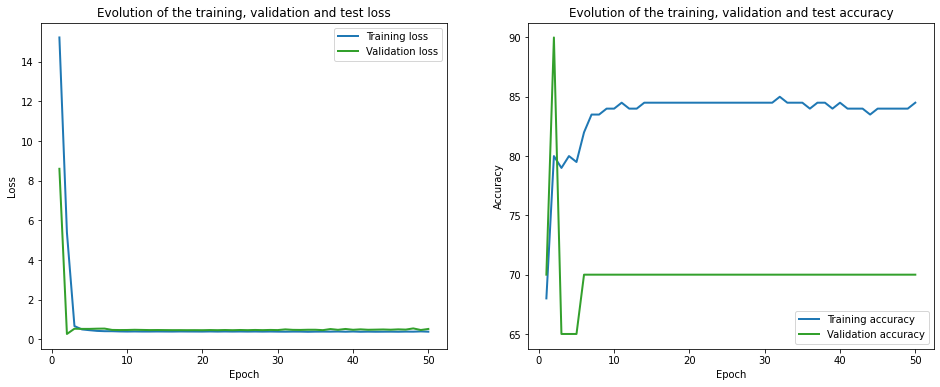

Naive benchmark index number is 42, false positive rate is 0.204918


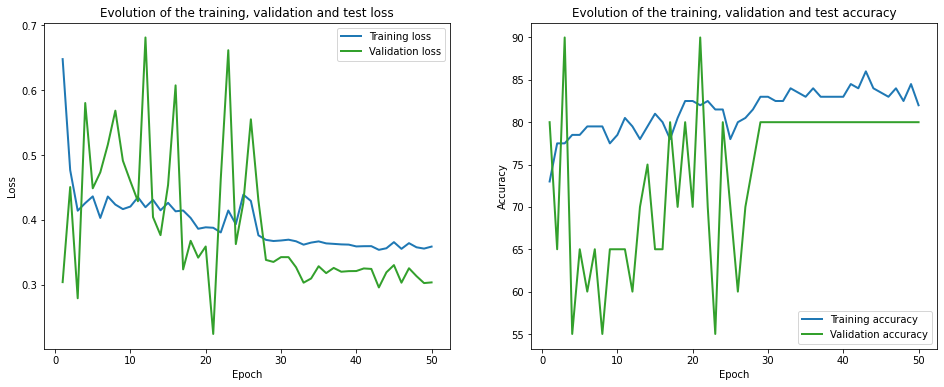

Naive benchmark index number is 43, false positive rate is 0.077869


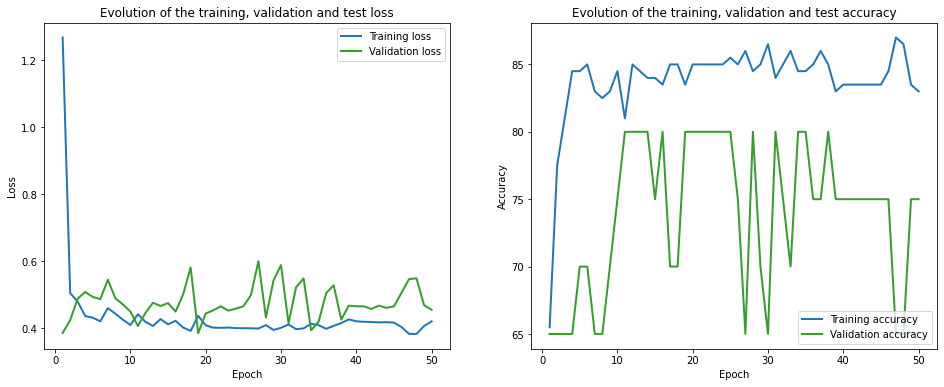

Naive benchmark index number is 44, false positive rate is 0.008197


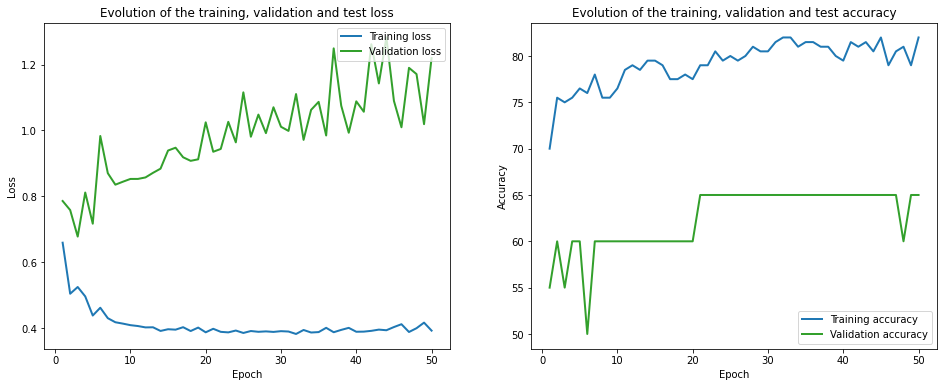

Naive benchmark index number is 45, false positive rate is 0.081967


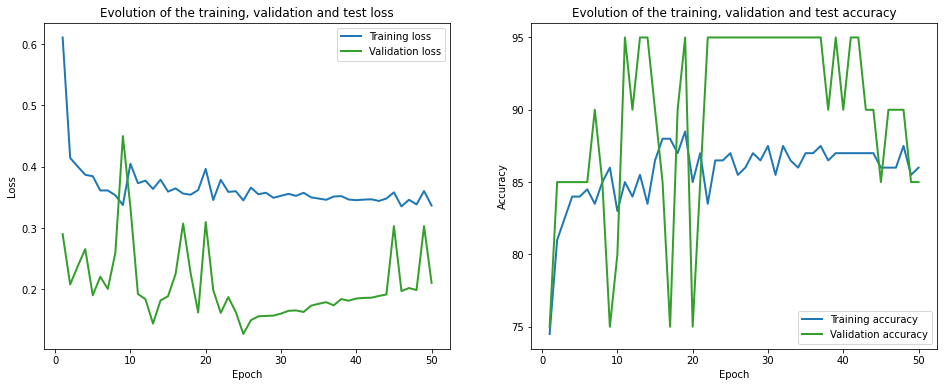

Naive benchmark index number is 46, false positive rate is 0.143443


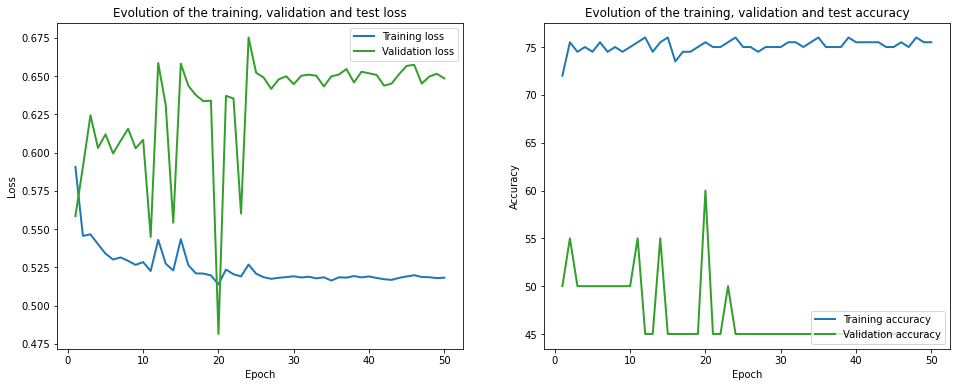

Naive benchmark index number is 47, false positive rate is 0.069672


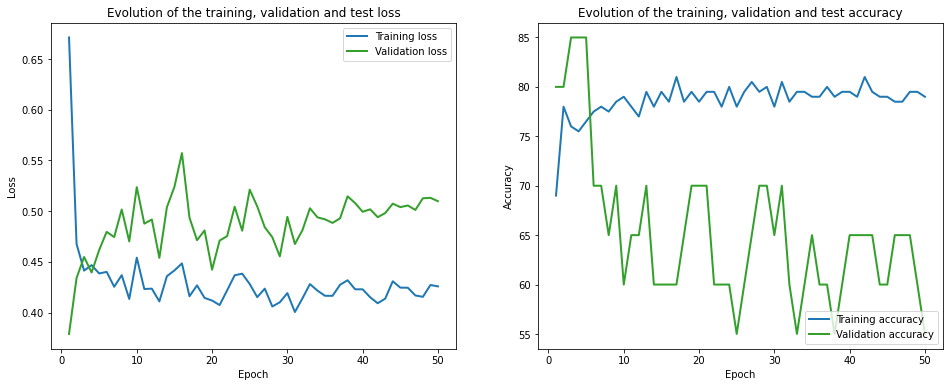

Naive benchmark index number is 48, false positive rate is 0.196721


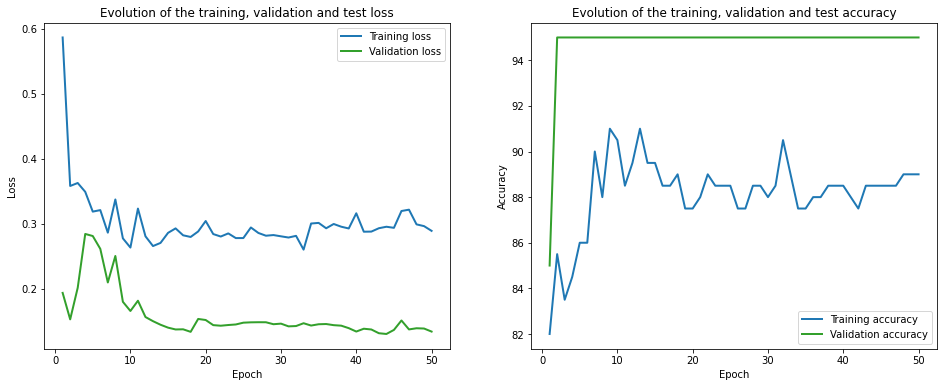

Naive benchmark index number is 49, false positive rate is 0.073770


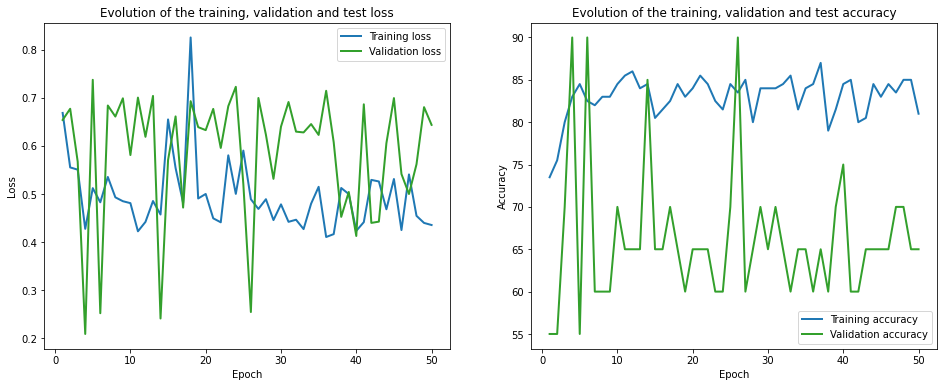

In [16]:
for i in range(len(nb_results)):
    print('Naive benchmark index number is {:d}, false positive rate is {:4f}'.format(i,nb_results.iloc[i]["Fixed-FPR"]))
    plot_loss_acc(nb_results.iloc[i].train_loss_history, nb_results.iloc[i].val_loss_history, 
                      nb_results.iloc[i].train_acc_history, nb_results.iloc[i].val_acc_history)